# First try with NMF output

In [26]:
import pandas as pd
from sklearn.mixture import GaussianMixture
import numpy as np
import os
cd=os.getcwd()
os.environ["OMP_NUM_THREADS"] = "1"
nmf_file = os.path.join(cd,r".\data\NMF_outputs\NMF_outputs_T1.csv")
nmf_data = pd.read_csv(nmf_file, sep=';')
nmf_data = nmf_data.drop(columns=["Unnamed: 0"])
print(nmf_data.head())


      motor  attention  executive   sensory  language   neglect  Labels  \
0  0.005281   0.031476   0.275039  0.000000  0.479126  0.077580       0   
1  0.051270   0.000000   0.337788  0.000000  0.301764  0.046970       0   
2  0.036078   0.172249   0.396082  0.000000  0.516866  0.015407       0   
3  0.017006   0.090199   0.430193  0.070678  0.548859  0.186927       0   
4  0.020589   0.288018   0.347092  0.000000  0.458314  0.112118       0   

   Labels_bis  
0           1  
1           1  
2           1  
3           1  
4           1  


In [27]:
motor_scores = nmf_data["motor"].values.reshape(-1, 1) 
gmm = GaussianMixture(n_components=2, random_state=42) # 2 clusters
gmm.fit(motor_scores)
clusters = gmm.predict(motor_scores)
nmf_data["motor_cluster"] = clusters
print(nmf_data.head())

      motor  attention  executive   sensory  language   neglect  Labels  \
0  0.005281   0.031476   0.275039  0.000000  0.479126  0.077580       0   
1  0.051270   0.000000   0.337788  0.000000  0.301764  0.046970       0   
2  0.036078   0.172249   0.396082  0.000000  0.516866  0.015407       0   
3  0.017006   0.090199   0.430193  0.070678  0.548859  0.186927       0   
4  0.020589   0.288018   0.347092  0.000000  0.458314  0.112118       0   

   Labels_bis  motor_cluster  
0           1              0  
1           1              0  
2           1              0  
3           1              0  
4           1              0  


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


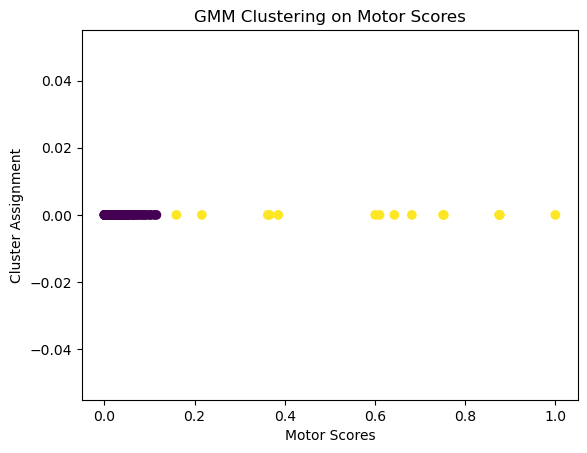

In [28]:
import matplotlib.pyplot as plt

plt.scatter(motor_scores, [0] * len(motor_scores), c=clusters, cmap="viridis")
plt.xlabel("Motor Scores")
plt.ylabel("Cluster Assignment")
plt.title("GMM Clustering on Motor Scores")
plt.show()


In [29]:
print("AIC:", gmm.aic(motor_scores))
print("BIC:", gmm.bic(motor_scores))


AIC: -139.7748371897372
BIC: -128.25451172371635


# Second try with 4 features of motor tests

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

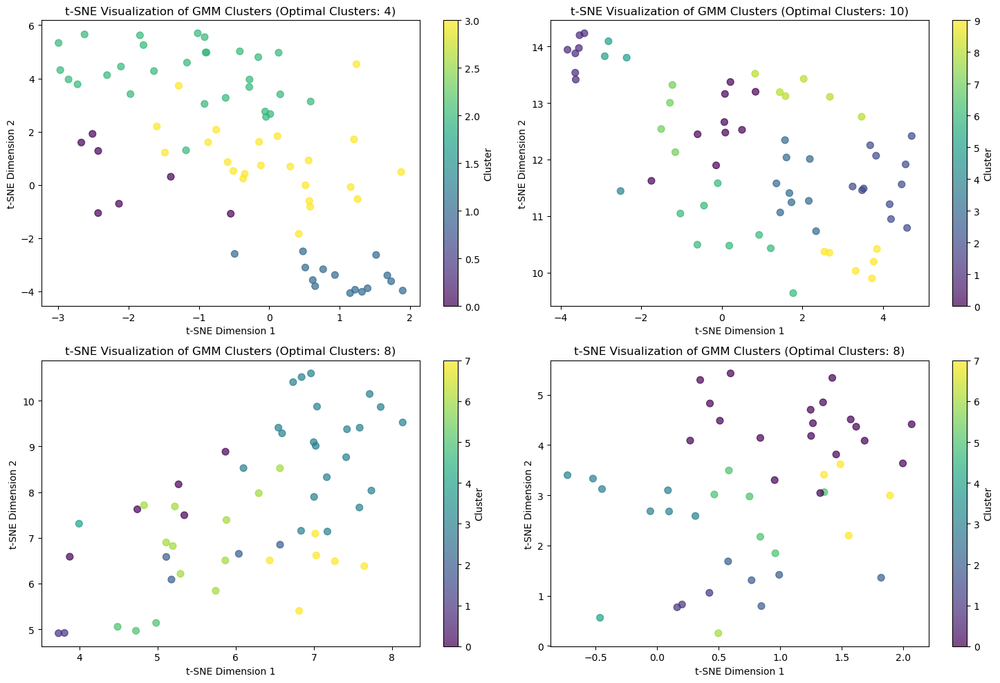

In [13]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
file_paths = [
    os.path.join(cd,r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT1.xlsx"),
    os.path.join(cd,r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT2.xlsx"),
    os.path.join(cd,r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT3.xlsx"),
    os.path.join(cd,r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT4.xlsx")
]

plot_titles = [
    "T1",
    "T2",
    "T3",
    "T4"
]

motor_tests = [
    "Fugl.Meyer_affected_TOTAL",
    "P.G_affected_FIST_mean",
    "B.B_blocks_affected_hand",
    "Purdue_affected_hand",
    "BERG",
    "Ashworth_affected",
    "Purdue_both_hands",
]



plt.figure(figsize=(15, 10))
for idx, (file_path, title_suffix) in enumerate(zip(file_paths, plot_titles), start=1):
    data = pd.read_excel(file_path)
     
    # Filter the motor tests
    data_motor_tests = data[motor_tests]
    #print(data_motor_tests.columns)
    #for col in data_motor_tests.columns:
    #    print(f" The correlation between {col} and the rest {data_motor_tests.corr()[col]}")
    # Data standarizazion
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data_motor_tests)

    # To find the optimal nb of clusters
    bic_scores = []
    n_clusters_range = range(1, 11)
    for n in n_clusters_range:
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm.fit(data_scaled)
        bic_scores.append(gmm.bic(data_scaled))

    optimal_clusters = n_clusters_range[bic_scores.index(min(bic_scores))]

    # GMM for optimal number of clusters
    gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)
    gmm.fit(data_scaled)

    data_motor_tests.loc[:, "Cluster"] = gmm.predict(data_scaled)


    # PCA reduction to 2 dimensions
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
    data_tsne = tsne.fit_transform(data_scaled)
    plt.subplot(2, 2, idx)
    scatter = plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=data_motor_tests["Cluster"], cmap="viridis", s=50, alpha=0.7)
    plt.title(f"t-SNE Visualization of GMM Clusters (Optimal Clusters: {optimal_clusters})")
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.colorbar(scatter, label="Cluster")



plt.tight_layout()
plt.show()


# *EVOLUTION RATE*

In [ ]:
data_T1=pd.read_excel(file_paths[0])
data_T4=pd.read_excel(file_paths[3])

data_T1_=data_T1.copy()
data_T4_=data_T4.copy()

data_T1_=data_T1_[data_T1_["Patient"].isin(data_T4["Patient"])].reset_index()
data_T4_=data_T4_[data_T4_["Patient"].isin(data_T1_["Patient"])].reset_index()

In [ ]:
temp={}
for test in motor_tests:  
    results=(data_T1_[test].apply(lambda x:  x if x!=0 else np.median(data_T1_[test]))-
            data_T4_[test])/data_T1_[test].apply(lambda x:  x if x!=0 else np.mean(data_T1_[test]))
    temp[test]=results
data=pd.DataFrame(temp)
data.head(5)


,Fugl.Meyer_affected_TOTAL,P.G_affected_FIST_mean,B.B_blocks_affected_hand,Purdue_affected_hand,BERG,Ashworth_affected,Purdue_both_hands
0,-0.017241,-0.102941,-0.083333,-0.100000,0.000000,1.000000,-0.222222
1,0.000000,-0.422222,-0.179487,-1.400000,0.038462,0.442395,-0.249394
2,0.016667,-0.156863,-0.117647,0.000000,-0.076923,1.000000,-0.142857
3,0.425532,0.132075,0.000000,0.412754,0.025000,0.000000,0.174929
4,0.018519,0.367089,-0.250000,0.400000,0.020833,0.916667,0.333333


# *STANDARDIZATION AND GMM*

In [ ]:

# Filter the motor tests
data_motor_tests = data[motor_tests].copy()

# Data standarizazion
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_motor_tests)

# To find the optimal nb of clusters
bic_scores = []
n_clusters_range = range(1, 11)
for n in n_clusters_range:
    gmm = GaussianMixture(n_components=n, random_state=42)
    gmm.fit(data_scaled)
    bic_scores.append(gmm.bic(data_scaled))

optimal_clusters = n_clusters_range[bic_scores.index(min(bic_scores))]

# GMM for optimal number of clusters
gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)
gmm.fit(data_scaled)

data_motor_tests.loc[:, "Cluster"] = gmm.predict(data_scaled)

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

# *VISUALIZATION*

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


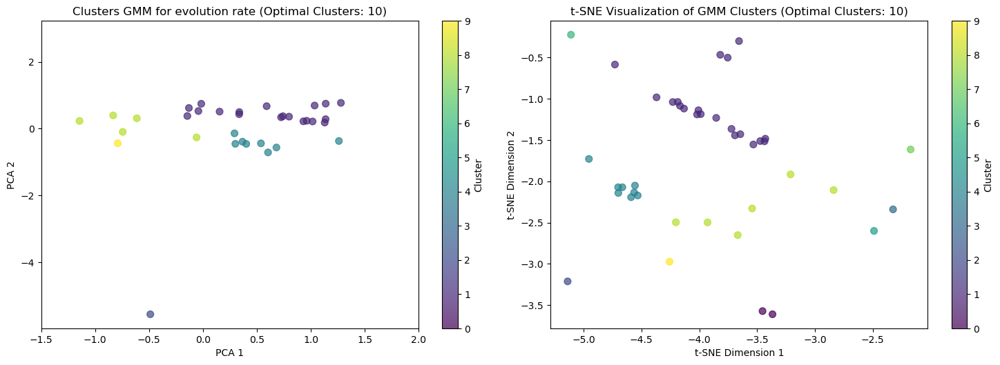

In [ ]:
from sklearn.manifold import TSNE
plt.figure(figsize=(15, 10))
for idx in range(1,3):
    if idx==1:
        pca = PCA(n_components=2)
        data_pca = pca.fit_transform(data_scaled)   
        plt.subplot(2, 2, idx)
        plt.scatter(data_pca[:, 0], data_pca[:, 1], c=data_motor_tests["Cluster"], cmap="viridis", s=50, alpha=0.7)
        plt.title(f"Clusters GMM for evolution rate (Optimal Clusters: {optimal_clusters})")
        plt.xlabel("PCA 1")
        plt.ylabel("PCA 2")
        plt.colorbar(label="Cluster")
        plt.xlim([-6, 3])
        plt.xlim([-1.5, 2])
    else:
        tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
        data_tsne = tsne.fit_transform(data_scaled)
        plt.subplot(2, 2, idx)
        scatter = plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=data_motor_tests["Cluster"], cmap="viridis", s=50, alpha=0.7)
        plt.title(f"t-SNE Visualization of GMM Clusters (Optimal Clusters: {optimal_clusters})")
        plt.xlabel("t-SNE Dimension 1")
        plt.ylabel("t-SNE Dimension 2")
        plt.colorbar(scatter, label="Cluster")

plt.tight_layout()
plt.show()

# Dans cette partie j'essaye de voir si en concaténant horizontalement les vecteurs de chaque patient, j'obtiens des résultats, pour les 

In [ ]:
T1=pd.read_excel(file_paths[0])
T2=pd.read_excel(file_paths[1])
T3=pd.read_excel(file_paths[2])
T4=pd.read_excel(file_paths[3])
T1=T1[motor_tests]
T2=T2[motor_tests]
T3=T3[motor_tests]
T4=T4[motor_tests]
merged = T1.join(T2, how='outer', lsuffix='_T1', rsuffix='_T2') \
           .join(T3, how='outer', lsuffix='', rsuffix='_T3') \
           .join(T4, how='outer', lsuffix='', rsuffix='_T4')
merged=merged.dropna(axis=0)
merged.head(5)

,Fugl.Meyer_affected_TOTAL_T1,P.G_affected_FIST_mean_T1,B.B_blocks_affected_hand_T1,Purdue_affected_hand_T1,BERG_T1,Ashworth_affected_T1,Purdue_both_hands_T1,Fugl.Meyer_affected_TOTAL_T2,P.G_affected_FIST_mean_T2,B.B_blocks_affected_hand_T2,...,BERG,Ashworth_affected,Purdue_both_hands,Fugl.Meyer_affected_TOTAL_T4,P.G_affected_FIST_mean_T4,B.B_blocks_affected_hand_T4,Purdue_affected_hand_T4,BERG_T4,Ashworth_affected_T4,Purdue_both_hands_T4
0,58.0,45.333333,48.0,10.0,56.0,1.593366,9.00000,58.0,54.333333,53.00000,...,56.0,0.0,10.0,59.0,50.000000,52.0,11.0,56.0,0.0,11.0
1,57.0,15.000000,39.0,5.0,52.0,1.793385,7.20349,58.0,15.666667,55.00000,...,56.0,0.0,11.0,57.0,21.333333,46.0,12.0,50.0,1.0,9.0
2,60.0,34.000000,51.0,11.0,52.0,2.074027,7.00000,60.0,41.000000,55.00000,...,50.0,8.0,6.0,59.0,39.333333,57.0,11.0,56.0,0.0,8.0
3,47.0,17.666667,36.0,0.0,40.0,0.000000,0.00000,42.0,31.333333,24.86198,...,55.0,0.0,4.0,27.0,15.333333,36.0,4.0,39.0,0.0,5.0
4,59.0,36.333333,42.0,9.0,55.0,6.000000,8.00000,59.0,36.000000,42.00000,...,53.0,0.0,6.0,53.0,16.666667,45.0,3.0,47.0,3.0,2.0


# Without log

In [ ]:
# Data standarizazion
scaler = StandardScaler()
data_scaled = scaler.fit_transform(merged)


# To find the optimal nb of clusters
bic_scores = []
n_clusters_range = range(1, 11)
for n in n_clusters_range:
    gmm = GaussianMixture(n_components=n, random_state=42)
    gmm.fit(data_scaled)
    bic_scores.append(gmm.bic(data_scaled))

optimal_clusters = n_clusters_range[bic_scores.index(min(bic_scores))]

# GMM for optimal number of clusters
gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)
gmm.fit(data_scaled)

merged.loc[:, "Cluster"] = gmm.predict(data_scaled)

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


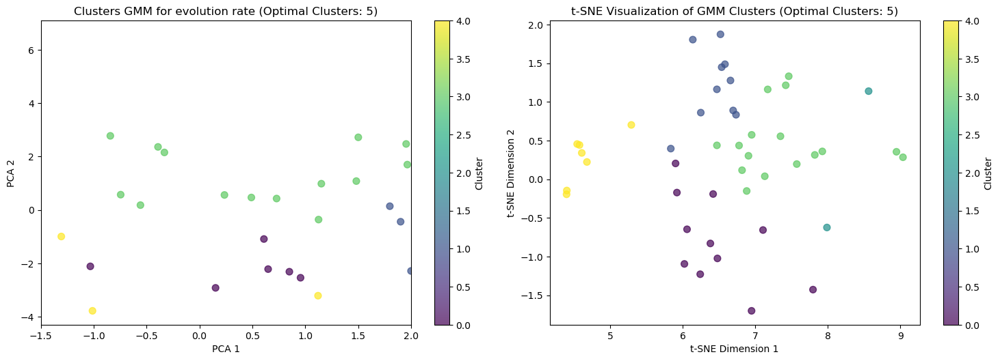

In [ ]:
plt.figure(figsize=(15, 10))
for idx in range(1,3):
    if idx==1:
        pca = PCA(n_components=2)
        data_pca = pca.fit_transform(data_scaled)   
        plt.subplot(2, 2, idx)
        plt.scatter(data_pca[:, 0], data_pca[:, 1], c=merged["Cluster"], cmap="viridis", s=50, alpha=0.7)
        plt.title(f"Clusters GMM for evolution rate (Optimal Clusters: {optimal_clusters})")
        plt.xlabel("PCA 1")
        plt.ylabel("PCA 2")
        plt.colorbar(label="Cluster")
        plt.xlim([-6, 3])
        plt.xlim([-1.5, 2])
    else:
        tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
        data_tsne = tsne.fit_transform(data_scaled)
        plt.subplot(2, 2, idx)
        scatter = plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=merged["Cluster"], cmap="viridis", s=50, alpha=0.7)
        plt.title(f"t-SNE Visualization of GMM Clusters (Optimal Clusters: {optimal_clusters})")
        plt.xlabel("t-SNE Dimension 1")
        plt.ylabel("t-SNE Dimension 2")
        plt.colorbar(scatter, label="Cluster")

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

silhouette = silhouette_score(data_scaled, gmm.predict(data_scaled))
print(f"Silhouette Score: {silhouette}")

dbi = davies_bouldin_score(data_scaled, gmm.predict(data_scaled))
print(f"Davies-Bouldin Index: {dbi}")

ch_score = calinski_harabasz_score(data_scaled, gmm.predict(data_scaled))
print(f"Calinski-Harabasz Index: {ch_score}")


Silhouette Score: 0.11532347238355864
Davies-Bouldin Index: 1.5892118444364005
Calinski-Harabasz Index: 7.309725227875232


# With log

Fugl.Meyer_affected_TOTAL_T1
BERG_T1
Ashworth_affected_T1
Fugl.Meyer_affected_TOTAL_T2
BERG_T2
Ashworth_affected_T2
Fugl.Meyer_affected_TOTAL
BERG
Ashworth_affected
Fugl.Meyer_affected_TOTAL_T4
BERG_T4
Ashworth_affected_T4


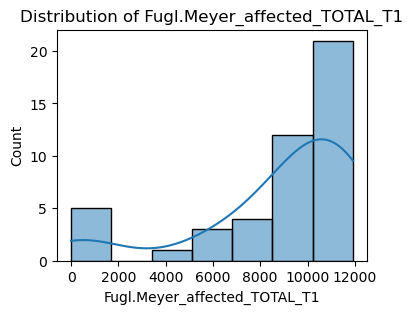

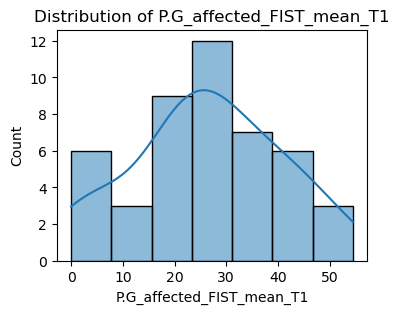

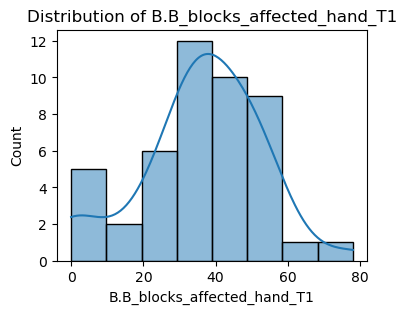

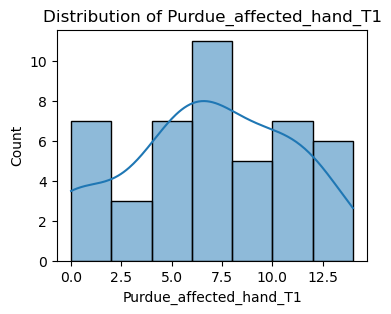

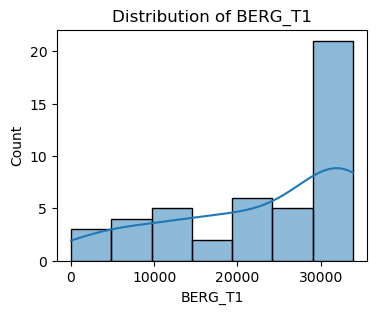

...

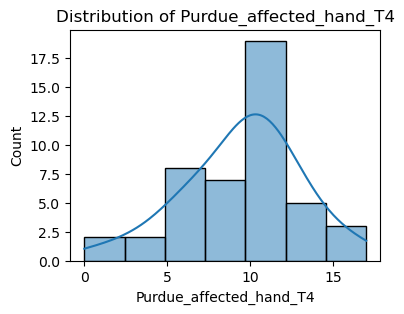

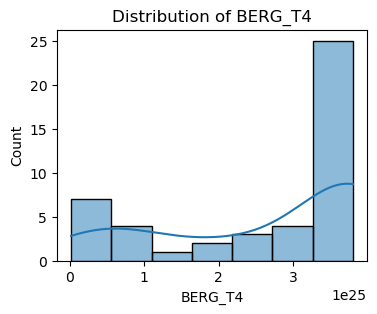

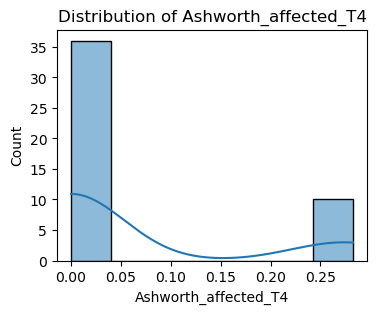

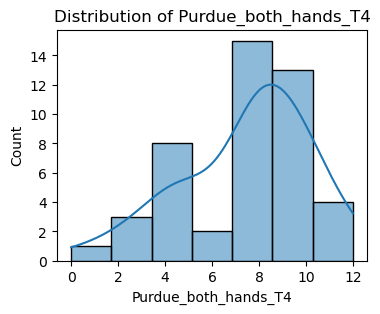

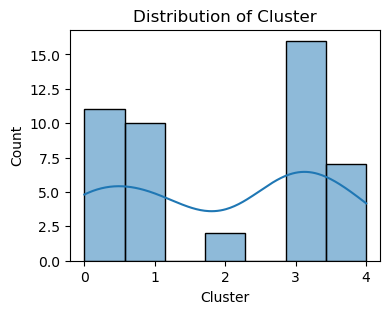

,Fugl.Meyer_affected_TOTAL_T1,P.G_affected_FIST_mean_T1,B.B_blocks_affected_hand_T1,Purdue_affected_hand_T1,BERG_T1,Ashworth_affected_T1,Purdue_both_hands_T1,Fugl.Meyer_affected_TOTAL_T2,P.G_affected_FIST_mean_T2,B.B_blocks_affected_hand_T2,...,Ashworth_affected,Purdue_both_hands,Fugl.Meyer_affected_TOTAL_T4,P.G_affected_FIST_mean_T4,B.B_blocks_affected_hand_T4,Purdue_affected_hand_T4,BERG_T4,Ashworth_affected_T4,Purdue_both_hands_T4,Cluster
0,10966.019152,45.333333,48.0,10.0,33862.496908,0.705538,9.00000,1375.610705,54.333333,53.00000,...,0.000000,10.0,8.921607e+14,50.000000,52.0,11.0,3.803486e+25,0.000000,11.0,1
1,10506.007850,15.000000,39.0,5.0,27545.371478,0.743965,7.20349,1375.610705,15.666667,55.00000,...,0.000000,11.0,6.588305e+14,21.333333,46.0,12.0,6.980987e+24,0.258310,9.0,1
2,11921.842745,34.000000,51.0,11.0,27545.371478,0.790757,7.00000,1467.264941,41.000000,55.00000,...,0.730093,6.0,8.921607e+14,39.333333,57.0,11.0,3.803486e+25,0.000000,8.0,3
3,6537.343404,17.666667,36.0,0.0,13294.093811,0.000000,0.00000,745.817299,31.333333,24.86198,...,0.000000,4.0,9.781064e+11,15.333333,36.0,4.0,1.720757e+23,0.000000,5.0,0
4,11437.930185,36.333333,42.0,9.0,32203.688811,1.090642,8.00000,1421.081063,36.000000,42.00000,...,0.000000,6.0,3.477250e+14,16.666667,45.0,3.0,2.770821e+24,0.280547,2.0,3


In [ ]:
import seaborn as sns
from scipy import stats
# Features to log-transform
log_merged=merged.copy()
# Apply log1p transformation to the selected features

    
for column in log_merged.columns:
    if ('Fugl.Meyer_affected_TOTAL' in column or 'Ashworth_affected' in column 
        or 'BERG' in column or 'Ashworth_affected' in column):
        print(column)
        log_merged[column], _ = stats.boxcox(log_merged[column] + 1)

for column in log_merged.columns:
    plt.figure(figsize=(4, 3))
    sns.histplot(log_merged[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.show()
log_merged.head(5)

In [ ]:
# Data standarizazion
scaler = StandardScaler()
data_scaled = scaler.fit_transform(merged)


# To find the optimal nb of clusters
bic_scores = []
n_clusters_range = range(1, 11)
for n in n_clusters_range:
    gmm = GaussianMixture(n_components=n, random_state=42)
    gmm.fit(data_scaled)
    bic_scores.append(gmm.bic(data_scaled))

optimal_clusters = n_clusters_range[bic_scores.index(min(bic_scores))]

# GMM for optimal number of clusters
gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)
gmm.fit(data_scaled)

merged.loc[:, "Cluster"] = gmm.predict(data_scaled)

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


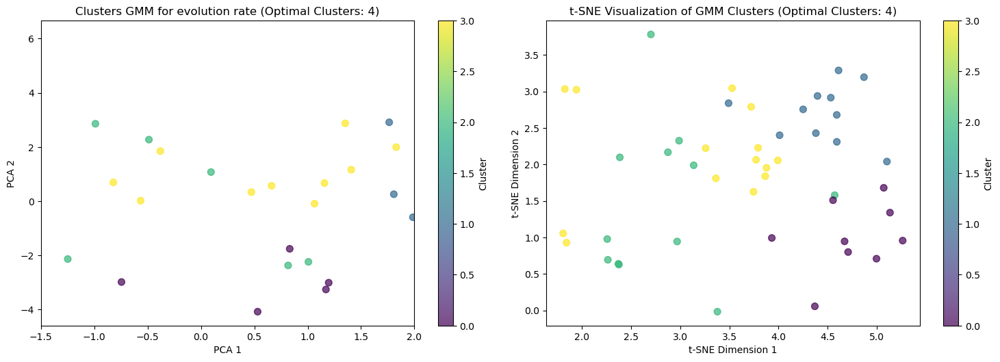

In [ ]:
plt.figure(figsize=(15, 10))
for idx in range(1,3):
    if idx==1:
        pca = PCA(n_components=2)
        data_pca = pca.fit_transform(data_scaled)   
        plt.subplot(2, 2, idx)
        plt.scatter(data_pca[:, 0], data_pca[:, 1], c=merged["Cluster"], cmap="viridis", s=50, alpha=0.7)
        plt.title(f"Clusters GMM for evolution rate (Optimal Clusters: {optimal_clusters})")
        plt.xlabel("PCA 1")
        plt.ylabel("PCA 2")
        plt.colorbar(label="Cluster")
        plt.xlim([-6, 3])
        plt.xlim([-1.5, 2])
    else:
        tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
        data_tsne = tsne.fit_transform(data_scaled)
        plt.subplot(2, 2, idx)
        scatter = plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=merged["Cluster"], cmap="viridis", s=50, alpha=0.7)
        plt.title(f"t-SNE Visualization of GMM Clusters (Optimal Clusters: {optimal_clusters})")
        plt.xlabel("t-SNE Dimension 1")
        plt.ylabel("t-SNE Dimension 2")
        plt.colorbar(scatter, label="Cluster")

plt.tight_layout()
plt.show()

In [ ]:
silhouette = silhouette_score(data_scaled, gmm.predict(data_scaled))
print(f"Silhouette Score: {silhouette}")

dbi = davies_bouldin_score(data_scaled, gmm.predict(data_scaled))
print(f"Davies-Bouldin Index: {dbi}")

ch_score = calinski_harabasz_score(data_scaled, gmm.predict(data_scaled))
print(f"Calinski-Harabasz Index: {ch_score}")

Silhouette Score: 0.104118532203255
Davies-Bouldin Index: 1.9253970217469103
Calinski-Harabasz Index: 6.6326681481709535


PTN MAIS PK CEST MOINS BIEN

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 168.9622484816257
Davies-Bouldin Index: 0.40502953319635343
Silhouette Score: 0.6923381156365728


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

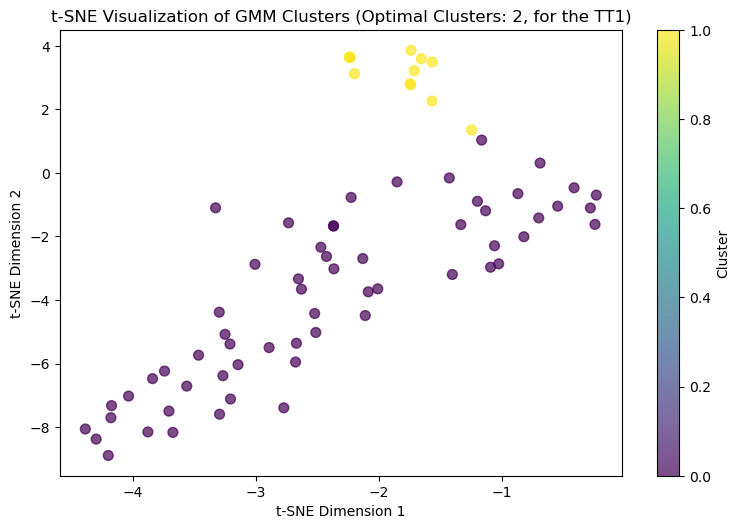

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 82.0486402011158
Davies-Bouldin Index: 0.4288814272179074
Silhouette Score: 0.5548014733583889


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 57.91435323117512
Davies-Bouldin Index: 0.4626225307897237
Silhouette Score: 0.5346229645535989


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 57.91435323117512
Davies-Bouldin Index: 0.4626225307897237
Silhouette Score: 0.5346229645535989


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 57.91435323117512
Davies-Bouldin Index: 0.4626225307897237
Silhouette Score: 0.5346229645535989


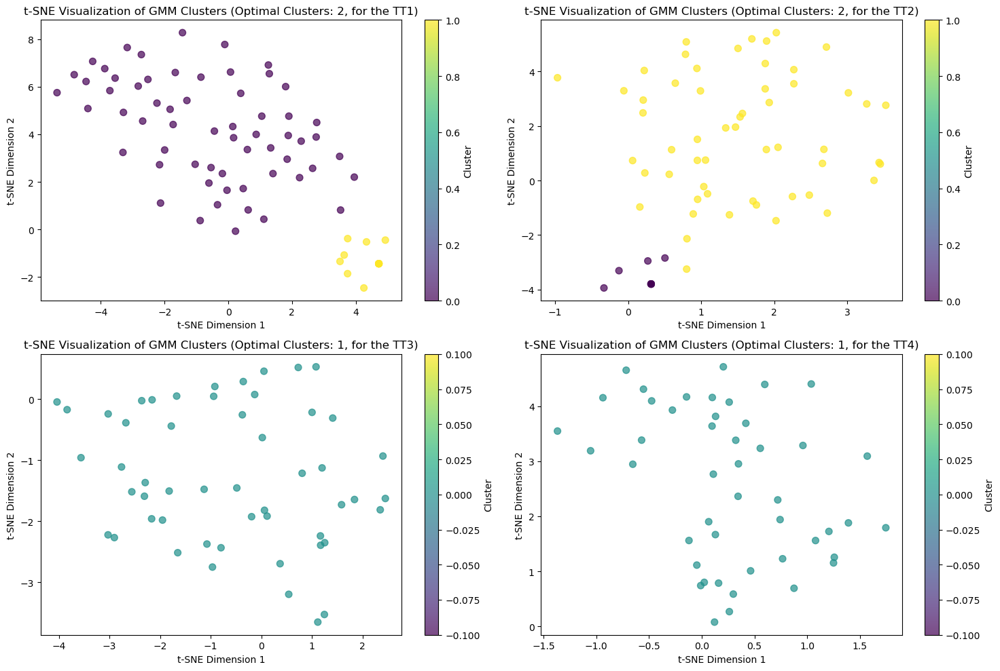

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 57.17976799457404
Davies-Bouldin Index: 0.617570475193406
Silhouette Score: 0.44779269155619283


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 40.36819779727303
Davies-Bouldin Index: 1.0454478135720096
Silhouette Score: 0.24820403260397572


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 40.36819779727303
Davies-Bouldin Index: 1.0454478135720096
Silhouette Score: 0.24820403260397572


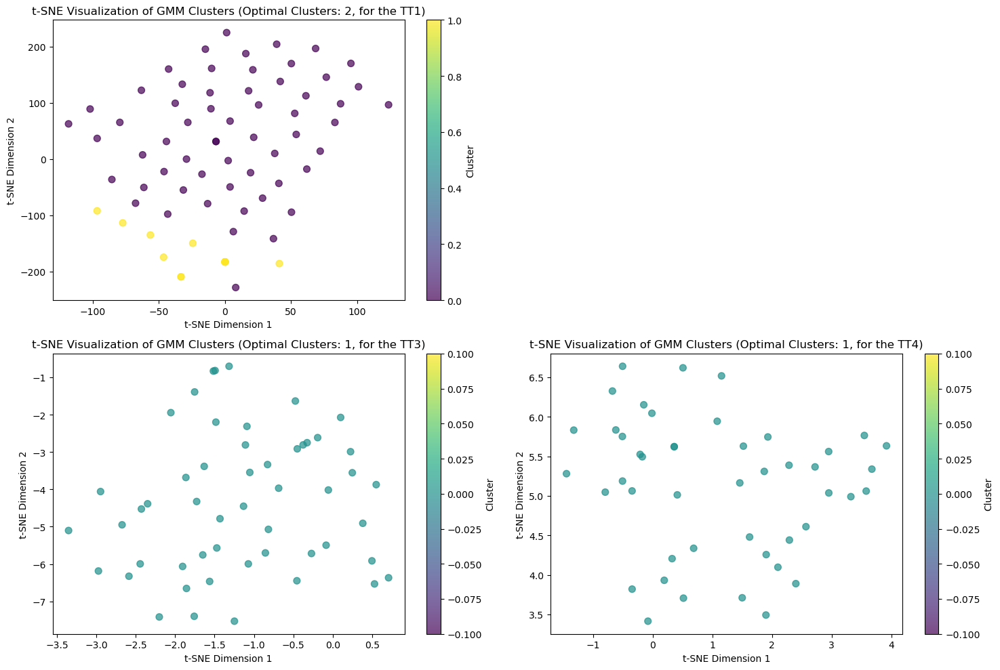

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 31.469255652983026
Davies-Bouldin Index: 0.9895880849325519
Silhouette Score: 0.33217170483949504


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

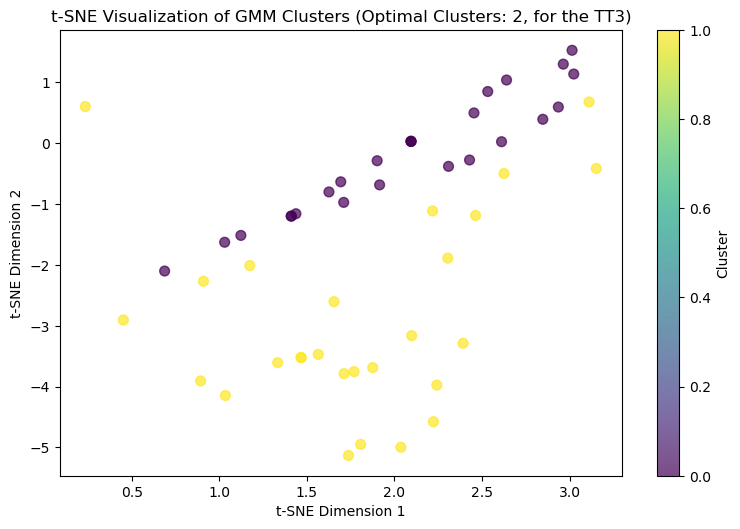

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 33.91538672213309
Davies-Bouldin Index: 0.8944515405900457
Silhouette Score: 0.26322085720225186


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 42.24557301668033
Davies-Bouldin Index: 0.8692335502524677
Silhouette Score: 0.4408667074599759


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 27.258654055605916
Davies-Bouldin Index: 0.7377429163849184
Silhouette Score: 0.3580575355986271


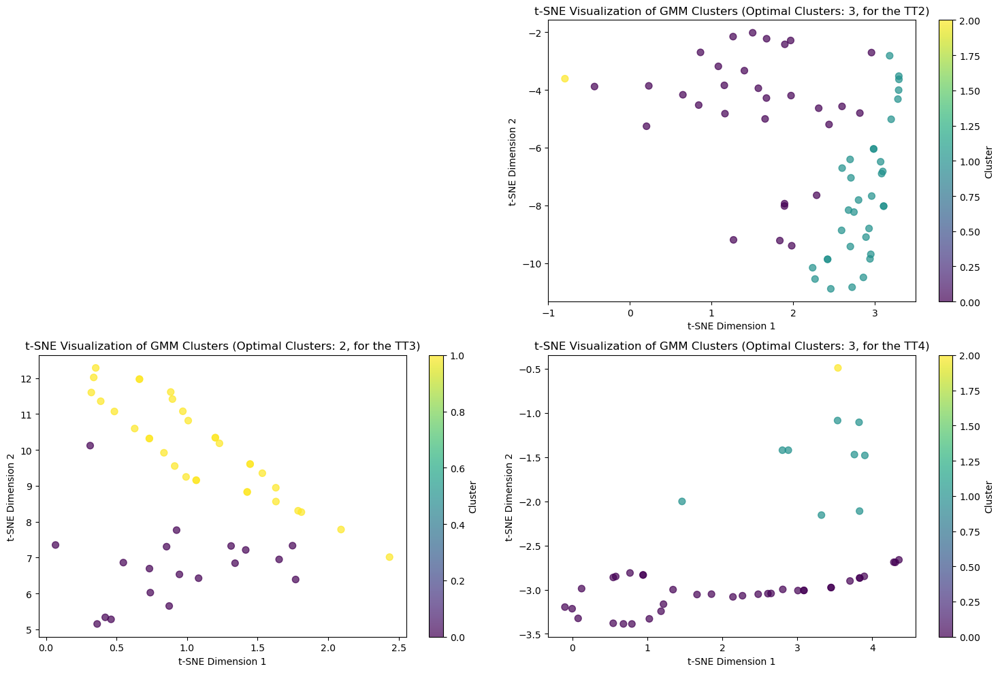

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 38.03975679750249
Davies-Bouldin Index: 0.8713046406990829
Silhouette Score: 0.3483675854167136


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

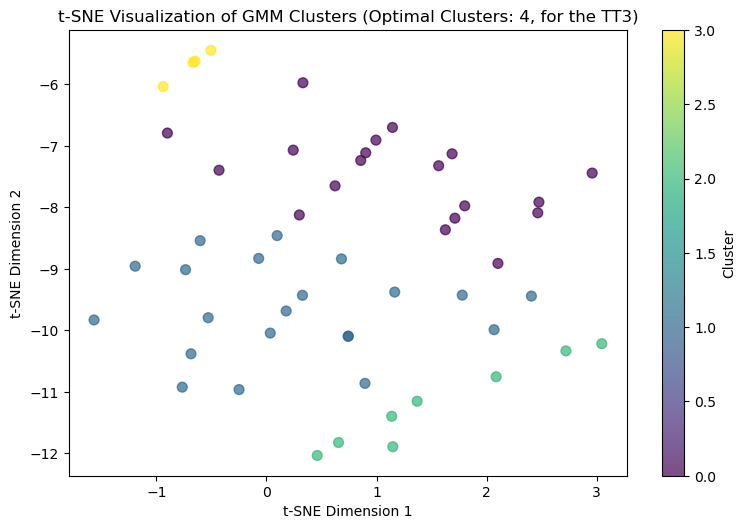

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 93.10026788264248
Davies-Bouldin Index: 0.7141718428885907
Silhouette Score: 0.31049861207295915


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 93.10026788264248
Davies-Bouldin Index: 0.7141718428885907
Silhouette Score: 0.31049861207295915


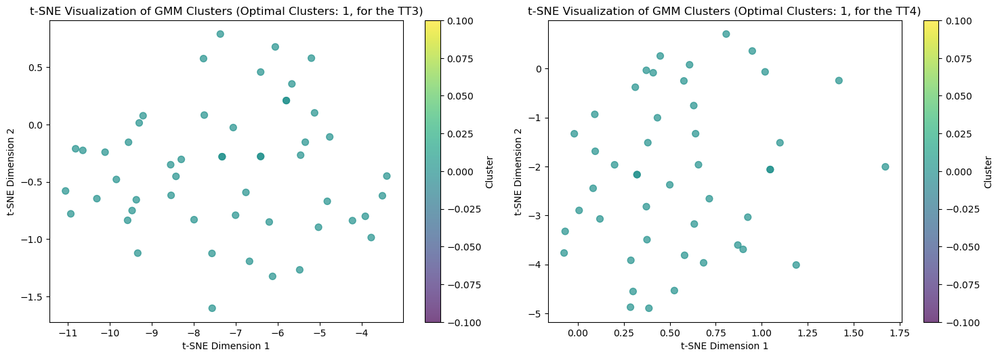

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 96.18892851418047
Davies-Bouldin Index: 0.8270207017870238
Silhouette Score: 0.3262242206908974


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 24.85757783758392
Davies-Bouldin Index: 0.9492554107558678
Silhouette Score: 0.2811919221814269


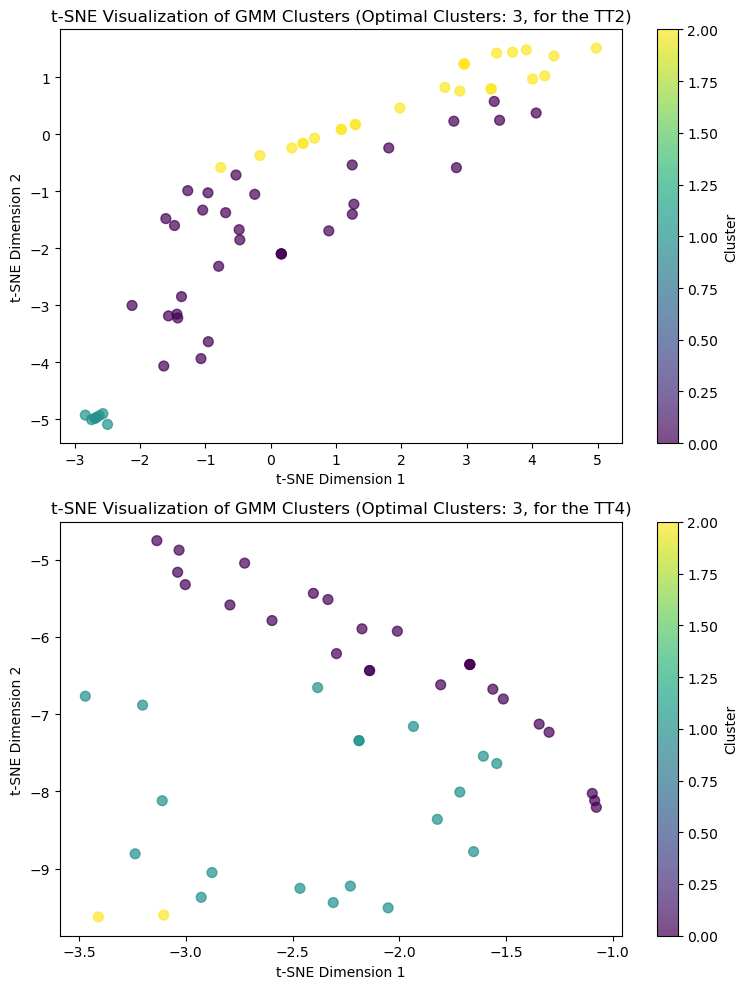

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 29.221447044986412
Davies-Bouldin Index: 1.033457012973301
Silhouette Score: 0.22996643463247868


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

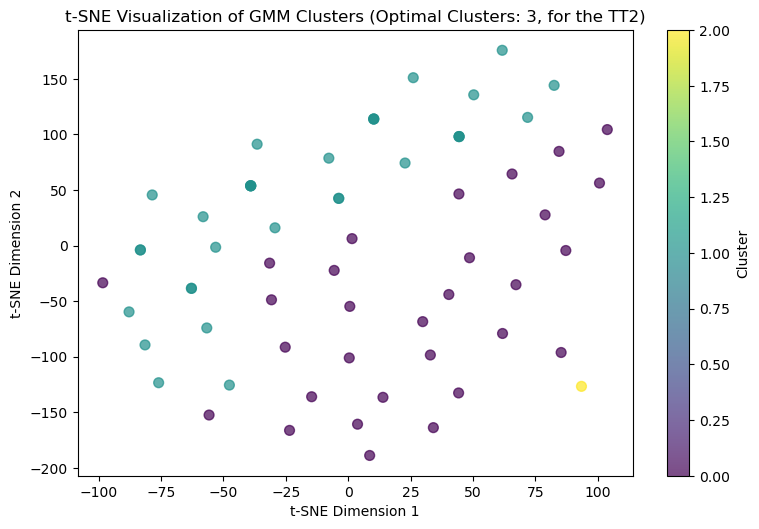

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 82.17594445588044
Davies-Bouldin Index: 2.2220967623628134
Silhouette Score: 0.38150686881673057


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 37.10523620327074
Davies-Bouldin Index: 1.1696636346107117
Silhouette Score: 0.22655429017591439


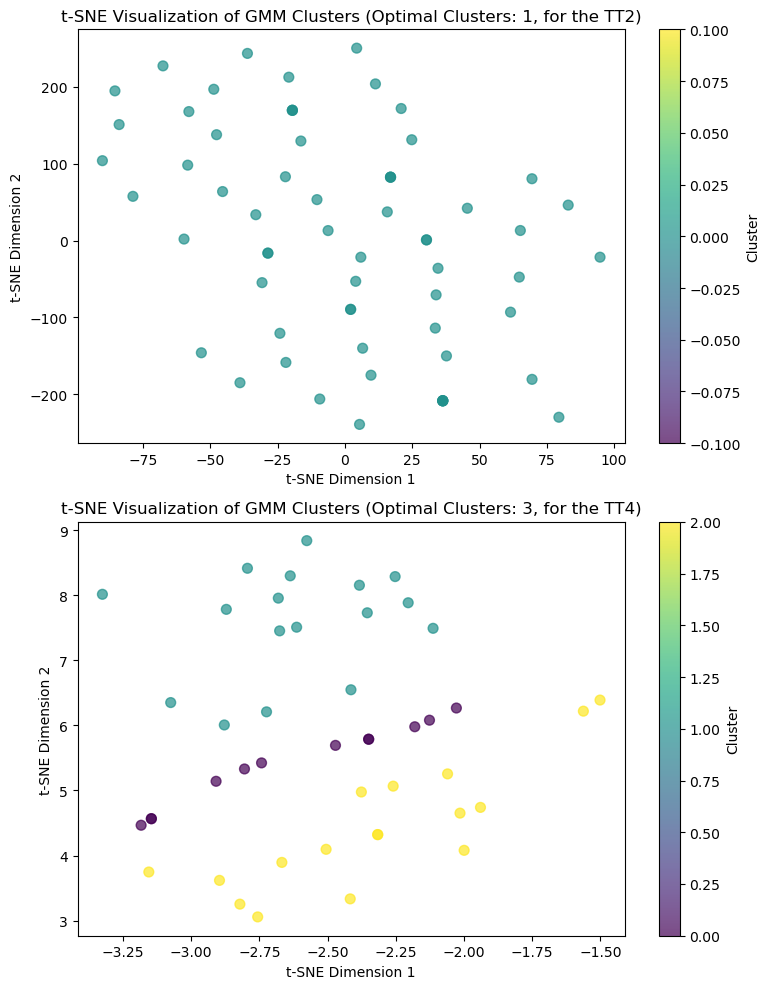

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 32.96689484097892
Davies-Bouldin Index: 0.77244819752609
Silhouette Score: 0.3994888995303669


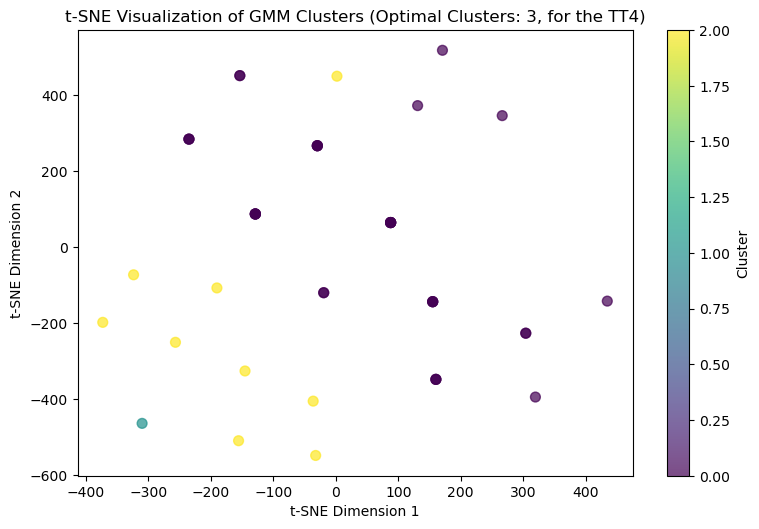

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 56.960145823481426
Davies-Bouldin Index: 0.6355535945441863
Silhouette Score: 0.39701731297876497


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

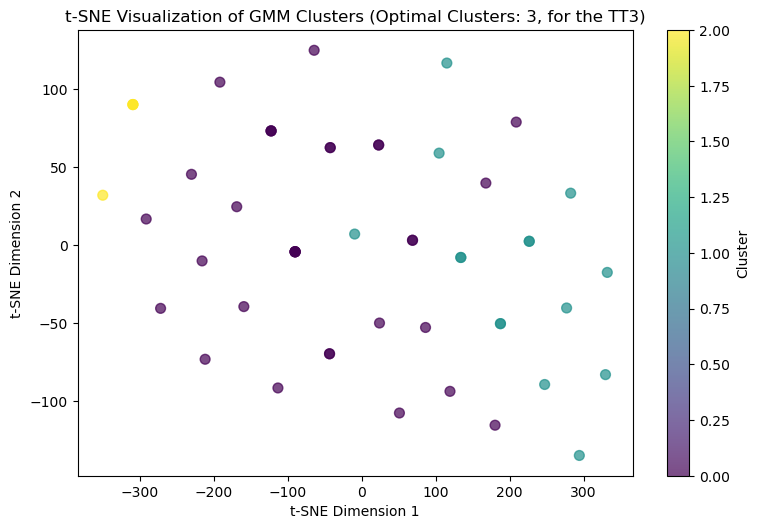

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 29.85589084028764
Davies-Bouldin Index: 1.0738502872483637
Silhouette Score: 0.22452152765528727


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 43.01013398160216
Davies-Bouldin Index: 1.1990003381445824
Silhouette Score: 0.2958968884838196


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

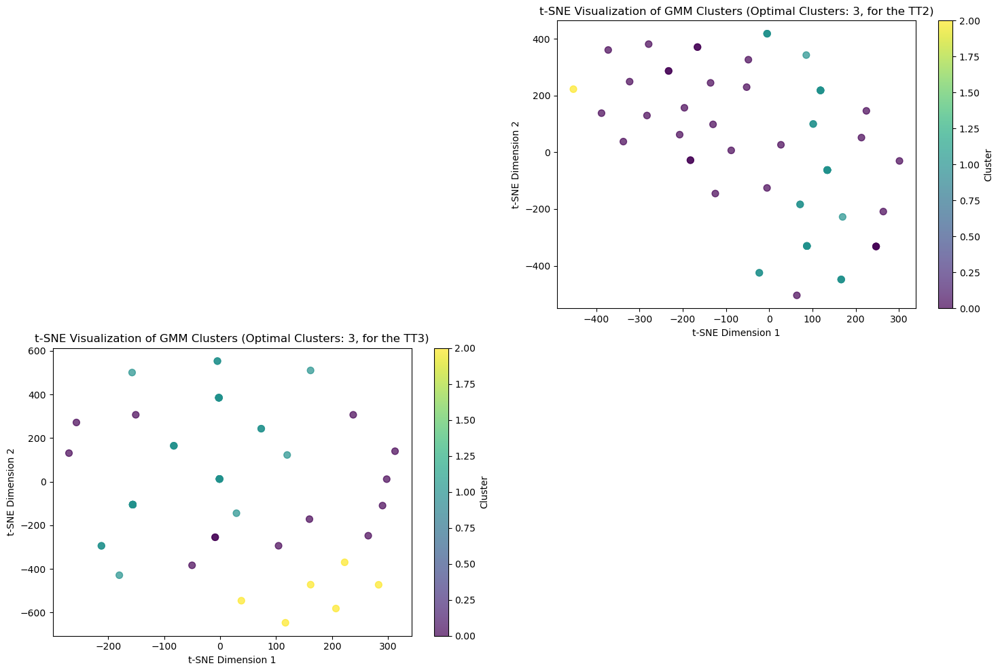

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 126.95170233924085
Davies-Bouldin Index: 0.41724470124267365
Silhouette Score: 0.6388642428964894


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

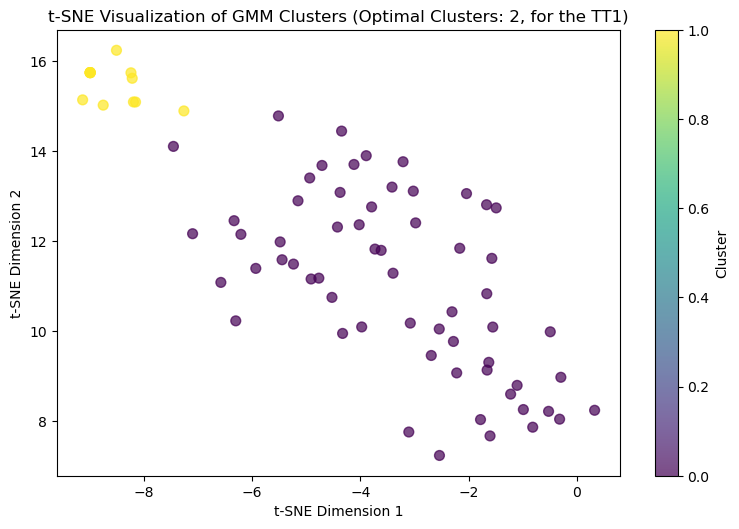

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 86.70531639315811
Davies-Bouldin Index: 1.2420012522454387
Silhouette Score: 0.3134374215936626


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

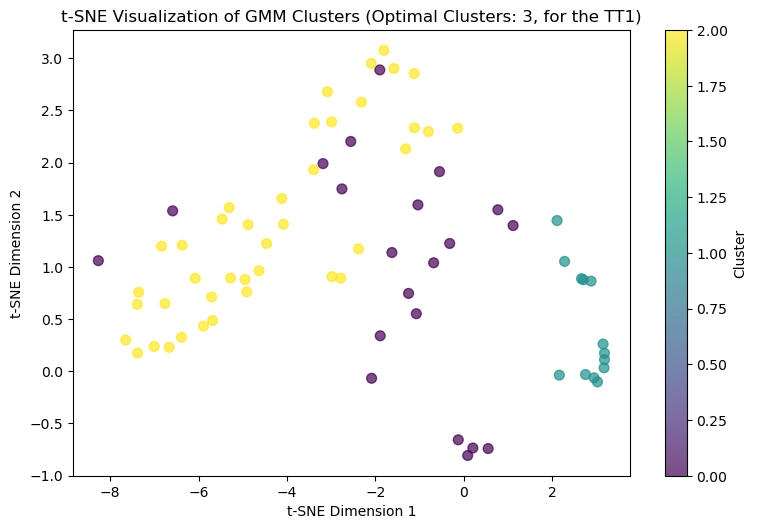

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 110.62113803045898
Davies-Bouldin Index: 0.5193589608392497
Silhouette Score: 0.592332970861023


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

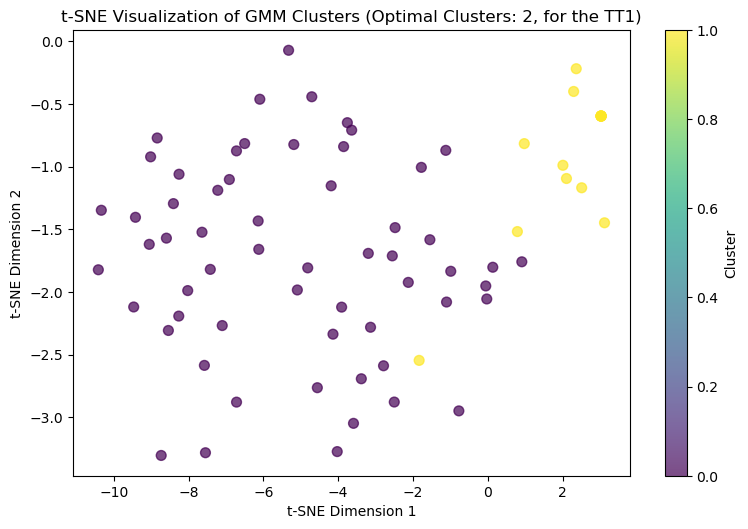

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 86.56164433877099
Davies-Bouldin Index: 0.8733210443147884
Silhouette Score: 0.3679341459986263


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

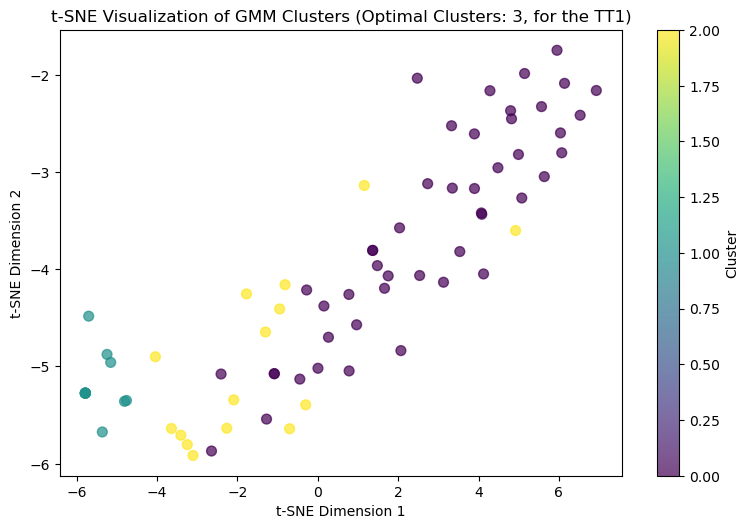

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 49.86146981410673
Davies-Bouldin Index: 1.000502762020543
Silhouette Score: 0.3249918511271991


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

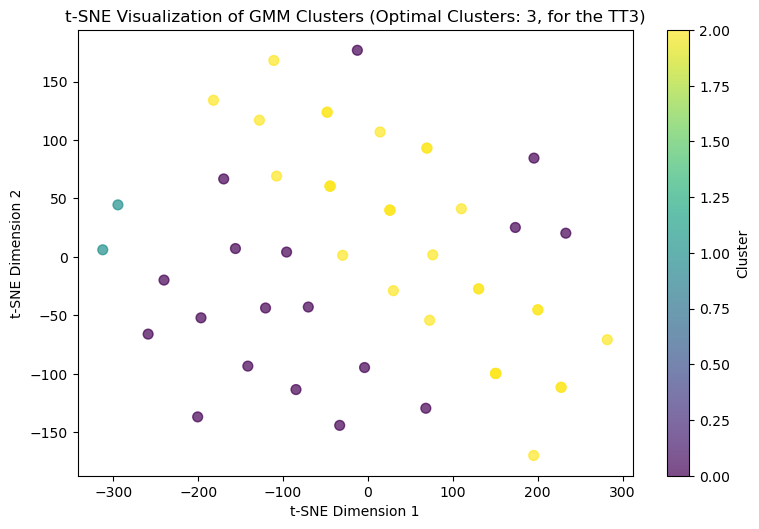

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 65.05709177939328
Davies-Bouldin Index: 0.4523010228288868
Silhouette Score: 0.5005275447147076


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 65.05709177939328
Davies-Bouldin Index: 0.4523010228288868
Silhouette Score: 0.5005275447147076


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 65.05709177939328
Davies-Bouldin Index: 0.4523010228288868
Silhouette Score: 0.5005275447147076


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 65.05709177939328
Davies-Bouldin Index: 0.4523010228288868
Silhouette Score: 0.5005275447147076


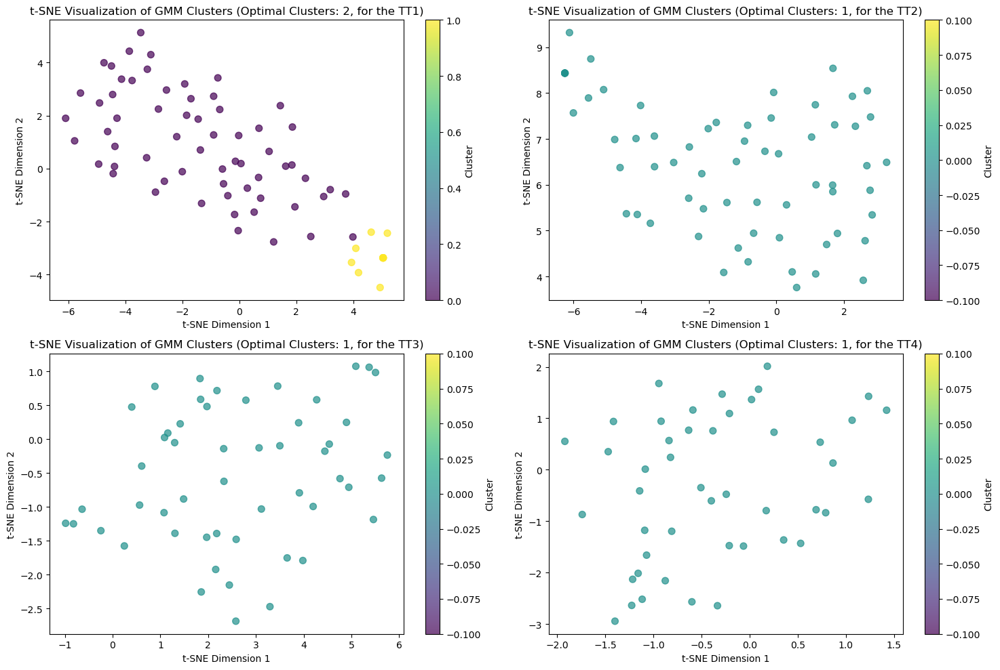

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 60.41827947029549
Davies-Bouldin Index: 1.310001261055491
Silhouette Score: 0.23553363062405325


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

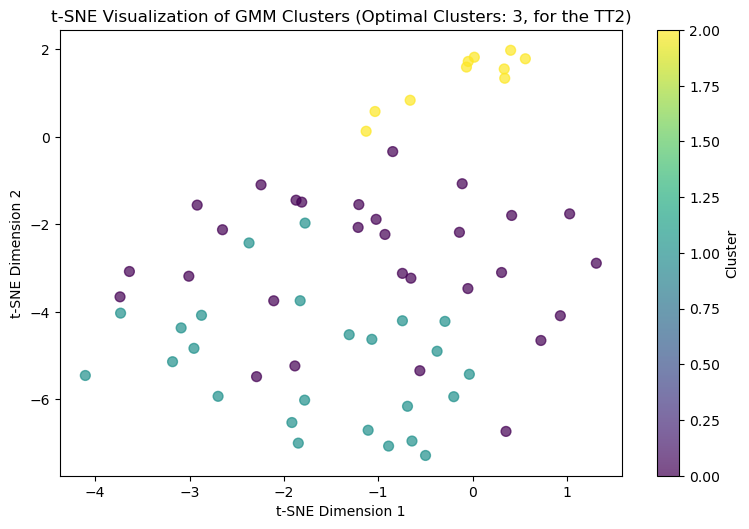

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 21.420808766647905
Davies-Bouldin Index: 1.202683844746317
Silhouette Score: 0.2259837127659613


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

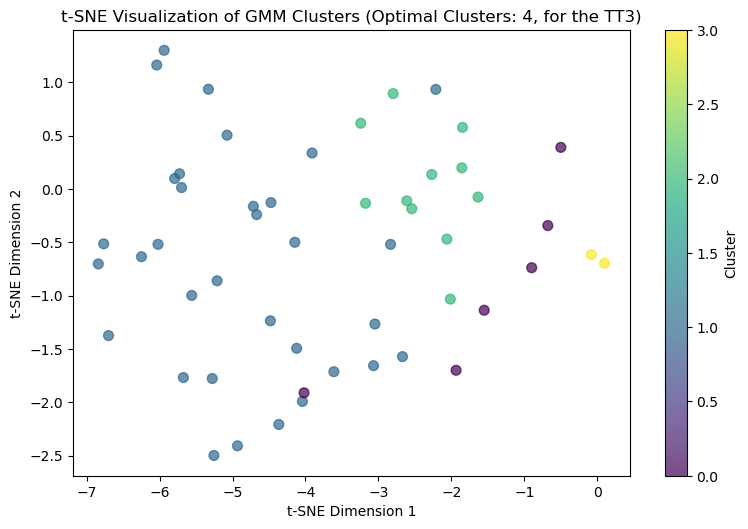

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 88.38356441527833
Davies-Bouldin Index: 0.5754227696795733
Silhouette Score: 0.5164447056999008


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 63.06013089287821
Davies-Bouldin Index: 0.5395586853377079
Silhouette Score: 0.50875956294456


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 63.06013089287821
Davies-Bouldin Index: 0.5395586853377079
Silhouette Score: 0.50875956294456


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

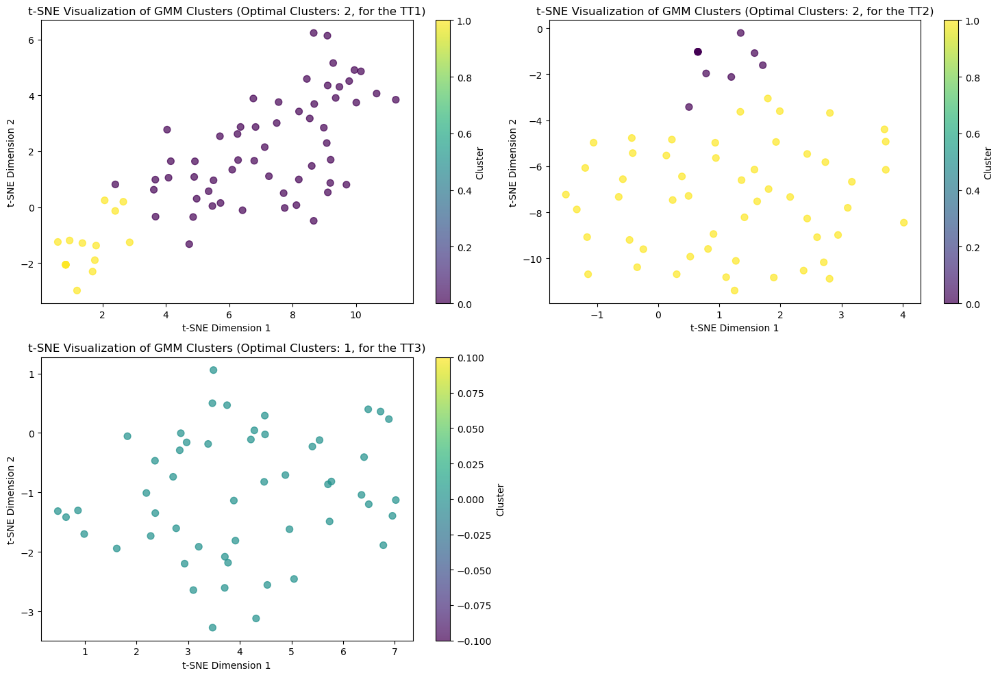

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 48.20349480397135
Davies-Bouldin Index: 1.2768678351901328
Silhouette Score: 0.24821062715186018


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

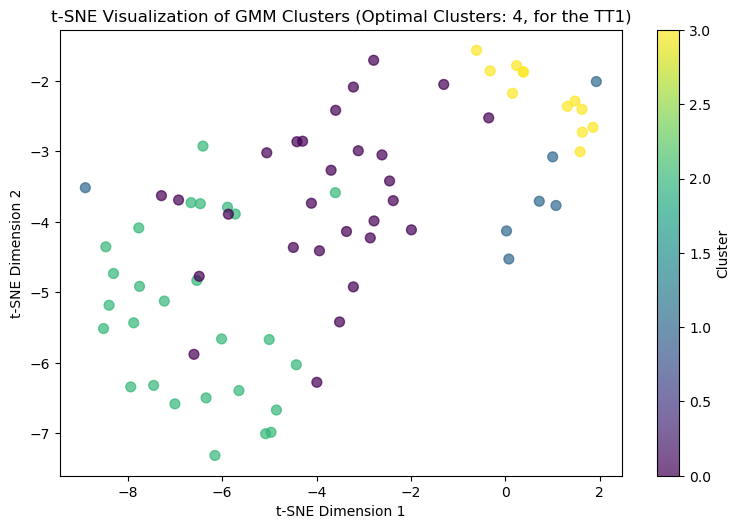

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 78.81945831048705
Davies-Bouldin Index: 0.5533028320503361
Silhouette Score: 0.4941052204317989


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 59.68888057941867
Davies-Bouldin Index: 0.8861789052687964
Silhouette Score: 0.33241308121527935


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 59.68888057941867
Davies-Bouldin Index: 0.8861789052687964
Silhouette Score: 0.33241308121527935


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

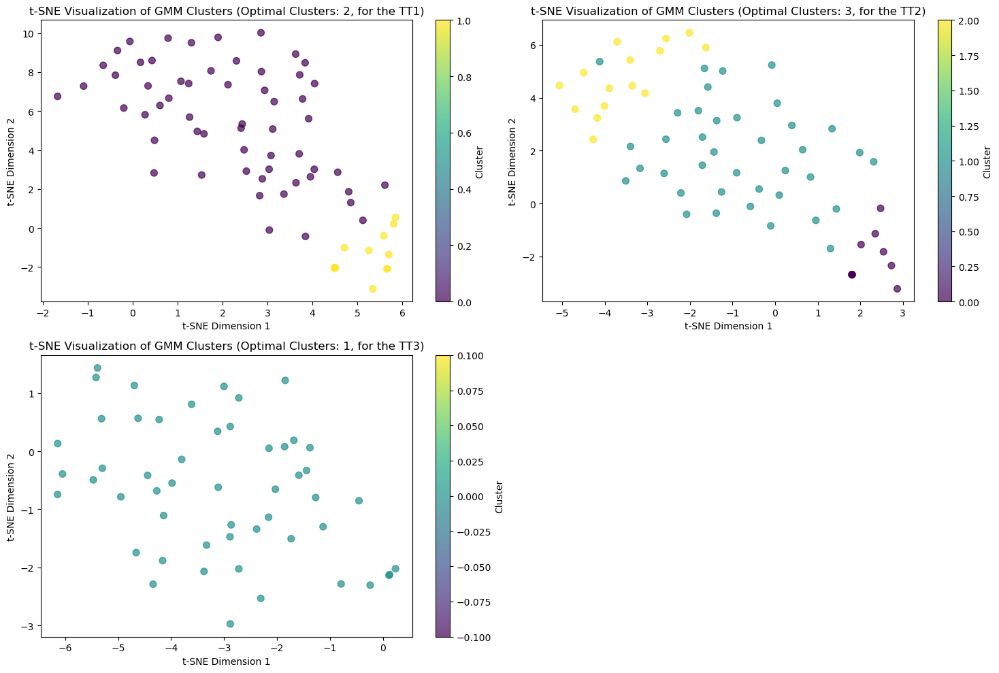

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 28.139563127425866
Davies-Bouldin Index: 1.1736785712722948
Silhouette Score: 0.3230739343004539


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

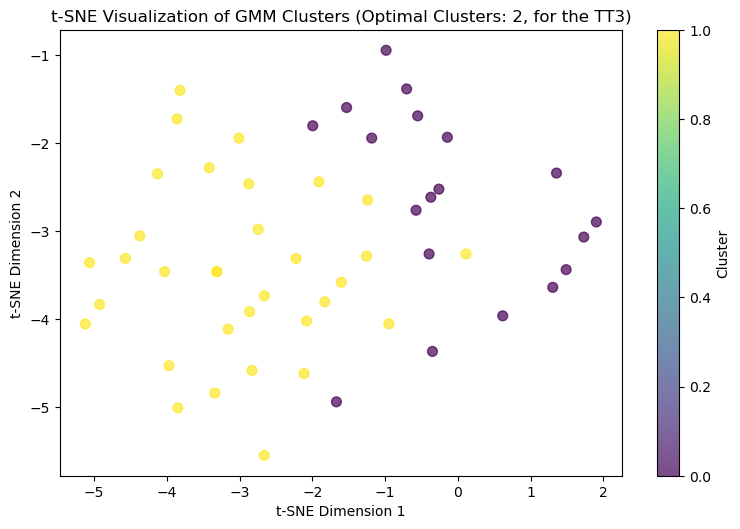

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 65.32875625385446
Davies-Bouldin Index: 0.9196687009155783
Silhouette Score: 0.28006961462999924


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

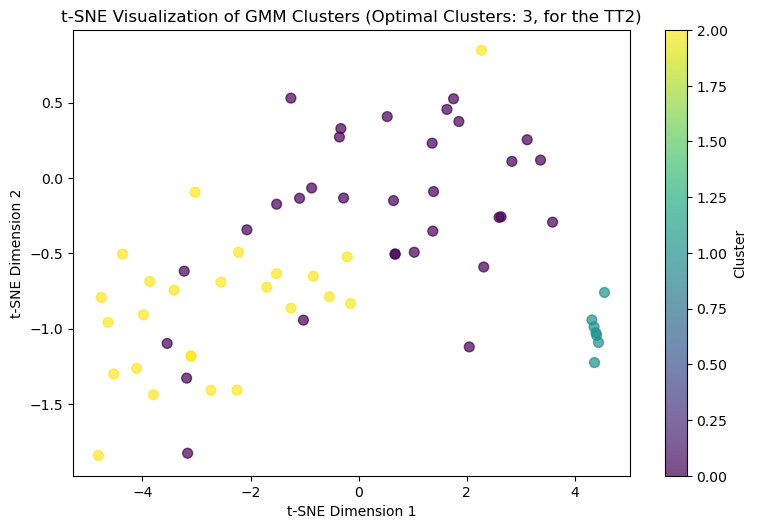

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 94.65255551455097
Davies-Bouldin Index: 0.47083247359830693
Silhouette Score: 0.540777001546163


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 103.64593550881145
Davies-Bouldin Index: 0.6525022530639067
Silhouette Score: 0.36530089631962204


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 103.64593550881145
Davies-Bouldin Index: 0.6525022530639067
Silhouette Score: 0.36530089631962204


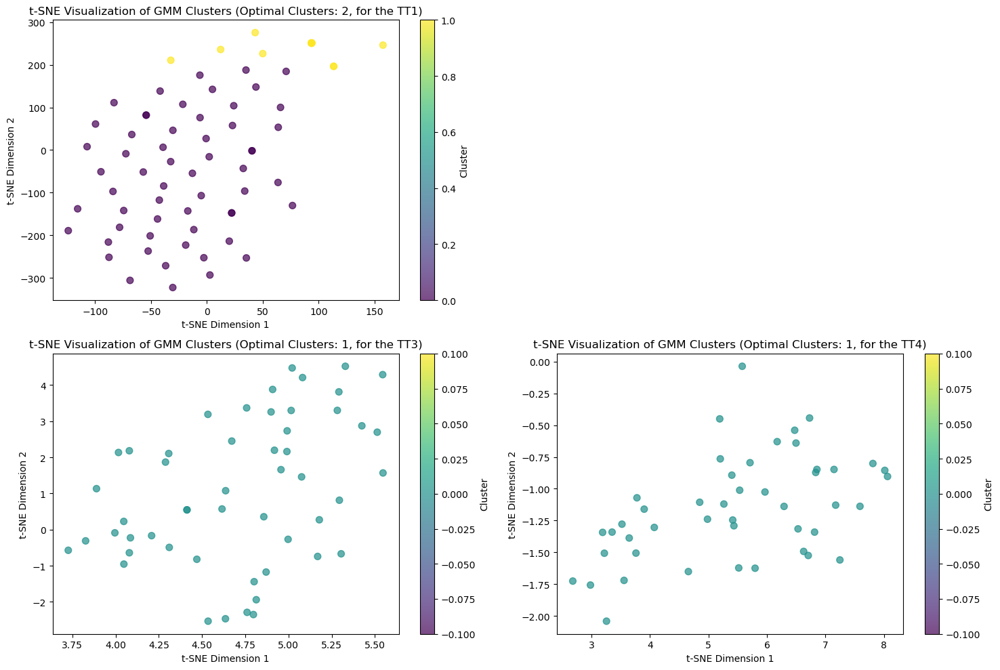

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 43.822885382246085
Davies-Bouldin Index: 1.0080860198690902
Silhouette Score: 0.3191063106049978


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

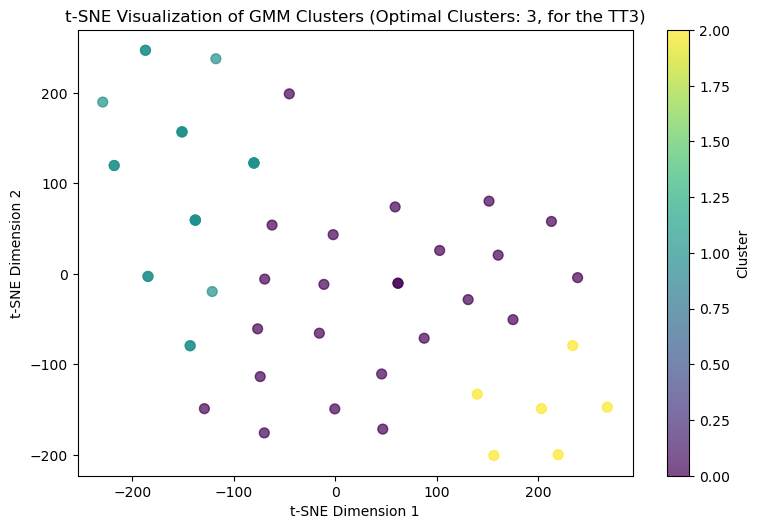

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 113.325698428835
Davies-Bouldin Index: 0.5196229010693534
Silhouette Score: 0.5892653182457281


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 32.23932807925584
Davies-Bouldin Index: 0.9382911772052466
Silhouette Score: 0.26118122083981565


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 20.25135460609142
Davies-Bouldin Index: 1.0655498533822172
Silhouette Score: 0.21600595733204683


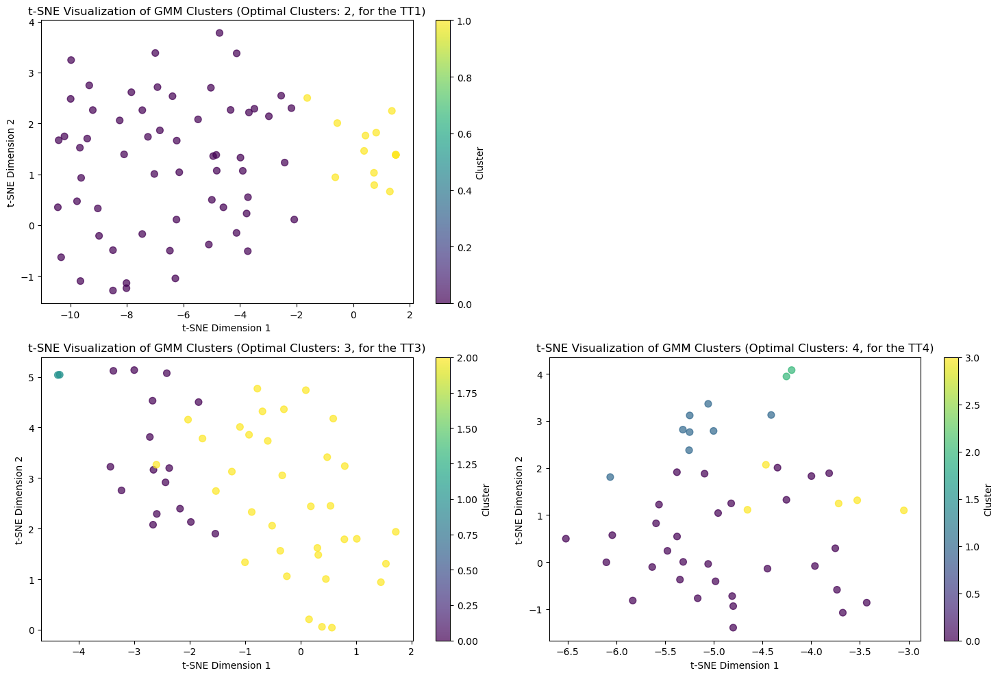

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 43.10385020506297
Davies-Bouldin Index: 0.9026109600208797
Silhouette Score: 0.30821426516965666


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

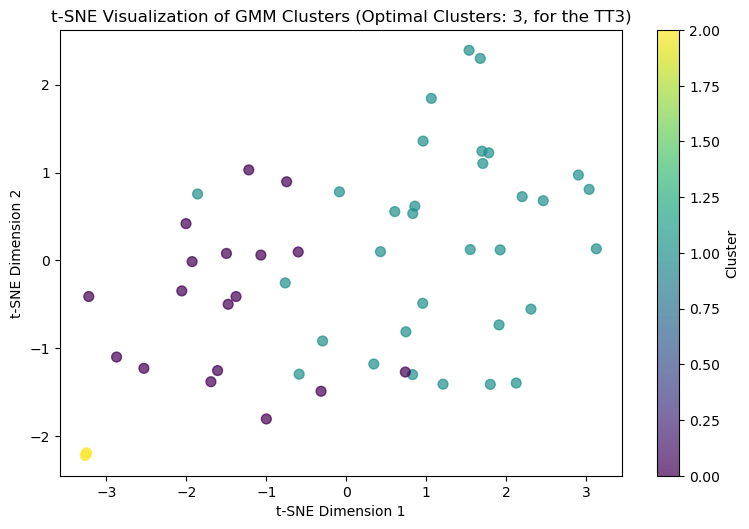

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 110.67355507214859
Davies-Bouldin Index: 0.5215768399278443
Silhouette Score: 0.5856504906029824


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

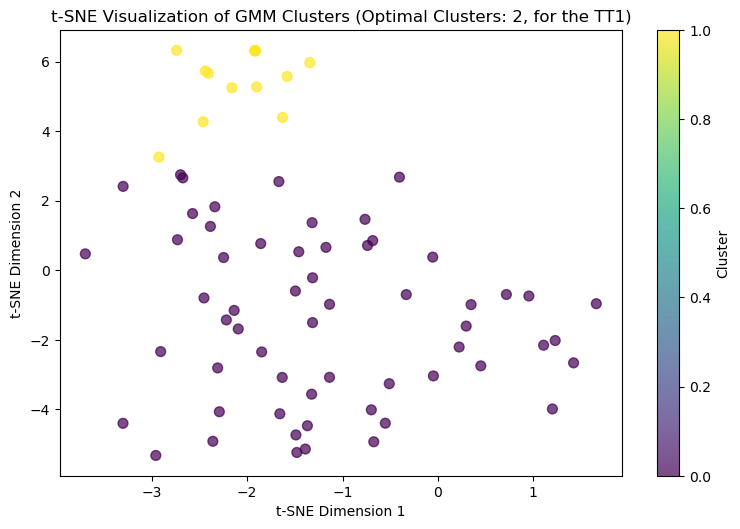

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 60.22692987604133
Davies-Bouldin Index: 1.0062699103105666
Silhouette Score: 0.3176173378093942


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

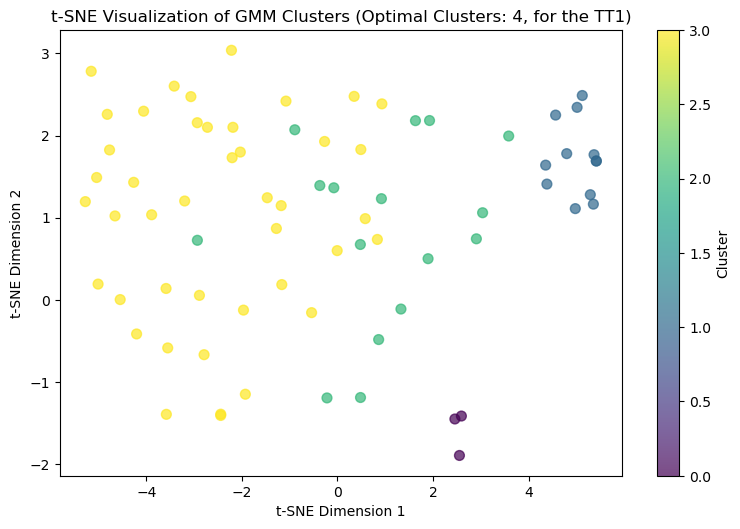

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 59.06042039050791
Davies-Bouldin Index: 1.0683435015742668
Silhouette Score: 0.3216447554959958


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

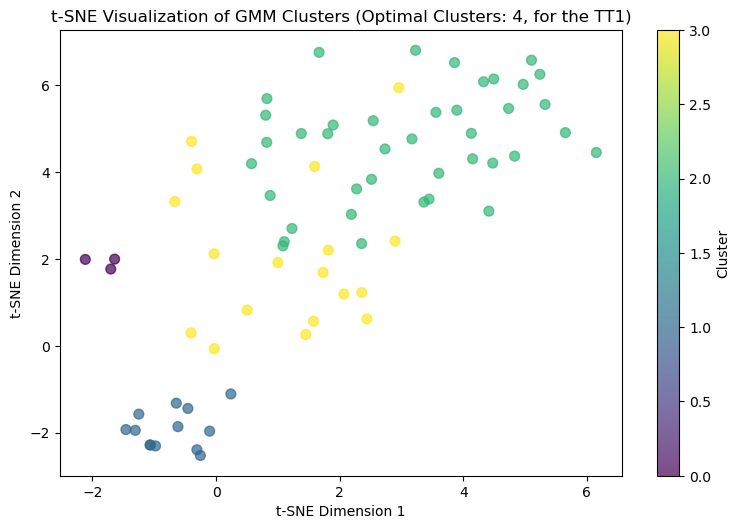

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 73.57110983786785
Davies-Bouldin Index: 0.9927739552660835
Silhouette Score: 0.25904508507520246


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

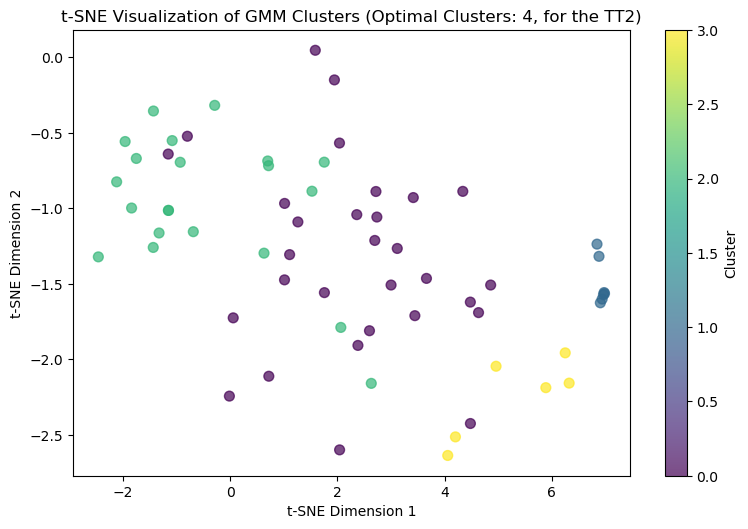

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 53.14880298376
Davies-Bouldin Index: 1.0593051576293733
Silhouette Score: 0.27997354010409853


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

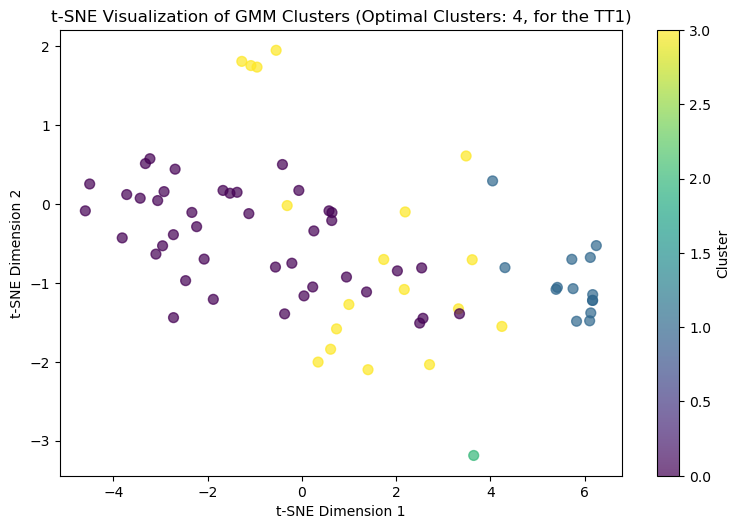

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 58.473295657352665
Davies-Bouldin Index: 1.5369801791894533
Silhouette Score: 0.28042070614184333


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

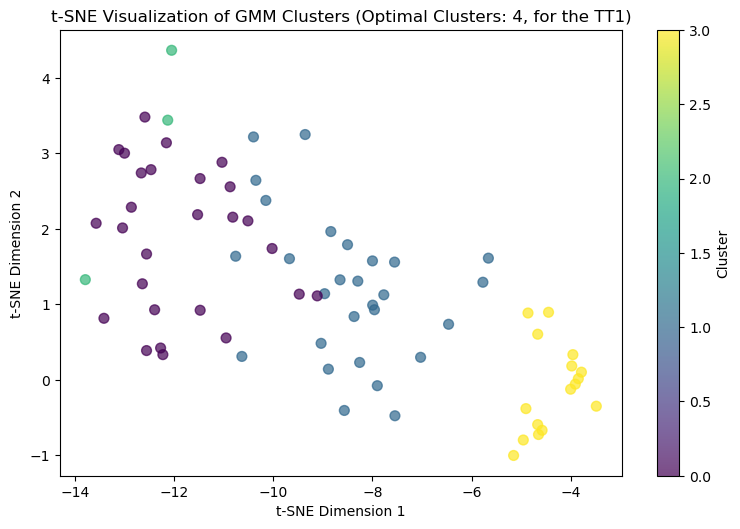

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 79.46515899516368
Davies-Bouldin Index: 0.5238858815362758
Silhouette Score: 0.505290279049354


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 52.98647519241526
Davies-Bouldin Index: 1.1242431263759396
Silhouette Score: 0.2676066211520628


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 52.98647519241526
Davies-Bouldin Index: 1.1242431263759396
Silhouette Score: 0.2676066211520628


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 52.98647519241526
Davies-Bouldin Index: 1.1242431263759396
Silhouette Score: 0.2676066211520628


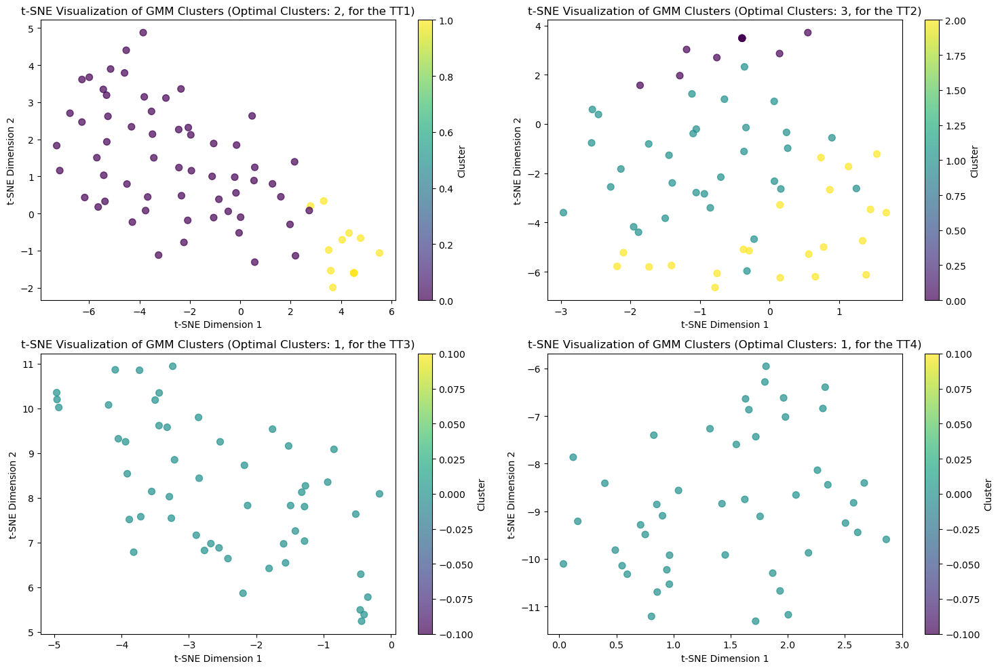

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 25.625063836202656
Davies-Bouldin Index: 1.2063823518151378
Silhouette Score: 0.2254068929545811


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

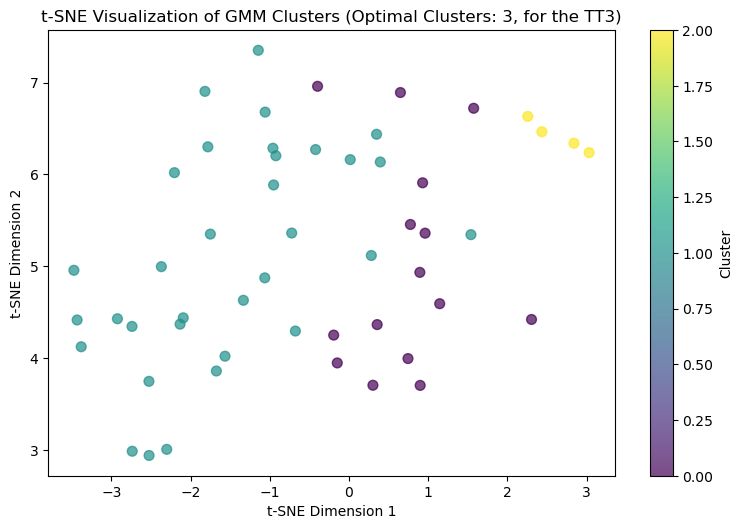

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 48.661011520938075
Davies-Bouldin Index: 0.9337328549387628
Silhouette Score: 0.2960809768739173


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

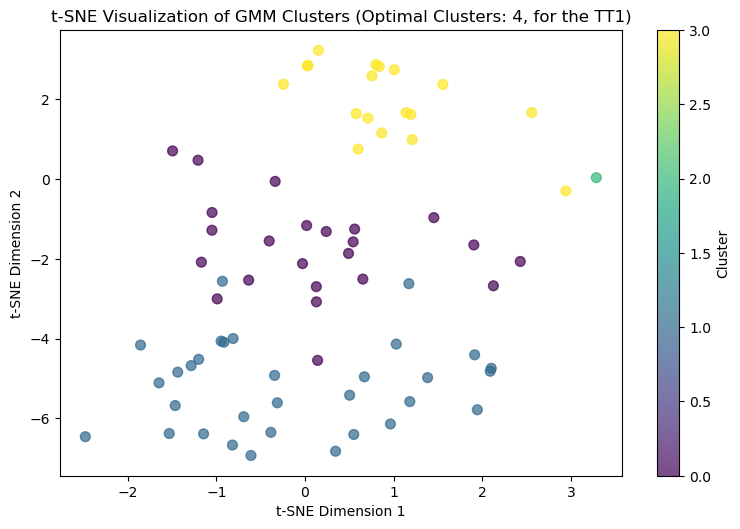

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 55.073403361712884
Davies-Bouldin Index: 1.2072984880494257
Silhouette Score: 0.23919918716454994


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

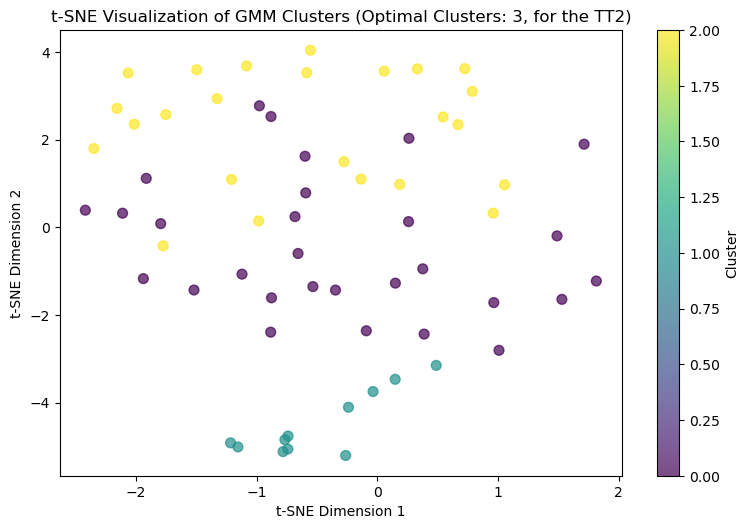

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 61.52944636858272
Davies-Bouldin Index: 1.0246235256762324
Silhouette Score: 0.29587675373850936


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

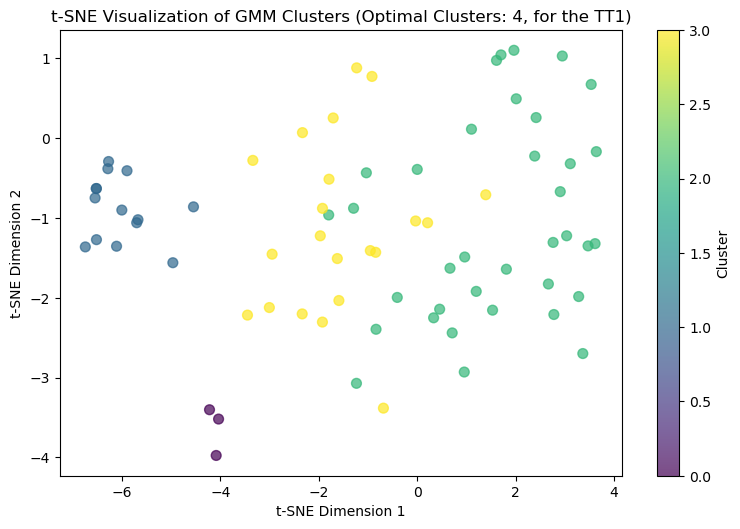

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 96.05629869107443
Davies-Bouldin Index: 0.8796354166264319
Silhouette Score: 0.3708987291176671


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 22.520649710529675
Davies-Bouldin Index: 1.1125155640935112
Silhouette Score: 0.22115133213495813


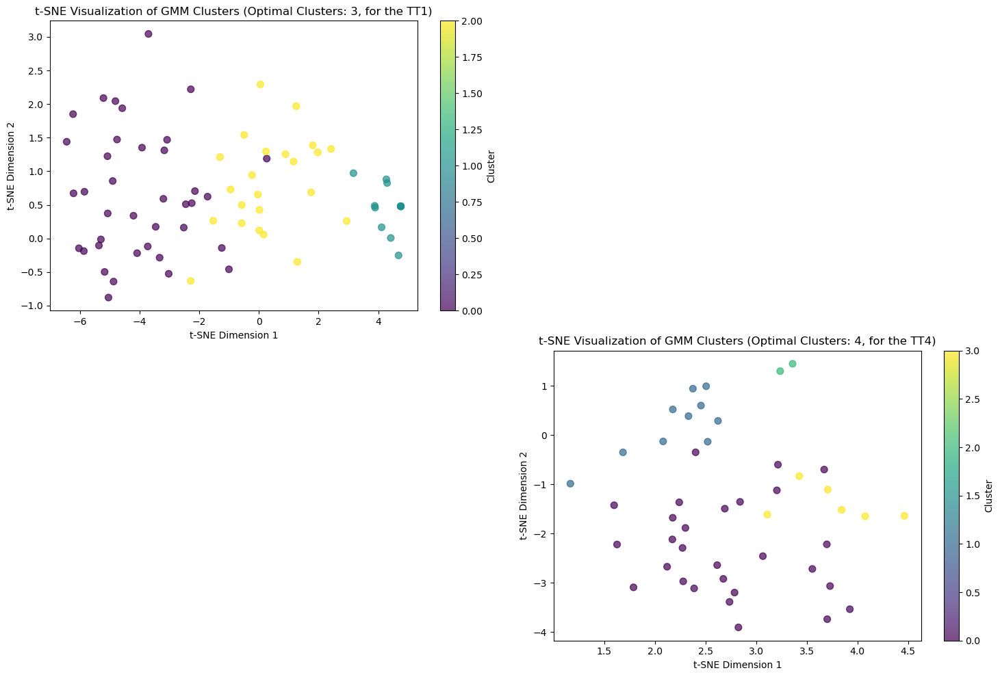

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 54.735421809782906
Davies-Bouldin Index: 1.2017686323881511
Silhouette Score: 0.25807613643205474


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 22.532744295054567
Davies-Bouldin Index: 1.178487444221801
Silhouette Score: 0.256760059464561


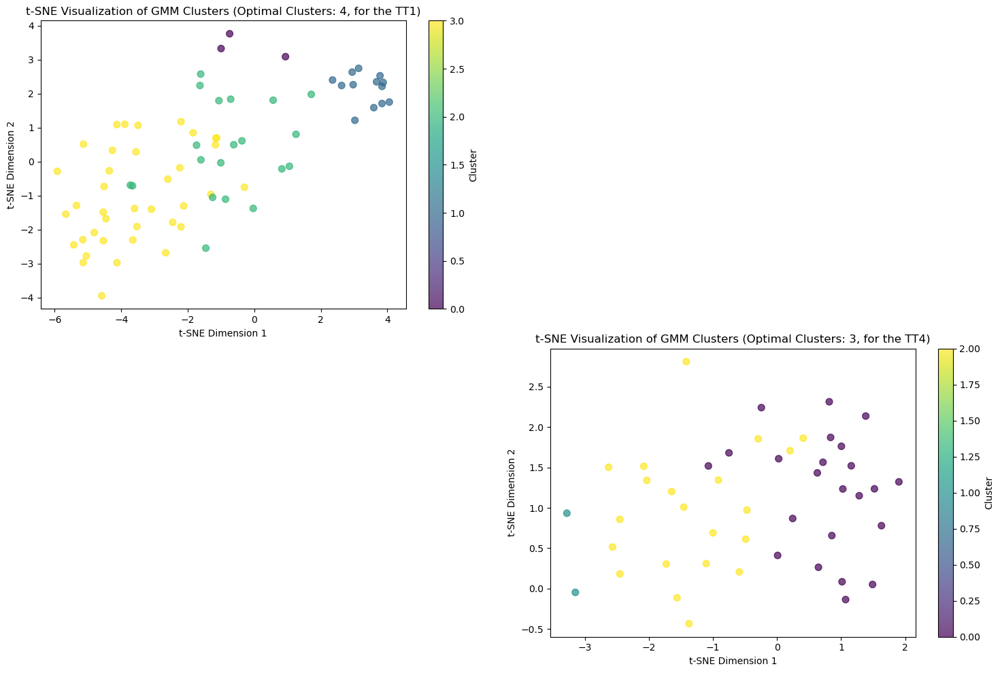

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 56.53353353544018
Davies-Bouldin Index: 1.1343969329876349
Silhouette Score: 0.2804490098484268


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

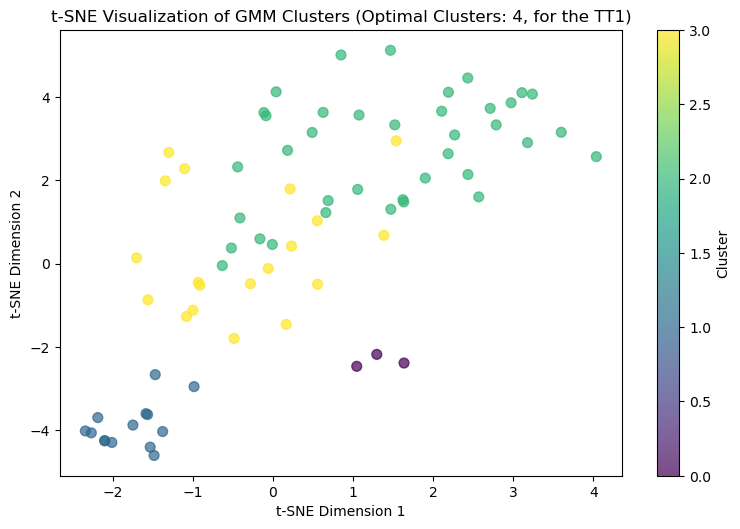

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 57.076070626172786
Davies-Bouldin Index: 1.07563304765864
Silhouette Score: 0.2904843233744839


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

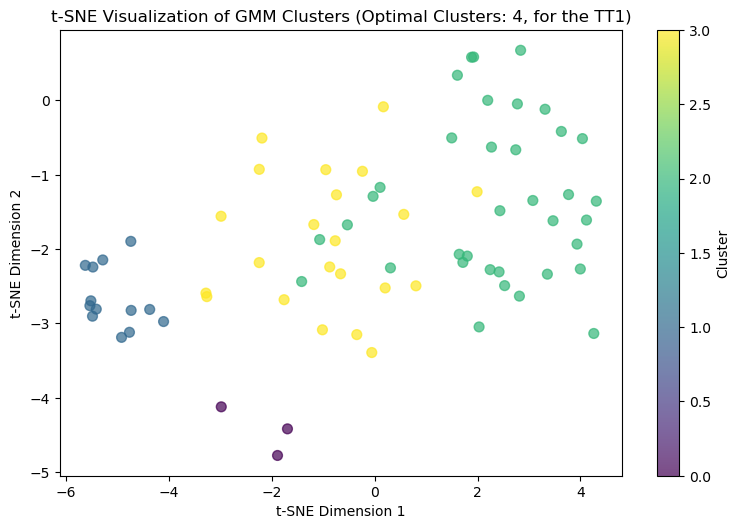

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 45.0250483274921
Davies-Bouldin Index: 1.6386236958934142
Silhouette Score: 0.2008799962921568


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 30.879922276307333
Davies-Bouldin Index: 0.972557715418817
Silhouette Score: 0.281300171379672


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

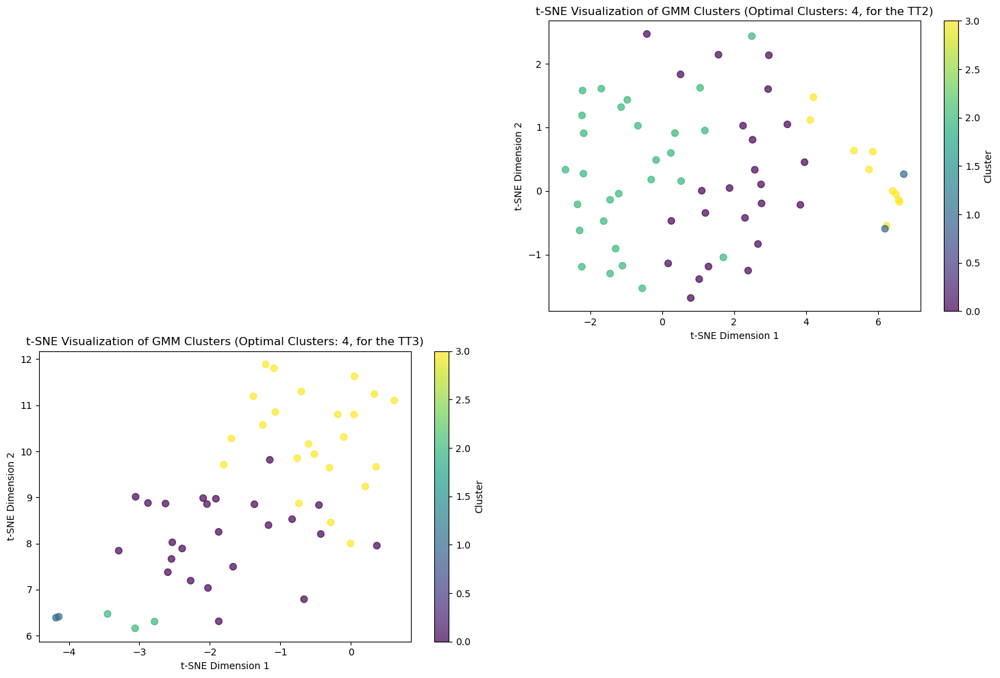

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 50.8531681080102
Davies-Bouldin Index: 1.2517462967090134
Silhouette Score: 0.2835499148197033


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

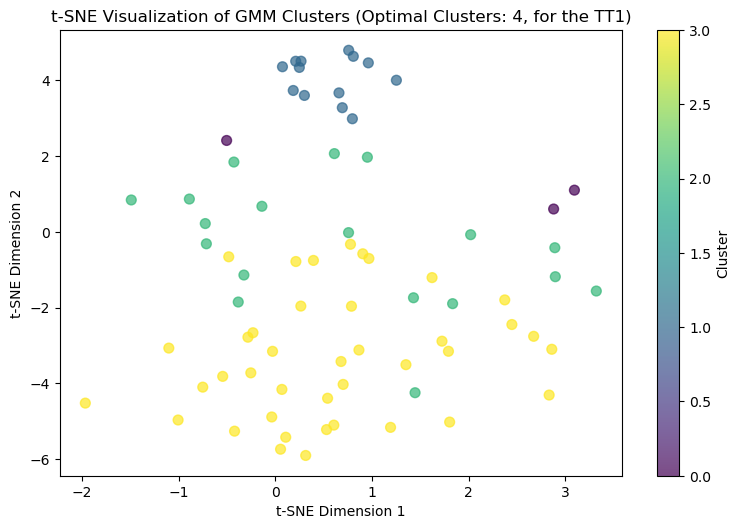

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 37.62502942254806
Davies-Bouldin Index: 0.9472089845741621
Silhouette Score: 0.2960603542013198


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

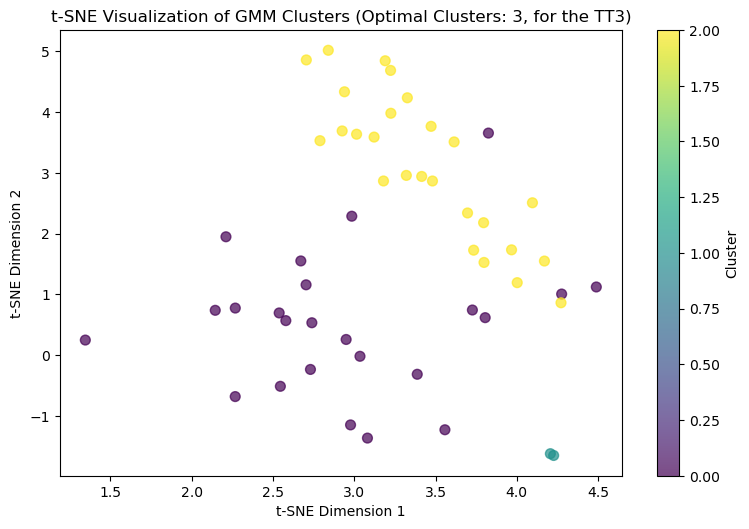

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 35.4392887190985
Davies-Bouldin Index: 1.1024517047786901
Silhouette Score: 0.25867630152509413


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

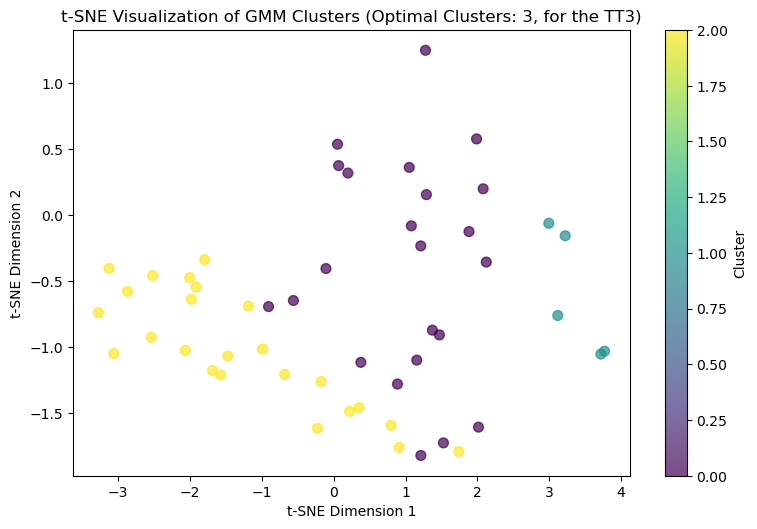

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 61.23465914386342
Davies-Bouldin Index: 0.983462750410389
Silhouette Score: 0.31505784728926634


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

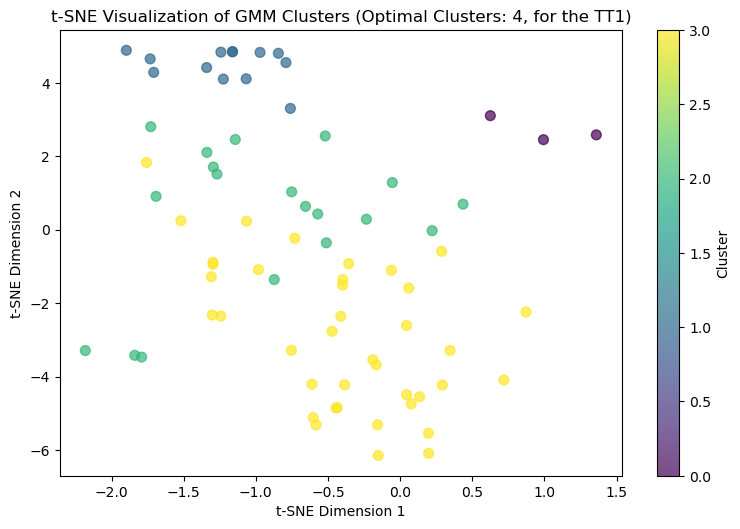

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 37.5401185042011
Davies-Bouldin Index: 1.0118939001628693
Silhouette Score: 0.26994446701041547


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

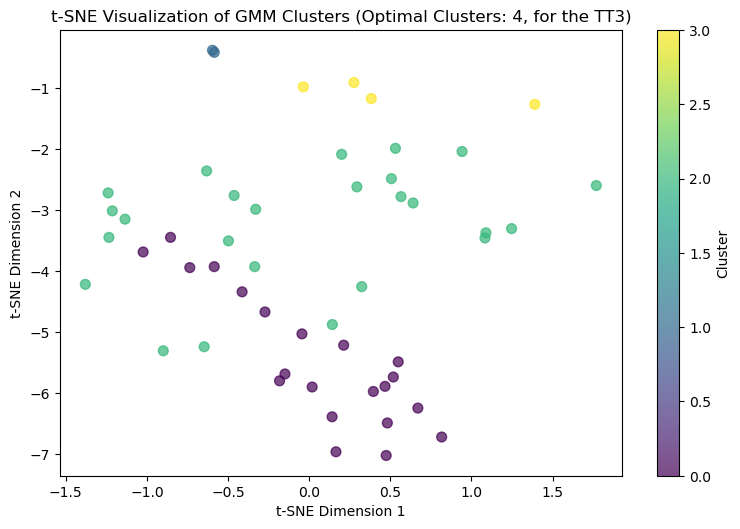

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 60.95797212718192
Davies-Bouldin Index: 1.1306511743171341
Silhouette Score: 0.2610049865210795


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

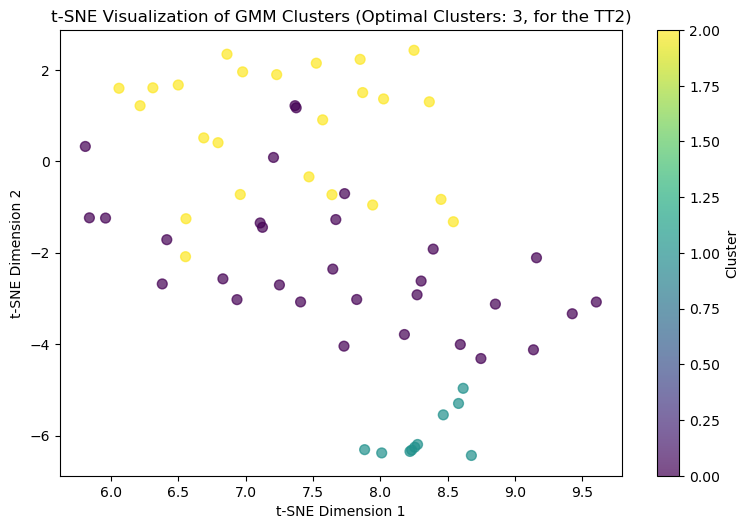

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 40.99074804866292
Davies-Bouldin Index: 1.4083362037549911
Silhouette Score: 0.30290003866561355


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 40.94641089279401
Davies-Bouldin Index: 0.9198184655591551
Silhouette Score: 0.43217904717891165


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

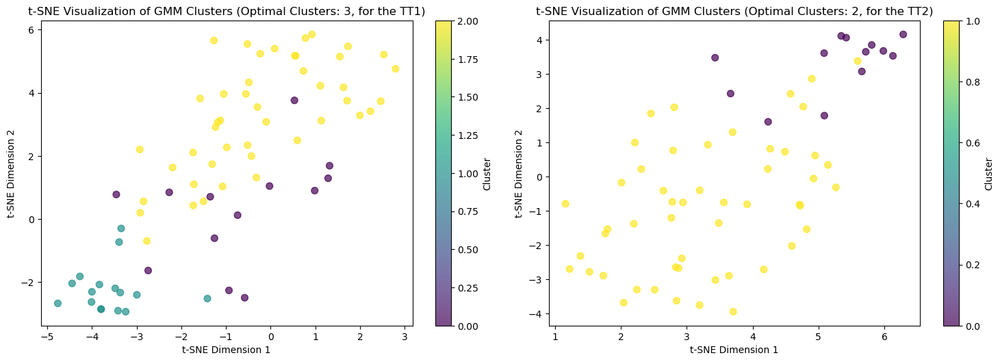

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 51.29747506759057
Davies-Bouldin Index: 1.0290115421503847
Silhouette Score: 0.30291373929776855


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

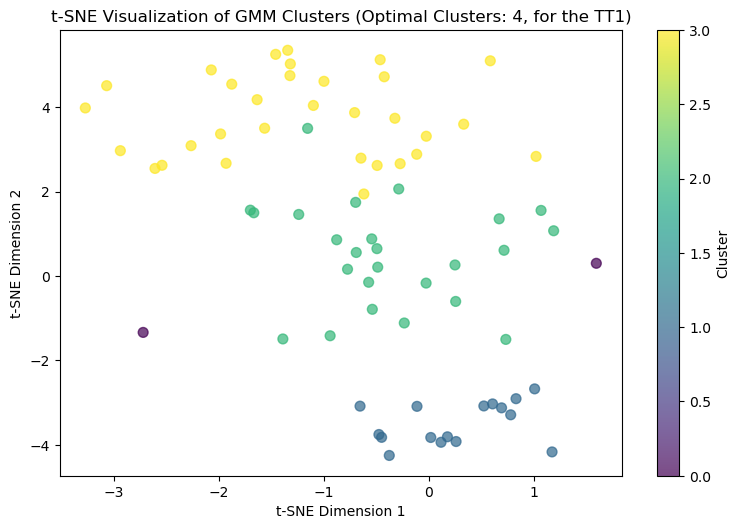

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 58.406319157819425
Davies-Bouldin Index: 1.0189447280222053
Silhouette Score: 0.31146268669898425


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

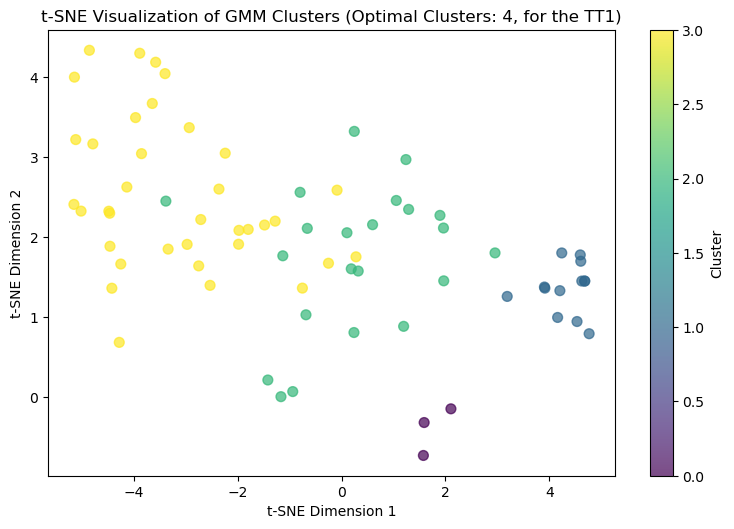

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 52.60175269109075
Davies-Bouldin Index: 1.1098713609594744
Silhouette Score: 0.2874705041500436


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

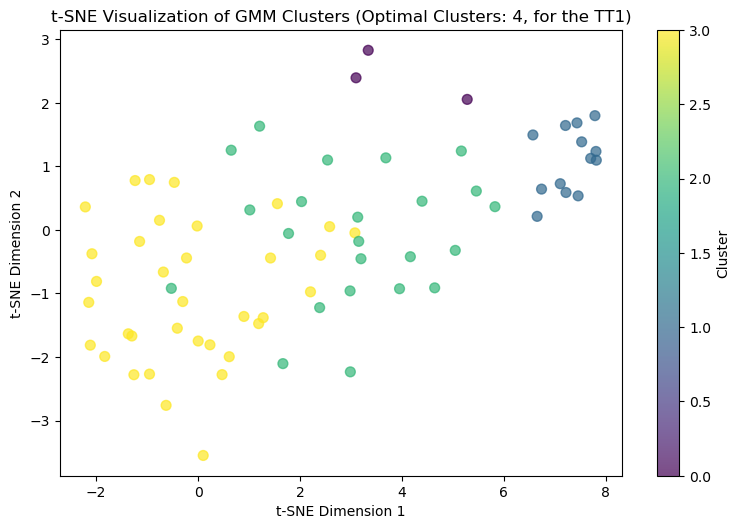

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

<Figure size 1500x1000 with 0 Axes>

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

Calinski-Harabasz Index: 50.41289416645773
Davies-Bouldin Index: 1.2575664947895573
Silhouette Score: 0.30019634811033297


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known

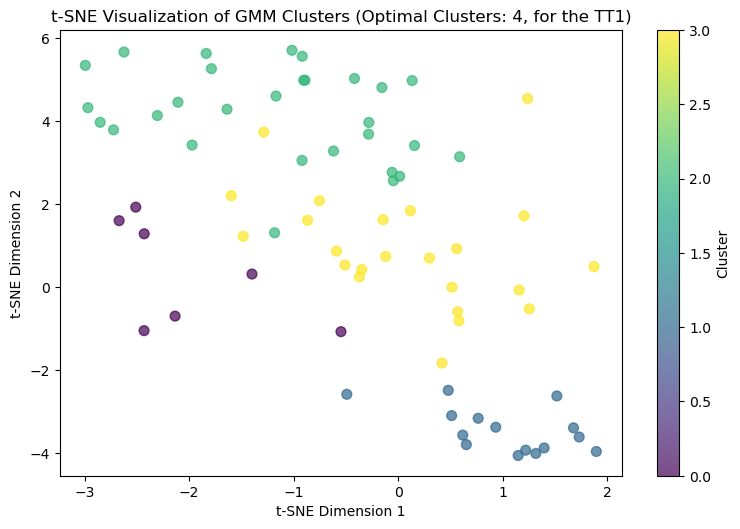

In [ ]:
import itertools
os.environ["OMP_NUM_THREADS"] = "1"

combinations = []
for r in range(1, len(motor_tests) + 1):
    combinations.extend(itertools.combinations(motor_tests, r))

for combo in combinations:
    if len(combo)>1:
    # Select the columns based on the combination        
        plt.figure(figsize=(15, 10))
        for idx, (file_path, title_suffix) in enumerate(zip(file_paths, plot_titles), start=1):
            data = pd.read_excel(file_path)        
            # Filter the motor tests
            data_motor_tests = data[list(combo)]
            # Data standarizazion
            scaler = StandardScaler()
            data_scaled = scaler.fit_transform(data_motor_tests)

            # To find the optimal nb of clusters
            bic_scores = []
            n_clusters_range = range(1, 11)
            for n in n_clusters_range:
                gmm = GaussianMixture(n_components=n, random_state=42)
                gmm.fit(data_scaled)
                bic_scores.append(gmm.bic(data_scaled))

            optimal_clusters = n_clusters_range[bic_scores.index(min(bic_scores))]

            # GMM for optimal number of clusters
            gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)
            gmm.fit(data_scaled)

            data_motor_tests.loc[:, "Cluster"] = gmm.predict(data_scaled)
            if optimal_clusters>1:
                silhouette = silhouette_score(data_scaled, gmm.predict(data_scaled))
                dbi = davies_bouldin_score(data_scaled, gmm.predict(data_scaled))
                ch_score = calinski_harabasz_score(data_scaled, gmm.predict(data_scaled))

            if (silhouette>0.2 and dbi<3 and ch_score>20 and optimal_clusters<5):
                # PCA reduction to 2 dimensions

                tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
                data_tsne = tsne.fit_transform(data_scaled)
                print(f"Calinski-Harabasz Index: {ch_score}")
                print(f"Davies-Bouldin Index: {dbi}")
                print(f"Silhouette Score: {silhouette}")
                plt.subplot(2, 2, idx)
                scatter = plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=data_motor_tests["Cluster"], cmap="viridis", s=50, alpha=0.7)
                plt.title(f"t-SNE Visualization of GMM Clusters (Optimal Clusters: {optimal_clusters}, for the T{title_suffix})")
                plt.xlabel("t-SNE Dimension 1")
                plt.ylabel("t-SNE Dimension 2")
                plt.colorbar(scatter, label="Cluster")



        plt.tight_layout()
        plt.show()




Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 0]), 'silhouette_score': 0.5769706488708045, 'dbi': 0.5255555400769487, 'ch_score': 64.58802230113706}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


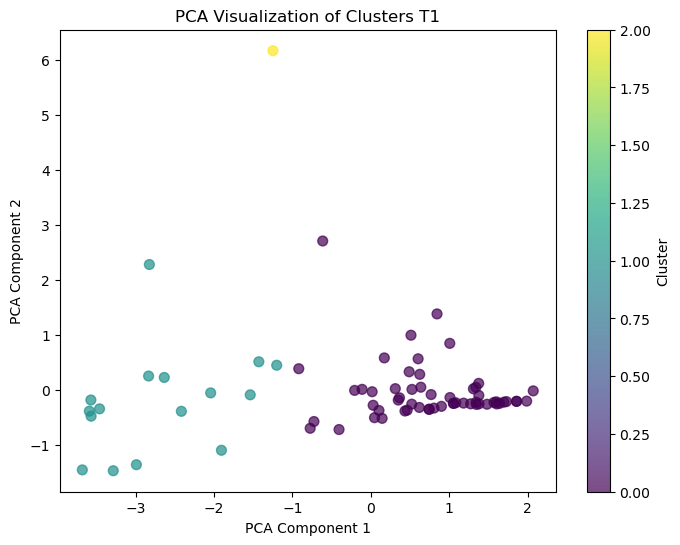


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0,  1,  0, -1, -1, -1,  0,  0, -1, -1, -1,  0,  0,  0,  0,  0,  0,
       -1, -1,  0,  0, -1, -1, -1,  0,  0,  0, -1, -1, -1,  0, -1,  1,  0,
       -1,  0,  0,  0,  0,  0,  0, -1,  0,  0, -1,  0,  0,  0, -1, -1,  0,
       -1,  0,  0,  1, -1, -1, -1, -1, -1, -1,  0,  1, -1, -1, -1, -1,  0,
        1, -1, -1,  0,  0, -1], dtype=int64), 'silhouette_score': 0.08275927129553734, 'dbi': 1.152952021581837, 'ch_score': 22.368445799978353}


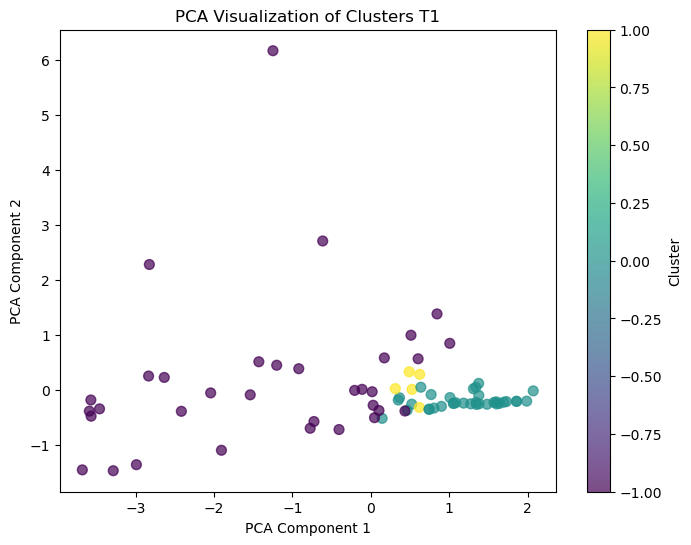


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 1, 2, 2,
       2, 0, 0, 0, 0, 0, 0, 0], dtype=int64), 'silhouette_score': 0.5956403872774467, 'dbi': 0.6931105122157857, 'ch_score': 68.18422450208716}


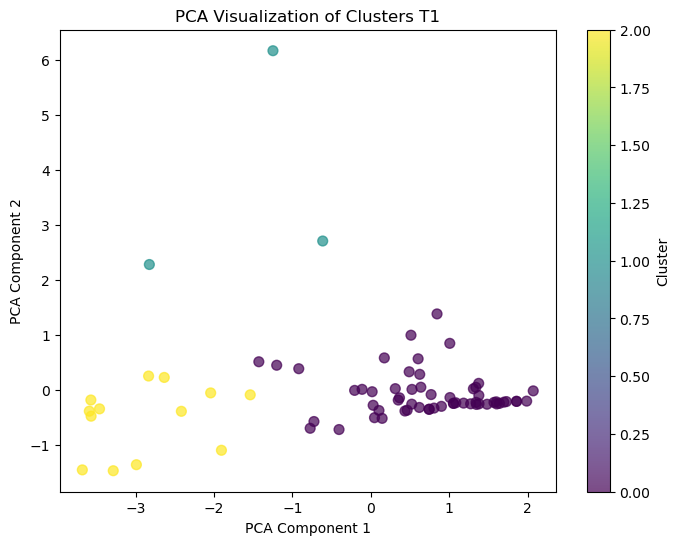


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([2, 2, 2, 1, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 1, 0, 2, 2, 2, 2,
       1, 0, 2, 2, 2, 0, 1, 0, 2, 0, 0, 2, 0, 2, 2, 2, 1, 0, 1, 2, 2, 2,
       2, 1, 0, 0, 2, 2, 0, 0, 1, 2, 0, 0, 0, 0, 2, 2, 2, 0, 1, 1]), 'silhouette_score': 0.3983323448960876, 'dbi': 0.9531429375789768, 'ch_score': 60.90714092500935}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


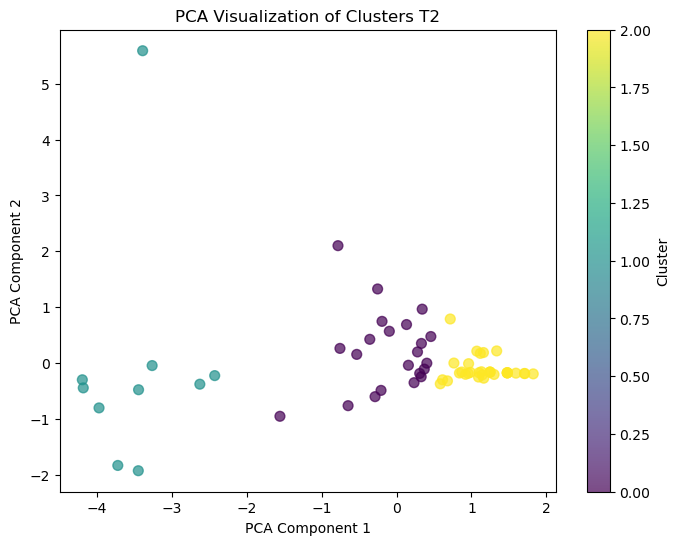


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0,  0,  0, -1,  0, -1, -1, -1, -1, -1,  0,  0,  0,  0,  0,  0, -1,
       -1,  0,  0,  0,  0, -1, -1,  0,  0, -1, -1, -1,  0,  0, -1, -1,  0,
       -1,  0,  0,  0, -1, -1, -1,  0,  0,  0,  0, -1, -1, -1,  0,  0, -1,
       -1, -1,  0, -1, -1, -1, -1,  0,  0,  0, -1, -1, -1], dtype=int64), 'silhouette_score': 0.32862650260747983, 'dbi': 1.0605893514722147, 'ch_score': 31.961494389213023}


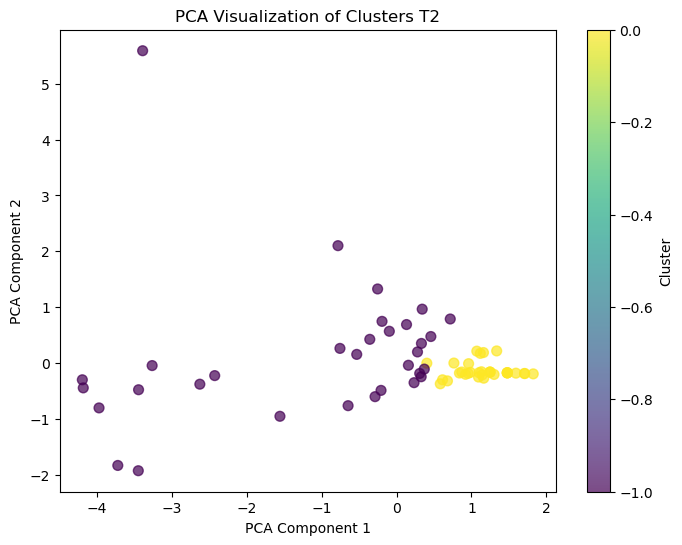


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1],
      dtype=int64), 'silhouette_score': 0.6599790162949738, 'dbi': 0.4456199532058995, 'ch_score': 75.17605161466176}


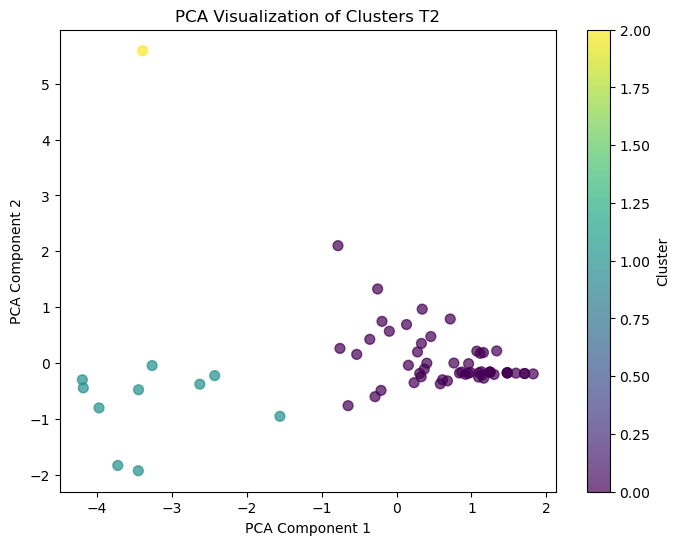


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([2, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 1, 0, 2, 2, 0, 0, 2, 2, 2, 2,
       2, 0, 2, 0, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 1,
       2, 2, 2, 2, 0, 2, 2, 0]), 'silhouette_score': 0.4432232240252547, 'dbi': 0.8138604281937672, 'ch_score': 52.20407803465189}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


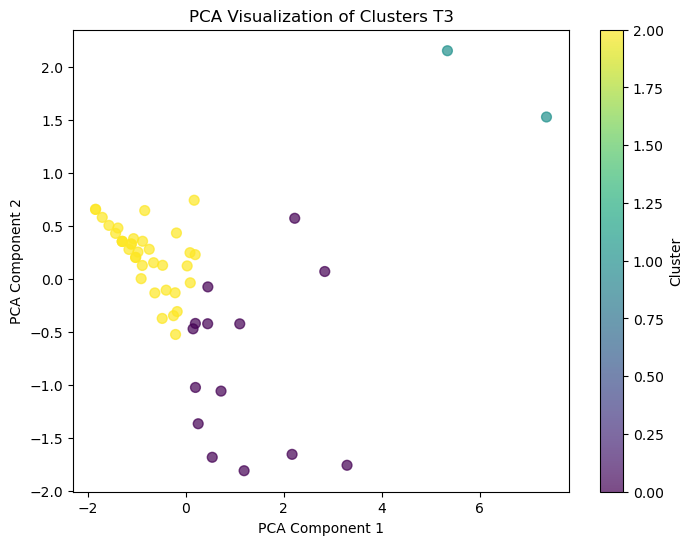


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0,  0, -1,  0, -1, -1,  0,  0,  0,  0,  0, -1, -1, -1,  0,  0, -1,
       -1, -1, -1, -1,  0,  0, -1, -1, -1, -1, -1, -1,  0,  0, -1, -1, -1,
        0,  0,  0, -1, -1, -1,  0, -1,  0, -1,  0,  0, -1, -1, -1,  0, -1,
       -1], dtype=int64), 'silhouette_score': 0.19267543682667637, 'dbi': 1.340070316109018, 'ch_score': 11.82185797251576}


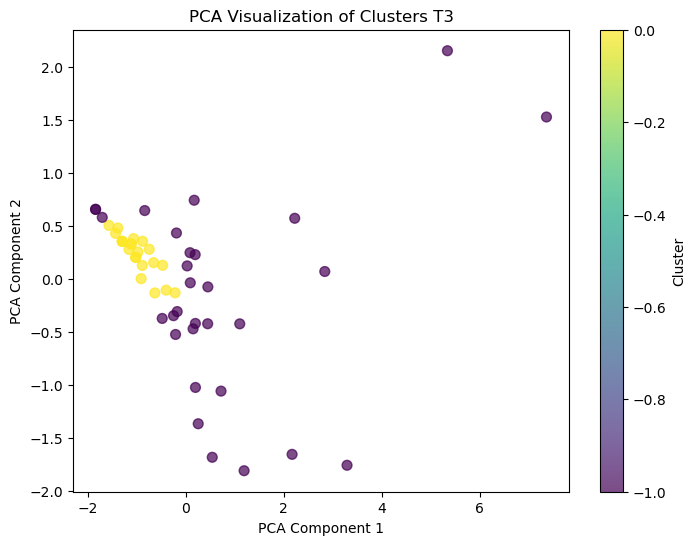


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([2, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 1, 0, 2, 2, 0, 0, 2, 2, 2, 2,
       2, 0, 2, 0, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 1,
       2, 2, 0, 2, 0, 2, 2, 0], dtype=int64), 'silhouette_score': 0.4386836537039287, 'dbi': 0.8198538674709105, 'ch_score': 51.8375825476531}


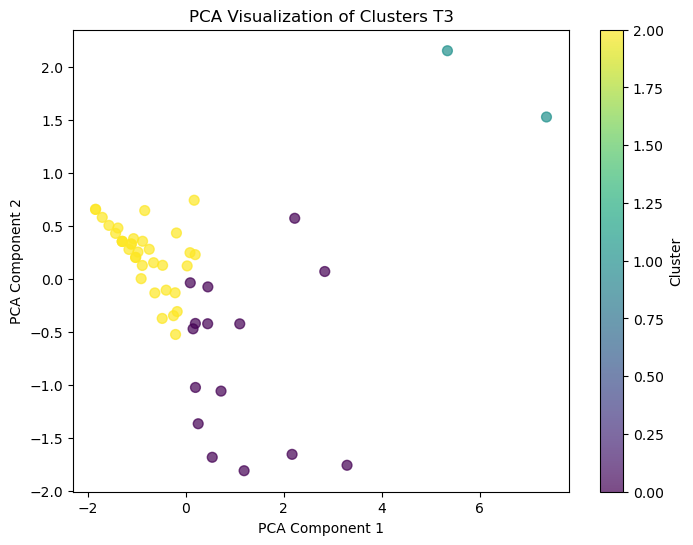


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 1, 0, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 1]), 'silhouette_score': 0.44893094064205563, 'dbi': 0.9537524849934568, 'ch_score': 34.606306649316856}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


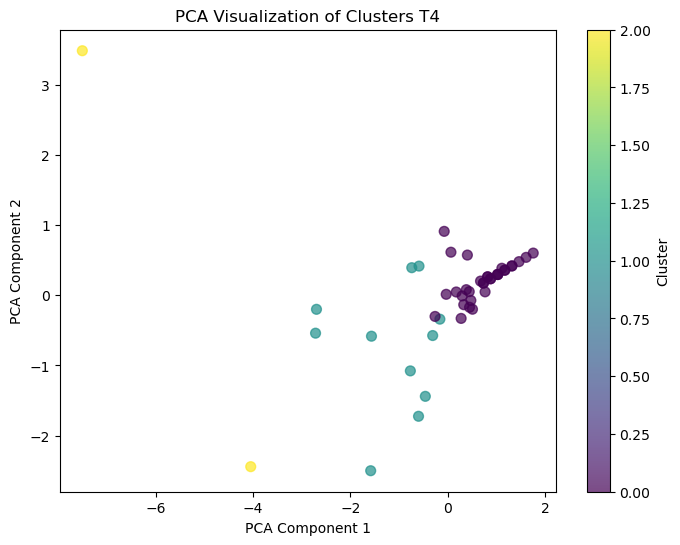


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0, -1,  0, -1, -1, -1, -1, -1,  0,  0,  0,  0, -1, -1,  0,  0,  0,
        0, -1,  0,  0,  0, -1, -1,  0, -1,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0, -1, -1,  0,  0,  0, -1, -1, -1, -1], dtype=int64), 'silhouette_score': 0.32599241531864004, 'dbi': 1.4265275849044987, 'ch_score': 12.534908821556629}


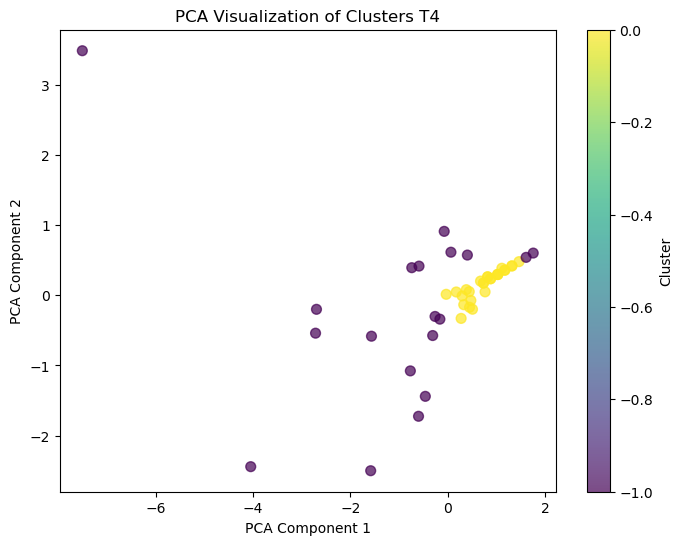


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1], dtype=int64), 'silhouette_score': 0.5423266967536841, 'dbi': 0.6587122242036431, 'ch_score': 42.64883037045425}


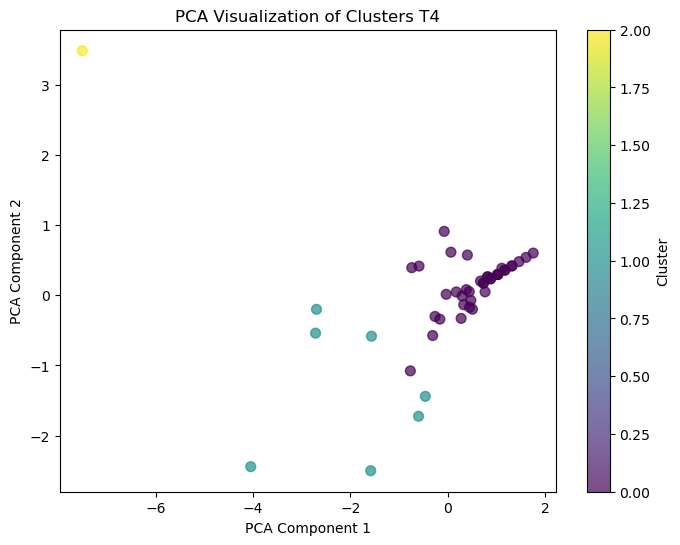

In [25]:
import pandas as pd
import numpy as np
import itertools
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA

# Step 1: Data Preprocessing
def preprocess_data(data, features, impute_strategy="mean", scale=True):
    """
    Preprocesses data by imputing missing values and scaling.
    Args:
        data (pd.DataFrame): Input dataset.
        features (list): List of features to include.
        impute_strategy (str): Strategy for handling NaNs.
        scale (bool): Whether to scale features.
    Returns:
        np.array: Preprocessed data.
    """
    data_selected = data[features]
    imputer = SimpleImputer(strategy=impute_strategy)
    data_imputed = pd.DataFrame(imputer.fit_transform(data_selected), columns=features)

    if scale:
        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(data_imputed)
        return data_scaled
    return data_imputed

# Step 2: Pairwise Feature Combinations
def generate_feature_combinations(features):
    """
    Generate all pairwise combinations of features for clustering exploration.
    Args:
        features (list): List of feature names.
    Returns:
        list: List of tuples containing feature combinations.
    """
    return list(itertools.combinations(features, 4))

# Step 3: Clustering and Validation
def cluster_and_evaluate(data, algorithm="kmeans", params=None):
    """
    Perform clustering and evaluate using internal metrics.
    Args:
        data (np.array): Preprocessed data.
        algorithm (str): Clustering algorithm to use ("kmeans", "dbscan", "hac").
        params (dict): Parameters for the chosen clustering algorithm.
    Returns:
        dict: Dictionary with clustering results and metrics.
    """
    if algorithm == "kmeans":
        model = KMeans(n_clusters=params.get("n_clusters", 3), random_state=42)
    elif algorithm == "dbscan":
        model = DBSCAN(eps=params.get("eps", 0.5), min_samples=params.get("min_samples", 5))
    elif algorithm == "hac":
        model = AgglomerativeClustering(n_clusters=params.get("n_clusters", 3), linkage=params.get("linkage", "ward"))
    else:
        raise ValueError("Unsupported algorithm")

    clusters = model.fit_predict(data)
    silhouette = silhouette_score(data, clusters) if len(set(clusters)) > 1 else None
    dbi = davies_bouldin_score(data, clusters) if len(set(clusters)) > 1 else None
    ch_score = calinski_harabasz_score(data, clusters) if len(set(clusters)) > 1 else None

    return {
        "clusters": clusters,
        "silhouette_score": silhouette,
        "dbi": dbi,
        "ch_score": ch_score,
    }

# Step 4: Visualize Clusters
def visualize_clusters(data, clusters,idx):
    """
    Visualize clusters in 2D using PCA.
    Args:
        data (np.array): Data to visualize.
        clusters (np.array): Cluster labels.
    """
    pca = PCA(n_components=2, random_state=42)
    data_reduced = pca.fit_transform(data)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=clusters, cmap="viridis", s=50, alpha=0.7)
    plt.colorbar(scatter, label="Cluster")
    plt.title(f"PCA Visualization of Clusters T{idx+1}")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()

# Step 5: Main Pipeline
def main_pipeline(data, features, algorithms, params, idx):
    """
    Run the clustering pipeline with iterative exploration and visualization.
    Args:
        data (pd.DataFrame): Input dataset.
        features (list): List of feature names.
        algorithms (list): List of clustering algorithms to test.
        params (dict): Parameters for each algorithm.
    """
    results = []
    for algo in algorithms:
        for combo in generate_feature_combinations(features):
            print(f"\nTesting {algo} with features: {combo}")
            data_preprocessed = preprocess_data(data, list(combo))
            result = cluster_and_evaluate(data_preprocessed, algorithm=algo, params=params.get(algo, {}))
            print(f"Results: {result}")
            visualize_clusters(data_preprocessed, result["clusters"],idx)
            results.append({"features": combo, "algorithm": algo, "metrics": result})
    return results

# Run the pipeline
file_paths = [
    os.path.join(cd,r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT1.xlsx"),
    os.path.join(cd,r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT2.xlsx"),
    os.path.join(cd,r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT3.xlsx"),
    os.path.join(cd,r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT4.xlsx")
]
data = pd.read_excel(file_paths[0])  # Replace with your dataset
features = ["Fugl.Meyer_affected_TOTAL", "BERG", "Ashworth_affected", "Purdue_affected_hand"]
algorithms = ["kmeans", "dbscan", "hac"]
params = {
    "kmeans": {"n_clusters": 3},
    "dbscan": {"eps": 0.5, "min_samples": 5},
    "hac": {"n_clusters": 3, "linkage": "ward"},
}
for idx, path in enumerate(file_paths):
    results = main_pipeline(pd.read_excel(path), features, algorithms, params, idx)


# Clustering pour chaque timepoint pour les features moteurs


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 0]), 'silhouette_score': 0.5609858273046621, 'dbi': 0.7193788518423305, 'ch_score': 72.77936156687042}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


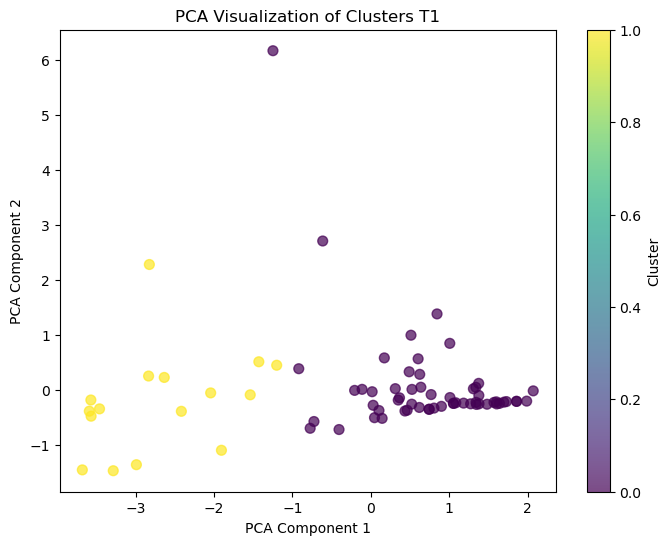


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                         BERG         \
                             mean median        std       mean median   
Cluster                                                                 
0                       55.804782   57.0   4.217191  49.685756   54.0   
1                       14.562500    7.0  18.025792  16.205263    8.5   

                   Ashworth_affected                  Purdue_affected_hand  \
               std              mean median       std                 mean   
Cluster                                                                      
0         8.932203          2.193149   0.00  5.371886             7.674603   
1        14.560754          5.250000   5.75  4.445972             0.083650   

                          
        median       std  
Cluster                   
0          7.0  3.318727  
1          0.0  1.324017  


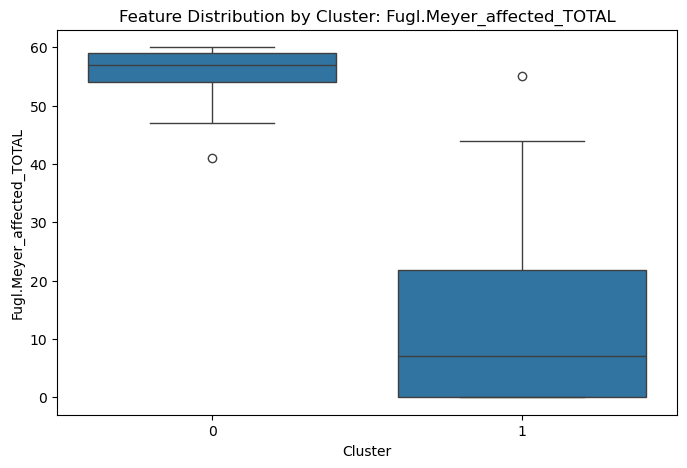

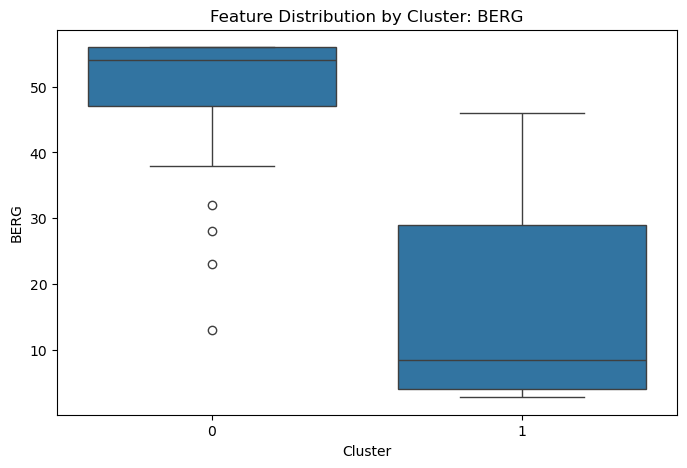

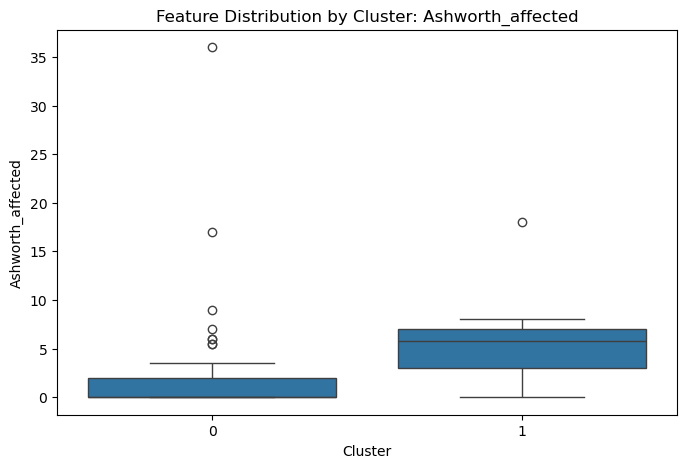

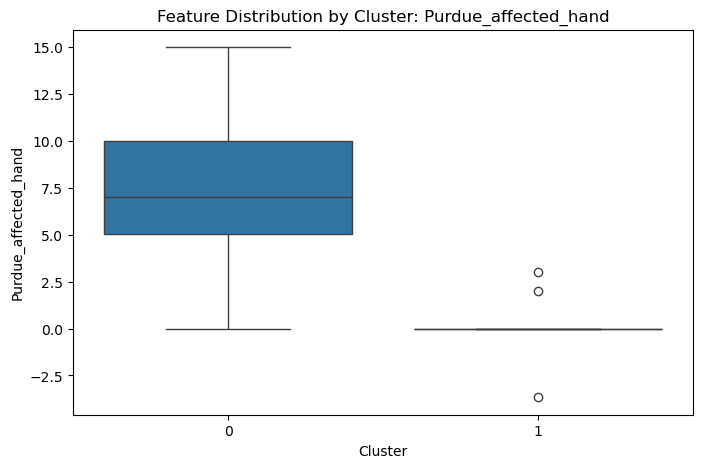


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0,  1,  0, -1, -1, -1,  0,  0, -1, -1, -1,  0,  0,  0,  0,  0,  0,
       -1, -1,  0,  0, -1, -1, -1,  0,  0,  0, -1, -1, -1,  0, -1,  1,  0,
       -1,  0,  0,  0,  0,  0,  0, -1,  0,  0, -1,  0,  0,  0, -1, -1,  0,
       -1,  0,  0,  1, -1, -1, -1, -1, -1, -1,  0,  1, -1, -1, -1, -1,  0,
        1, -1, -1,  0,  0, -1], dtype=int64), 'silhouette_score': 0.08275927129553734, 'dbi': 1.152952021581837, 'ch_score': 22.368445799978353}


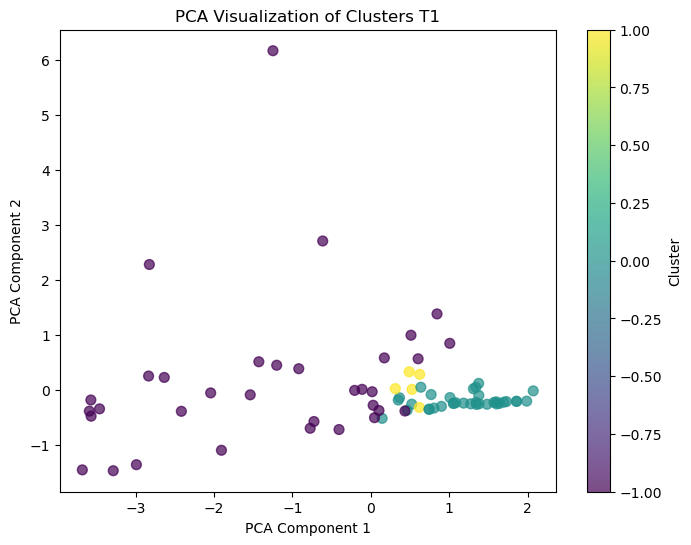


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                             BERG         \
                             mean     median        std       mean median   
Cluster                                                                     
-1                      34.402276  47.143866  22.779071  30.542340   31.5   
 0                      57.600000  58.000000   2.681088  52.503386   55.0   
 1                      56.800000  57.000000   3.271085  53.000000   54.0   

                   Ashworth_affected                  Purdue_affected_hand  \
               std              mean median       std                 mean   
Cluster                                                                      
-1       19.048098          5.441176   5.25  6.966114             2.729127   
 0        4.973040          0.454551   0.00  0.720189             9.419287   
 1        3.741657          2.058677   2.00  1.348654             4.800000   

                             
        

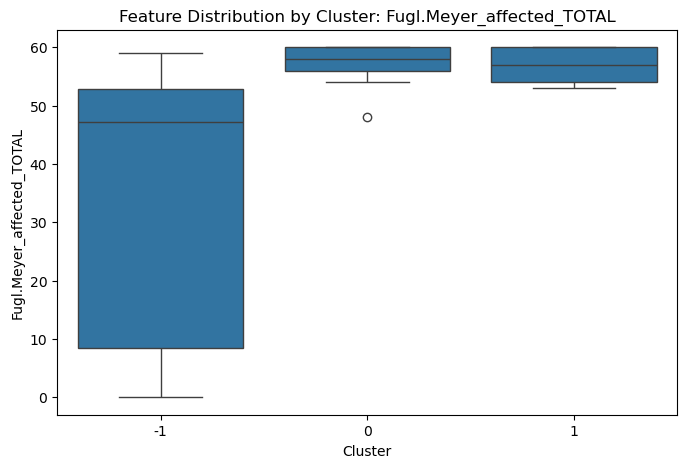

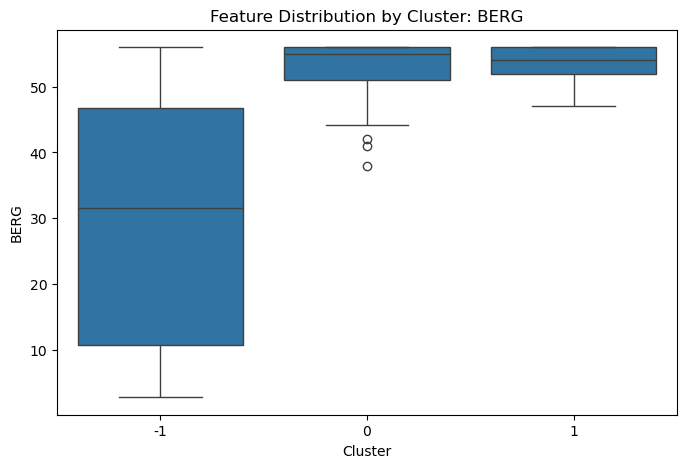

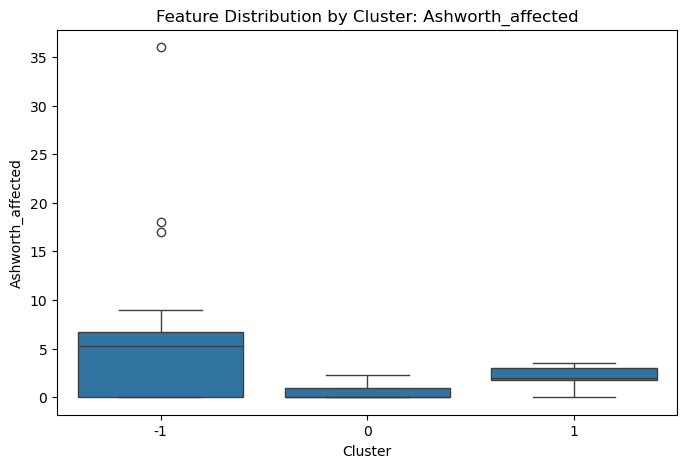

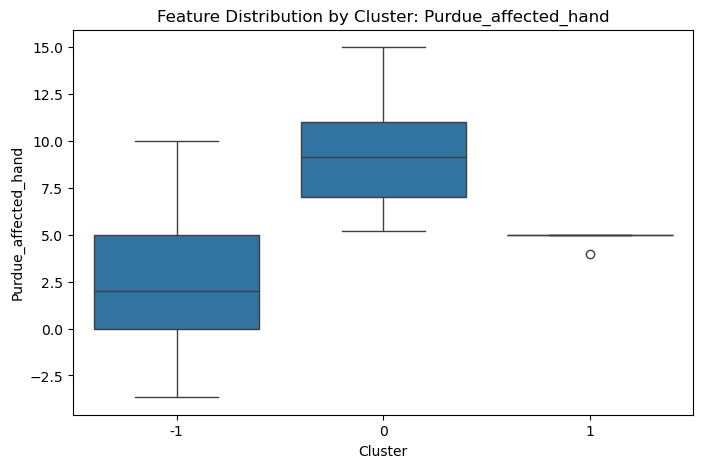


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1], dtype=int64), 'silhouette_score': 0.5776851576081785, 'dbi': 0.8274963271504157, 'ch_score': 69.34530723518186}


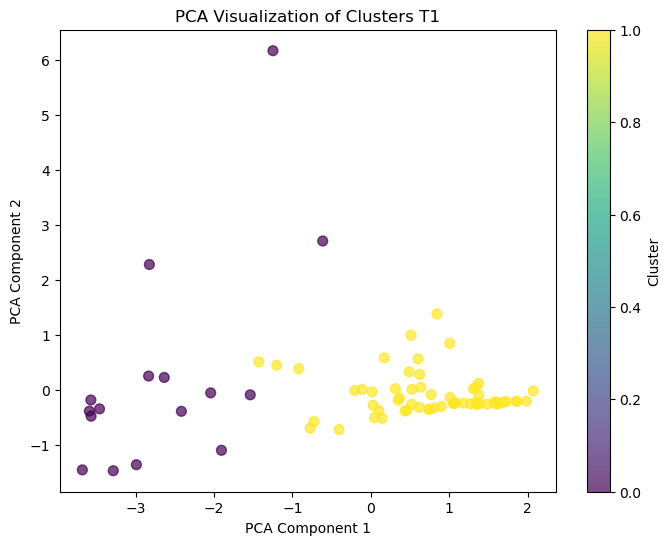


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                         BERG         \
                             mean median        std       mean median   
Cluster                                                                 
0                       15.187500    7.0  19.246536  19.111513    8.5   
1                       55.632369   57.0   4.487995  48.884032   54.0   

                   Ashworth_affected                  Purdue_affected_hand  \
               std              mean median       std                 mean   
Cluster                                                                      
0        17.596881          7.750000   5.75  9.224966             0.458650   
1        10.280664          1.503494   0.00  2.266166             7.571155   

                          
        median       std  
Cluster                   
0          0.0  1.880452  
1          7.0  3.477420  


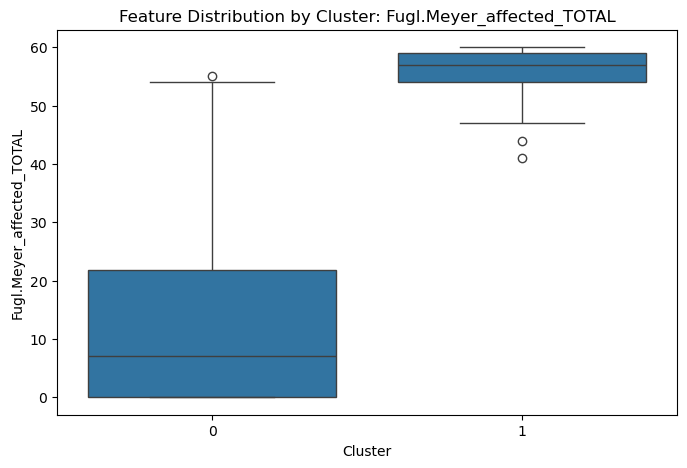

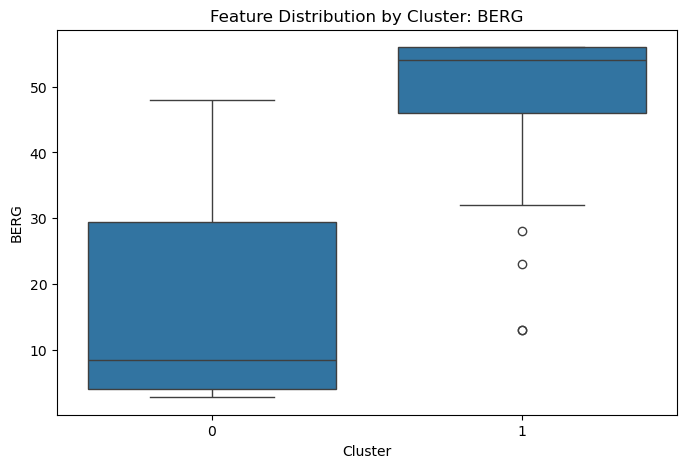

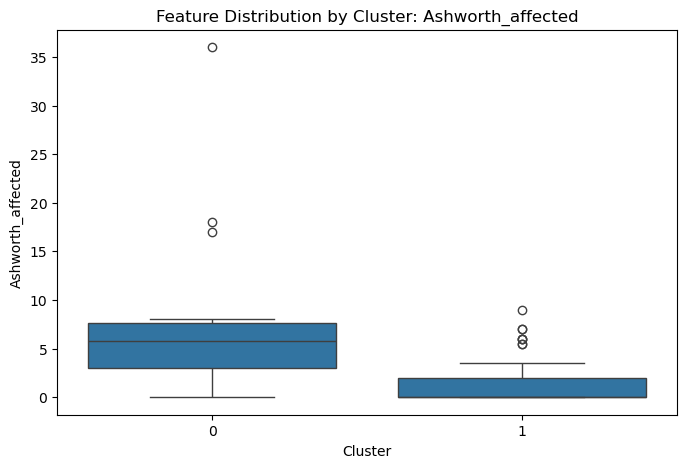

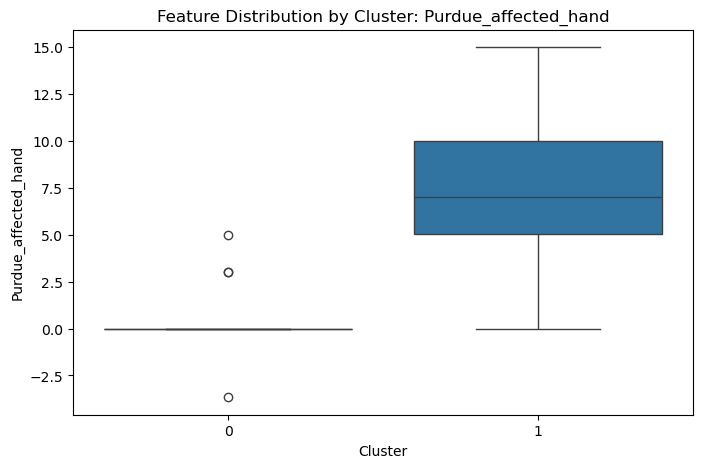


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]), 'silhouette_score': 0.6584147030171748, 'dbi': 0.6915602819733674, 'ch_score': 81.640404160068}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


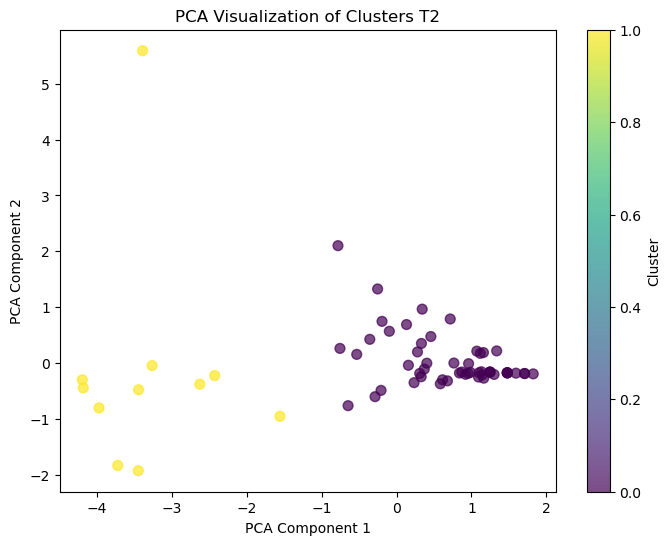


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                         BERG         \
                             mean median        std       mean median   
Cluster                                                                 
0                       56.811321   58.0   4.437847  52.207547   55.0   
1                       13.363636   13.0  14.403282  17.857328    7.0   

                   Ashworth_affected                  Purdue_affected_hand  \
               std              mean median       std                 mean   
Cluster                                                                      
0         5.620561          1.566038    0.0  2.511584             9.056604   
1        18.643033          7.118019    6.0  8.780295            -0.219272   

                          
        median       std  
Cluster                   
0          9.0  3.483009  
1          0.0  1.514489  


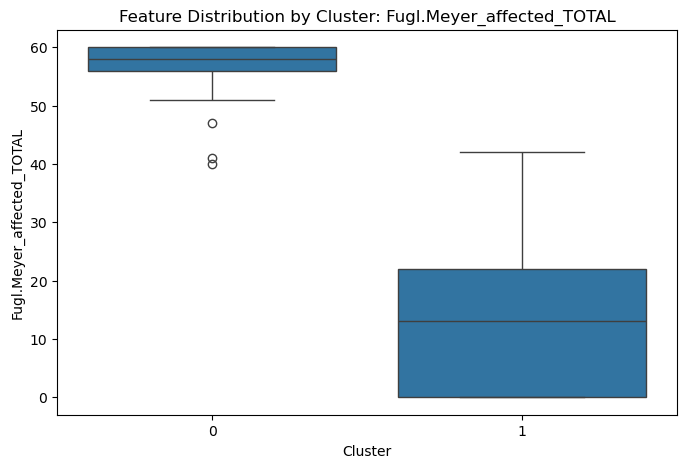

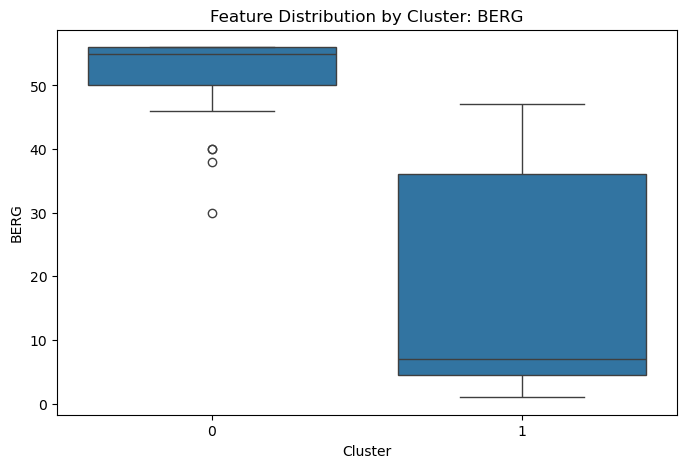

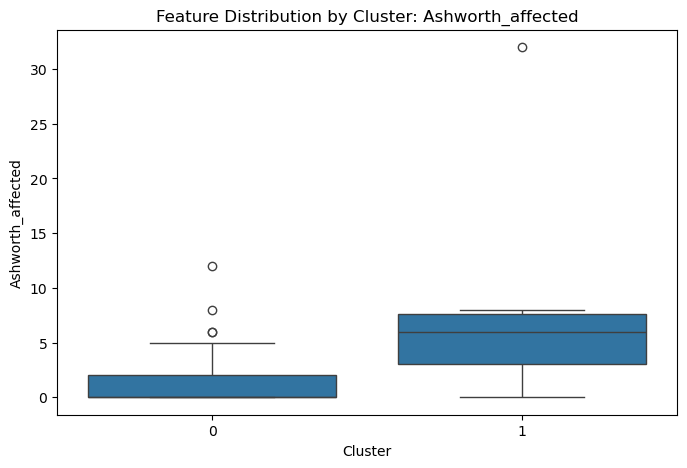

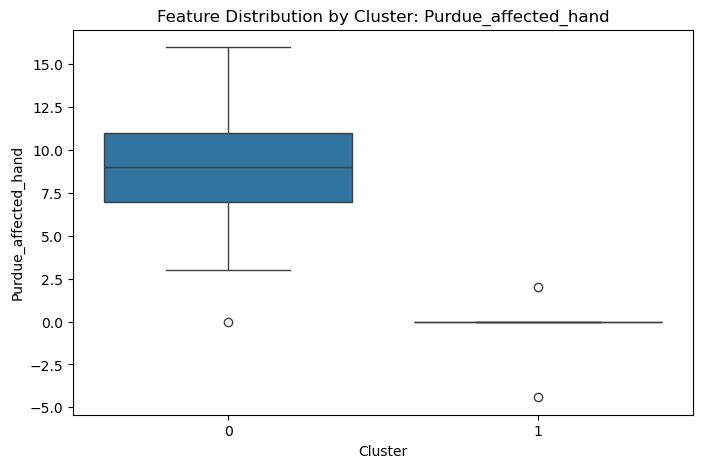


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0,  0,  0, -1,  0, -1, -1, -1, -1, -1,  0,  0,  0,  0,  0,  0, -1,
       -1,  0,  0,  0,  0, -1, -1,  0,  0, -1, -1, -1,  0,  0, -1, -1,  0,
       -1,  0,  0,  0, -1, -1, -1,  0,  0,  0,  0, -1, -1, -1,  0,  0, -1,
       -1, -1,  0, -1, -1, -1, -1,  0,  0,  0, -1, -1, -1], dtype=int64), 'silhouette_score': 0.32862650260747983, 'dbi': 1.0605893514722147, 'ch_score': 31.961494389213023}


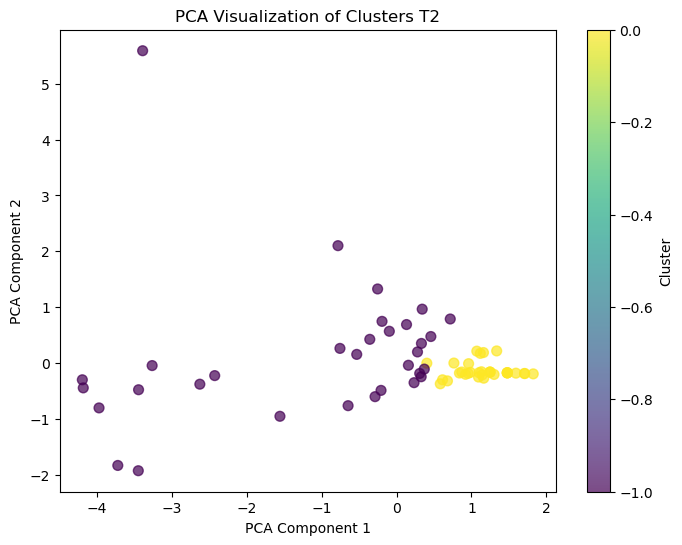


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                         BERG         \
                             mean median        std       mean median   
Cluster                                                                 
-1                        40.1250   51.5  21.787463  37.794707   46.0   
 0                        58.5625   59.5   2.124170  54.812500   56.0   

                   Ashworth_affected                  Purdue_affected_hand  \
               std              mean median       std                 mean   
Cluster                                                                      
-1       18.895534          4.665569    4.0  5.870107             3.830875   
 0        2.306198          0.375000    0.0  0.740532            11.093750   

                          
        median       std  
Cluster                   
-1         4.0  3.753907  
 0        11.0  2.248431  


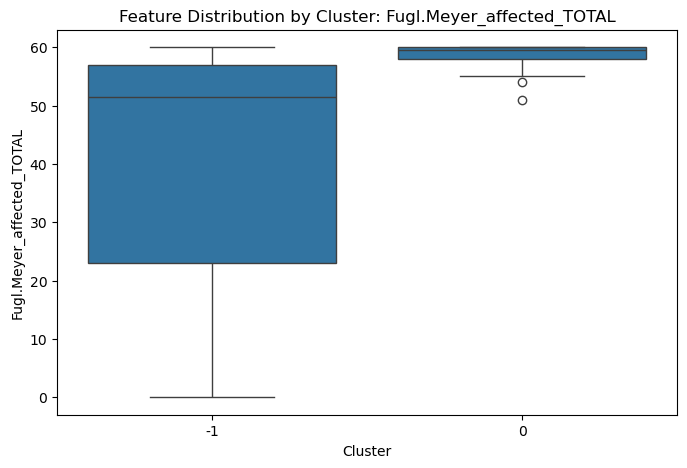

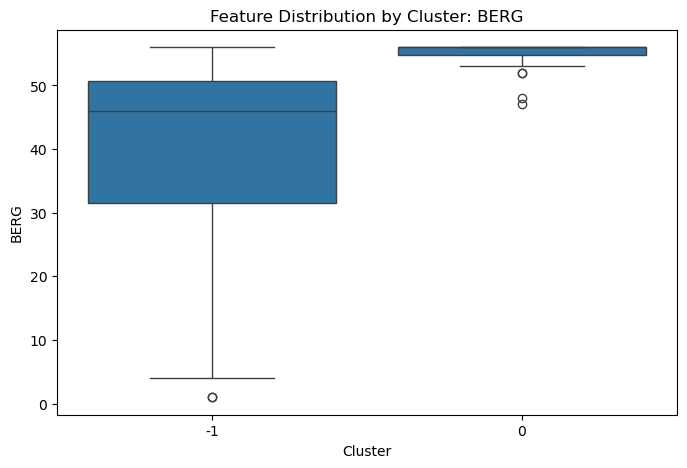

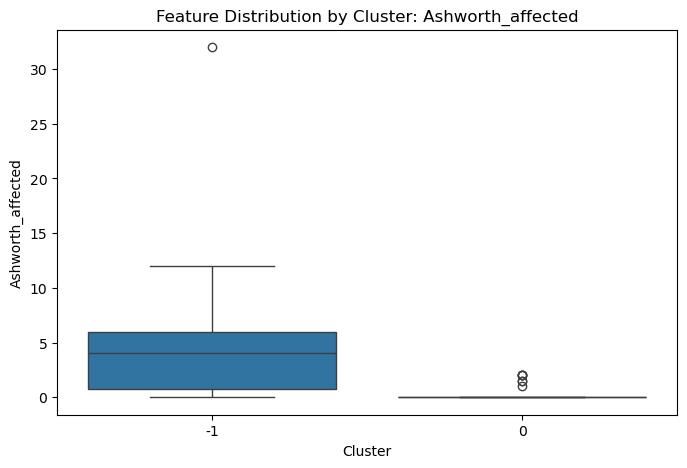

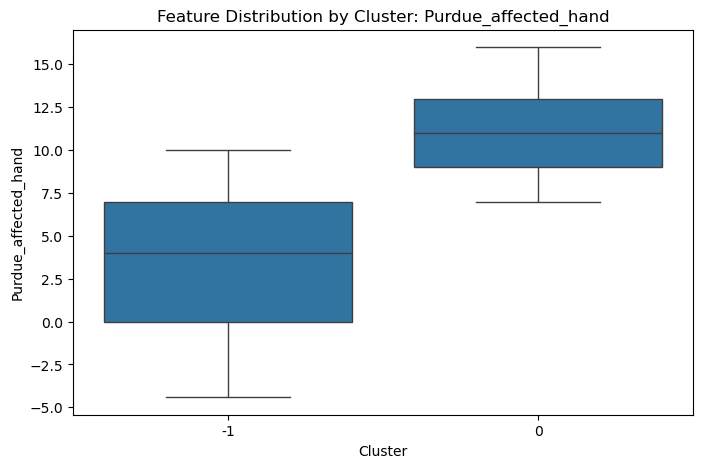


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0],
      dtype=int64), 'silhouette_score': 0.6584147030171748, 'dbi': 0.6915602819733674, 'ch_score': 81.640404160068}


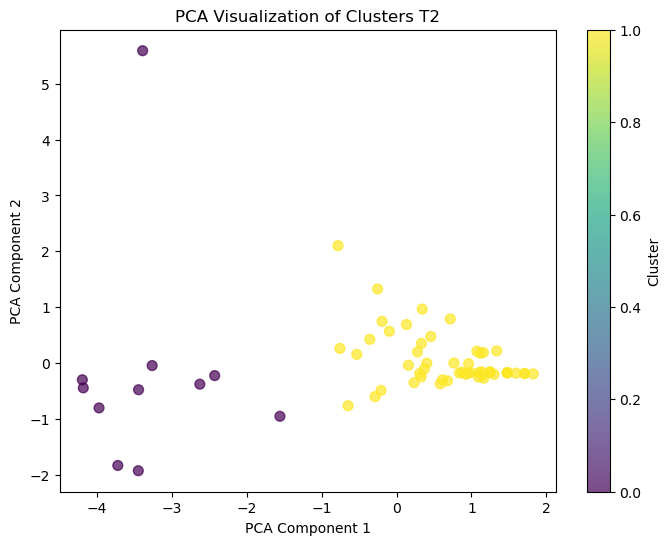


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                         BERG         \
                             mean median        std       mean median   
Cluster                                                                 
0                       13.363636   13.0  14.403282  17.857328    7.0   
1                       56.811321   58.0   4.437847  52.207547   55.0   

                   Ashworth_affected                  Purdue_affected_hand  \
               std              mean median       std                 mean   
Cluster                                                                      
0        18.643033          7.118019    6.0  8.780295            -0.219272   
1         5.620561          1.566038    0.0  2.511584             9.056604   

                          
        median       std  
Cluster                   
0          0.0  1.514489  
1          9.0  3.483009  


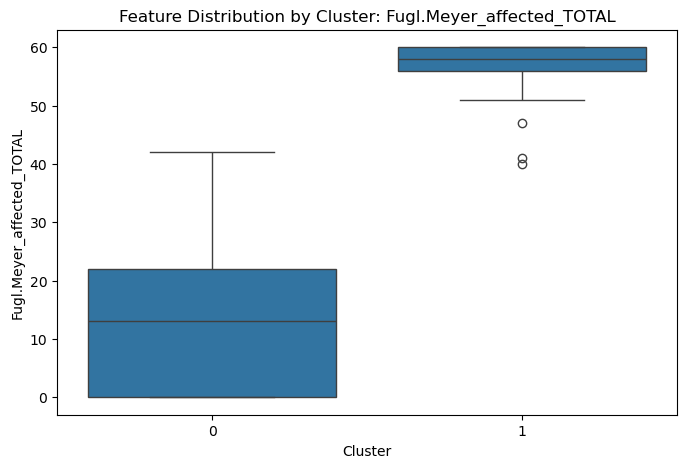

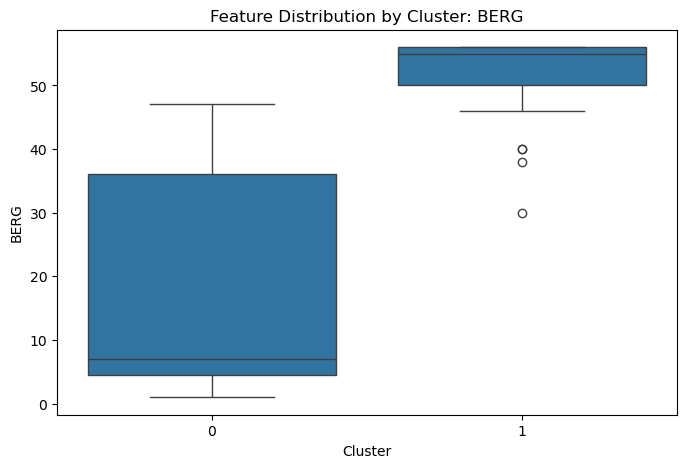

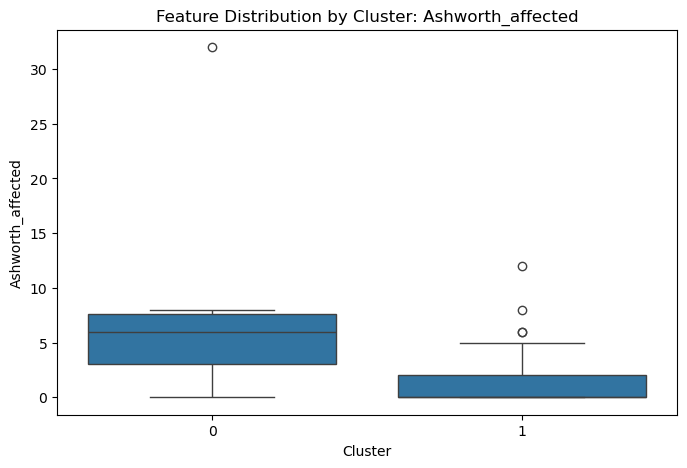

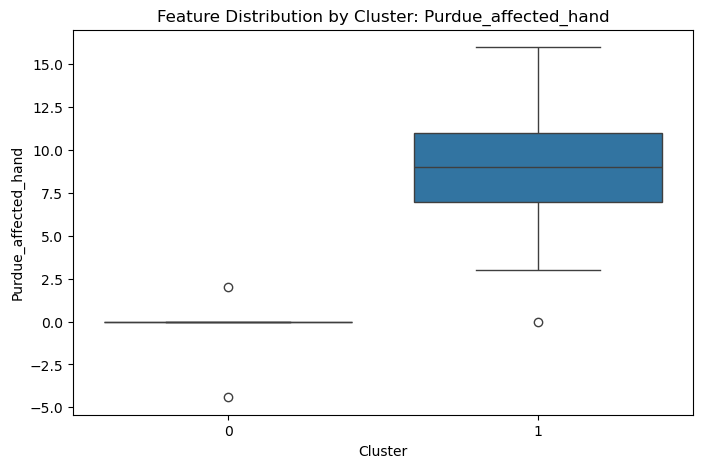


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0]), 'silhouette_score': 0.723354237037764, 'dbi': 0.37234118492075974, 'ch_score': 39.73774469793343}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


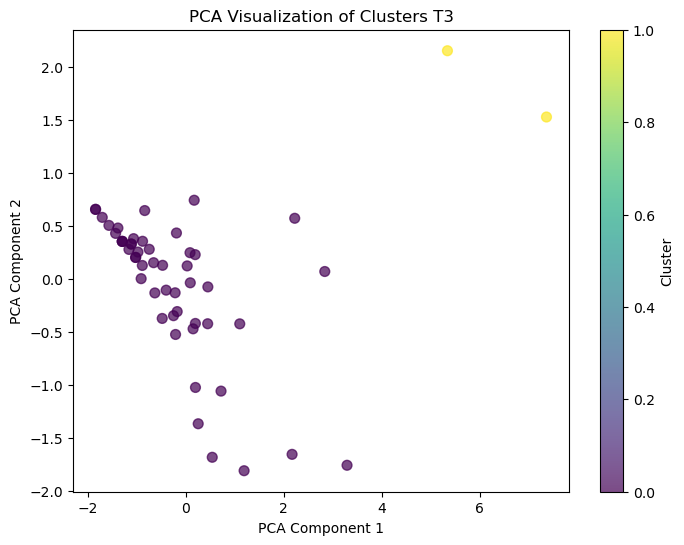


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                        BERG         \
                             mean median       std       mean median   
Cluster                                                                
0                            57.5   59.0  3.500729  53.476466   55.5   
1                             4.0    4.0  5.656854  46.000000   46.0   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
0        3.608305              0.93    0.0  1.653722              9.00416   
1        5.656854              9.50    9.5  2.121320              0.00000   

                          
        median       std  
Cluster                   
0          9.0  3.252812  
1          0.0  0.000000  


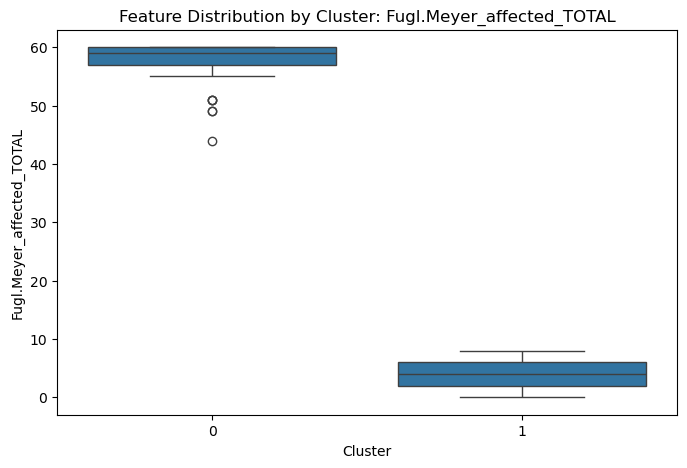

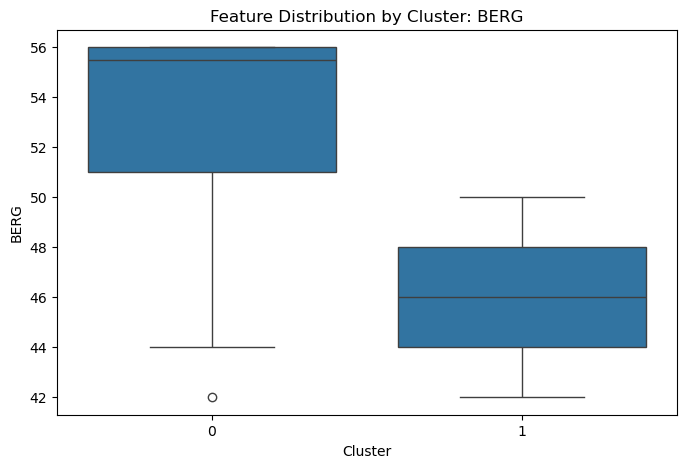

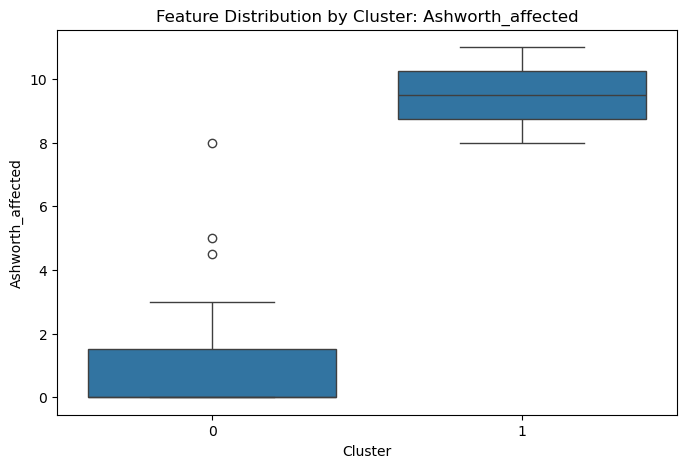

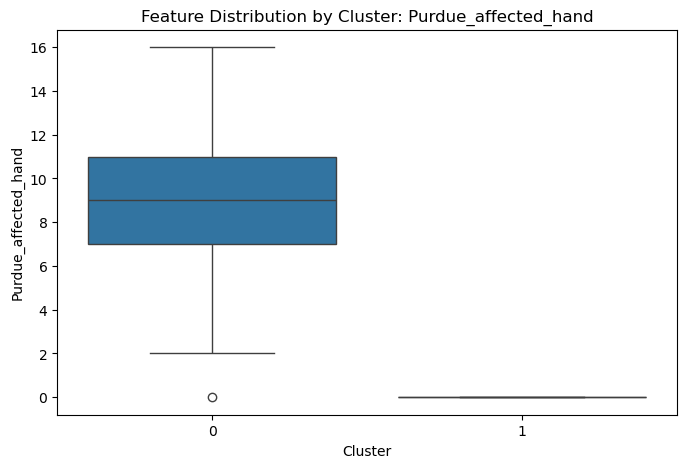


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0,  0, -1,  0, -1, -1,  0,  0,  0,  0,  0, -1, -1, -1,  0,  0, -1,
       -1, -1, -1, -1,  0,  0, -1, -1, -1, -1, -1, -1,  0,  0, -1, -1, -1,
        0,  0,  0, -1, -1, -1,  0, -1,  0, -1,  0,  0, -1, -1, -1,  0, -1,
       -1], dtype=int64), 'silhouette_score': 0.19267543682667637, 'dbi': 1.340070316109018, 'ch_score': 11.82185797251576}


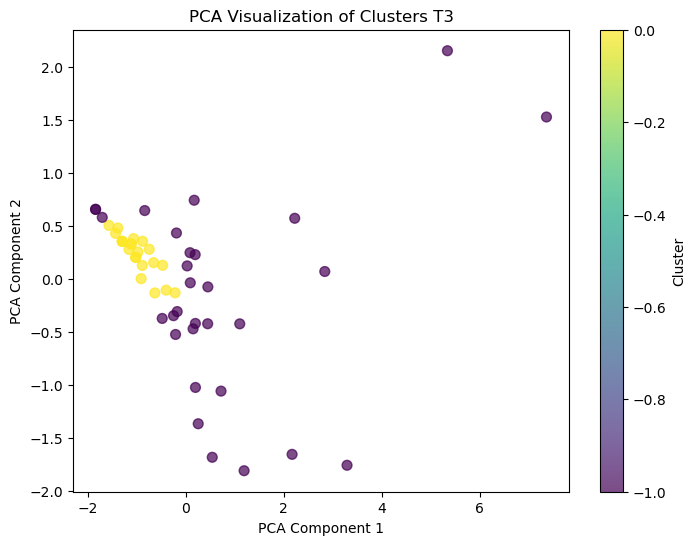


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                         BERG         \
                             mean median        std       mean median   
Cluster                                                                 
-1                      52.833333   57.5  13.926119  51.266667   51.0   
 0                      59.000000   59.5   1.195229  55.810151   56.0   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
-1       4.201259          2.183333    1.5  2.749556             7.533333   
 0       0.413559          0.000000    0.0  0.000000            10.191272   

                              
            median       std  
Cluster                       
-1        8.000000  4.116689  
 0       10.103997  2.107113  


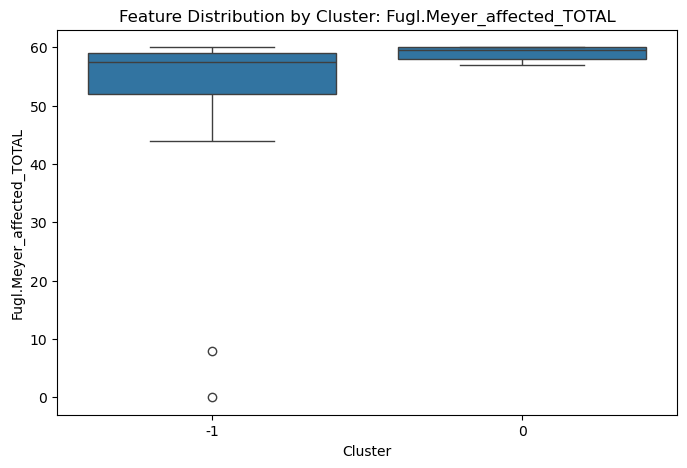

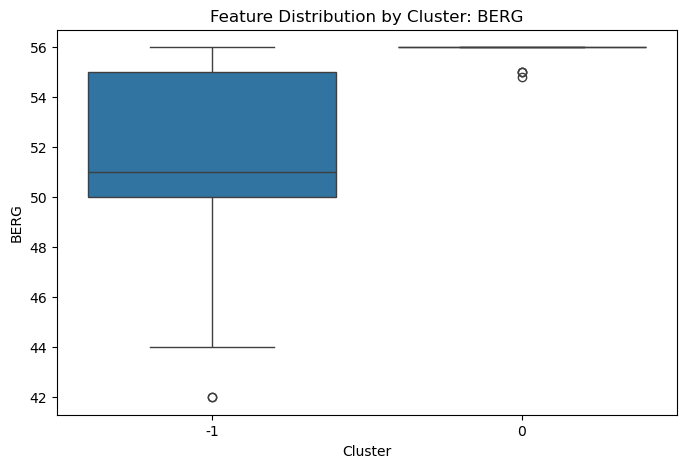

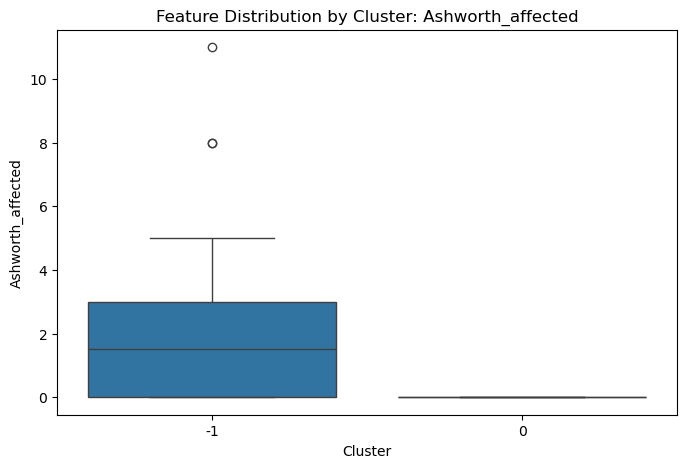

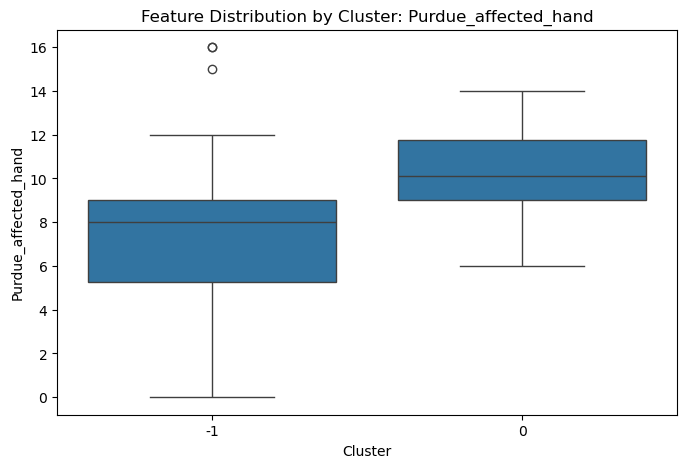


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int64), 'silhouette_score': 0.723354237037764, 'dbi': 0.37234118492075974, 'ch_score': 39.73774469793343}


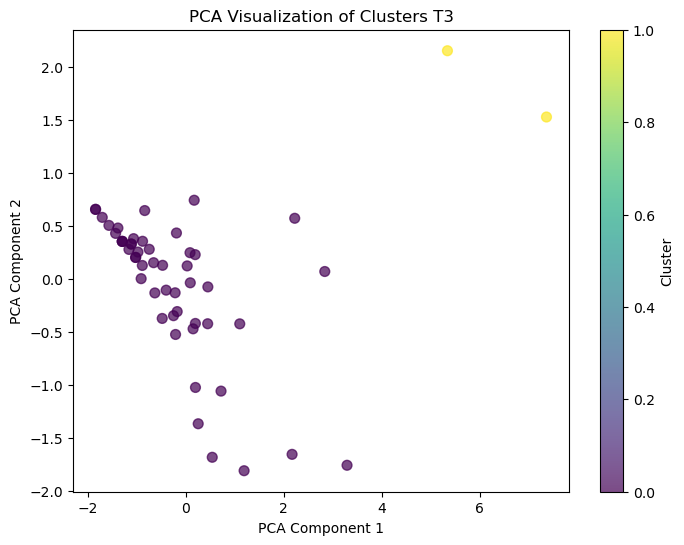


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                        BERG         \
                             mean median       std       mean median   
Cluster                                                                
0                            57.5   59.0  3.500729  53.476466   55.5   
1                             4.0    4.0  5.656854  46.000000   46.0   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
0        3.608305              0.93    0.0  1.653722              9.00416   
1        5.656854              9.50    9.5  2.121320              0.00000   

                          
        median       std  
Cluster                   
0          9.0  3.252812  
1          0.0  0.000000  


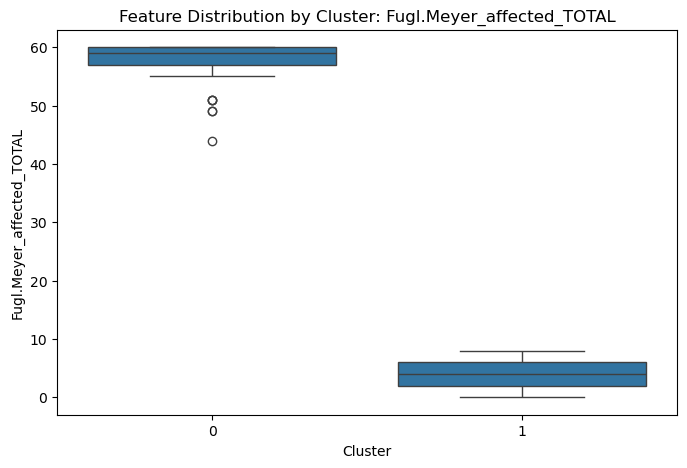

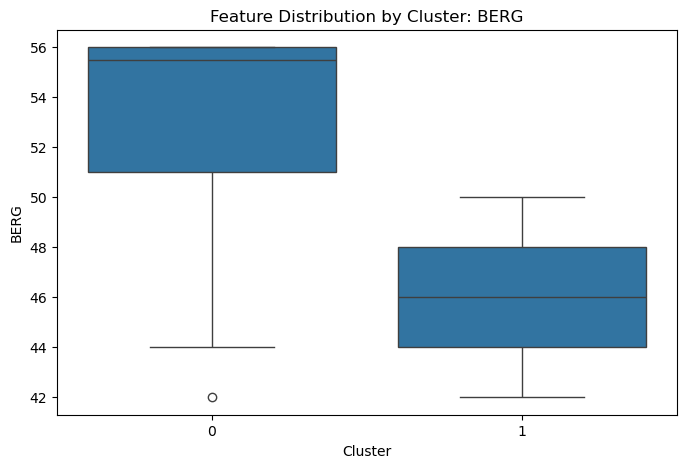

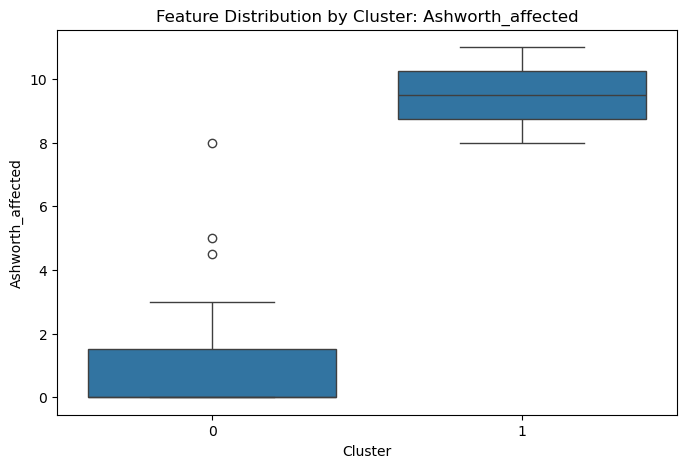

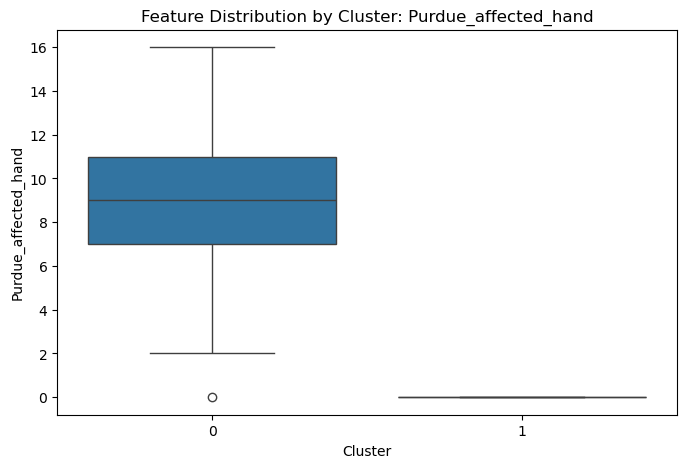


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0]), 'silhouette_score': 0.6120343815272817, 'dbi': 0.9334849727581114, 'ch_score': 33.41635396575601}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


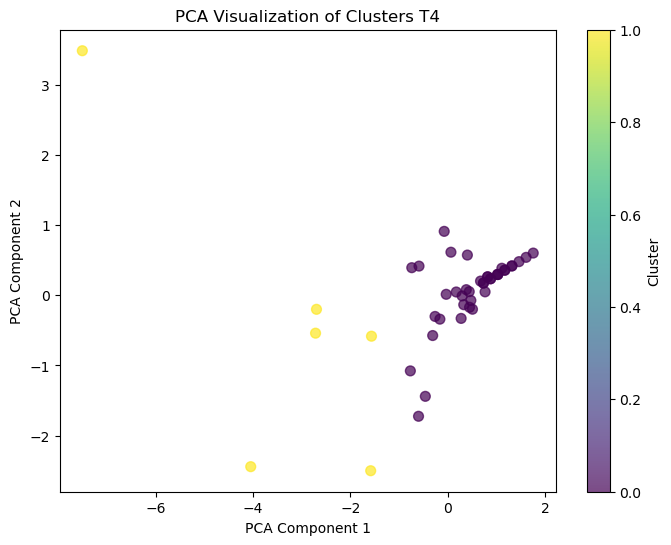


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                         BERG         \
                             mean median        std       mean median   
Cluster                                                                 
0                       58.950000   60.0   2.206633  54.625000   56.0   
1                       42.666667   52.5  20.549128  46.166667   48.0   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
0        2.456676          0.237500    0.0  0.599011            10.450000   
1        4.308906          2.833333    2.5  3.311596             3.166667   

                          
        median       std  
Cluster                   
0         10.0  2.678978  
1          3.5  1.940790  


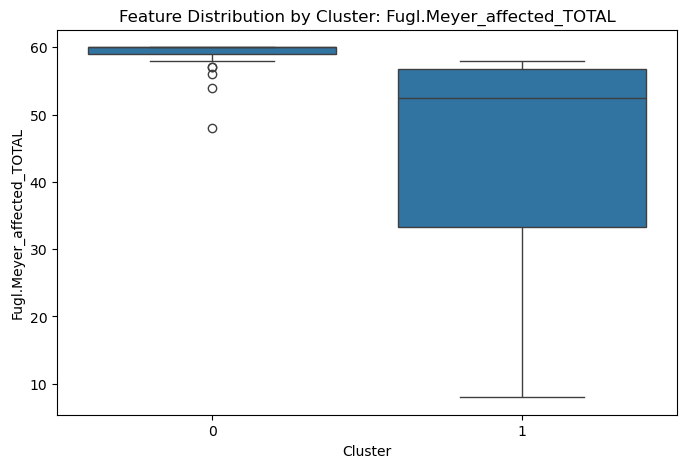

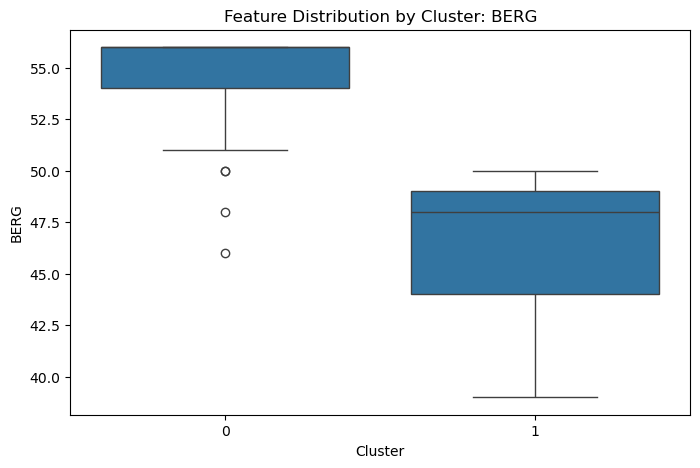

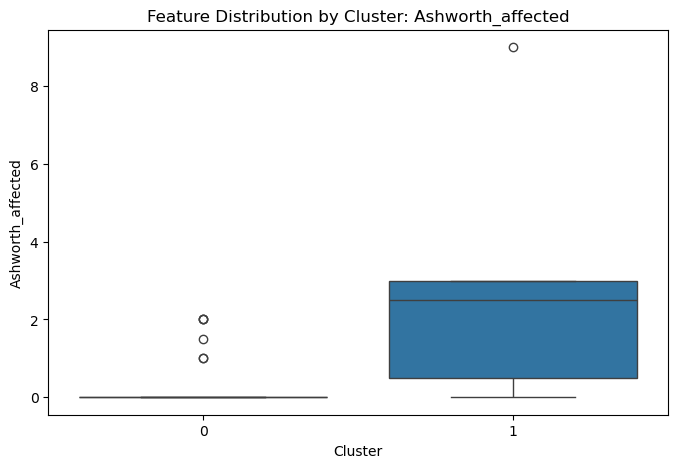

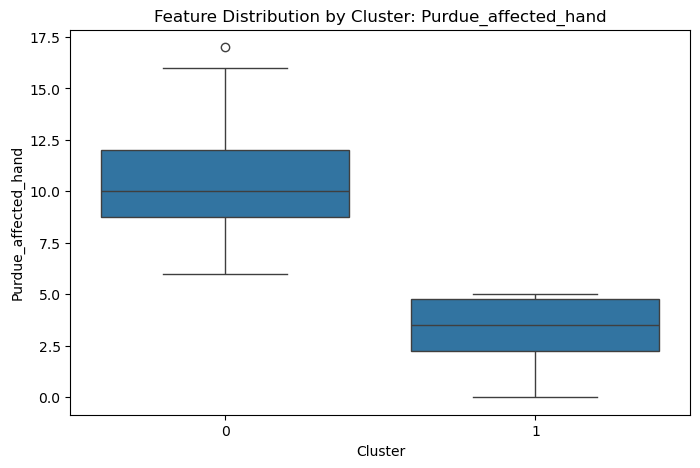


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0, -1,  0, -1, -1, -1, -1, -1,  0,  0,  0,  0, -1, -1,  0,  0,  0,
        0, -1,  0,  0,  0, -1, -1,  0, -1,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0, -1, -1,  0,  0,  0, -1, -1, -1, -1], dtype=int64), 'silhouette_score': 0.32599241531864004, 'dbi': 1.4265275849044987, 'ch_score': 12.534908821556629}


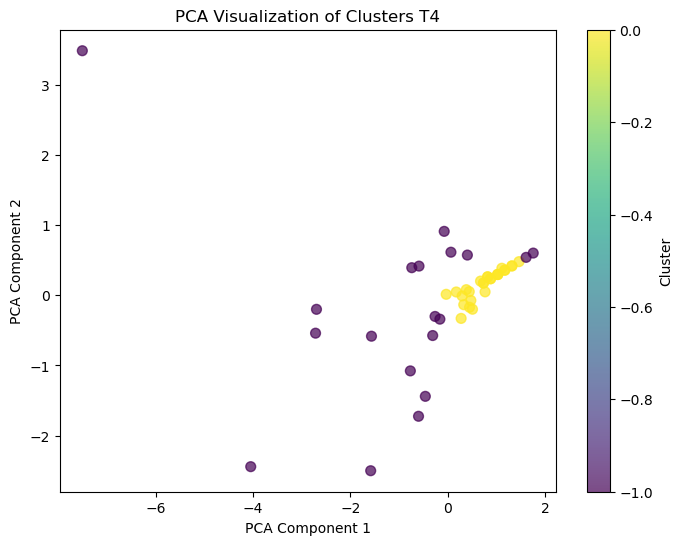


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                         BERG         \
                             mean median        std       mean median   
Cluster                                                                 
-1                      53.000000   58.0  13.320827  50.526316   50.0   
 0                      59.518519   60.0   0.802418  55.629630   56.0   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
-1       4.682929          1.394737    1.0  2.138139             7.947368   
 0       0.791695          0.000000    0.0  0.000000            10.592593   

                          
        median       std  
Cluster                   
-1         8.0  4.465593  
 0        11.0  2.308167  


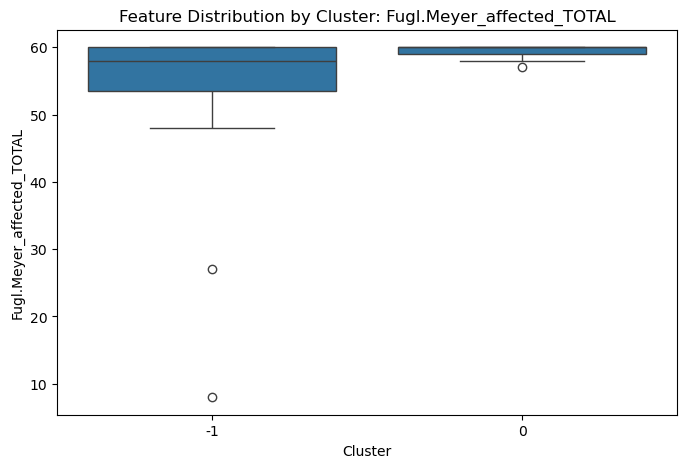

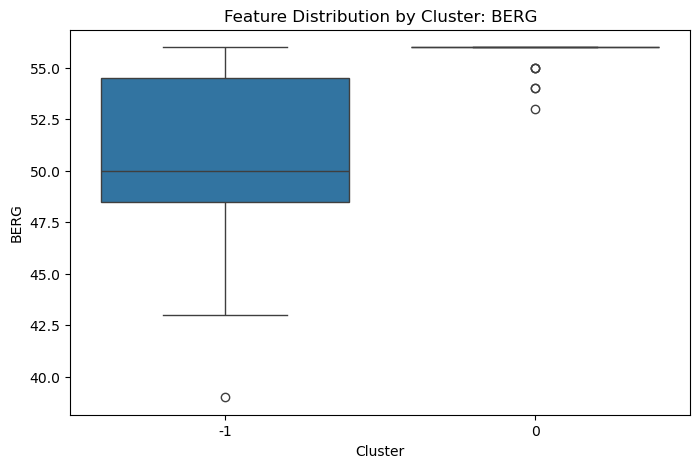

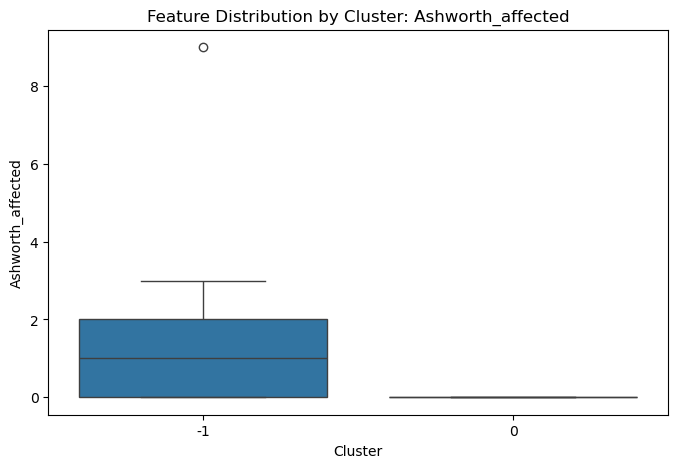

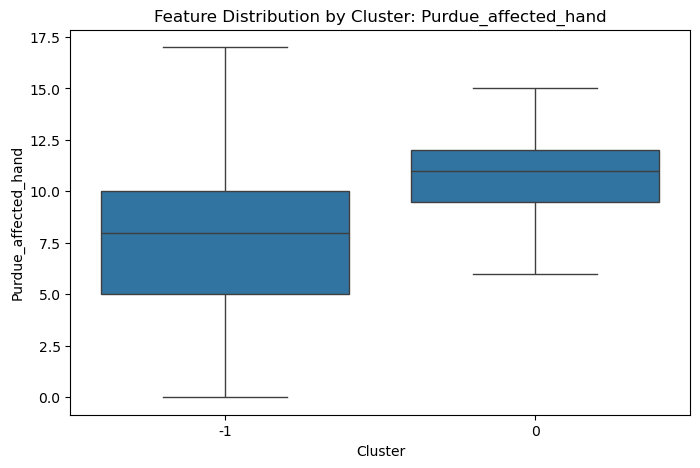


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 0], dtype=int64), 'silhouette_score': 0.5686545592013715, 'dbi': 1.0120774372251395, 'ch_score': 29.625110827542333}


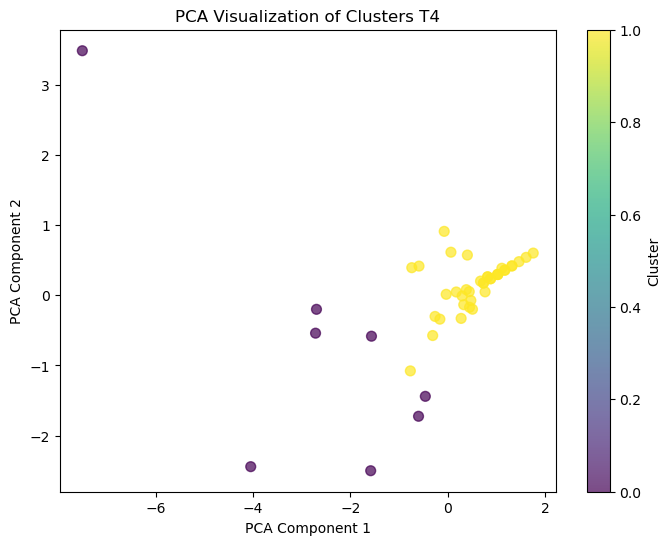


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                         BERG         \
                             mean median        std       mean median   
Cluster                                                                 
0                       46.875000   55.5  19.037088  46.375000   47.5   
1                       58.921053   60.0   2.258696  55.026316   56.0   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
0        3.700869             2.125    1.0  3.090885             4.500000   
1        1.731845             0.250    0.0  0.612372            10.552632   

                          
        median       std  
Cluster                   
0          4.5  2.976095  
1         10.0  2.708319  


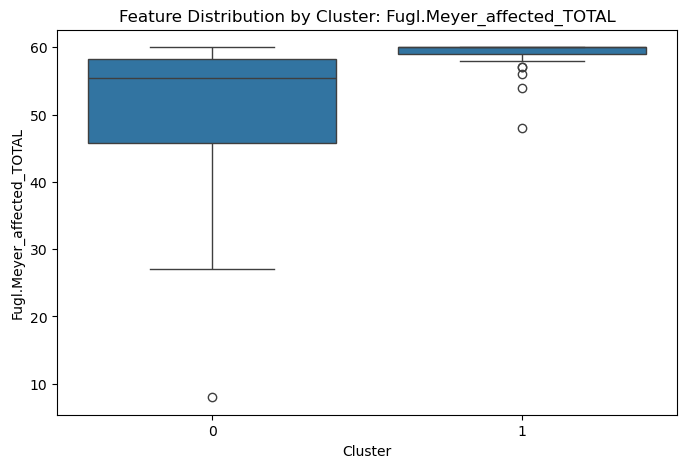

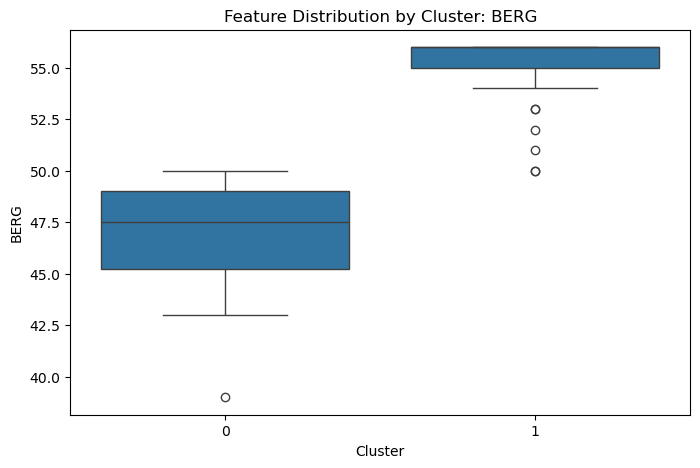

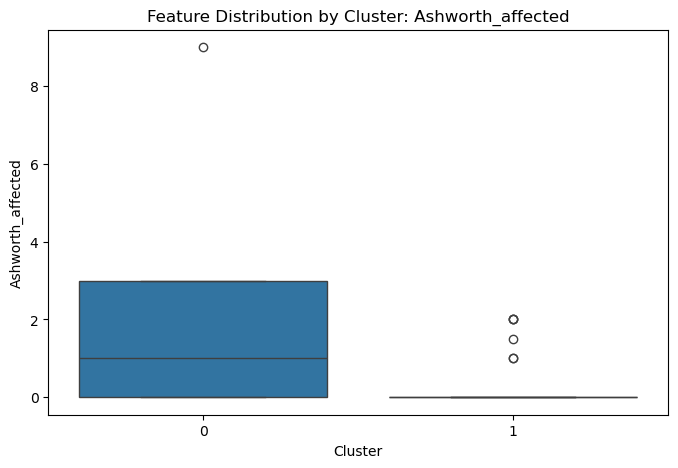

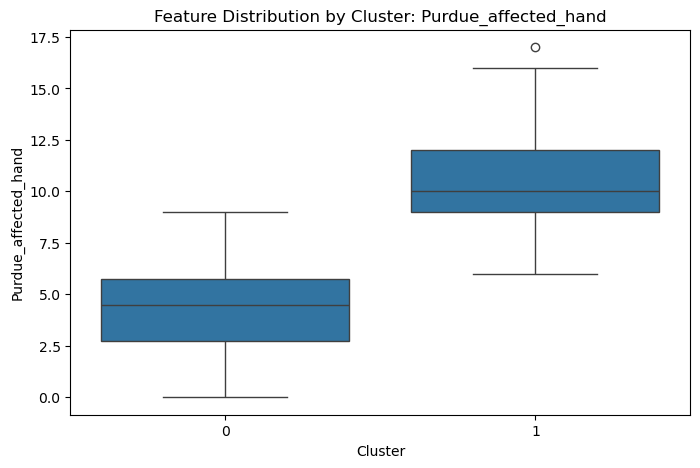

In [28]:
import pandas as pd
import numpy as np
import itertools
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
import seaborn as sns


# Step 1: Data Preprocessing
def preprocess_data(data, features, impute_strategy="mean", scale=True):
    """
    Preprocesses data by imputing missing values and scaling.
    Args:
        data (pd.DataFrame): Input dataset.
        features (list): List of features to include.
        impute_strategy (str): Strategy for handling NaNs.
        scale (bool): Whether to scale features.
    Returns:
        np.array: Preprocessed data.
    """
    data_selected = data[features]
    imputer = SimpleImputer(strategy=impute_strategy)
    data_imputed = pd.DataFrame(imputer.fit_transform(data_selected), columns=features)

    if scale:
        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(data_imputed)
        return data_scaled
    return data_imputed


# Step 2: Pairwise Feature Combinations
def generate_feature_combinations(features):
    """
    Generate all pairwise combinations of features for clustering exploration.
    Args:
        features (list): List of feature names.
    Returns:
        list: List of tuples containing feature combinations.
    """
    return list(itertools.combinations(features, 4))


# Step 3: Clustering and Validation
def cluster_and_evaluate(data, algorithm="kmeans", params=None):
    """
    Perform clustering and evaluate using internal metrics.
    Args:
        data (np.array): Preprocessed data.
        algorithm (str): Clustering algorithm to use ("kmeans", "dbscan", "hac").
        params (dict): Parameters for the chosen clustering algorithm.
    Returns:
        dict: Dictionary with clustering results and metrics.
    """
    if algorithm == "kmeans":
        model = KMeans(n_clusters=params.get("n_clusters", 2), random_state=42)
    elif algorithm == "dbscan":
        model = DBSCAN(eps=params.get("eps", 0.5), min_samples=params.get("min_samples", 5))
    elif algorithm == "hac":
        model = AgglomerativeClustering(n_clusters=params.get("n_clusters", 2), linkage=params.get("linkage", "ward"))
    else:
        raise ValueError("Unsupported algorithm")

    clusters = model.fit_predict(data)
    silhouette = silhouette_score(data, clusters) if len(set(clusters)) > 1 else None
    dbi = davies_bouldin_score(data, clusters) if len(set(clusters)) > 1 else None
    ch_score = calinski_harabasz_score(data, clusters) if len(set(clusters)) > 1 else None

    return {
        "clusters": clusters,
        "silhouette_score": silhouette,
        "dbi": dbi,
        "ch_score": ch_score,
    }


# Step 4: Visualize Clusters
def visualize_clusters(data, clusters, idx):
    """
    Visualize clusters in 2D using PCA.
    Args:
        data (np.array): Data to visualize.
        clusters (np.array): Cluster labels.
    """
    pca = PCA(n_components=2, random_state=42)
    data_reduced = pca.fit_transform(data)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=clusters, cmap="viridis", s=50, alpha=0.7)
    plt.colorbar(scatter, label="Cluster")
    plt.title(f"PCA Visualization of Clusters T{idx+1}")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()


# Step 5: Analyze Clusters
def analyze_clusters(data, clusters, features):
    """
    Analyze clusters by summarizing feature statistics and visualizing distributions.
    Args:
        data (pd.DataFrame): Original dataset.
        clusters (np.array): Cluster labels.
        features (list): List of features to analyze.
    """
    data["Cluster"] = clusters

    # Summarize cluster statistics
    summary = data.groupby("Cluster")[features].agg(["mean", "median", "std"])
    print("\nCluster Summary Statistics:\n", summary)

    # Plot feature distributions
    for feature in features:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x="Cluster", y=feature, data=data)
        plt.title(f"Feature Distribution by Cluster: {feature}")
        plt.xlabel("Cluster")
        plt.ylabel(feature)
        plt.show()


# Step 6: Main Pipeline
def main_pipeline(data, features, algorithms, params, idx):
    """
    Run the clustering pipeline with iterative exploration and visualization.
    Args:
        data (pd.DataFrame): Input dataset.
        features (list): List of feature names.
        algorithms (list): List of clustering algorithms to test.
        params (dict): Parameters for each algorithm.
        idx (int): Index of the current timepoint.
    """
    results = []
    for algo in algorithms:
        for combo in generate_feature_combinations(features):
            print(f"\nTesting {algo} with features: {combo}")
            data_preprocessed = preprocess_data(data, list(combo))
            result = cluster_and_evaluate(data_preprocessed, algorithm=algo, params=params.get(algo, {}))
            print(f"Results: {result}")
            visualize_clusters(data_preprocessed, result["clusters"], idx)
            analyze_clusters(data, result["clusters"], list(combo))
            results.append({"features": combo, "algorithm": algo, "metrics": result})
    return results


# Run the pipeline
file_paths = [
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT1.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT2.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT3.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT4.xlsx",
]
features = ["Fugl.Meyer_affected_TOTAL", "BERG", "Ashworth_affected", "Purdue_affected_hand"]
algorithms = ["kmeans", "dbscan", "hac"]
params = {
    "kmeans": {"n_clusters": 2},
    "dbscan": {"eps": 0.5, "min_samples": 5},
    "hac": {"n_clusters": 2, "linkage": "ward"},
}

for idx, path in enumerate(file_paths):
    data = pd.read_excel(path)
    results = main_pipeline(data, features, algorithms, params, idx)


# Temporal Change as Features
- Version de base du vendredi 06/12

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Results: {'clusters': array([1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 0, 1]), 'silhouette_score': 0.36378488656968205, 'dbi': 1.1975495935249143, 'ch_score': 23.981728597392717}


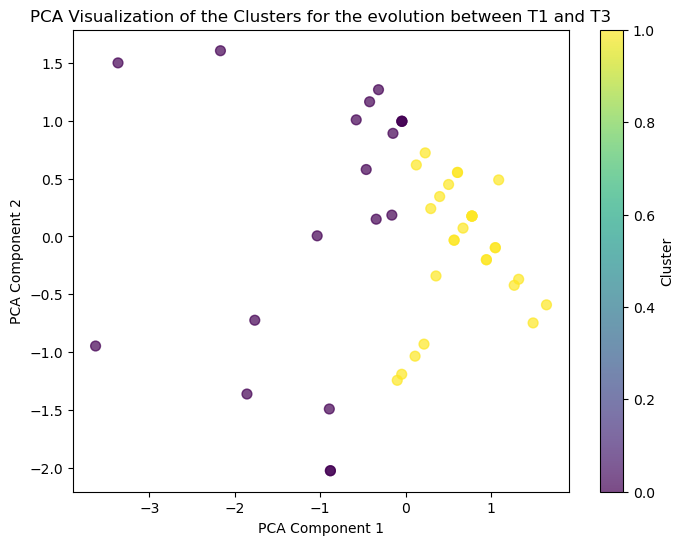


Cluster Summary Statistics:
               BERG                   Purdue_affected_hand                 
              mean median        std                 mean median       std
Cluster                                                                   
0       -17.337148  -11.0  16.909245            -4.196293   -4.0  2.686198
1        -3.571429   -1.5   7.062832            -0.672217   -1.0  1.276907


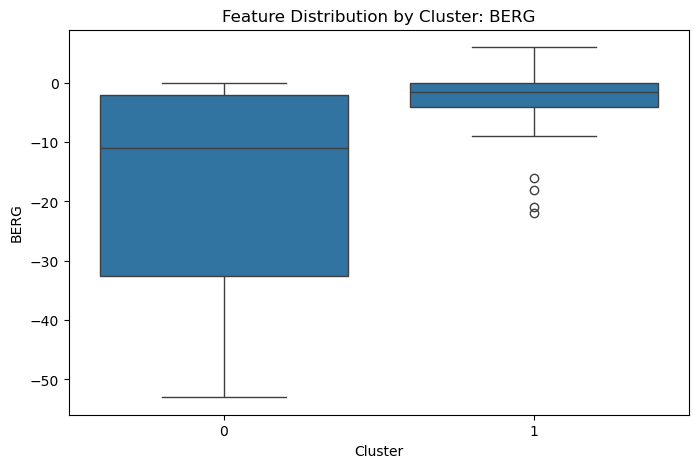

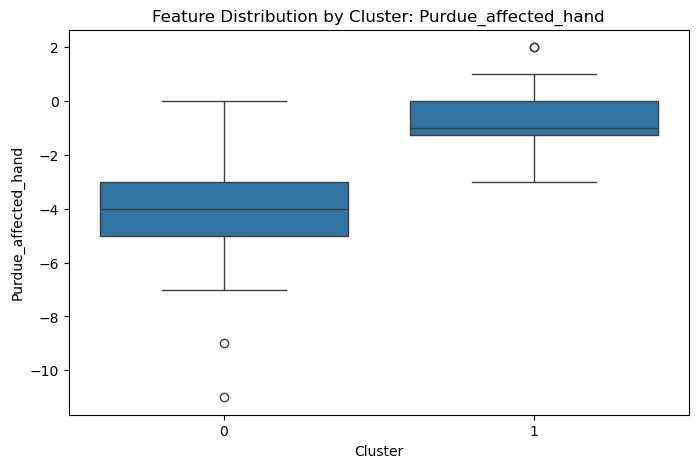

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Results: {'clusters': array([1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 0, 1]), 'silhouette_score': 0.36378488656968205, 'dbi': 1.1975495935249143, 'ch_score': 23.981728597392717}


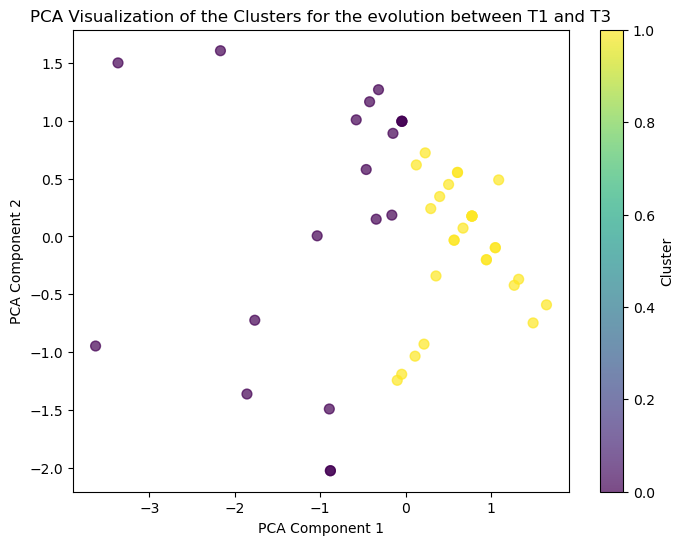


Cluster Summary Statistics:
               BERG                   Purdue_affected_hand                 
              mean median        std                 mean median       std
Cluster                                                                   
0       -17.337148  -11.0  16.909245            -4.196293   -4.0  2.686198
1        -3.571429   -1.5   7.062832            -0.672217   -1.0  1.276907


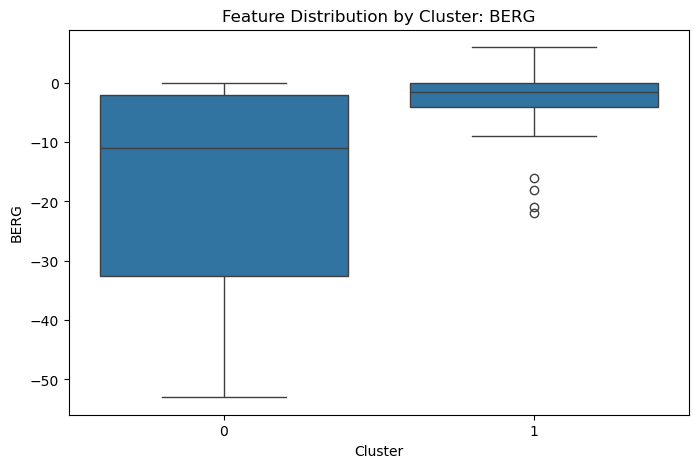

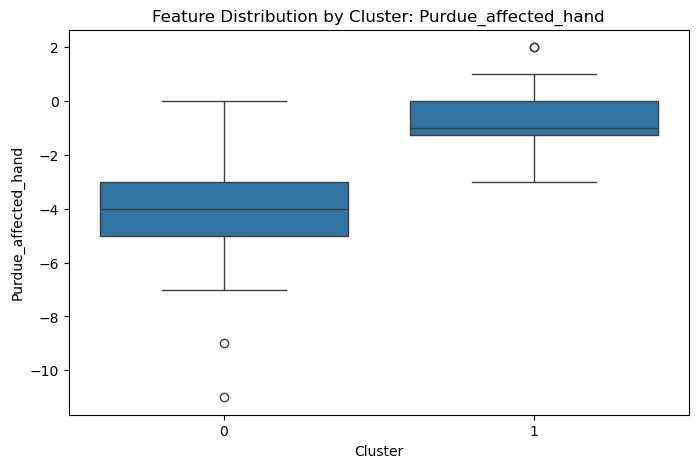

Results: {'clusters': array([ 0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0, -1,
        0,  0,  0, -1,  0, -1,  0,  0,  0,  0, -1,  0,  0, -1,  0,  0,  0,
       -1, -1,  0,  0, -1, -1,  0,  0,  0, -1,  0,  0, -1], dtype=int64), 'silhouette_score': 0.4857646302874059, 'dbi': 1.0587477540876928, 'ch_score': 31.30018715718723}


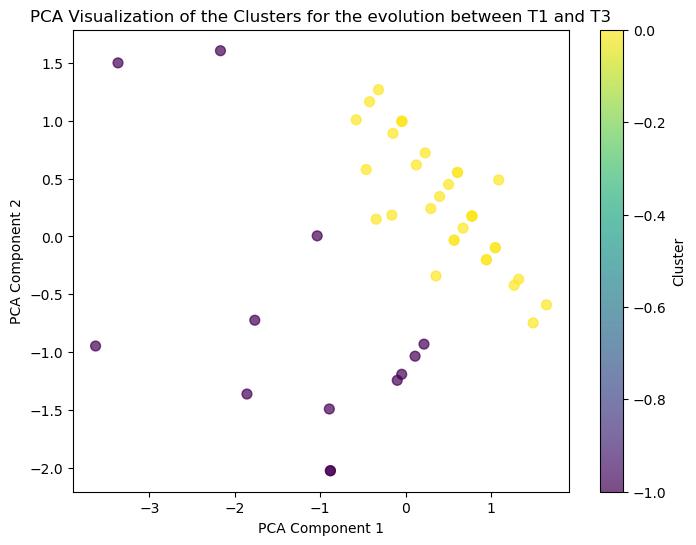


Cluster Summary Statistics:
               BERG                   Purdue_affected_hand                 
              mean median        std                 mean median       std
Cluster                                                                   
-1      -28.423077  -27.0  11.412431            -3.000000   -1.0  3.829708
 0       -1.761936   -0.5   3.441121            -1.751519   -1.5  1.937043


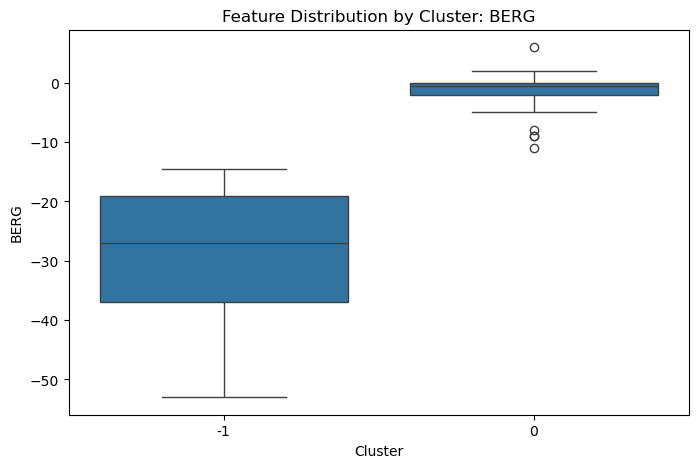

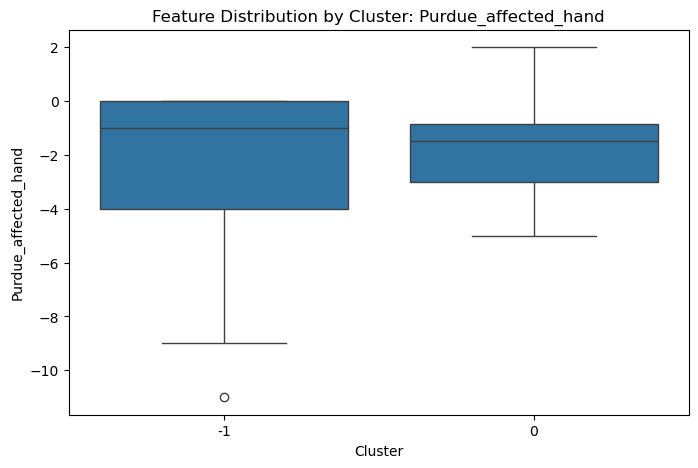

Results: {'clusters': array([ 0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0, -1,
        0,  0,  0, -1,  0, -1,  0,  0,  0,  0, -1,  0,  0, -1,  0,  0,  0,
       -1, -1,  0,  0, -1, -1,  0,  0,  0, -1,  0,  0, -1], dtype=int64), 'silhouette_score': 0.4857646302874059, 'dbi': 1.0587477540876928, 'ch_score': 31.30018715718723}


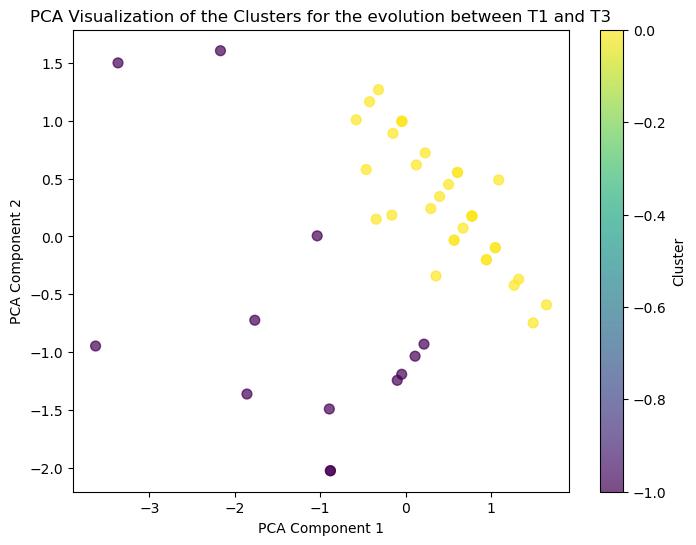


Cluster Summary Statistics:
               BERG                   Purdue_affected_hand                 
              mean median        std                 mean median       std
Cluster                                                                   
-1      -28.423077  -27.0  11.412431            -3.000000   -1.0  3.829708
 0       -1.761936   -0.5   3.441121            -1.751519   -1.5  1.937043


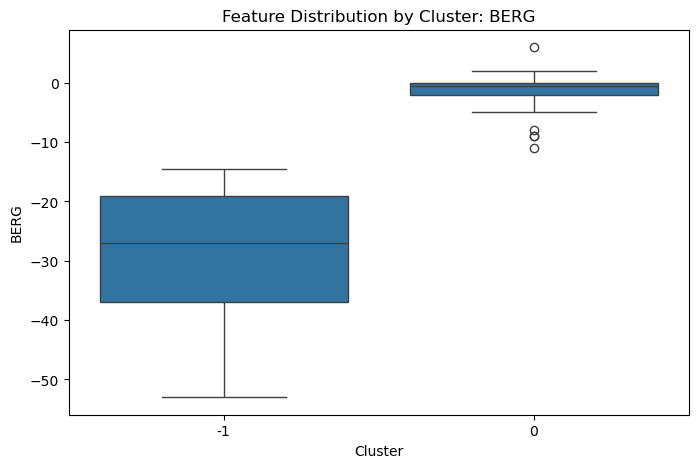

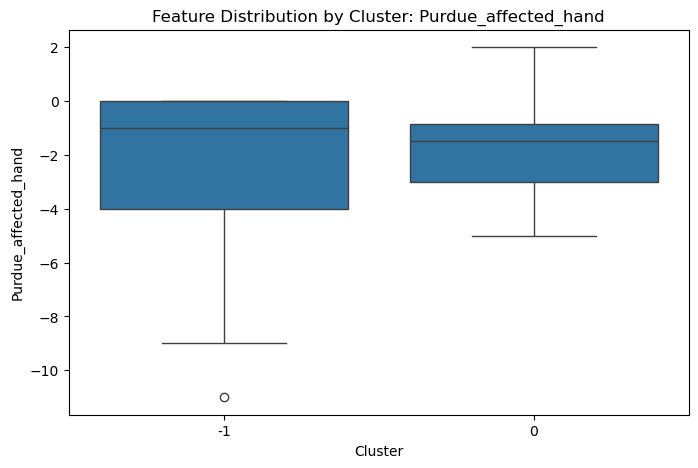

Results: {'clusters': array([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 0], dtype=int64), 'silhouette_score': 0.4885945382824335, 'dbi': 1.0890514401490987, 'ch_score': 29.134841801000498}


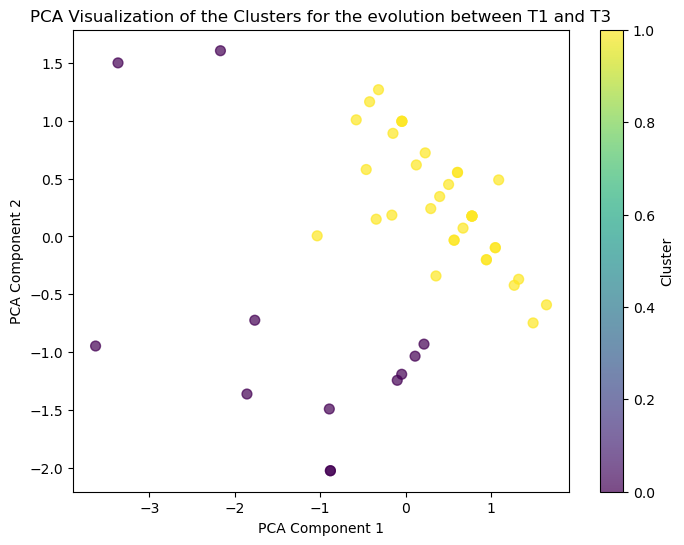


Cluster Summary Statistics:
               BERG                   Purdue_affected_hand                 
              mean median        std                 mean median       std
Cluster                                                                   
0       -29.208333  -29.5  11.547251            -2.916667   -0.5  3.987670
1        -2.254452   -1.0   4.470242            -1.815761   -2.0  1.945823


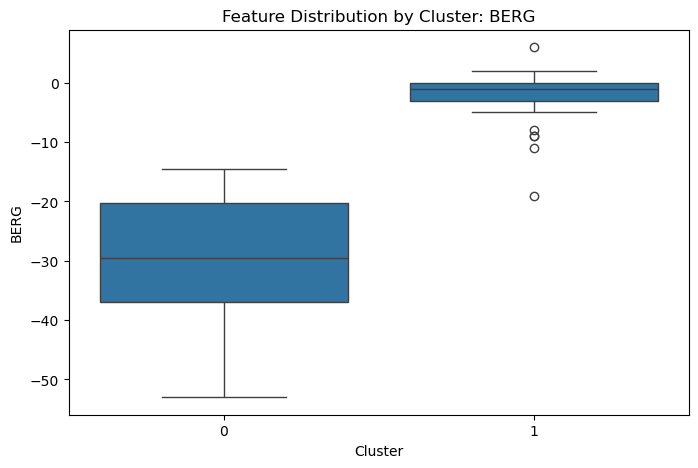

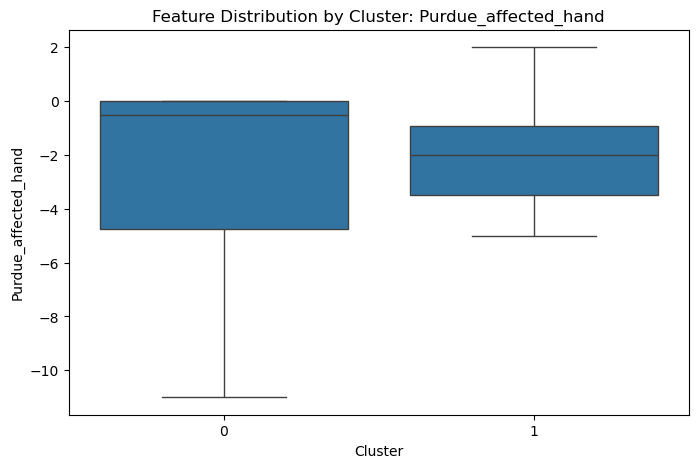

Results: {'clusters': array([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 0], dtype=int64), 'silhouette_score': 0.4885945382824335, 'dbi': 1.0890514401490987, 'ch_score': 29.134841801000498}


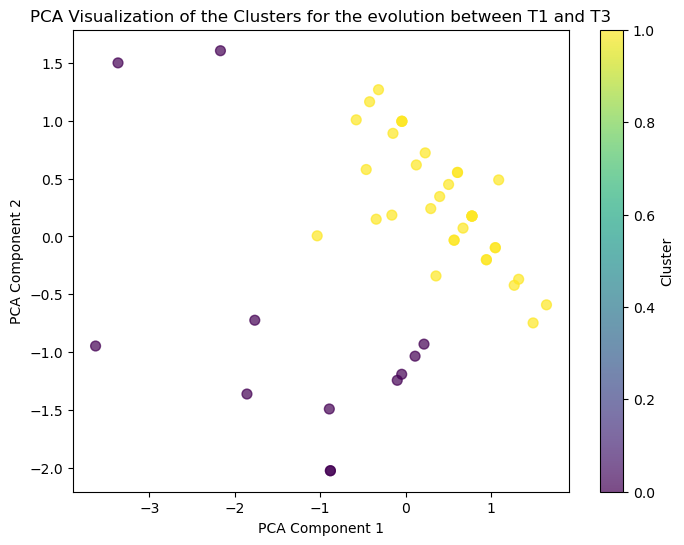


Cluster Summary Statistics:
               BERG                   Purdue_affected_hand                 
              mean median        std                 mean median       std
Cluster                                                                   
0       -29.208333  -29.5  11.547251            -2.916667   -0.5  3.987670
1        -2.254452   -1.0   4.470242            -1.815761   -2.0  1.945823


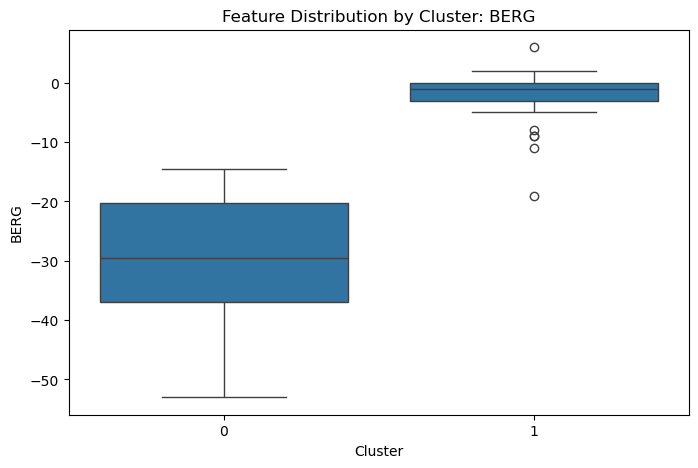

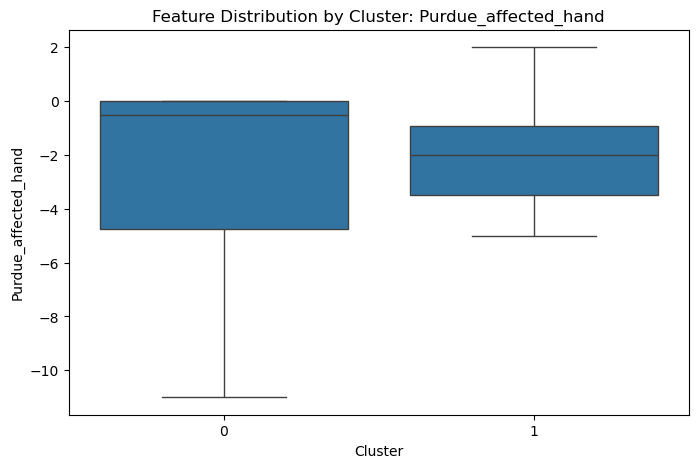

In [104]:
import pandas as pd
import numpy as np
import itertools
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
import seaborn as sns

# Step 0: Get the temporality T3-T1
def get_df_temp(df1,df2,features):
    df_tot=df1[df1.loc[:,"Patient"].isin(df2["Patient"])].reset_index(drop=True)
    A=df1["Patient"].isin(df2["Patient"])
    list_patients=df1.loc[A.values,"Patient"].values
    A=df1[df1["Patient"].isin(list_patients)][features].reset_index(drop=True).copy()
    B=df2[df2["Patient"].isin(list_patients)][features].reset_index(drop=True).copy()
    feature_diff=A-B
    df_tot[features] = feature_diff
    return df_tot

# Step 1: Data Preprocessing
def preprocess_temporal_data(df1,df2, features, impute_strategy="mean", normalization=None):
    """
    Preprocesses data by imputing missing values and scaling.
    Args:
        data (pd.DataFrame): Input dataset.
        features (list): List of features to include.
        impute_strategy (str): Strategy for handling NaNs.
        normalization (string): Type of normalization.
    Returns:
        np.array: Preprocessed data.
    """
    df_tot=get_df_temp(df1,df2,features)
    data_selected=df_tot[features].reset_index(drop=True).dropna(axis=0)
    imputer = SimpleImputer(strategy=impute_strategy)
    data_imputed = pd.DataFrame(imputer.fit_transform(data_selected), columns=features)
    
    if normalization=="scaler":
        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(data_imputed)
        return data_scaled
    if normalization=="min_max":
        scaler=MinMaxScaler()
        data_scaled = scaler.fit_transform(data_imputed)
        return data_scaled
    return data_imputed


# Step 2: Clustering and Validation
def cluster_and_evaluate(data, algorithm="kmeans", params=None):
    """
    Perform clustering and evaluate using internal metrics.
    Args:
        data (np.array): Preprocessed data.
        algorithm (str): Clustering algorithm to use ("kmeans", "dbscan", "hac").
        params (dict): Parameters for the chosen clustering algorithm.
    Returns:
        dict: Dictionary with clustering results and metrics.
    """
    if algorithm == "kmeans":
        model = KMeans(n_clusters=params.get("n_clusters", 2), random_state=42)
    elif algorithm == "dbscan":
        model = DBSCAN(eps=params.get("eps", 0.5), min_samples=params.get("min_samples", 5))
    elif algorithm == "hac":
        model = AgglomerativeClustering(n_clusters=params.get("n_clusters", 2), linkage=params.get("linkage", "ward"))
    else:
        raise ValueError("Unsupported algorithm")

    clusters = model.fit_predict(data)
    silhouette = silhouette_score(data, clusters) if len(set(clusters)) > 1 else None
    dbi = davies_bouldin_score(data, clusters) if len(set(clusters)) > 1 else None
    ch_score = calinski_harabasz_score(data, clusters) if len(set(clusters)) > 1 else None
    
    return {
        "clusters": clusters,
        "silhouette_score": silhouette,
        "dbi": dbi,
        "ch_score": ch_score,
    }


# Step 3: Visualize Clusters
def visualize_clusters(data, clusters, idx):
    """
    Visualize clusters in 2D using PCA.
    Args:
        data (np.array): Data to visualize.
        clusters (np.array): Cluster labels.
    """
    pca = PCA(n_components=2, random_state=42)
    data_reduced = pca.fit_transform(data)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=clusters, cmap="viridis", s=50, alpha=0.7)
    plt.colorbar(scatter, label="Cluster")
    plt.title(f"PCA Visualization of the Clusters for the evolution between T1 and T3")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()


# Step 4: Analyze Clusters
def analyze_clusters(data, clusters, features):
    """
    Analyze clusters by summarizing feature statistics and visualizing distributions.
    Args:
        data (pd.DataFrame): Original dataset.
        clusters (np.array): Cluster labels.
        features (list): List of features to analyze.
    """
    data["Cluster"] = clusters

    # Summarize cluster statistics
    summary = data.groupby("Cluster")[features].agg(["mean", "median", "std"])
    print("\nCluster Summary Statistics:\n", summary)

    # Plot feature distributions
    for feature in features:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x="Cluster", y=feature, data=data)
        plt.title(f"Feature Distribution by Cluster: {feature}")
        plt.xlabel("Cluster")
        plt.ylabel(feature)
        plt.show()


# Step 5: Main Pipeline
def main_temporal_pipeline(df1, df2, features, algorithms, params, preprocesses, idx):
    """
    Run the clustering pipeline with iterative exploration and visualization.
    Args:
        data (pd.DataFrame): Input dataset.
        features (list): List of feature names.
        algorithms (list): List of clustering algorithms to test.
        params (dict): Parameters for each algorithm.
        idx (int): Index of the current timepoint.
    """
    results = []
    for algo in algorithms:
        for preprocess in preprocesses:
            df_tot=get_df_temp(df1,df2,features)
            data_temporal_preprocessed = preprocess_temporal_data(df1,df2, features,"mean", "scaler")
            result = cluster_and_evaluate(data_temporal_preprocessed, algorithm=algo, params=params.get(algo, {}))
            print(f"Results: {result}")
            if ((result["silhouette_score"]>0.3) & 
                (result["dbi"]<1.2) &
                (result["ch_score"]>15)):
                visualize_clusters(data_temporal_preprocessed, result["clusters"], idx)
                analyze_clusters(df_tot, result["clusters"], features)
                results.append({"features": features, "algorithm": algo, "metrics": result})
    return results

# Run the pipeline
file_paths = [
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT1.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT2.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT3.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT4.xlsx",
]
df1=pd.read_excel(file_paths[0])
df2=pd.read_excel(file_paths[2])
features = ["BERG", "Purdue_affected_hand"]
algorithms = ["kmeans", "dbscan", "hac"]
preprocesses=["scaler","min_max"]
params = {
    "kmeans": {"n_clusters": 2},
    "dbscan": {"eps": 0.5, "min_samples": 5},
    "hac": {"n_clusters": 2, "linkage": "ward"},
}

results = main_temporal_pipeline(df1, df2, features, algorithms, params, preprocesses, "T3-T1")


# Fonction pour avoir la réduction de dimensions pour les connectomes

In [ ]:
import os
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def get_common_patients(path_T1, path_T3):
    """
    Identifies common patients in T1 and T3 datasets.
    Args:
        path_T1 (str): Directory path for T1 connectomes.
        path_T3 (str): Directory path for T3 connectomes.
    Returns:
        set: Set of patient IDs common to both T1 and T3.
    """
    patients_T1 = set([f.split("_")[0] for f in os.listdir(path_T1) if f.endswith(".csv")])
    patients_T3 = set([f.split("_")[0] for f in os.listdir(path_T3) if f.endswith(".csv")])
    return patients_T1.intersection(patients_T3)

def process_connectomes(path_dir, common_patients):
    """
    Processes connectomes and filters for common patients.
    Args:
        path_dir (str): Directory path for connectomes.
        common_patients (set): Set of common patient IDs.
    Returns:
        dict: Dictionary with patient IDs as keys and flattened connectomes as values.
    """
    patient_connectomes = {}
    for f in os.listdir(path_dir):
        if f.endswith(".csv"):
            patient_id = f.split("_")[0]
            if patient_id in common_patients:
                file_path = os.path.join(path_dir, f)
                connectome = pd.read_csv(file_path)
                features_list = connectome.columns[1:-1]
                connectome_values = connectome[features_list].values.flatten()
                patient_connectomes[patient_id] = connectome_values
    return patient_connectomes

def compute_features_from_connectomes(path_T1, path_T3):
    """
    Computes PCA features based on the relative difference of connectomes between T1 and T3.
    Args:
        path_T1 (str): Directory path for T1 connectomes.
        path_T3 (str): Directory path for T3 connectomes.
    Returns:
        pd.DataFrame: PCA-transformed features with patient IDs.
    """
    # Identify common patients
    common_patients = get_common_patients(path_T1, path_T3)
    
    # Process T1 and T3 connectomes
    connectomes_T1 = process_connectomes(path_T1, common_patients)
    connectomes_T3 = process_connectomes(path_T3, common_patients)

    # Compute relative difference (T1 - T3) / T1
    patient_ids = []
    flattened_matrices = []
    for patient_id in common_patients:
        values_T1 = np.array(connectomes_T1[patient_id])
        values_T3 = np.array(connectomes_T3[patient_id])
        values_T1[values_T1 == 0] = 1  # Avoid division by zero
        relative_difference = (values_T1 - values_T3) / values_T1
        patient_ids.append(patient_id)
        flattened_matrices.append(relative_difference)

    # Normalize the features
    flattened_matrices = np.array(flattened_matrices)
    scaler = StandardScaler()
    normalized_features = scaler.fit_transform(flattened_matrices)

    # Apply PCA
    pca = PCA(n_components=0.8)
    pca_features = pd.DataFrame(pca.fit_transform(normalized_features))
    pca_features["Patient"] = patient_ids
    return pca_features

cd = os.getcwd()
path_T1 = os.path.join(cd, "data", "Reduced_Connectomes", "ses-T1")
path_T3 = os.path.join(cd, "data", "Reduced_Connectomes", "ses-T3")
pca_features = compute_features_from_connectomes(path_T1, path_T3)

(37, 22)


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 0]), 'silhouette_score': 0.5609858273046621, 'dbi': 0.7193788518423305, 'ch_score': 72.77936156687042}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


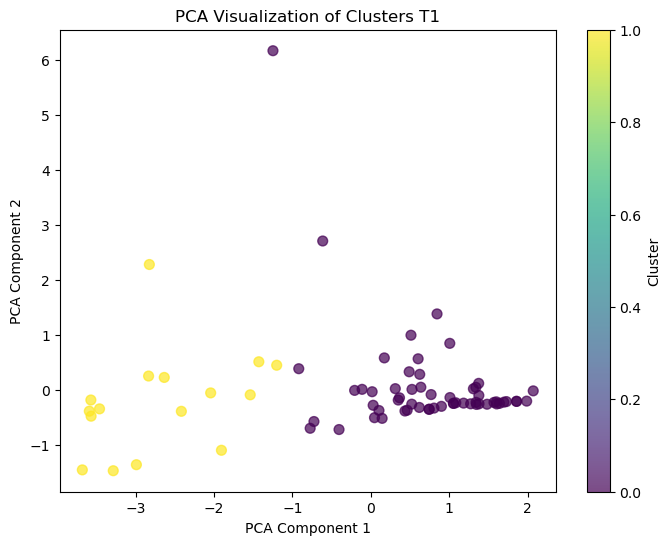

Cest la data de analyse cluster    Patient  Fugl.Meyer_affected_UPPER_EXTREMITY  Fugl.Meyer_affected_WRIST  \
0     P001                            30.000000                       10.0   
1     P002                            30.000000                       10.0   
2     P003                            30.000000                       10.0   
3     P004                            18.000000                       10.0   
4     P005                            30.000000                       10.0   
..     ...                                  ...                        ...   
69    P077                            23.000000                        8.0   
70    P078                            27.039991                       10.0   
71    P080                            29.000000                       10.0   
72    P081                            29.000000                       10.0   
73    P082                            28.000000                       10.0   

    Fugl.Meyer_affected_HAND  F

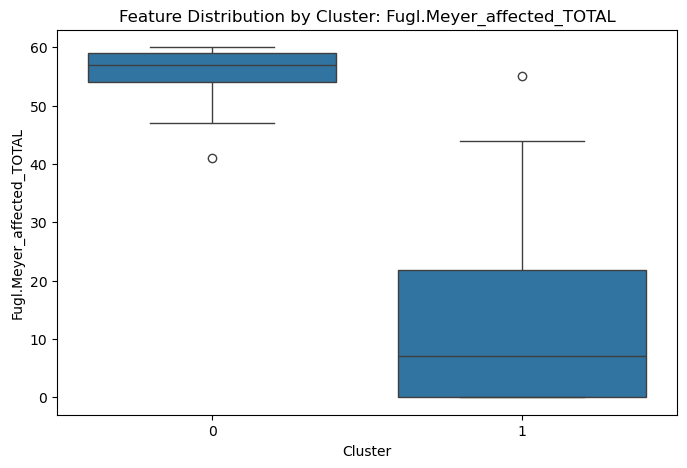

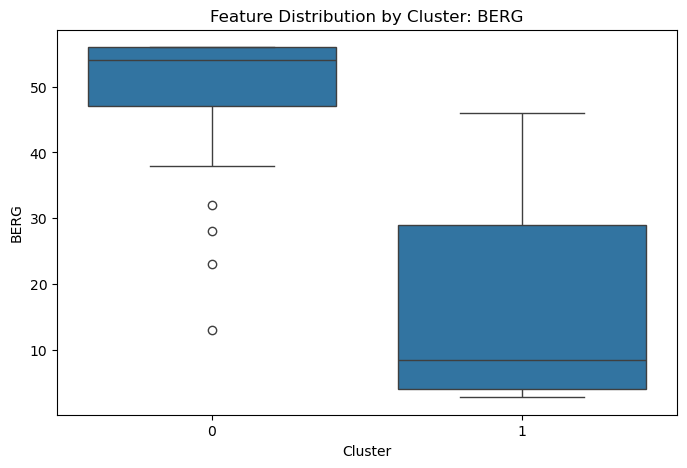

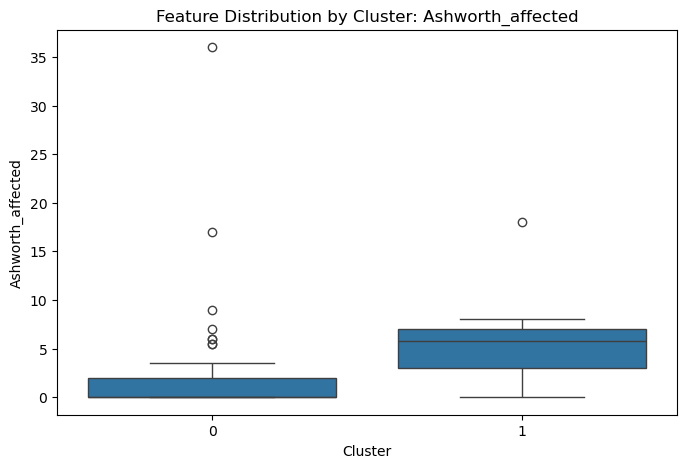

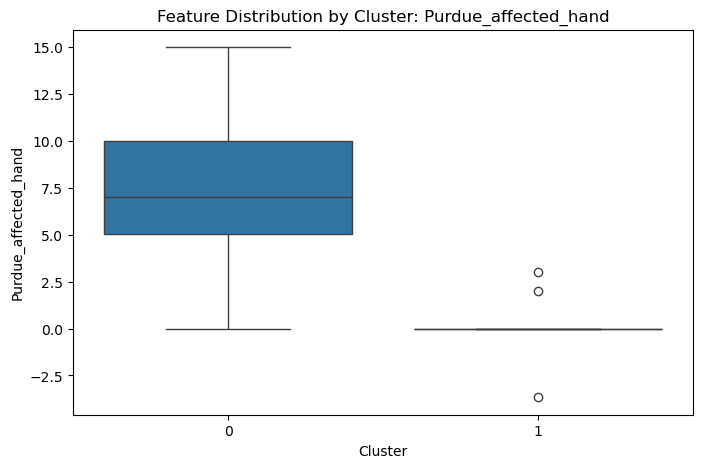


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0,  1,  0, -1, -1, -1,  0,  0, -1, -1, -1,  0,  0,  0,  0,  0,  0,
       -1, -1,  0,  0, -1, -1, -1,  0,  0,  0, -1, -1, -1,  0, -1,  1,  0,
       -1,  0,  0,  0,  0,  0,  0, -1,  0,  0, -1,  0,  0,  0, -1, -1,  0,
       -1,  0,  0,  1, -1, -1, -1, -1, -1, -1,  0,  1, -1, -1, -1, -1,  0,
        1, -1, -1,  0,  0, -1], dtype=int64), 'silhouette_score': 0.08275927129553734, 'dbi': 1.152952021581837, 'ch_score': 22.368445799978353}


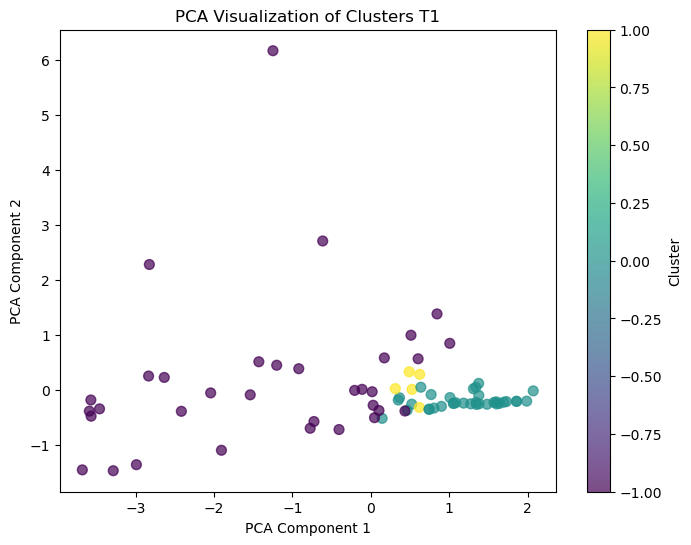

Cest la data de analyse cluster    Patient  Fugl.Meyer_affected_UPPER_EXTREMITY  Fugl.Meyer_affected_WRIST  \
0     P001                            30.000000                       10.0   
1     P002                            30.000000                       10.0   
2     P003                            30.000000                       10.0   
3     P004                            18.000000                       10.0   
4     P005                            30.000000                       10.0   
..     ...                                  ...                        ...   
69    P077                            23.000000                        8.0   
70    P078                            27.039991                       10.0   
71    P080                            29.000000                       10.0   
72    P081                            29.000000                       10.0   
73    P082                            28.000000                       10.0   

    Fugl.Meyer_affected_HAND  F

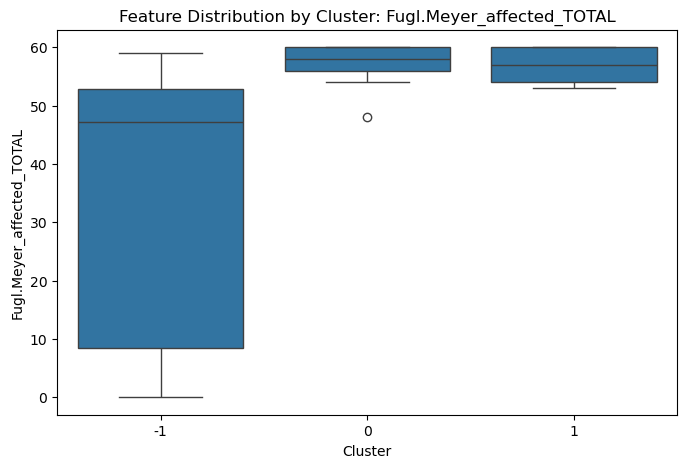

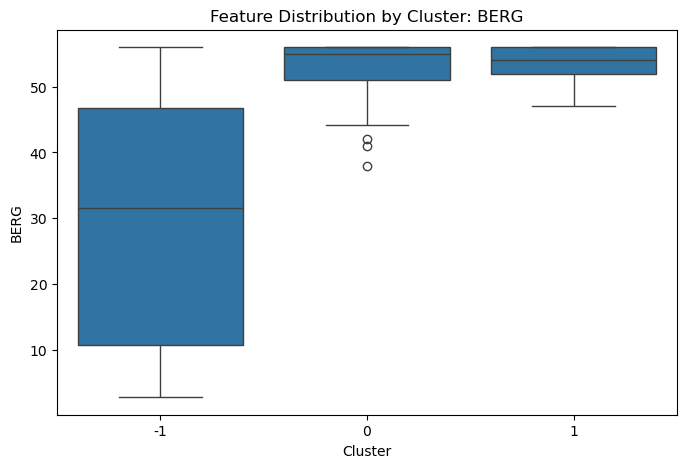

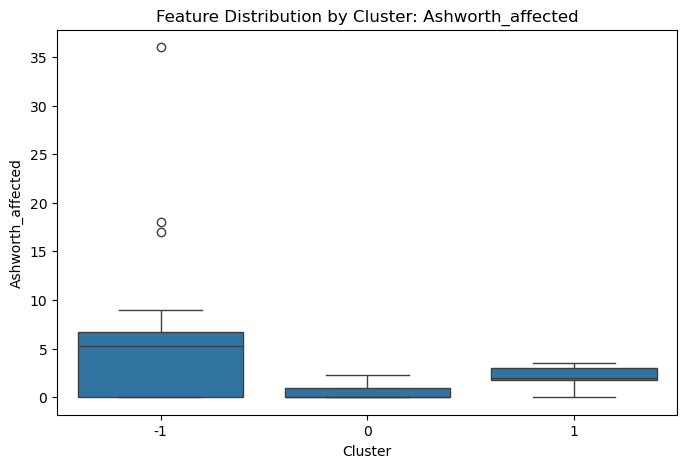

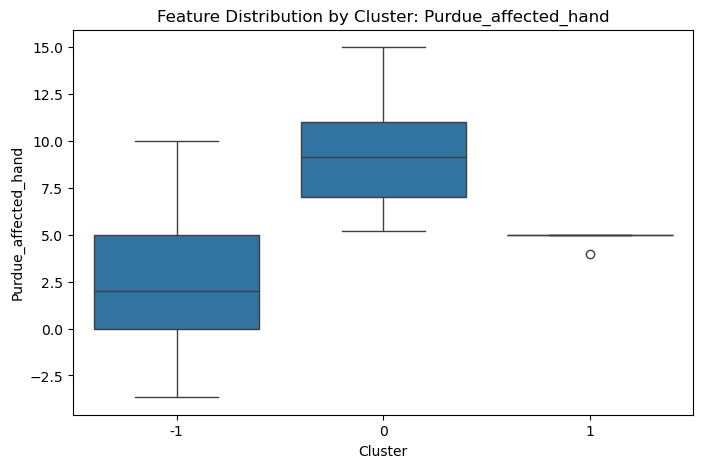


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1], dtype=int64), 'silhouette_score': 0.5776851576081785, 'dbi': 0.8274963271504157, 'ch_score': 69.34530723518186}


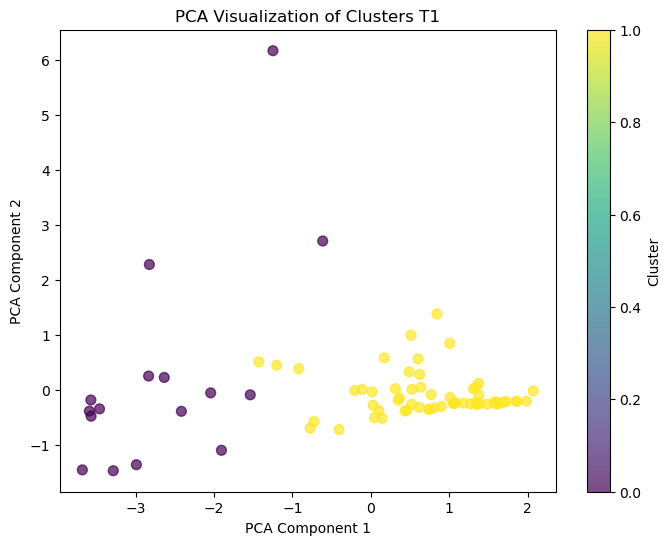

Cest la data de analyse cluster    Patient  Fugl.Meyer_affected_UPPER_EXTREMITY  Fugl.Meyer_affected_WRIST  \
0     P001                            30.000000                       10.0   
1     P002                            30.000000                       10.0   
2     P003                            30.000000                       10.0   
3     P004                            18.000000                       10.0   
4     P005                            30.000000                       10.0   
..     ...                                  ...                        ...   
69    P077                            23.000000                        8.0   
70    P078                            27.039991                       10.0   
71    P080                            29.000000                       10.0   
72    P081                            29.000000                       10.0   
73    P082                            28.000000                       10.0   

    Fugl.Meyer_affected_HAND  F

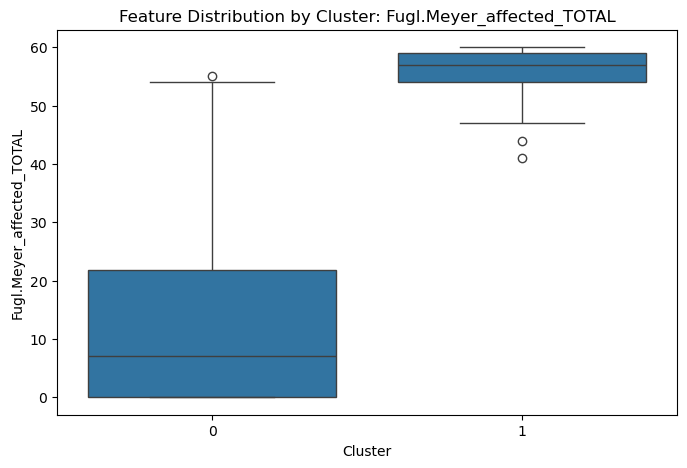

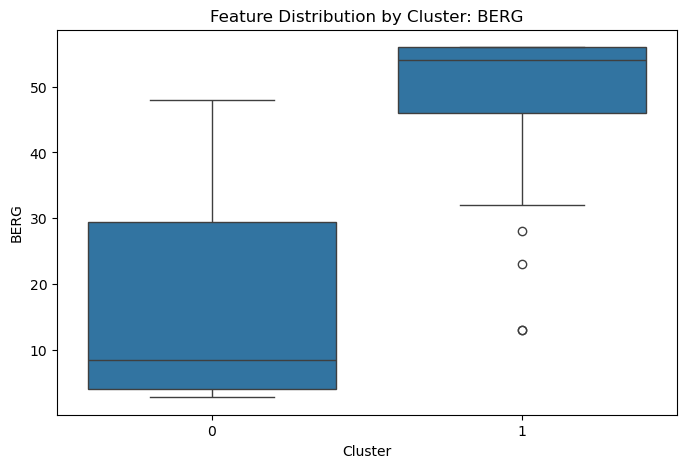

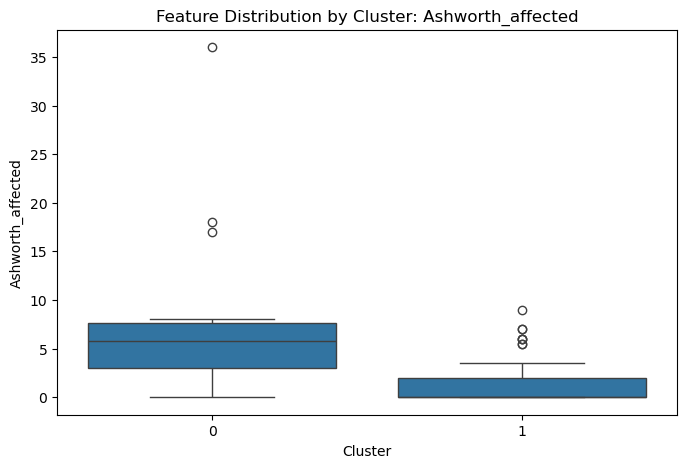

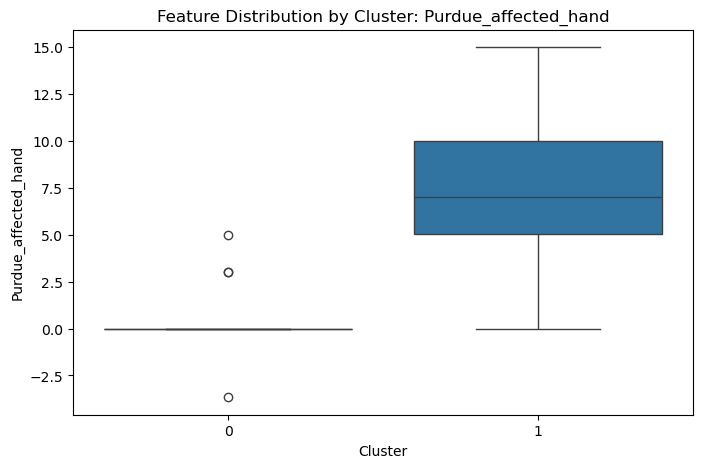


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]), 'silhouette_score': 0.6584147030171748, 'dbi': 0.6915602819733674, 'ch_score': 81.640404160068}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


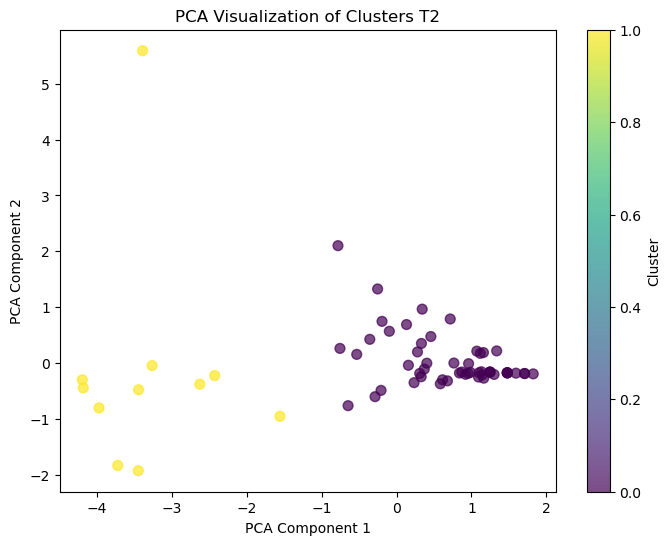

Cest la data de analyse cluster    Patient  GERT.S_.recognition  ARAT_grasp_affected  ARAT_grip_affected  \
0     P001            43.000000                 18.0                12.0   
1     P002            45.000000                 18.0                12.0   
2     P003            31.000000                 18.0                12.0   
3     P004            40.560437                  0.0                 0.0   
4     P005            26.000000                 18.0                12.0   
..     ...                  ...                  ...                 ...   
59    P081            62.000000                 18.0                12.0   
60    P082            32.210464                 18.0                12.0   
61    P083            31.000000                 18.0                12.0   
62    P085            21.990373                  0.0                 0.0   
63    P086           -14.306366                 15.0                 0.0   

    ARAT_pinch_affected  ARAT_pinch_unaffected  ARAT_gr

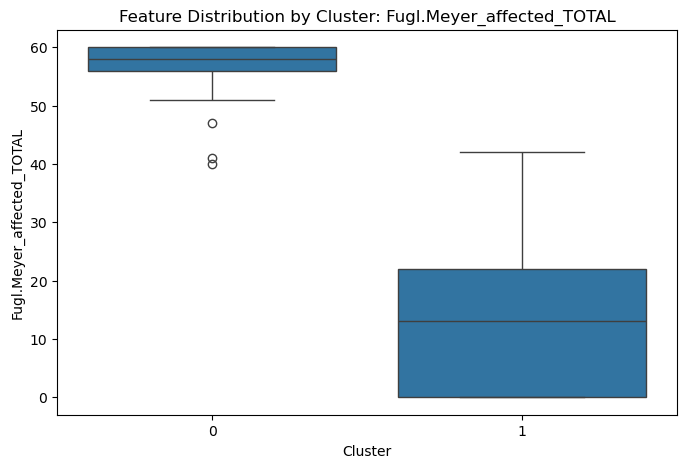

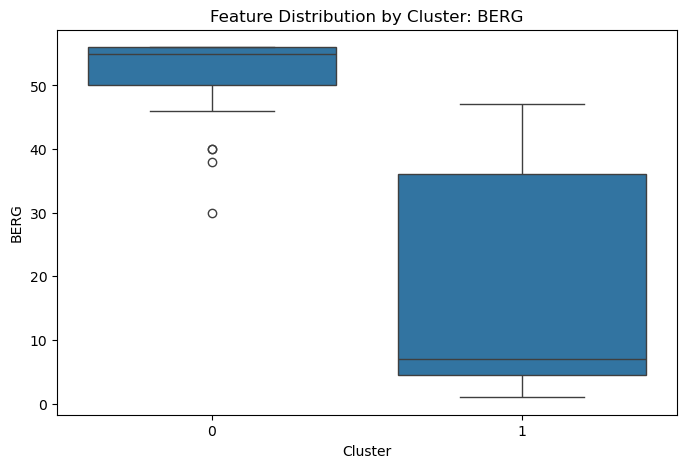

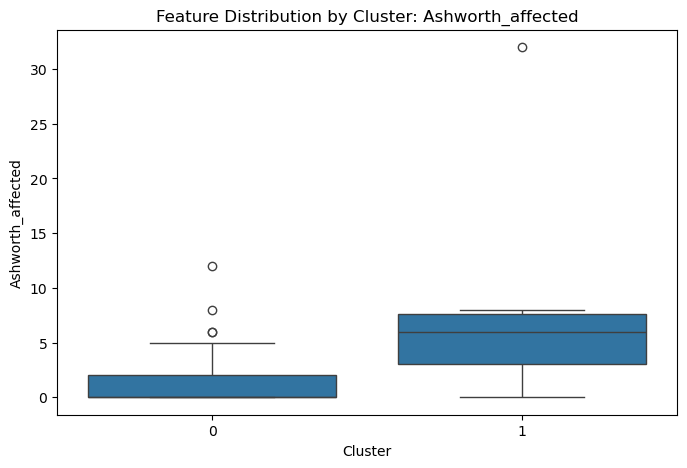

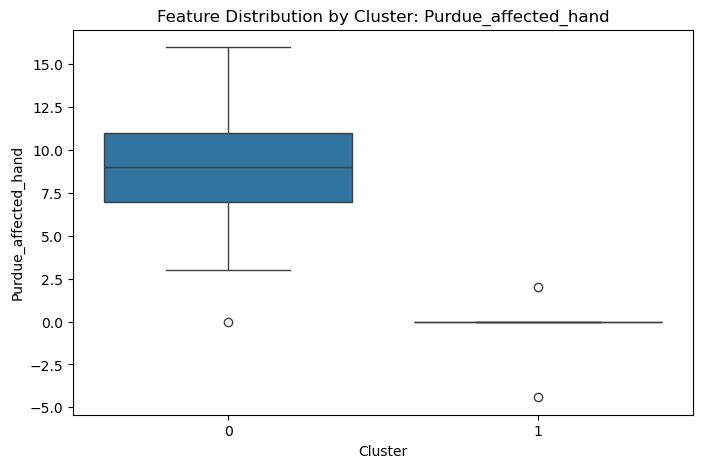


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0,  0,  0, -1,  0, -1, -1, -1, -1, -1,  0,  0,  0,  0,  0,  0, -1,
       -1,  0,  0,  0,  0, -1, -1,  0,  0, -1, -1, -1,  0,  0, -1, -1,  0,
       -1,  0,  0,  0, -1, -1, -1,  0,  0,  0,  0, -1, -1, -1,  0,  0, -1,
       -1, -1,  0, -1, -1, -1, -1,  0,  0,  0, -1, -1, -1], dtype=int64), 'silhouette_score': 0.32862650260747983, 'dbi': 1.0605893514722147, 'ch_score': 31.961494389213023}


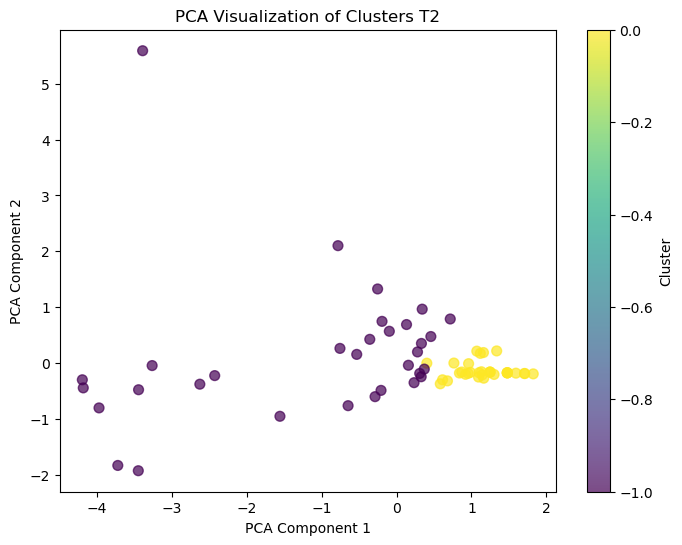

Cest la data de analyse cluster    Patient  GERT.S_.recognition  ARAT_grasp_affected  ARAT_grip_affected  \
0     P001            43.000000                 18.0                12.0   
1     P002            45.000000                 18.0                12.0   
2     P003            31.000000                 18.0                12.0   
3     P004            40.560437                  0.0                 0.0   
4     P005            26.000000                 18.0                12.0   
..     ...                  ...                  ...                 ...   
59    P081            62.000000                 18.0                12.0   
60    P082            32.210464                 18.0                12.0   
61    P083            31.000000                 18.0                12.0   
62    P085            21.990373                  0.0                 0.0   
63    P086           -14.306366                 15.0                 0.0   

    ARAT_pinch_affected  ARAT_pinch_unaffected  ARAT_gr

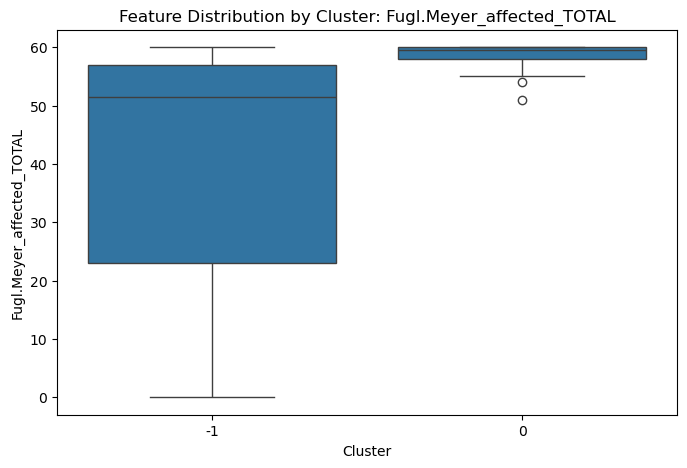

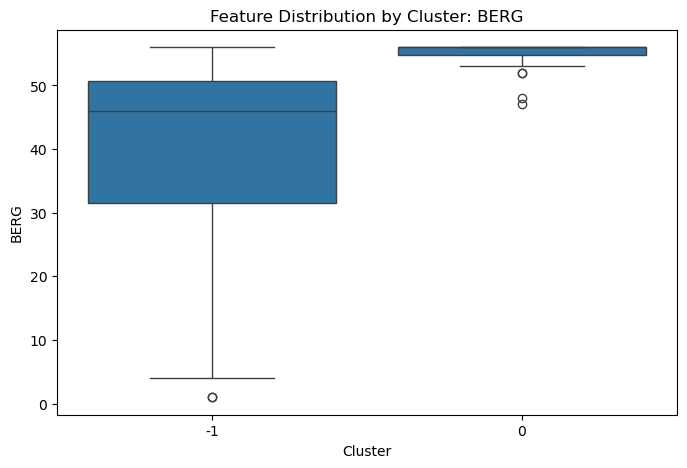

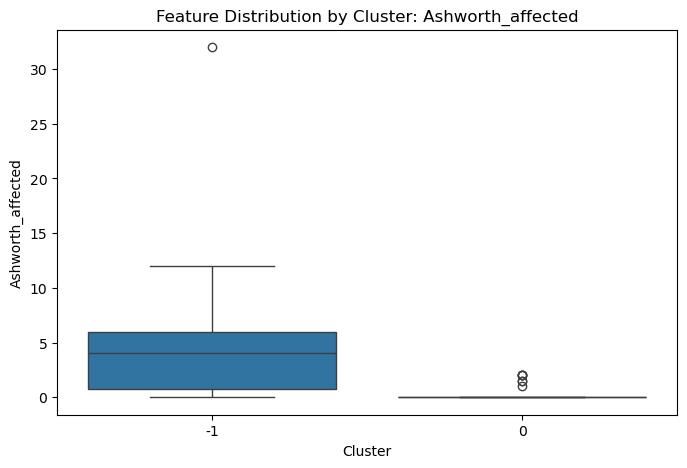

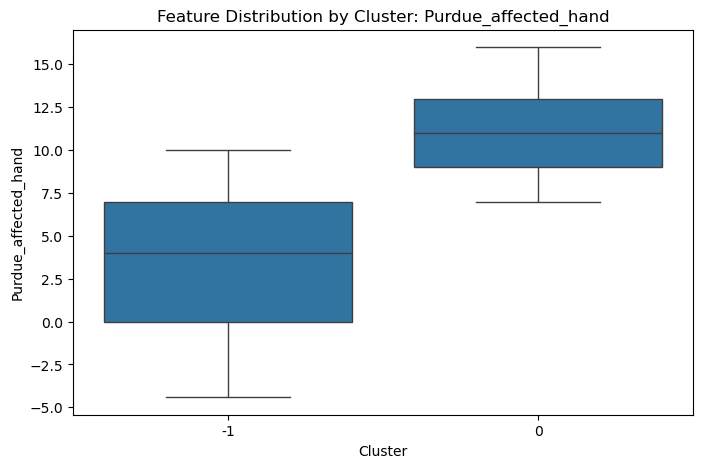


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0],
      dtype=int64), 'silhouette_score': 0.6584147030171748, 'dbi': 0.6915602819733674, 'ch_score': 81.640404160068}


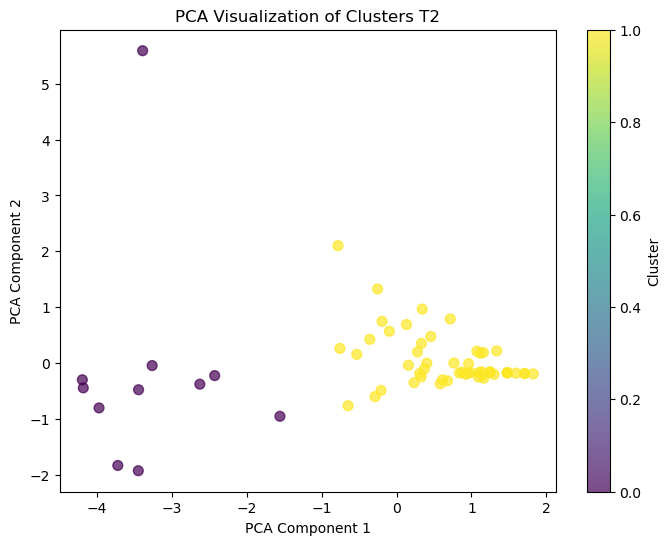

Cest la data de analyse cluster    Patient  GERT.S_.recognition  ARAT_grasp_affected  ARAT_grip_affected  \
0     P001            43.000000                 18.0                12.0   
1     P002            45.000000                 18.0                12.0   
2     P003            31.000000                 18.0                12.0   
3     P004            40.560437                  0.0                 0.0   
4     P005            26.000000                 18.0                12.0   
..     ...                  ...                  ...                 ...   
59    P081            62.000000                 18.0                12.0   
60    P082            32.210464                 18.0                12.0   
61    P083            31.000000                 18.0                12.0   
62    P085            21.990373                  0.0                 0.0   
63    P086           -14.306366                 15.0                 0.0   

    ARAT_pinch_affected  ARAT_pinch_unaffected  ARAT_gr

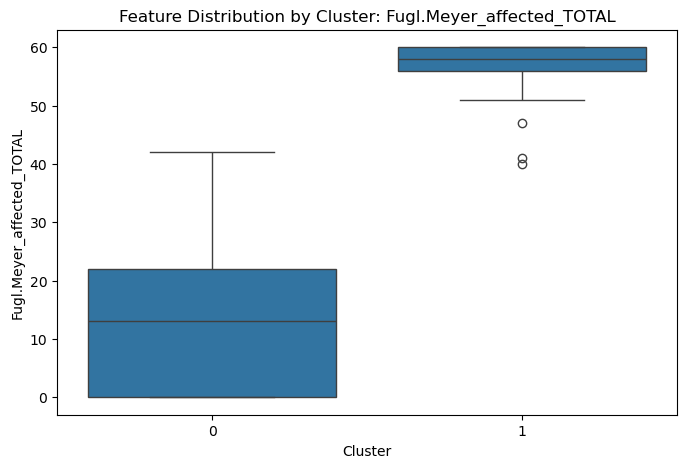

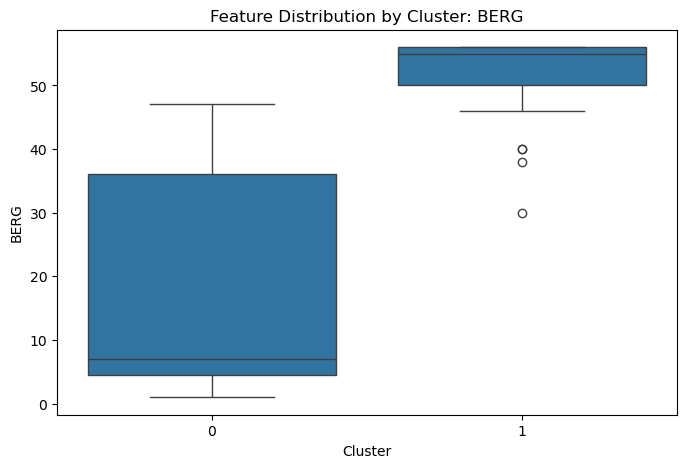

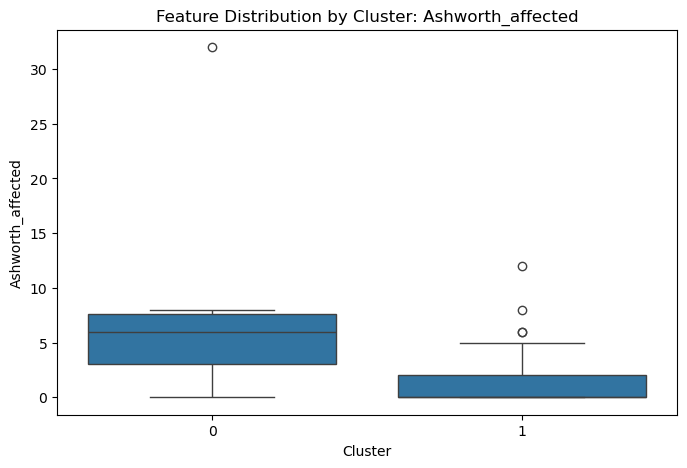

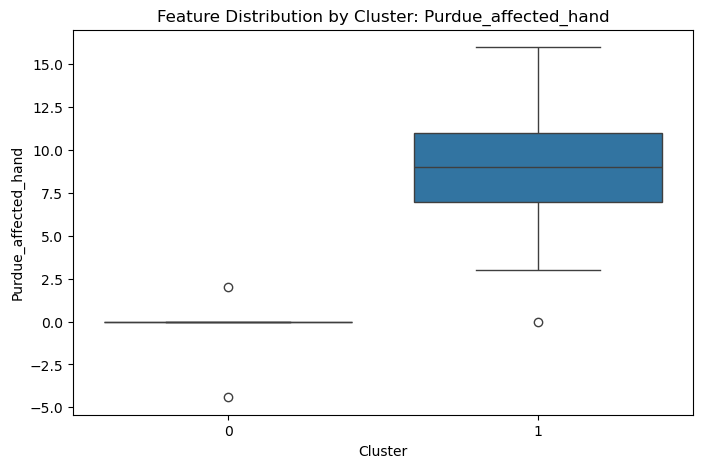


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0]), 'silhouette_score': 0.723354237037764, 'dbi': 0.37234118492075974, 'ch_score': 39.73774469793343}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


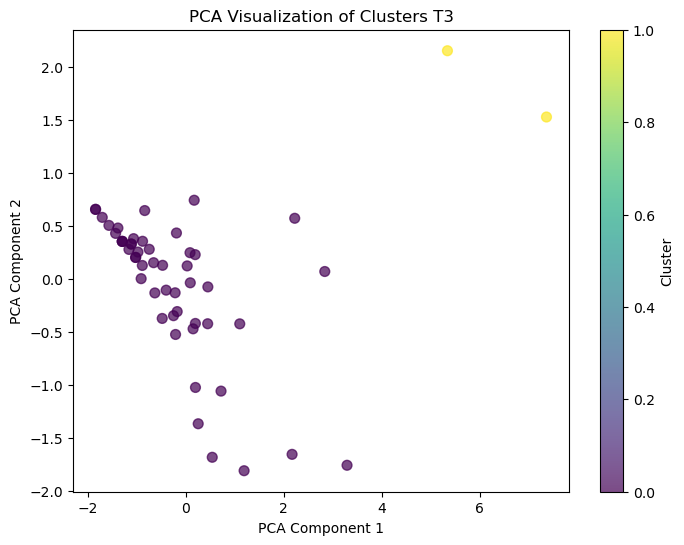

Cest la data de analyse cluster    Patient  GERT.S_.recognition  ARAT_grasp_affected  ARAT_grip_affected  \
0     P001            21.000000            18.000000           12.000000   
1     P003            29.000000            18.000000           12.000000   
2     P006            29.000000            15.000000           12.000000   
3     P008            40.000000            18.000000           12.000000   
4     P010            29.000000            18.000000           12.000000   
5     P011            40.000000            18.000000           12.000000   
6     P012            38.000000            18.000000           12.000000   
7     P013            67.000000            18.000000           12.000000   
8     P014            36.000000            18.000000           12.000000   
9     P016            62.000000            18.000000           12.000000   
10    P017            29.000000            18.000000           12.000000   
11    P018            45.000000            18.000000    

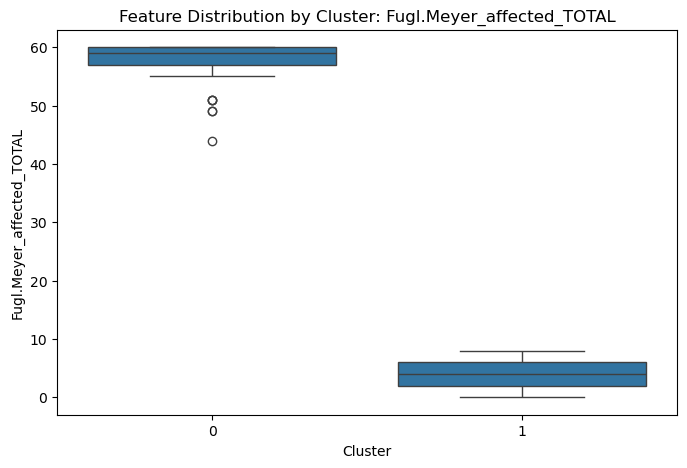

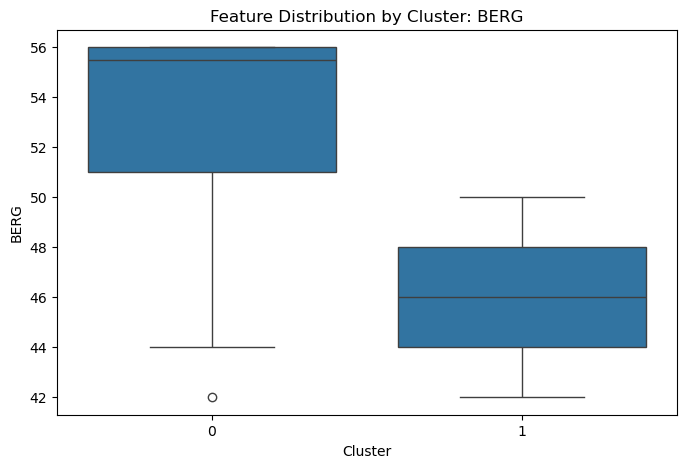

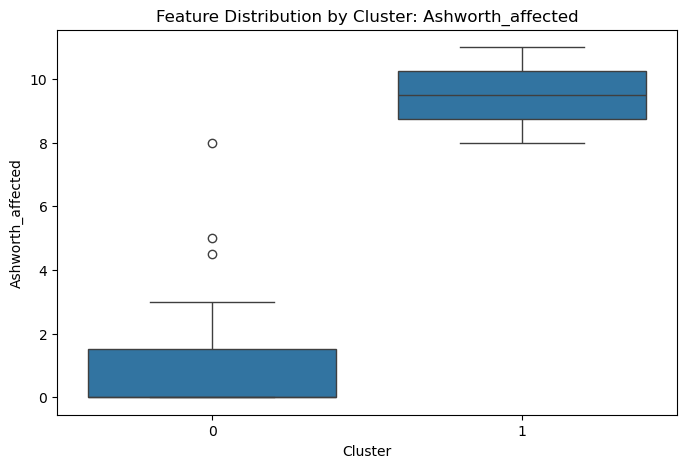

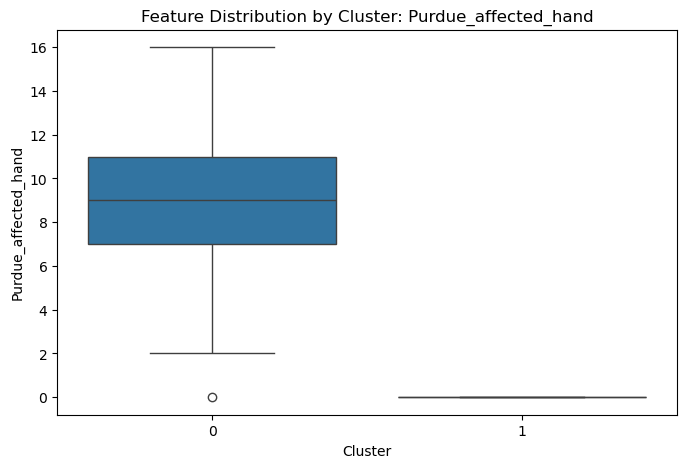


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0,  0, -1,  0, -1, -1,  0,  0,  0,  0,  0, -1, -1, -1,  0,  0, -1,
       -1, -1, -1, -1,  0,  0, -1, -1, -1, -1, -1, -1,  0,  0, -1, -1, -1,
        0,  0,  0, -1, -1, -1,  0, -1,  0, -1,  0,  0, -1, -1, -1,  0, -1,
       -1], dtype=int64), 'silhouette_score': 0.19267543682667637, 'dbi': 1.340070316109018, 'ch_score': 11.82185797251576}


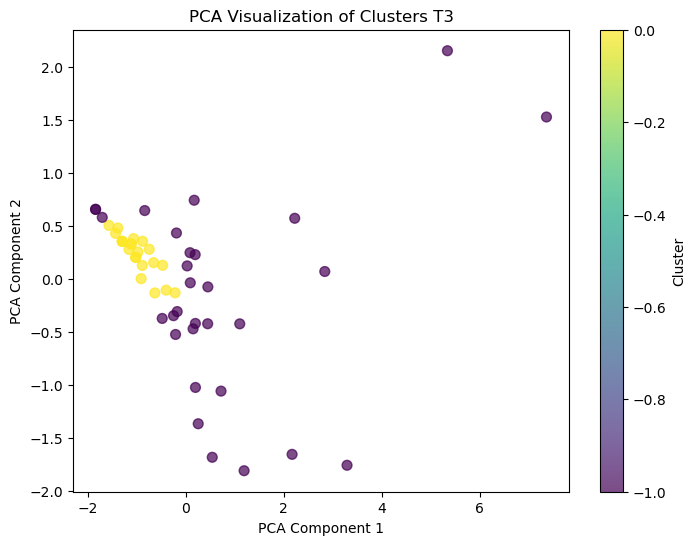

Cest la data de analyse cluster    Patient  GERT.S_.recognition  ARAT_grasp_affected  ARAT_grip_affected  \
0     P001            21.000000            18.000000           12.000000   
1     P003            29.000000            18.000000           12.000000   
2     P006            29.000000            15.000000           12.000000   
3     P008            40.000000            18.000000           12.000000   
4     P010            29.000000            18.000000           12.000000   
5     P011            40.000000            18.000000           12.000000   
6     P012            38.000000            18.000000           12.000000   
7     P013            67.000000            18.000000           12.000000   
8     P014            36.000000            18.000000           12.000000   
9     P016            62.000000            18.000000           12.000000   
10    P017            29.000000            18.000000           12.000000   
11    P018            45.000000            18.000000    

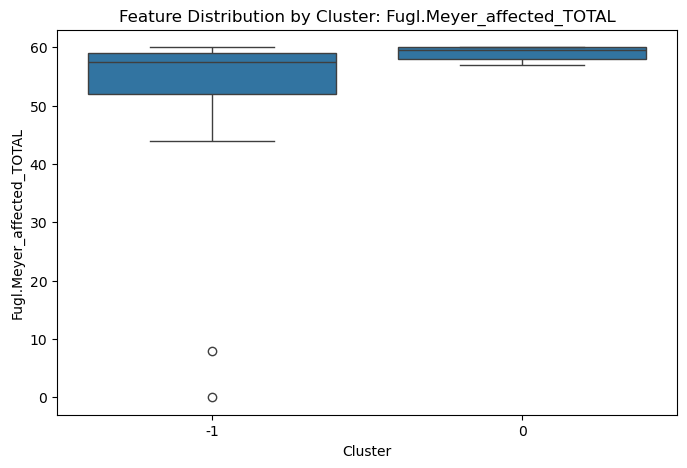

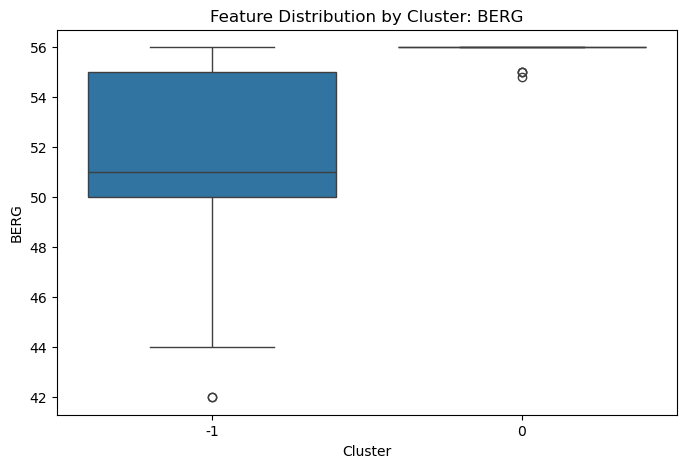

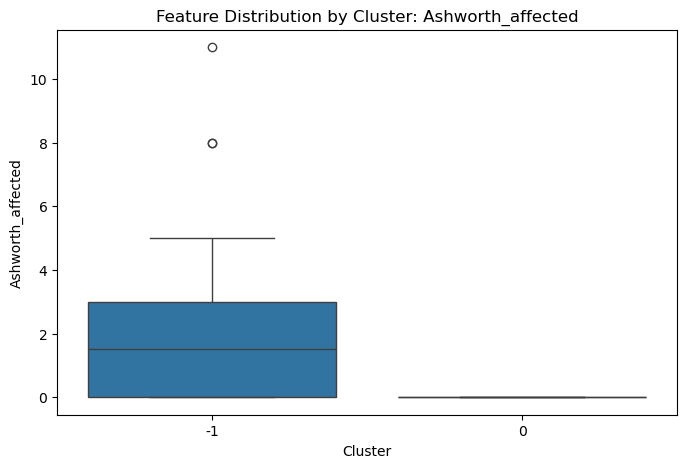

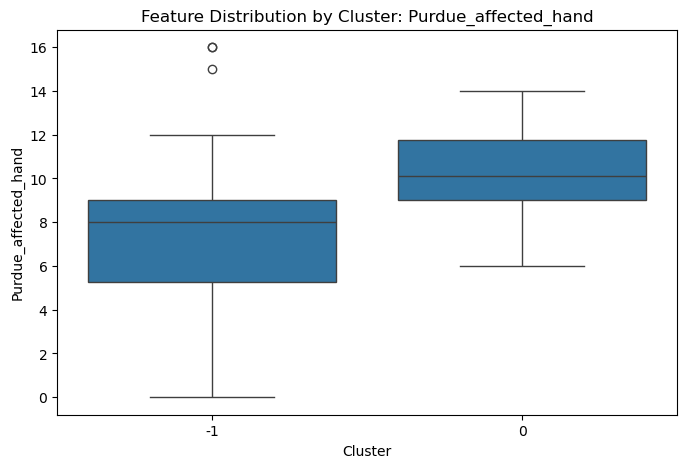


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int64), 'silhouette_score': 0.723354237037764, 'dbi': 0.37234118492075974, 'ch_score': 39.73774469793343}


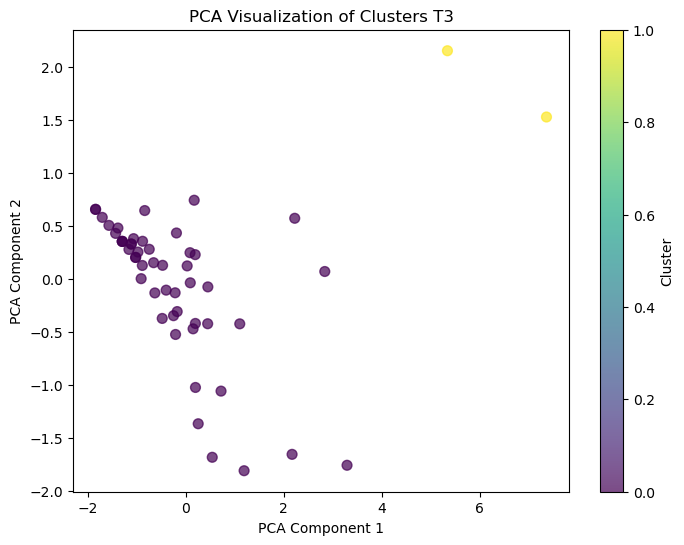

Cest la data de analyse cluster    Patient  GERT.S_.recognition  ARAT_grasp_affected  ARAT_grip_affected  \
0     P001            21.000000            18.000000           12.000000   
1     P003            29.000000            18.000000           12.000000   
2     P006            29.000000            15.000000           12.000000   
3     P008            40.000000            18.000000           12.000000   
4     P010            29.000000            18.000000           12.000000   
5     P011            40.000000            18.000000           12.000000   
6     P012            38.000000            18.000000           12.000000   
7     P013            67.000000            18.000000           12.000000   
8     P014            36.000000            18.000000           12.000000   
9     P016            62.000000            18.000000           12.000000   
10    P017            29.000000            18.000000           12.000000   
11    P018            45.000000            18.000000    

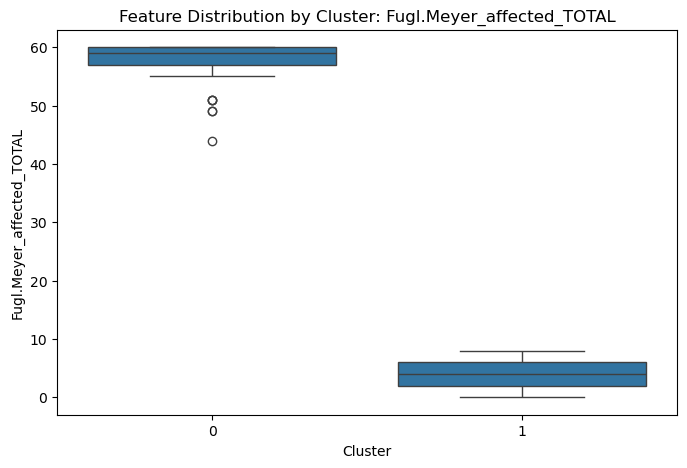

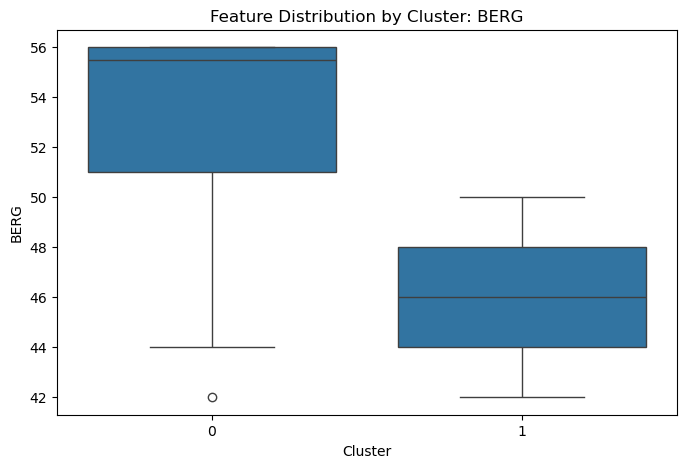

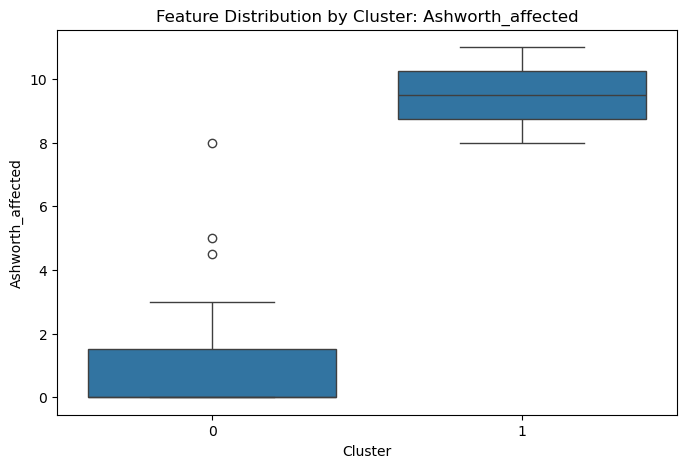

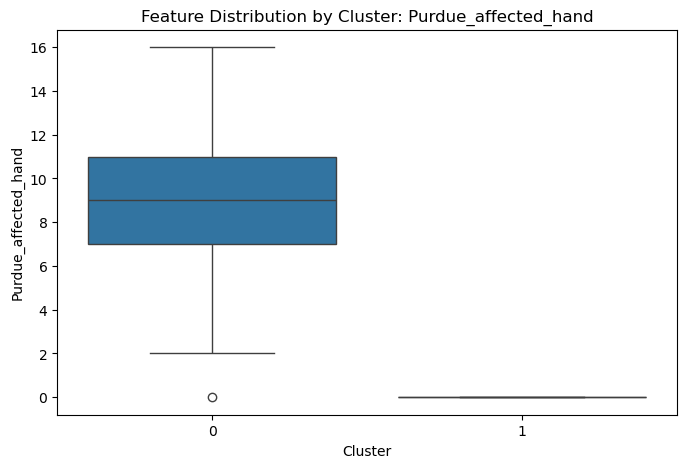


Testing kmeans with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0]), 'silhouette_score': 0.6120343815272817, 'dbi': 0.9334849727581114, 'ch_score': 33.41635396575601}


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


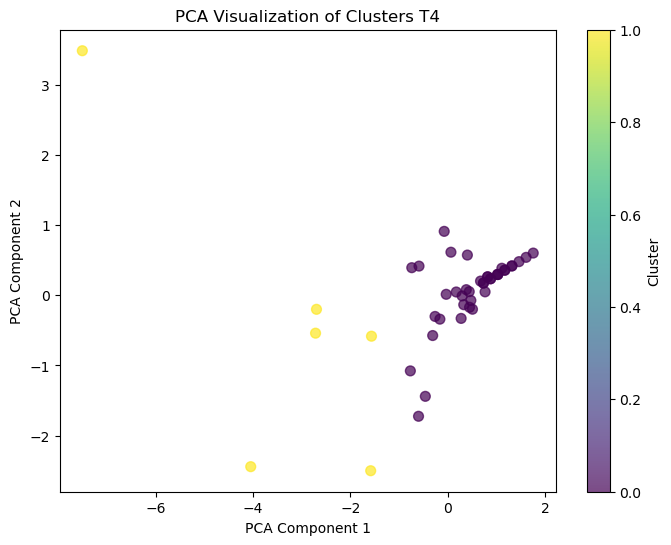

Cest la data de analyse cluster    Patient  GERT.S_.recognition  ARAT_grasp_affected  ARAT_grip_affected  \
0     P001            24.000000                   18                  12   
1     P002            19.000000                   18                  12   
2     P003            26.000000                   18                  12   
3     P004            31.000000                    0                   0   
4     P006            31.000000                   18                  12   
5     P008            31.000000                   18                  12   
6     P010            21.000000                   18                  12   
7     P011            33.000000                   18                  12   
8     P013            76.000000                   18                  12   
9     P014            31.000000                   18                  12   
10    P016            79.000000                   18                  12   
11    P017            57.000000                   18    

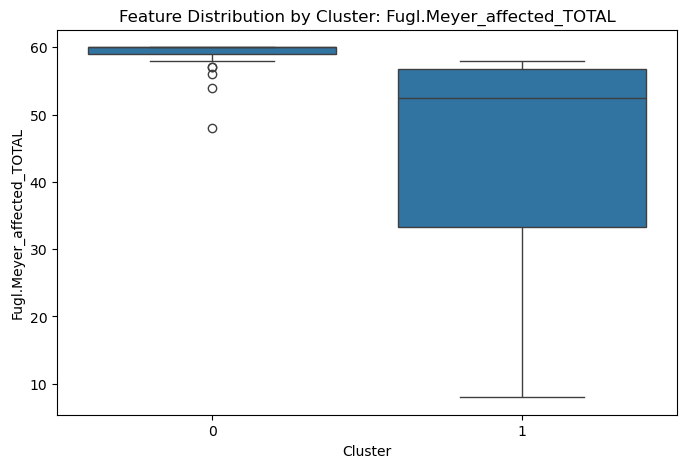

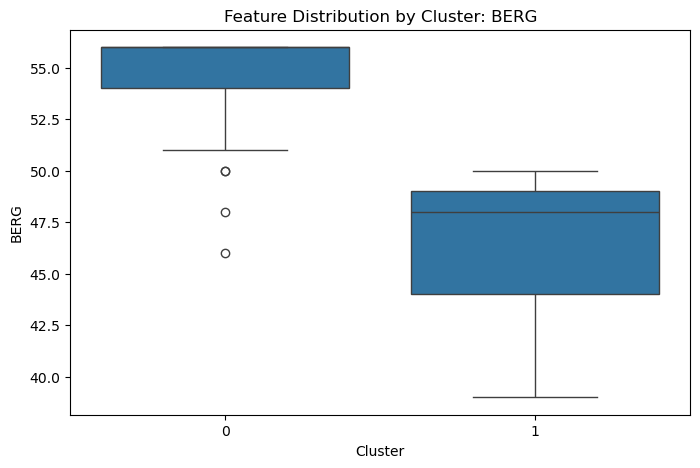

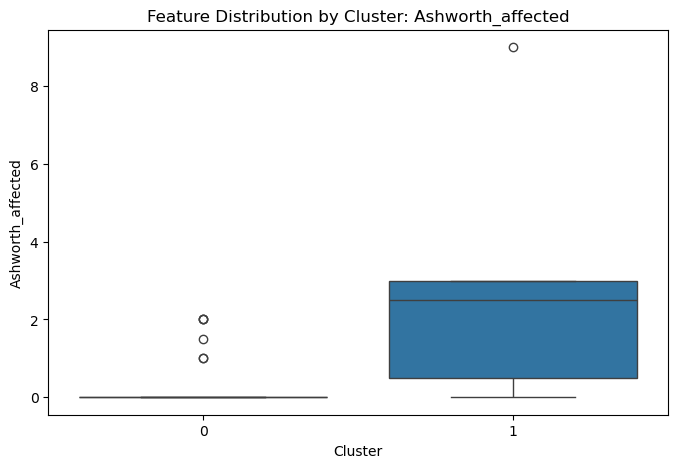

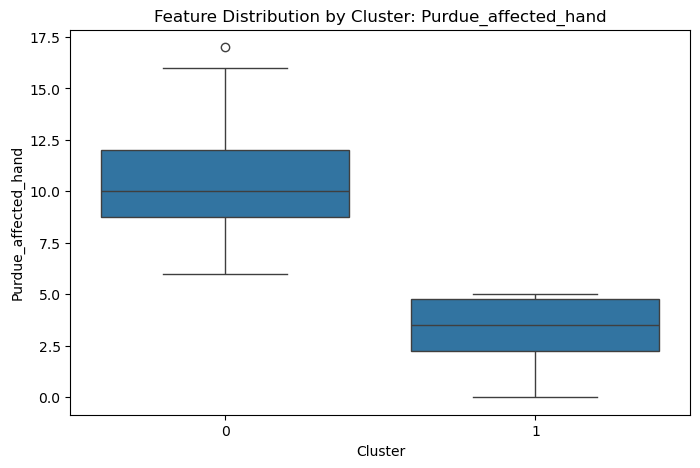


Testing dbscan with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([ 0, -1,  0, -1, -1, -1, -1, -1,  0,  0,  0,  0, -1, -1,  0,  0,  0,
        0, -1,  0,  0,  0, -1, -1,  0, -1,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0, -1, -1,  0,  0,  0, -1, -1, -1, -1], dtype=int64), 'silhouette_score': 0.32599241531864004, 'dbi': 1.4265275849044987, 'ch_score': 12.534908821556629}


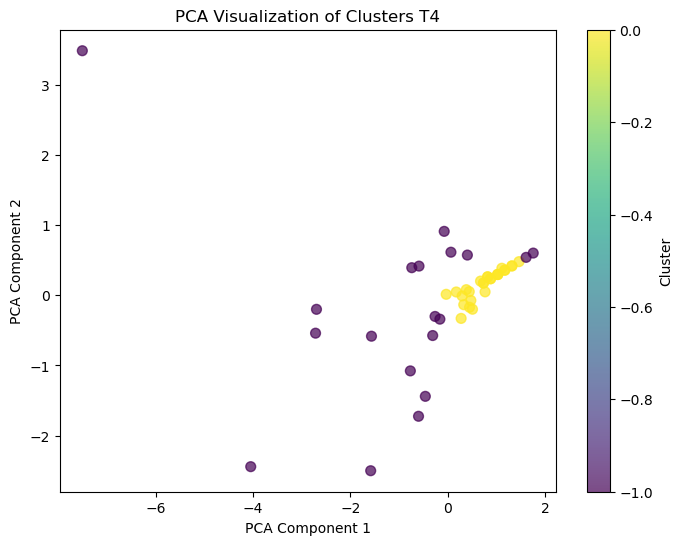

Cest la data de analyse cluster    Patient  GERT.S_.recognition  ARAT_grasp_affected  ARAT_grip_affected  \
0     P001            24.000000                   18                  12   
1     P002            19.000000                   18                  12   
2     P003            26.000000                   18                  12   
3     P004            31.000000                    0                   0   
4     P006            31.000000                   18                  12   
5     P008            31.000000                   18                  12   
6     P010            21.000000                   18                  12   
7     P011            33.000000                   18                  12   
8     P013            76.000000                   18                  12   
9     P014            31.000000                   18                  12   
10    P016            79.000000                   18                  12   
11    P017            57.000000                   18    

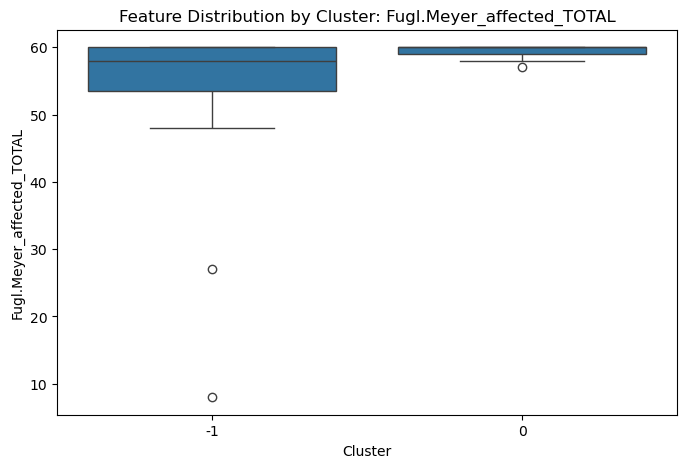

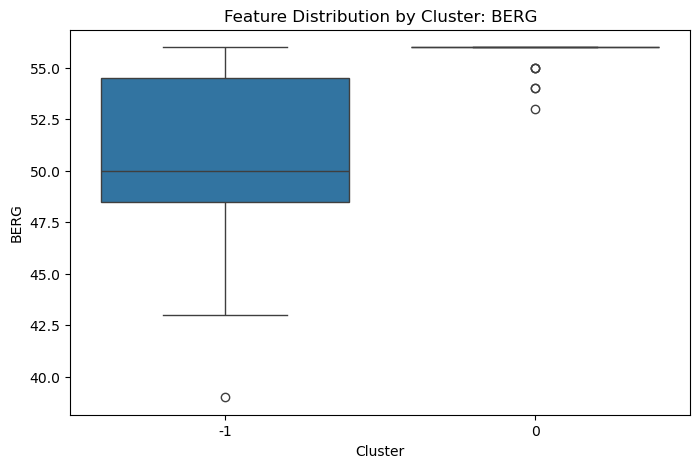

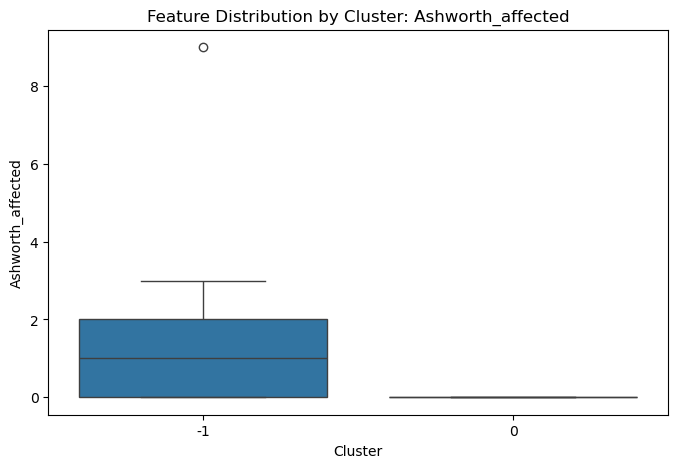

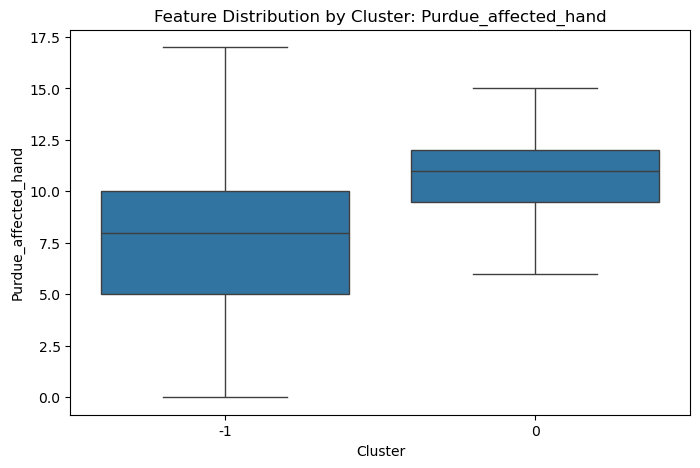


Testing hac with features: ('Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand')
Results: {'clusters': array([1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 0], dtype=int64), 'silhouette_score': 0.5686545592013715, 'dbi': 1.0120774372251395, 'ch_score': 29.625110827542333}


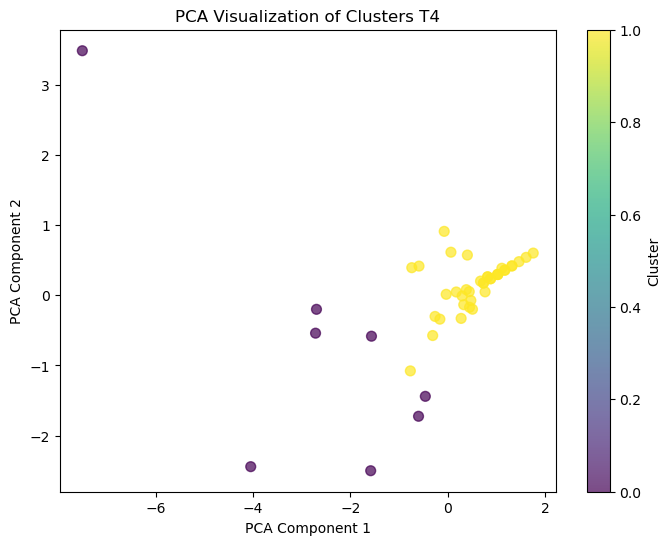

Cest la data de analyse cluster    Patient  GERT.S_.recognition  ARAT_grasp_affected  ARAT_grip_affected  \
0     P001            24.000000                   18                  12   
1     P002            19.000000                   18                  12   
2     P003            26.000000                   18                  12   
3     P004            31.000000                    0                   0   
4     P006            31.000000                   18                  12   
5     P008            31.000000                   18                  12   
6     P010            21.000000                   18                  12   
7     P011            33.000000                   18                  12   
8     P013            76.000000                   18                  12   
9     P014            31.000000                   18                  12   
10    P016            79.000000                   18                  12   
11    P017            57.000000                   18    

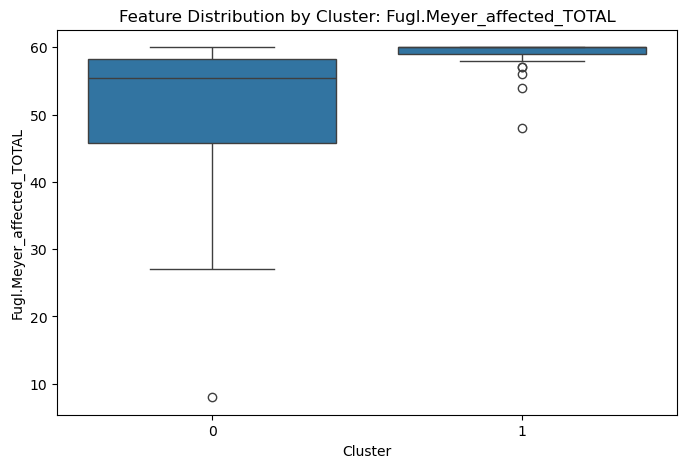

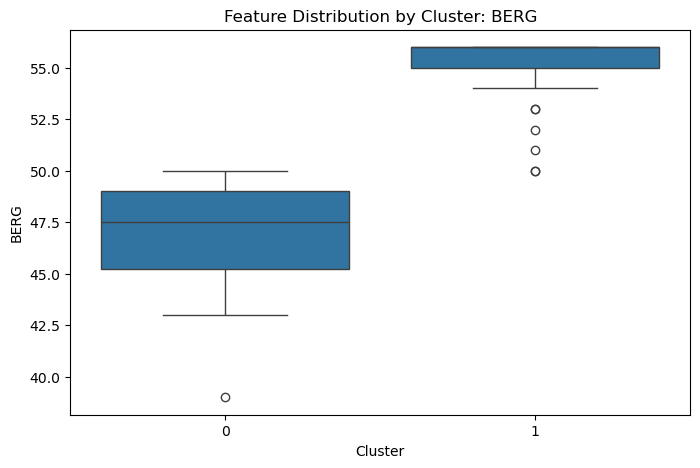

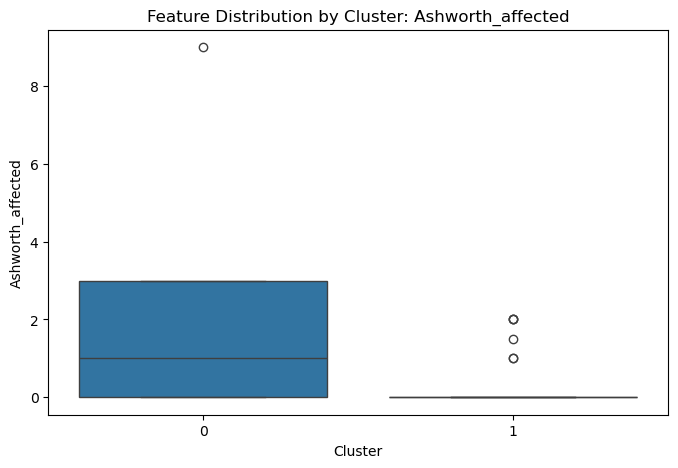

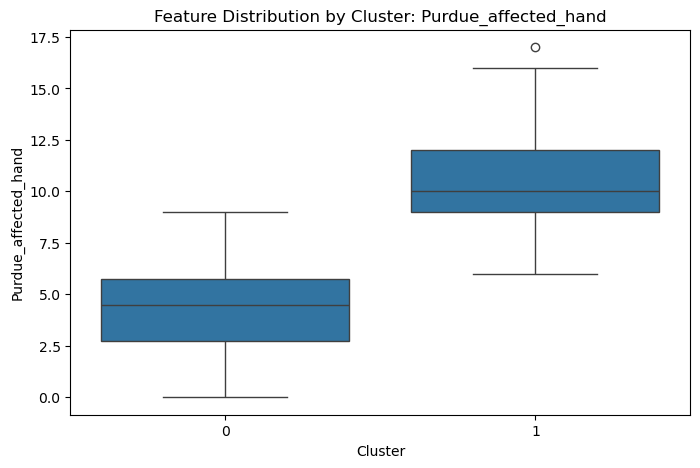

In [ ]:
import pandas as pd
import numpy as np
import itertools
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
import seaborn as sns


# Step 1: Data Preprocessing
def preprocess_data(data, features, impute_strategy="mean", scale=True):
    """
    Preprocesses data by imputing missing values and scaling.
    Args:
        data (pd.DataFrame): Input dataset.
        features (list): List of features to include.
        impute_strategy (str): Strategy for handling NaNs.
        scale (bool): Whether to scale features.
    Returns:
        np.array: Preprocessed data.
    """
    data_selected = data[features]
    imputer = SimpleImputer(strategy=impute_strategy)
    data_imputed = pd.DataFrame(imputer.fit_transform(data_selected), columns=features)

    if scale:
        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(data_imputed)
        return data_scaled
    return data_imputed


# Step 2: Pairwise Feature Combinations
def generate_feature_combinations(features):
    """
    Generate all pairwise combinations of features for clustering exploration.
    Args:
        features (list): List of feature names.
    Returns:
        list: List of tuples containing feature combinations.
    """
    return list(itertools.combinations(features, 4))


# Step 3: Clustering and Validation
def cluster_and_evaluate(data, algorithm="kmeans", params=None):
    """
    Perform clustering and evaluate using internal metrics.
    Args:
        data (np.array): Preprocessed data.
        algorithm (str): Clustering algorithm to use ("kmeans", "dbscan", "hac").
        params (dict): Parameters for the chosen clustering algorithm.
    Returns:
        dict: Dictionary with clustering results and metrics.
    """
    if algorithm == "kmeans":
        model = KMeans(n_clusters=params.get("n_clusters", 2), random_state=42)
    elif algorithm == "dbscan":
        model = DBSCAN(eps=params.get("eps", 0.5), min_samples=params.get("min_samples", 5))
    elif algorithm == "hac":
        model = AgglomerativeClustering(n_clusters=params.get("n_clusters", 2), linkage=params.get("linkage", "ward"))
    else:
        raise ValueError("Unsupported algorithm")

    clusters = model.fit_predict(data)
    silhouette = silhouette_score(data, clusters) if len(set(clusters)) > 1 else None
    dbi = davies_bouldin_score(data, clusters) if len(set(clusters)) > 1 else None
    ch_score = calinski_harabasz_score(data, clusters) if len(set(clusters)) > 1 else None

    return {
        "clusters": clusters,
        "silhouette_score": silhouette,
        "dbi": dbi,
        "ch_score": ch_score,
    }


# Step 4: Visualize Clusters
def visualize_clusters(data, clusters, idx):
    """
    Visualize clusters in 2D using PCA.
    Args:
        data (np.array): Data to visualize.
        clusters (np.array): Cluster labels.
    """
    pca = PCA(n_components=2, random_state=42)
    data_reduced = pca.fit_transform(data)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=clusters, cmap="viridis", s=50, alpha=0.7)
    plt.colorbar(scatter, label="Cluster")
    plt.title(f"PCA Visualization of Clusters T{idx+1}")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()


# Step 5: Analyze Clusters
def analyze_clusters(data, clusters, features):
    """
    Analyze clusters by summarizing feature statistics and visualizing distributions.
    Args:
        data (pd.DataFrame): Original dataset.
        clusters (np.array): Cluster labels.
        features (list): List of features to analyze.
    """
    print("Cest la data de analyse cluster",data)
    data["Cluster"] = clusters

    # Summarize cluster statistics
    summary = data.groupby("Cluster")[features].agg(["mean", "median", "std"])
    print("\nCluster Summary Statistics:\n", summary)

    # Plot feature distributions
    for feature in features:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x="Cluster", y=feature, data=data)
        plt.title(f"Feature Distribution by Cluster: {feature}")
        plt.xlabel("Cluster")
        plt.ylabel(feature)
        plt.show()


# Step 6: Main Pipeline
def main_pipeline(data, features, algorithms, params, idx):
    """
    Run the clustering pipeline with iterative exploration and visualization.
    Args:
        data (pd.DataFrame): Input dataset.
        features (list): List of feature names.
        algorithms (list): List of clustering algorithms to test.
        params (dict): Parameters for each algorithm.
        idx (int): Index of the current timepoint.
    """
    results = []
    for algo in algorithms:
        for combo in generate_feature_combinations(features):
            print(f"\nTesting {algo} with features: {combo}")
            data_preprocessed = preprocess_data(data, list(combo))
            result = cluster_and_evaluate(data_preprocessed, algorithm=algo, params=params.get(algo, {}))
            print(f"Results: {result}")
            visualize_clusters(data_preprocessed, result["clusters"], idx)
            analyze_clusters(data, result["clusters"], list(combo))
            results.append({"features": combo, "algorithm": algo, "metrics": result})
    return results


# Run the pipeline
file_paths = [
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT1.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT2.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT3.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT4.xlsx",
]
features = ["Fugl.Meyer_affected_TOTAL", "BERG", "Ashworth_affected", "Purdue_affected_hand"]
algorithms = ["kmeans", "dbscan", "hac"]
params = {
    "kmeans": {"n_clusters": 2},
    "dbscan": {"eps": 0.5, "min_samples": 5},
    "hac": {"n_clusters": 2, "linkage": "ward"},
}

for idx, path in enumerate(file_paths):
    data = pd.read_excel(path)
    results = main_pipeline(data, features, algorithms, params, idx)

# Version 07/12 17:31 dans la quelle on peut utiliser les general features + PCA ou non de maniere modulaire

- data vrmt imblanced, possibilité d'utiliser SMOTE
- regarder les graph et s'occuper des skewed distributions
- on peut changer le threshold de la corr matrix + les features connectomes ou non + les features généraux ou non+
le nbr de clusters (2 était tjs le mieux pour moi), les params des modèles, le % de variance que le PCA garde
- ultra sensible aux changements des hyper paramètres :(

(47, 4)
(47, 4)

Testing kmeans with features: ['Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand'] and preprocessing scaler


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


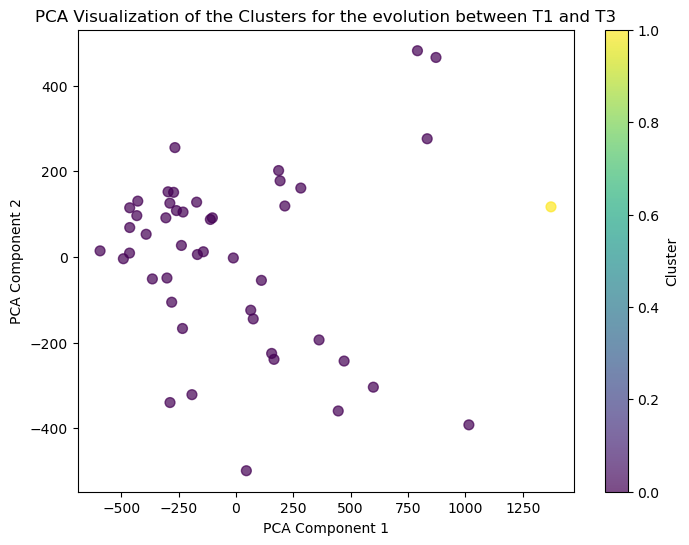


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                            BERG             \
                             mean     median       std       mean     median   
Cluster                                                                        
0                       -0.514788  -0.035423  1.713307  -0.519305  -0.038476   
1                      -51.000000 -51.000000       NaN -17.666667 -17.666667   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
0        1.315405          0.194233    0.0  0.737808            -0.770996   
1             NaN          1.000000    1.0       NaN            -7.000000   

                            
          median       std  
Cluster                     
0       -0.20202  2.065057  
1       -7.00000       NaN  


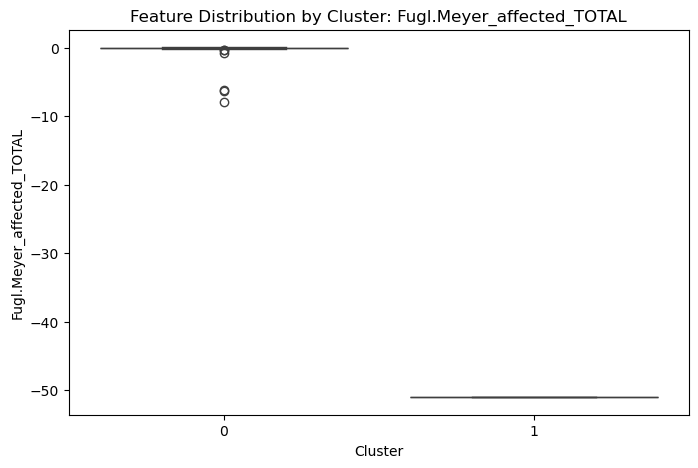

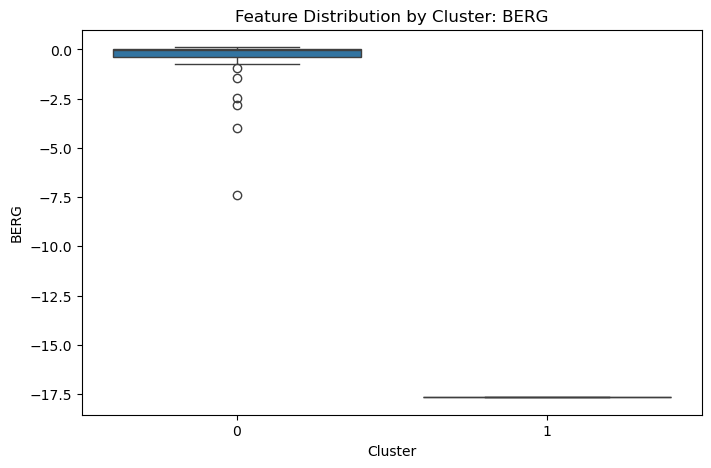

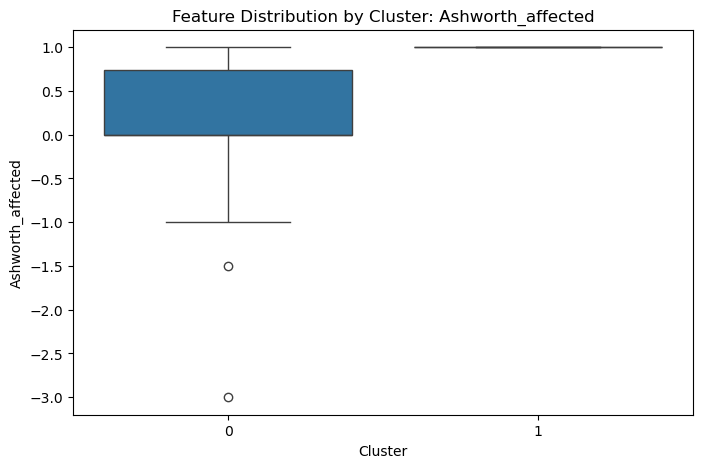

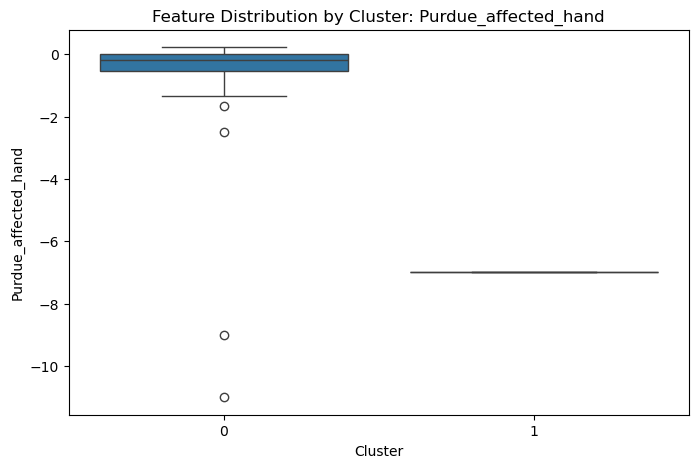

(47, 4)
(47, 4)

Testing kmeans with features: ['Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand'] and preprocessing min_max


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


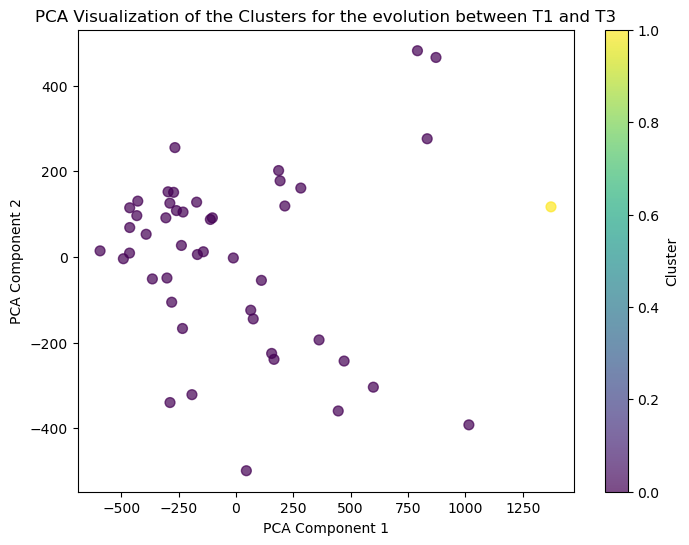


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                            BERG             \
                             mean     median       std       mean     median   
Cluster                                                                        
0                       -0.514788  -0.035423  1.713307  -0.519305  -0.038476   
1                      -51.000000 -51.000000       NaN -17.666667 -17.666667   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
0        1.315405          0.194233    0.0  0.737808            -0.770996   
1             NaN          1.000000    1.0       NaN            -7.000000   

                            
          median       std  
Cluster                     
0       -0.20202  2.065057  
1       -7.00000       NaN  


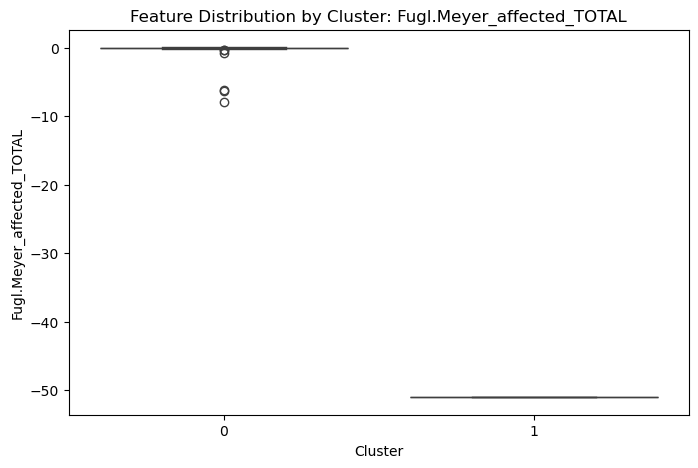

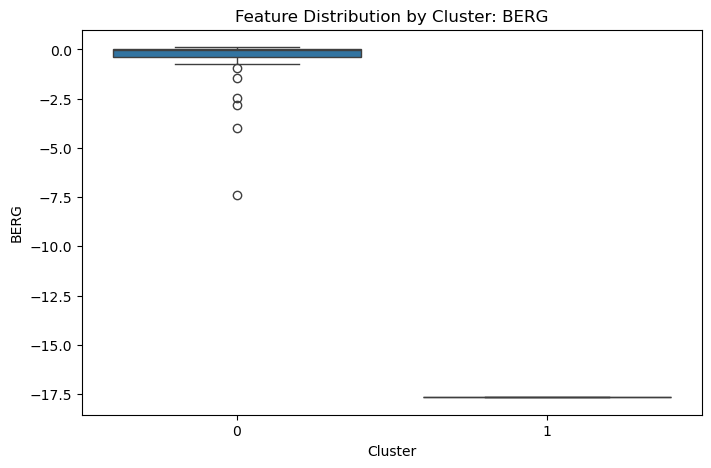

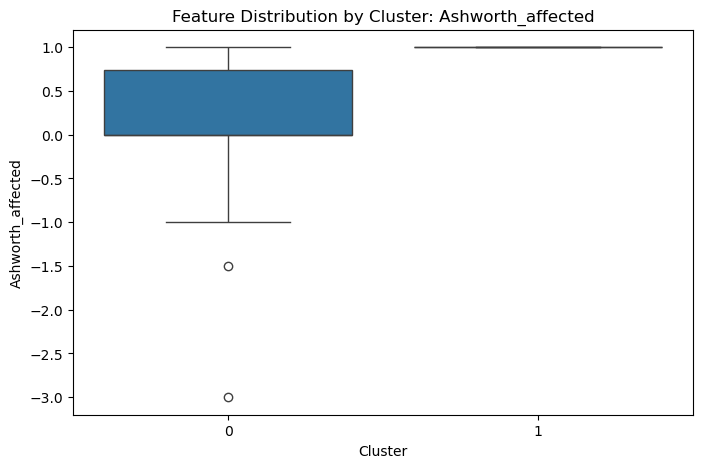

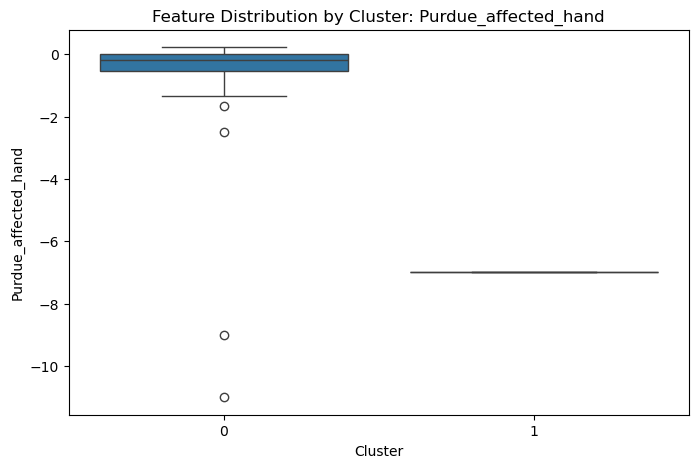

(47, 4)
(47, 4)

Testing gmm with features: ['Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand'] and preprocessing scaler


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


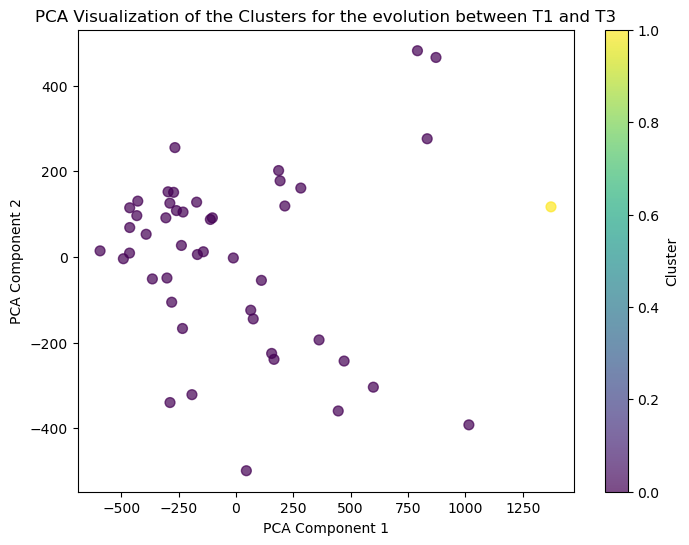


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                            BERG             \
                             mean     median       std       mean     median   
Cluster                                                                        
0                       -0.514788  -0.035423  1.713307  -0.519305  -0.038476   
1                      -51.000000 -51.000000       NaN -17.666667 -17.666667   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
0        1.315405          0.194233    0.0  0.737808            -0.770996   
1             NaN          1.000000    1.0       NaN            -7.000000   

                            
          median       std  
Cluster                     
0       -0.20202  2.065057  
1       -7.00000       NaN  


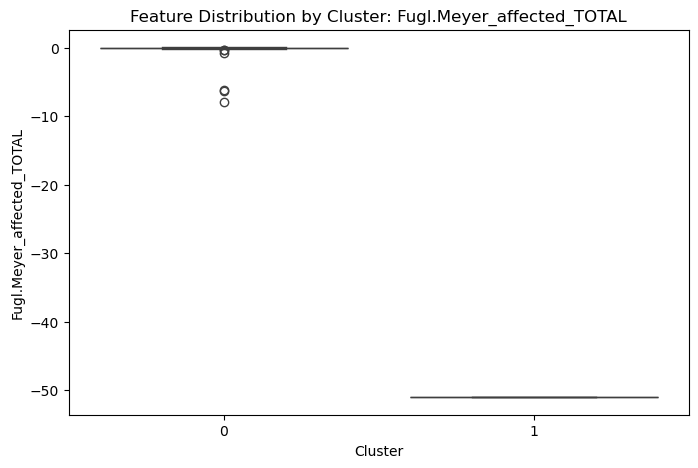

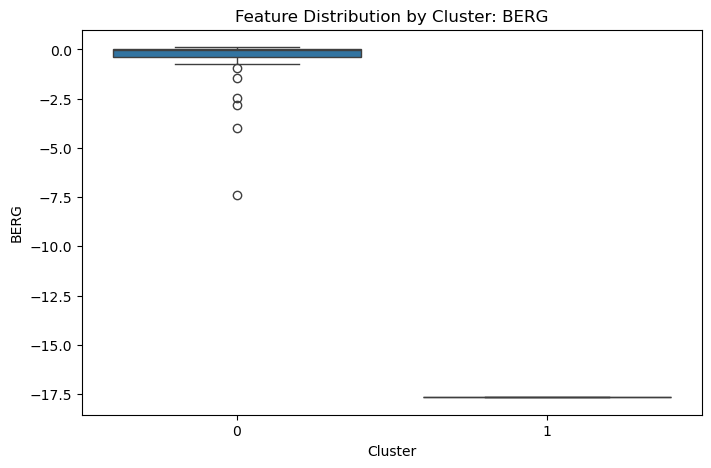

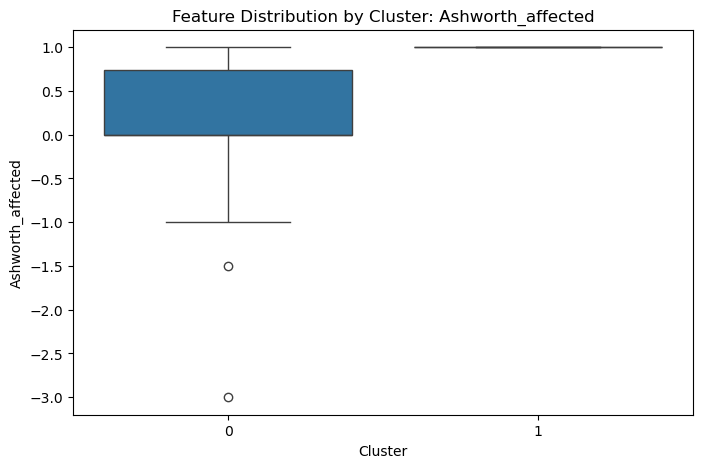

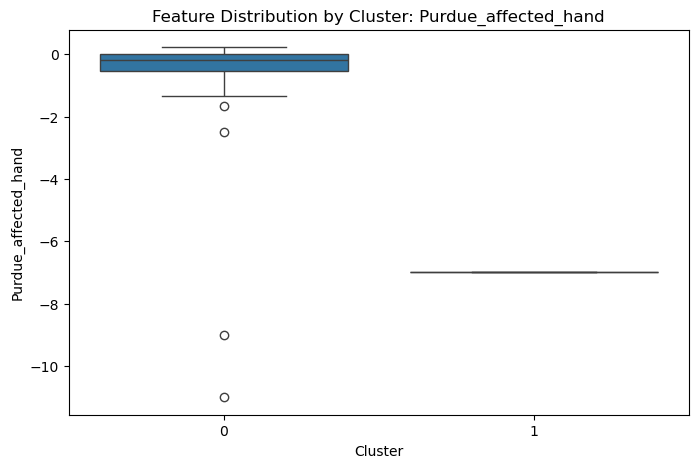

(47, 4)
(47, 4)

Testing gmm with features: ['Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand'] and preprocessing min_max


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


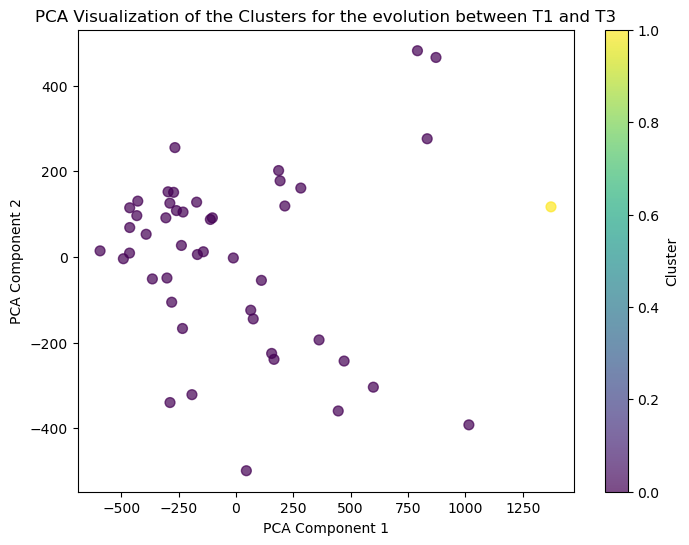


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                            BERG             \
                             mean     median       std       mean     median   
Cluster                                                                        
0                       -0.514788  -0.035423  1.713307  -0.519305  -0.038476   
1                      -51.000000 -51.000000       NaN -17.666667 -17.666667   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
0        1.315405          0.194233    0.0  0.737808            -0.770996   
1             NaN          1.000000    1.0       NaN            -7.000000   

                            
          median       std  
Cluster                     
0       -0.20202  2.065057  
1       -7.00000       NaN  


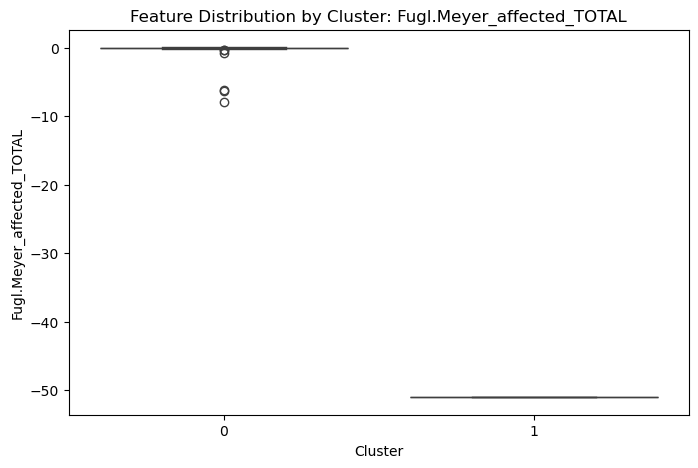

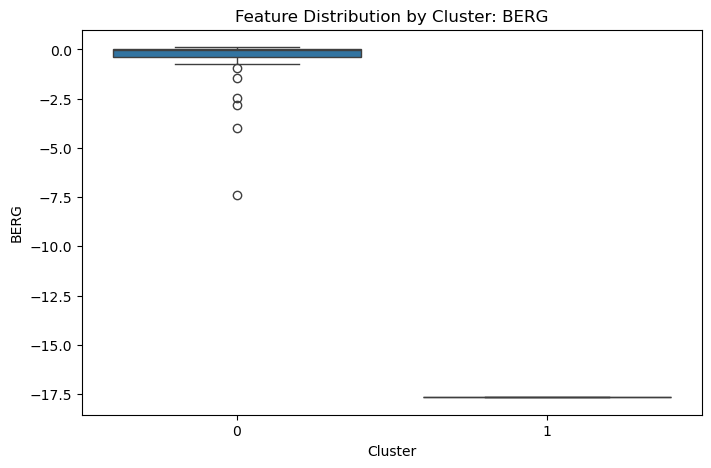

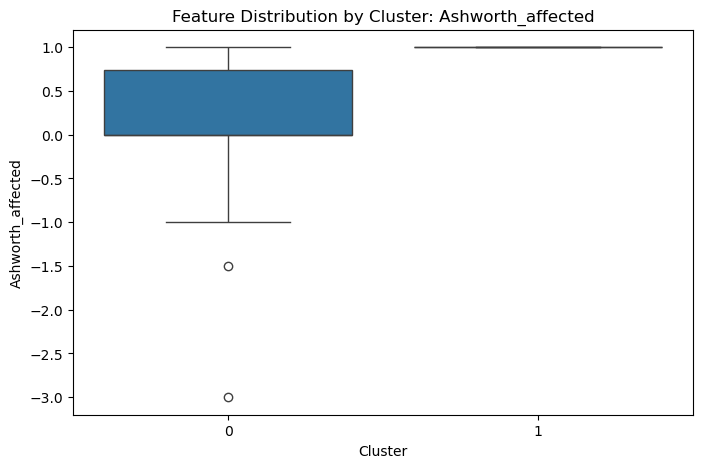

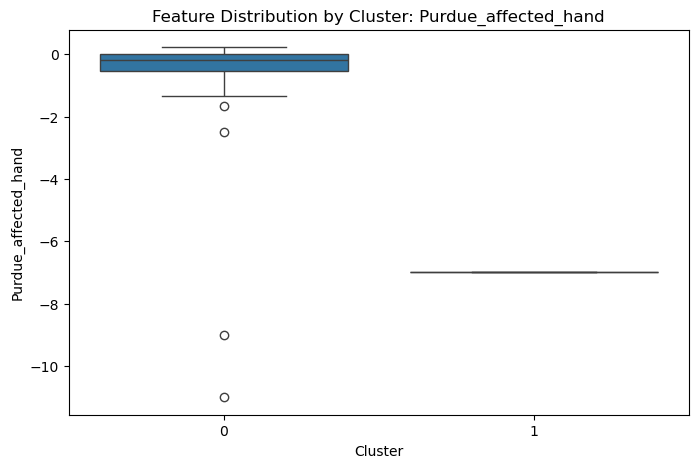

(47, 4)
(47, 4)

Testing hac with features: ['Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand'] and preprocessing scaler


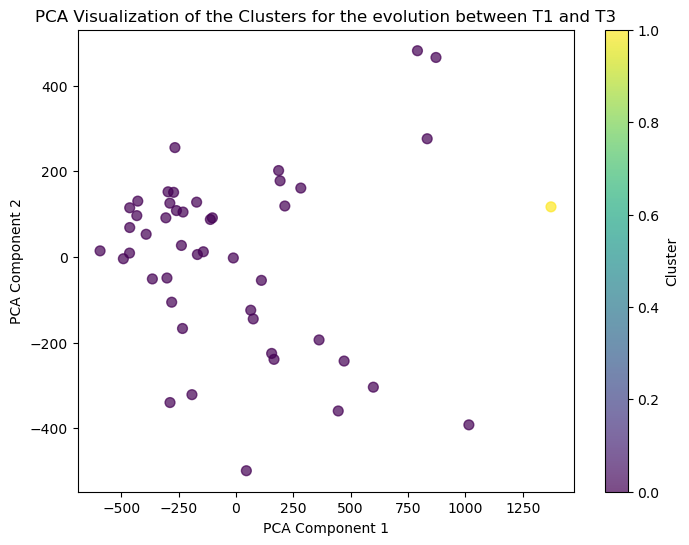


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                            BERG             \
                             mean     median       std       mean     median   
Cluster                                                                        
0                       -0.514788  -0.035423  1.713307  -0.519305  -0.038476   
1                      -51.000000 -51.000000       NaN -17.666667 -17.666667   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
0        1.315405          0.194233    0.0  0.737808            -0.770996   
1             NaN          1.000000    1.0       NaN            -7.000000   

                            
          median       std  
Cluster                     
0       -0.20202  2.065057  
1       -7.00000       NaN  


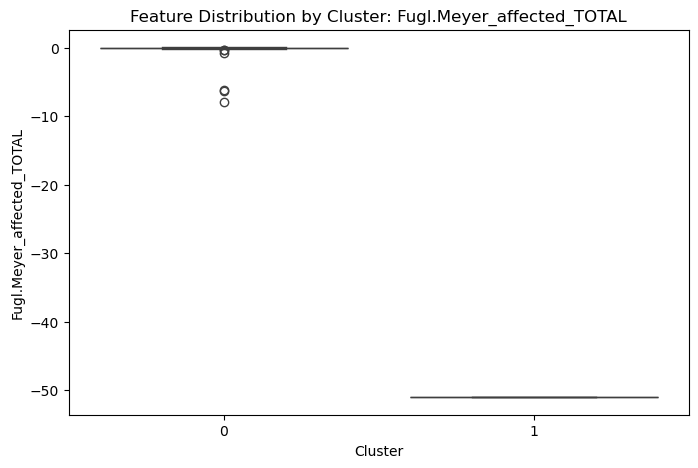

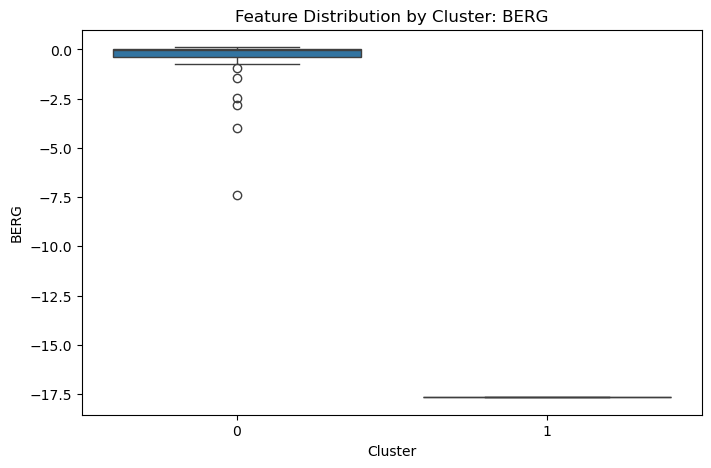

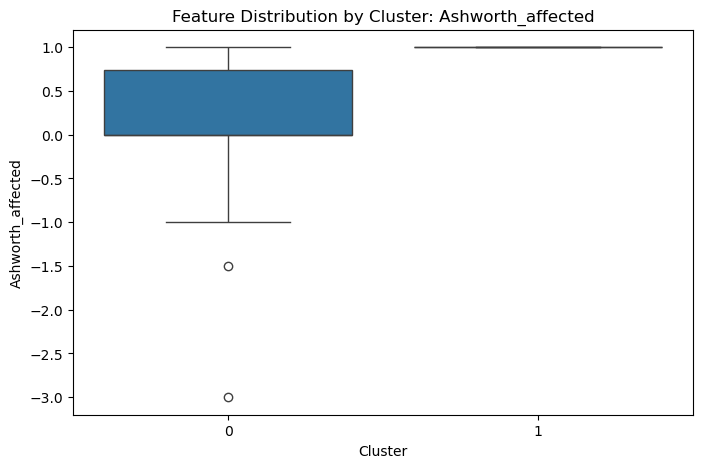

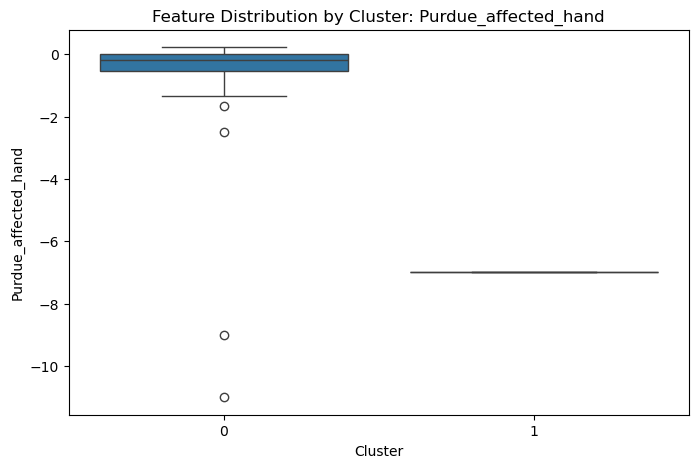

(47, 4)
(47, 4)

Testing hac with features: ['Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand'] and preprocessing min_max


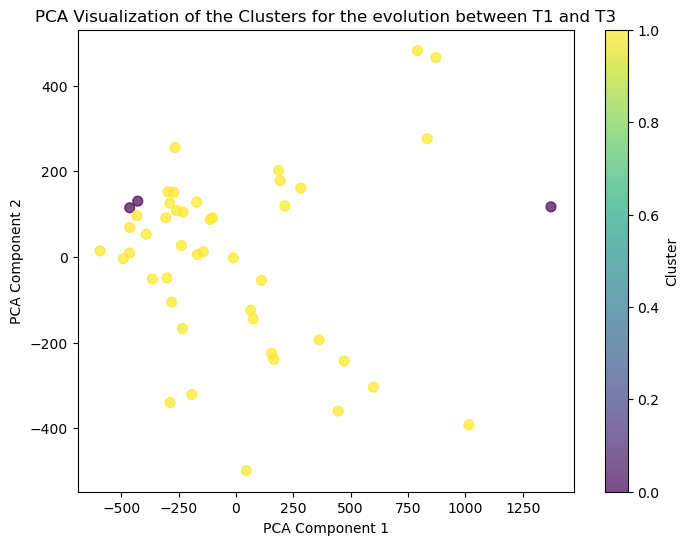


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                           BERG            \
                             mean    median        std      mean    median   
Cluster                                                                      
0                      -19.181818 -6.250000  27.715730 -6.331654 -0.931034   
1                       -0.389427 -0.034483   1.513211 -0.512721 -0.037386   

                  Ashworth_affected                  Purdue_affected_hand  \
              std              mean median       std                 mean   
Cluster                                                                     
0        9.820036          0.916667    1.0  0.144338            -9.000000   
1        1.344037          0.163289    0.0  0.739200            -0.351496   

                             
           median       std  
Cluster                      
0       -9.000000  2.000000  
1       -0.170292  0.524038  


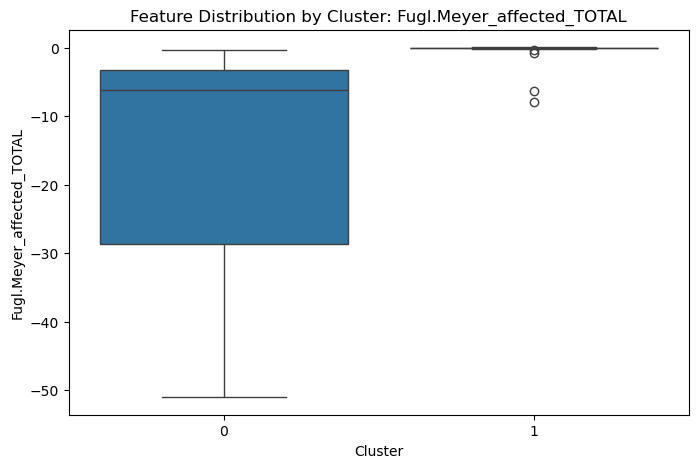

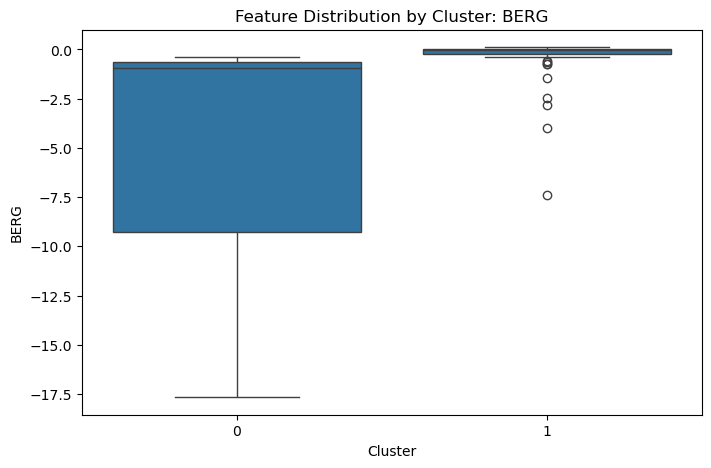

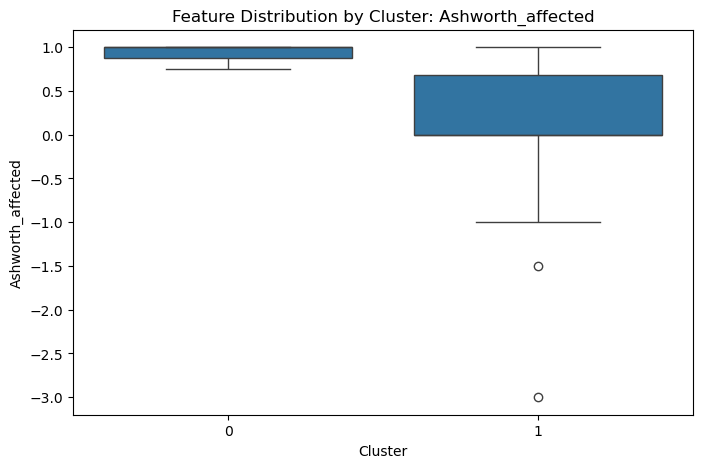

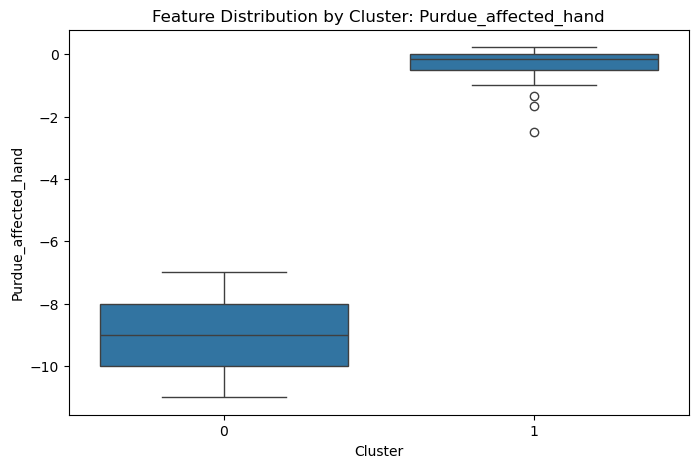

In [ ]:

import pandas as pd
import numpy as np
import itertools
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
import seaborn as sns

# Set this variable to True or False to include or exclude general features
use_general_features = True

# Step 0: Get the temporality T3-T1
def get_df_temp(df1, df2, features):
    df_tot = df1[df1.loc[:, "Patient"].isin(df2["Patient"])].reset_index(drop=True)
    A = df1["Patient"].isin(df2["Patient"])
    list_patients = df1.loc[A.values, "Patient"].values
    A = df1[df1["Patient"].isin(list_patients)][features].reset_index(drop=True).copy()
    print(A.shape)
    B = df2[df2["Patient"].isin(list_patients)][features].reset_index(drop=True).copy()
    A_replaced = A.replace(0, 1)
    
    feature_diff = (A - B) / A_replaced
    df_tot[features] = feature_diff
    return df_tot
# Step 0bis: Get the pca features

# Step 1: Data Preprocessing
def preprocess_temporal_data(df1, df2, df_raw, features, general_features, impute_strategy="mean", normalization=None, use_general_features=True,use_pca_features=False):

    df_tot = get_df_temp(df1, df2, features)
    df_tot = pd.merge(df_tot, df_raw, on="Patient")

    if use_general_features:
        all_features = general_features[1:] + features
    else:
        all_features = features

    data_selected = df_tot[["Patient"] + all_features].dropna(axis=0).reset_index(drop=True)
    patients = data_selected["Patient"]
    data_features = data_selected.drop(columns="Patient")
    imputer = SimpleImputer(strategy=impute_strategy)
    data_imputed = pd.DataFrame(imputer.fit_transform(data_features), columns=all_features)

    if normalization == "scaler":
        scaler = StandardScaler()
        data_scaled = pd.DataFrame(scaler.fit_transform(data_imputed), columns=all_features)
    elif normalization == "min_max":
        scaler = MinMaxScaler()
        data_scaled = pd.DataFrame(scaler.fit_transform(data_imputed), columns=all_features)
    else:
        data_scaled = data_imputed
    if use_pca_features==True:
        data_scaled["Patient"] = patients.values
        #df_pca=pd.DataFrame(get_pca_connectomes("T3"))
    data_scaled["Patient"] = patients.values
    return data_scaled

# Step 2: Clustering and Validation
def cluster_and_evaluate(data, algorithm="kmeans", params=None):
    if algorithm == "kmeans":
        model = KMeans(n_clusters=params.get("n_clusters", 2), random_state=42)
    elif algorithm == "gmm":
        model = GaussianMixture(
            n_components=params.get("n_clusters", 2),
            covariance_type=params.get("covariance_type", "full"),
            random_state=42
        )
    elif algorithm == "hac":
        model = AgglomerativeClustering(n_clusters=params.get("n_clusters", 2), linkage=params.get("linkage", "ward"))
    else:
        raise ValueError("Unsupported algorithm")

    clusters = model.fit_predict(data)
    silhouette = silhouette_score(data, clusters) if len(set(clusters)) > 1 else None
    dbi = davies_bouldin_score(data, clusters) if len(set(clusters)) > 1 else None
    ch_score = calinski_harabasz_score(data, clusters) if len(set(clusters)) > 1 else None
    
    return {
        "clusters": clusters,
        "silhouette_score": silhouette,
        "dbi": dbi,
        "ch_score": ch_score,
    }

# Step 3: Visualize Clusters
def visualize_clusters(data, clusters, idx):
    pca = PCA(n_components=2, random_state=42)
    data_reduced = pca.fit_transform(data)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=clusters, cmap="viridis", s=50, alpha=0.7)
    plt.colorbar(scatter, label="Cluster")
    plt.title(f"PCA Visualization of the Clusters for the evolution between T1 and T3")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()

# Step 4: Analyze Clusters
def analyze_clusters(data, clusters, features):
    data = data.copy()
    data["Cluster"] = clusters

    # Only aggregate numeric columns
    numeric_features = data[features].select_dtypes(include=[np.number]).columns.tolist()

    summary = data.groupby("Cluster")[numeric_features].agg(["mean", "median", "std"])
    print("\nCluster Summary Statistics:\n", summary)

    # Plot feature distributions
    for feature in numeric_features:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x="Cluster", y=feature, data=data)
        plt.title(f"Feature Distribution by Cluster: {feature}")
        plt.xlabel("Cluster")
        plt.ylabel(feature)
        plt.show()

# Step 5: Main Pipeline
def main_temporal_pipeline(df1, df2, df_raw, features, general_features, algorithms, params, preprocesses, idx, use_general_features=True):
    results = []
    for algo in algorithms:

        for preprocess in preprocesses:
            df_tot_begin = get_df_temp(df1, df2, features)
            df_raw_filtered = df_raw[df_raw["Patient"].isin(df_tot_begin["Patient"])].reset_index(drop=True)
            df_tot = pd.merge(df_tot_begin, df_raw_filtered, on="Patient")
            df_tot=df_tot.drop(columns="Patient")
            data_temporal_preprocessed = preprocess_temporal_data(
                df1, df2, df_raw_filtered, features, general_features, "mean", preprocess, use_general_features=use_general_features
            )
            
            clustering_data = data_temporal_preprocessed.drop(columns=["Patient"])
            result = cluster_and_evaluate(clustering_data, algorithm=algo, params=params.get(algo, {}))
            if (result["silhouette_score"] is not None and 
                result["dbi"] is not None and 
                result["ch_score"] is not None and 
                result["silhouette_score"] > 0.3 and 
                result["dbi"] < 0.9 and 
                result["ch_score"] > 8):
                
                if use_general_features:
                    analyzed_features = features + general_features[1:]
                else:
                    analyzed_features = features
                
                print(f"\nTesting {algo} with features: {analyzed_features} and preprocessing {preprocess}")
                visualize_clusters(df_tot, result["clusters"], idx)
                analyze_clusters(df_tot, result["clusters"], analyzed_features)
                
                results.append({"features": analyzed_features, "algorithm": algo, "metrics": result})
    
    return results

cd = os.getcwd()
path_raw_data = os.path.join(cd, r"data\TiMeS_Raw_Data2023.xlsx")
file_paths = [
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT1.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT2.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT3.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT4.xlsx",
]

df1 = pd.read_excel(file_paths[0])
df2 = pd.read_excel(file_paths[2])
df_raw = pd.read_excel(path_raw_data)

general_features=["Patient","Age","Gender","Affected_side","Thrombolysis"]
motor_features = ["Fugl.Meyer_affected_TOTAL", "BERG", "Ashworth_affected", "Purdue_affected_hand"]
attention_features=["TAP_alert_without_warning_RT","TAP_single_condition_auditive_RT","TAP_single_condition_visual_RT"
                    "TAP_both_conditions_auditive_RT","TAP_ both_conditions_visual_RT",
                    "Bells_omissions_total","CTM_A_time"]
executive_features=["Bimanual_coordination_corrected_total","FAB_total","AST_unaffected_total","CERAD_copy_tota"
                    "Stroop_interference_time","Digit_backward_total","Digit_sequencing_total","Corsi_backward_total",
                    "CTM_B_time"]
memory_features=["Digit_forward_total","Corsi_forward total"]
sensory_features=["RASP_Total_unaffected"]
language_features=["Fluency_phon_final_score","Fluency_sem_final_score","LAST_TOTAL"]
neglect_features=["Line_bisection_20cm","Line_bisection_5cm","Bells_omission_LR"]

features=motor_features

algorithms = ["kmeans", "gmm", "hac"]
preprocesses = ["scaler","min_max"]
params = {
    "kmeans": {"n_clusters": 2},
    "gmm": {"n_clusters": 2, "covariance_type": "full"},
    "hac": {"n_clusters": 2, "linkage": "ward"},
}

# Encode categorical variables
df_raw = pd.get_dummies(df_raw[general_features], columns=["Gender","Affected_side"], drop_first=True)
df_raw.rename(columns={"Gender_2": "Is_Male", "Affected_side_2": "Is_Right_Side_Affected"}, inplace=True)
general_features = ["Patient", "Age", "Is_Male", "Is_Right_Side_Affected", "Thrombolysis"]
df_raw_final = df_raw.groupby("Patient").agg("mean").reset_index()

# Run the pipeline with or without general features
# Set use_general_features to False if you want to exclude them:
use_general_features = False  
features = motor_features

results = main_temporal_pipeline(df1, df2, df_raw_final, features, general_features, algorithms, params, preprocesses, "T3-T1", use_general_features=use_general_features)


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(



Testing hac with features: ['Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand'] and preprocessing scaler


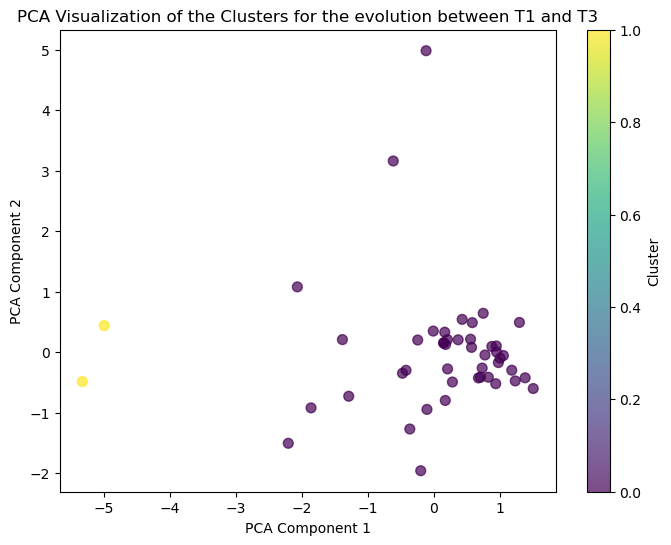


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                        BERG         \
                             mean median       std       mean median   
Cluster                                                                
0                       -4.013564   -2.0  7.136344  -7.764574   -2.0   
1                      -50.500000  -50.5  0.707107 -40.000000  -40.0   

                   Ashworth_affected                  Purdue_affected_hand  \
               std              mean median       std                 mean   
Cluster                                                                      
0        11.975900           1.86465   0.00  5.050664            -1.790037   
1        18.384776           4.75000   4.75  1.060660            -9.000000   

                          
        median       std  
Cluster                   
0         -1.0  2.168661  
1         -9.0  2.828427  


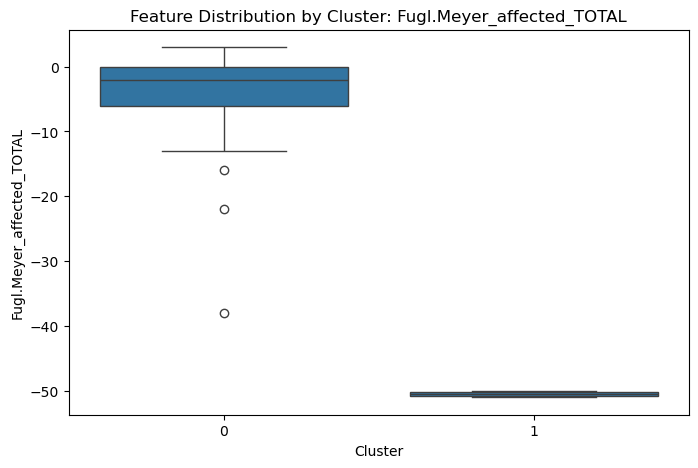

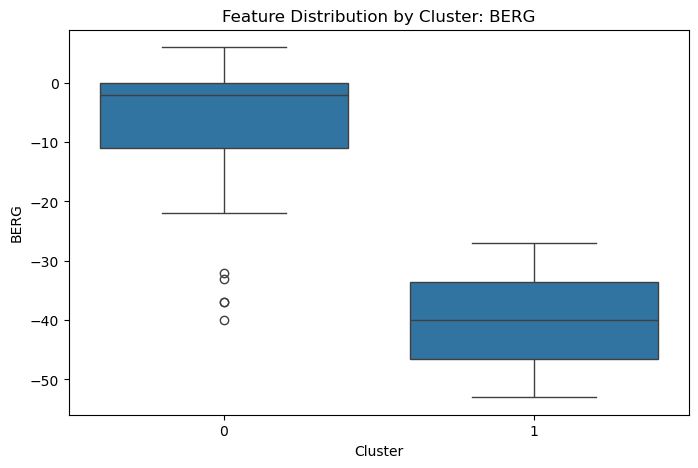

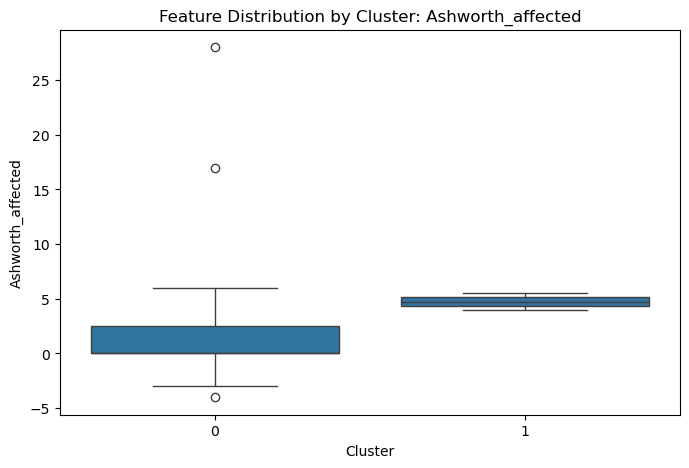

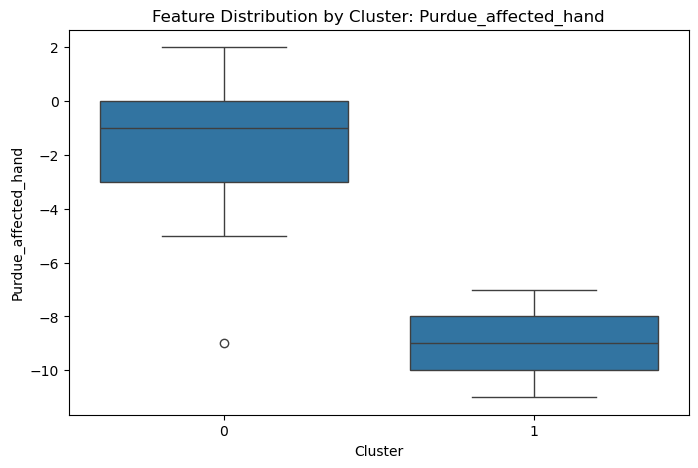


Testing hac with features: ['Fugl.Meyer_affected_TOTAL', 'BERG', 'Ashworth_affected', 'Purdue_affected_hand'] and preprocessing min_max


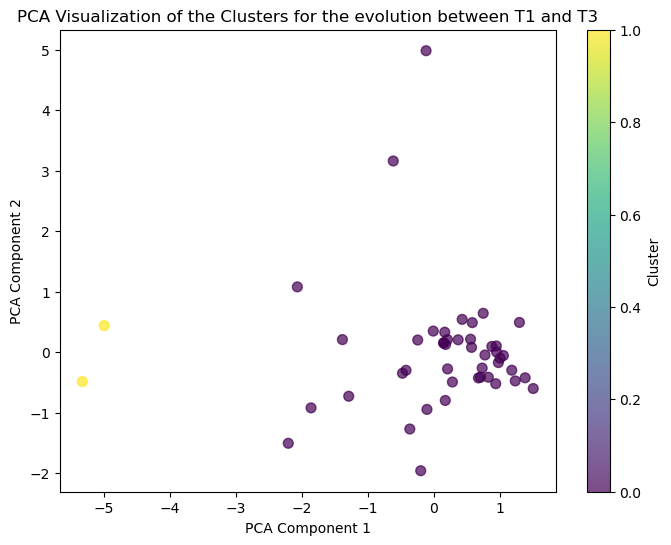


Cluster Summary Statistics:
         Fugl.Meyer_affected_TOTAL                        BERG         \
                             mean median       std       mean median   
Cluster                                                                
0                       -4.013564   -2.0  7.136344  -7.764574   -2.0   
1                      -50.500000  -50.5  0.707107 -40.000000  -40.0   

                   Ashworth_affected                  Purdue_affected_hand  \
               std              mean median       std                 mean   
Cluster                                                                      
0        11.975900           1.86465   0.00  5.050664            -1.790037   
1        18.384776           4.75000   4.75  1.060660            -9.000000   

                          
        median       std  
Cluster                   
0         -1.0  2.168661  
1         -9.0  2.828427  


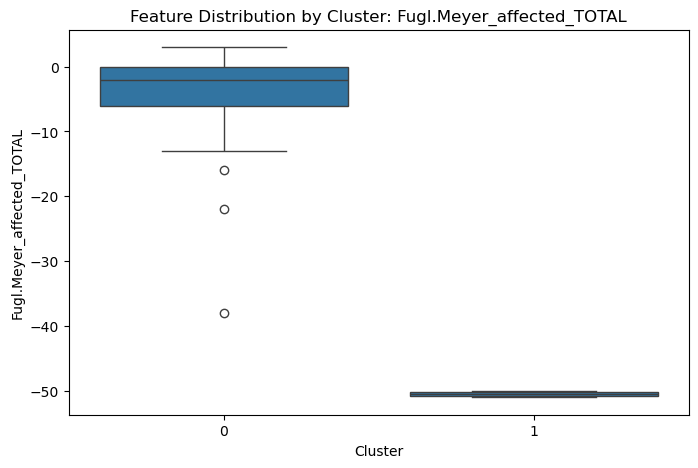

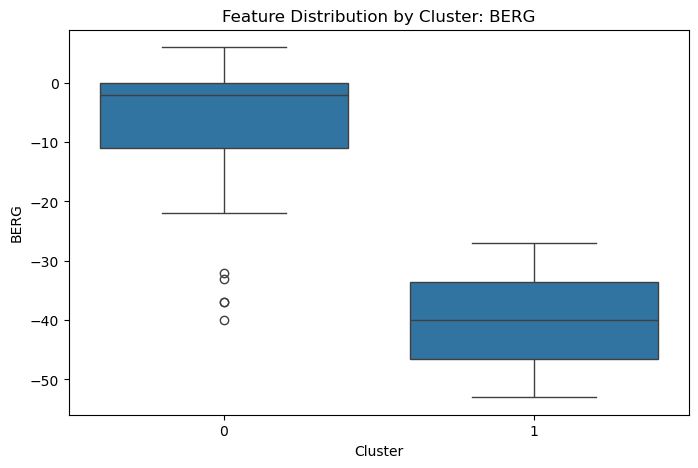

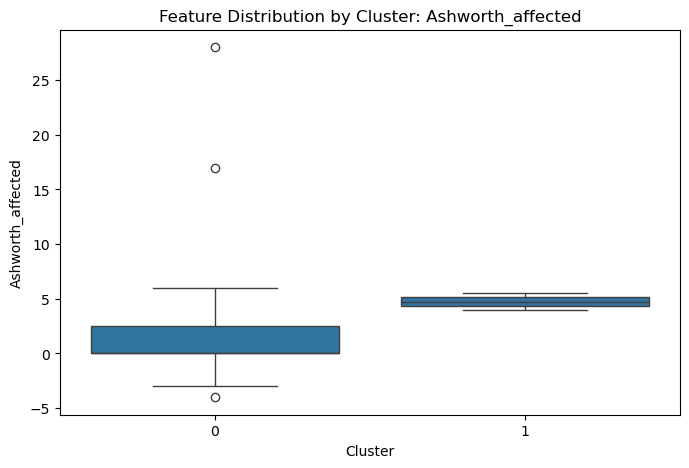

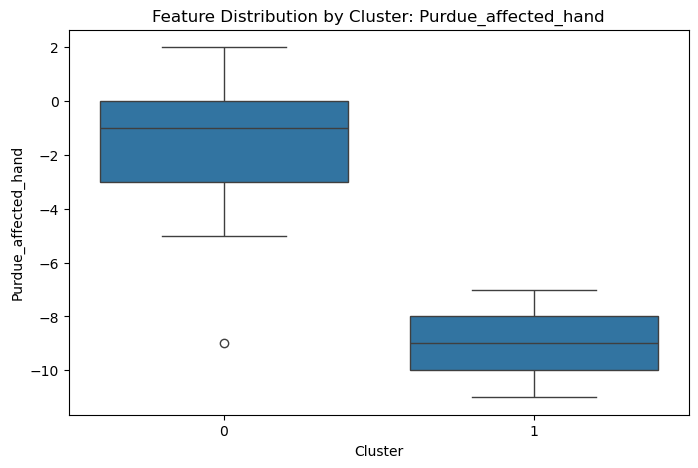

In [100]:
import pandas as pd
import numpy as np
import itertools
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
import seaborn as sns

# Step 0: Get the temporality T3-T1
def get_df_temp(df1,df2,features):
    df_tot=df1[df1.loc[:,"Patient"].isin(df2["Patient"])].reset_index(drop=True)
    A=df1["Patient"].isin(df2["Patient"])
    list_patients=df1.loc[A.values,"Patient"].values
    A=df1[df1["Patient"].isin(list_patients)][features].reset_index(drop=True).copy()
    B=df2[df2["Patient"].isin(list_patients)][features].reset_index(drop=True).copy()
    feature_diff=A-B
    df_tot[features] = feature_diff
    return df_tot

# Step 1: Data Preprocessing
def preprocess_temporal_data(df1,df2, features, impute_strategy="mean", normalization=None):
    """
    Preprocesses data by imputing missing values and scaling.
    Args:
        data (pd.DataFrame): Input dataset.
        features (list): List of features to include.
        impute_strategy (str): Strategy for handling NaNs.
        normalization (string): Type of normalization.
    Returns:
        np.array: Preprocessed data.
    """
    df_tot=get_df_temp(df1,df2,features)
    data_selected=df_tot[features].reset_index(drop=True).dropna(axis=0)
    imputer = SimpleImputer(strategy=impute_strategy)
    data_imputed = pd.DataFrame(imputer.fit_transform(data_selected), columns=features)
    
    if normalization=="scaler":
        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(data_imputed)
        return data_scaled
    if normalization=="min_max":
        scaler=MinMaxScaler()
        data_scaled = scaler.fit_transform(data_imputed)
        return data_scaled
    return data_imputed


# Step 2: Clustering and Validation
def cluster_and_evaluate(data, algorithm="kmeans", params=None):
    """
    Perform clustering and evaluate using internal metrics.
    Args:
        data (np.array): Preprocessed data.
        algorithm (str): Clustering algorithm to use ("kmeans", "dbscan", "hac").
        params (dict): Parameters for the chosen clustering algorithm.
    Returns:
        dict: Dictionary with clustering results and metrics.
    """
    if algorithm == "kmeans":
        model = KMeans(n_clusters=params.get("n_clusters", 2), random_state=42)
    elif algorithm == "dbscan":
        model = DBSCAN(eps=params.get("eps", 0.5), min_samples=params.get("min_samples", 5))
    elif algorithm == "hac":
        model = AgglomerativeClustering(n_clusters=params.get("n_clusters", 2), linkage=params.get("linkage", "ward"))
    else:
        raise ValueError("Unsupported algorithm")

    clusters = model.fit_predict(data)
    silhouette = silhouette_score(data, clusters) if len(set(clusters)) > 1 else None
    dbi = davies_bouldin_score(data, clusters) if len(set(clusters)) > 1 else None
    ch_score = calinski_harabasz_score(data, clusters) if len(set(clusters)) > 1 else None
    
    return {
        "clusters": clusters,
        "silhouette_score": silhouette,
        "dbi": dbi,
        "ch_score": ch_score,
    }


# Step 3: Visualize Clusters
def visualize_clusters(data, clusters, idx):
    """
    Visualize clusters in 2D using PCA.
    Args:
        data (np.array): Data to visualize.
        clusters (np.array): Cluster labels.
    """
    pca = PCA(n_components=2, random_state=42)
    data_reduced = pca.fit_transform(data)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=clusters, cmap="viridis", s=50, alpha=0.7)
    plt.colorbar(scatter, label="Cluster")
    plt.title(f"PCA Visualization of the Clusters for the evolution between T1 and T3")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()


# Step 4: Analyze Clusters
def analyze_clusters(data, clusters, features):
    """
    Analyze clusters by summarizing feature statistics and visualizing distributions.
    Args:
        data (pd.DataFrame): Original dataset.
        clusters (np.array): Cluster labels.
        features (list): List of features to analyze.
    """
    data["Cluster"] = clusters

    # Summarize cluster statistics
    summary = data.groupby("Cluster")[features].agg(["mean", "median", "std"])
    print("\nCluster Summary Statistics:\n", summary)

    # Plot feature distributions
    for feature in features:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x="Cluster", y=feature, data=data)
        plt.title(f"Feature Distribution by Cluster: {feature}")
        plt.xlabel("Cluster")
        plt.ylabel(feature)
        plt.show()


# Step 5: Main Pipeline
def main_temporal_pipeline(df1, df2, features, algorithms, params, preprocesses, idx):
    """
    Run the clustering pipeline with iterative exploration and visualization.
    Args:
        data (pd.DataFrame): Input dataset.
        features (list): List of feature names.
        algorithms (list): List of clustering algorithms to test.
        params (dict): Parameters for each algorithm.
        idx (int): Index of the current timepoint.
    """
    results = []
    for algo in algorithms:
        for preprocess in preprocesses:
            df_tot=get_df_temp(df1,df2,features)
            data_temporal_preprocessed = preprocess_temporal_data(df1,df2, features,"mean", "scaler")
            result = cluster_and_evaluate(data_temporal_preprocessed, algorithm=algo, params=params.get(algo, {}))
            if (result["silhouette_score"] is not None and 
                result["dbi"] is not None and 
                result["ch_score"] is not None and 
                result["silhouette_score"] > 0.3 and 
                result["dbi"] < 0.5 and 
                result["ch_score"] > 15):
                print(f"\nTesting {algo} with features: {features} and preprocessing {preprocess}")
                visualize_clusters(data_temporal_preprocessed, result["clusters"], idx)
                analyze_clusters(df_tot, result["clusters"], features)
                results.append({"features": features, "algorithm": algo, "metrics": result})
    return results

# Run the pipeline
file_paths = [
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT1.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT2.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT3.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT4.xlsx",
]
df1=pd.read_excel(file_paths[0])
df2=pd.read_excel(file_paths[2])
features = ["Fugl.Meyer_affected_TOTAL", "BERG", "Ashworth_affected", "Purdue_affected_hand"]
algorithms = ["kmeans", "dbscan", "hac"]
preprocesses=["scaler","min_max"]
params = {
    "kmeans": {"n_clusters": 2},
    "dbscan": {"eps": 0.2, "min_samples": 3},
    "hac": {"n_clusters": 2, "linkage": "ward"},
}

results = main_temporal_pipeline(df1, df2, features, algorithms, params, preprocesses, "T3-T1")

In [196]:
def remove_collinear_features(x, threshold):
    '''
    Objective:
        Remove collinear features in a dataframe with a correlation coefficient
        greater than the threshold. Removing collinear features can help a model 
        to generalize and improves the interpretability of the model.

    Inputs: 
        x: features dataframe
        threshold: features with correlations greater than this value are removed

    Output: 
        dataframe that contains only the non-highly-collinear features
    '''

    # Calculate the correlation matrix
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i+1):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)

            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
                #print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(col.values[0])

    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    x = x.drop(columns=drops)
    #print('Removed Columns {}'.format(drops))
    return x

['Fugl.Meyer_affected_UPPER_EXTREMITY', 'Ashworth_affected', 'Fugl.Meyer_unaffected_UPPER_EXTREMITY', 'Fugl.Meyer_unaffected_WRIST', 'Fugl.Meyer_unaffected_HAND', 'Ashworth_unaffected', 'X9HPT_unaffected', 'RASP_TOTAL_affected', 'RASP_TOTAL_unaffected', 'MOCA_visuo.spatial.executive', 'MOCA_denomination', 'MOCA_attention_tot', 'MOCA_language_tot', 'MOCA_abstraction', 'MOCA_memory', 'MOCA_orientation', 'Fluency_sem_final_score', 'Bells_time', 'Bells_omissions_L.R', 'SIS_memory.thinking_capacities', 'SIS_mood.emotions', 'STAI_S', 'mRNLI_global', 'mRNLI_social', 'PSQI', 'MFI_motivation', 'SCS_Total']
['Age', 'Is_Male', 'Is_Right_Side_Affected', 'Thrombolysis']
{'clusters': array([0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       1, 0, 0]), 'silhouette_score': 0.3426749826072259, 'dbi': 2.3269827058873087, 'ch_score': 6.6346433222590955}
['Fugl.Meyer_affected_UPPER_EXTREMITY', 'Ashworth_affected

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


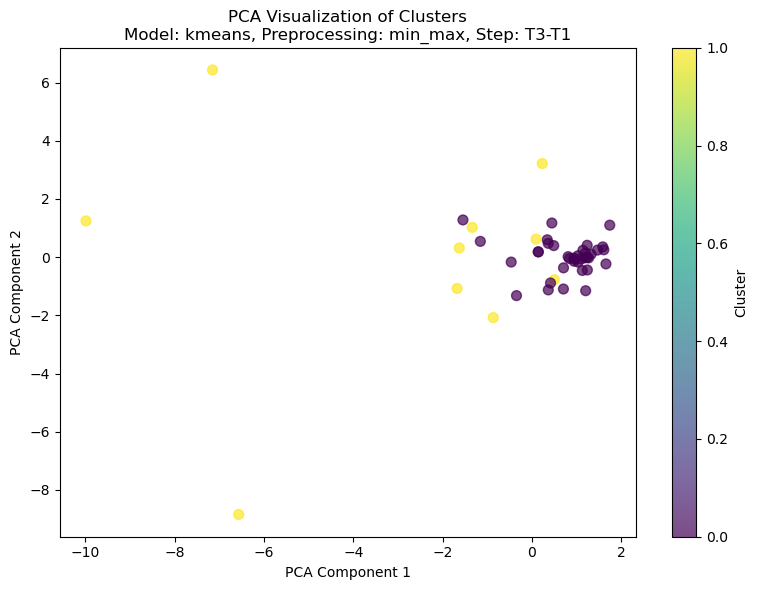


Cluster Summary Statistics:
         Fugl.Meyer_affected_UPPER_EXTREMITY                      \
                                       mean    median       std   
Cluster                                                           
0                                  0.966183  0.993631  0.098311   
1                                  0.893733  0.993631  0.314042   

        Ashworth_affected                     \
                     mean   median       std   
Cluster                                        
0                0.790394  0.75000  0.194417   
1                0.848909  0.84375  0.142612   

        Fugl.Meyer_unaffected_UPPER_EXTREMITY                      \
                                         mean    median       std   
Cluster                                                             
0                                    0.554512  0.562129  0.032328   
1                                    0.602248  0.562129  0.257155   

        Fugl.Meyer_unaffected_WRIST  ... mRNLI_

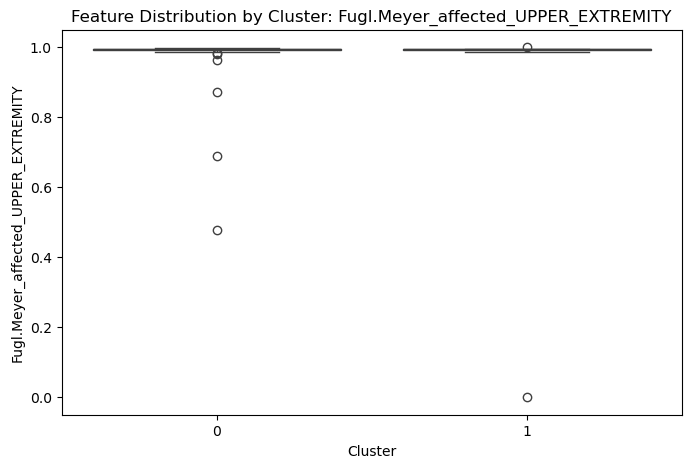

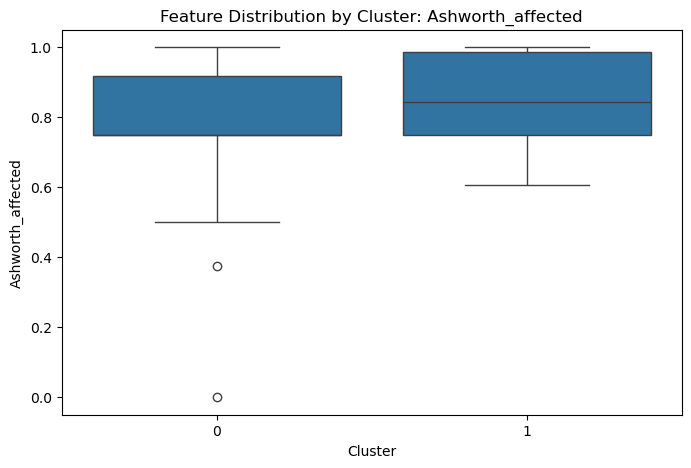

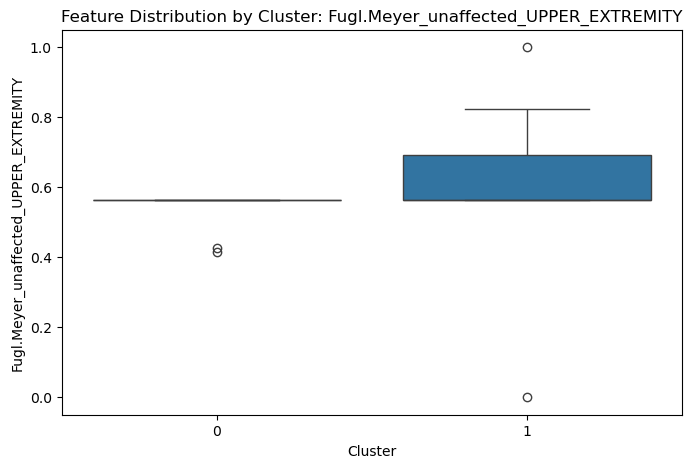

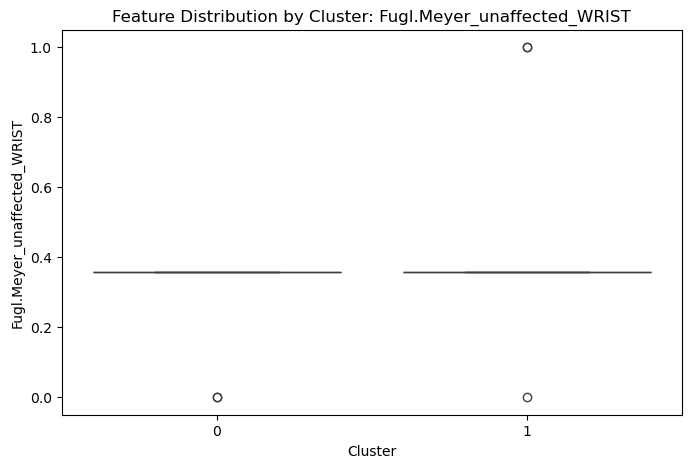

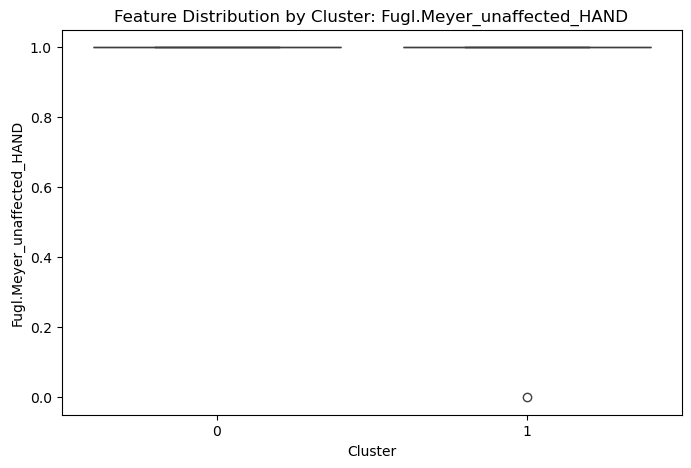

...

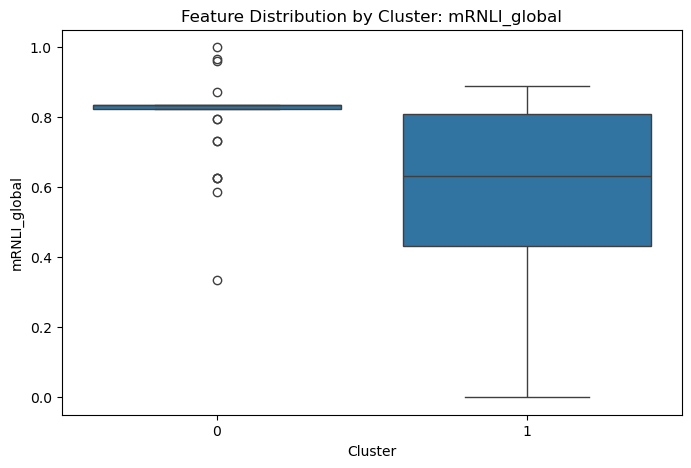

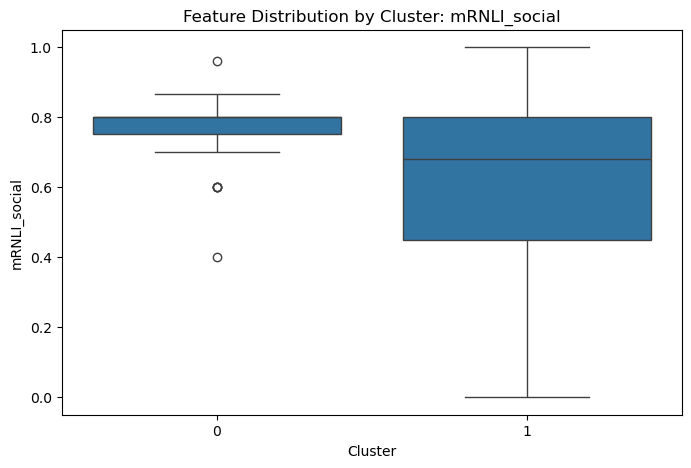

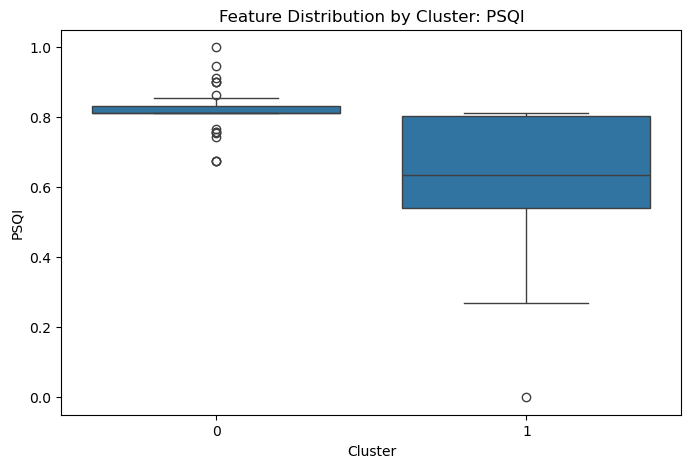

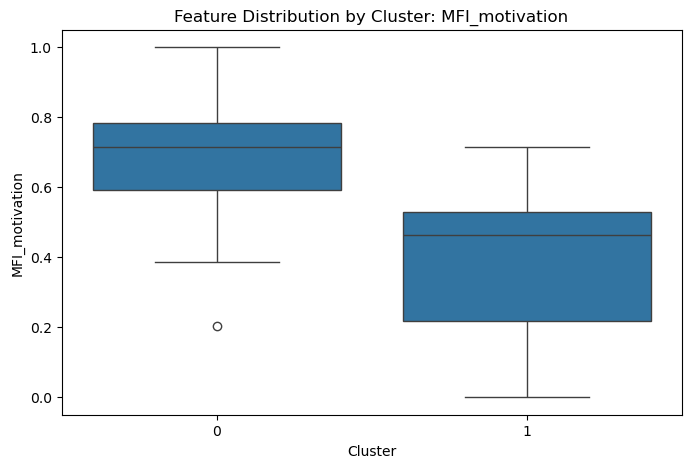

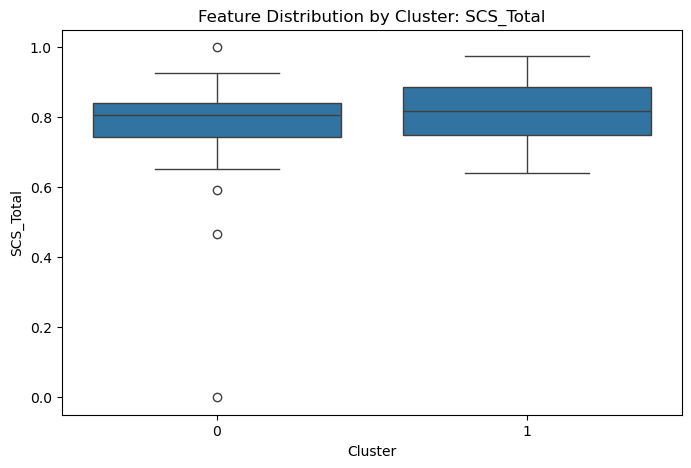

['Fugl.Meyer_affected_UPPER_EXTREMITY', 'Ashworth_affected', 'Fugl.Meyer_unaffected_UPPER_EXTREMITY', 'Fugl.Meyer_unaffected_WRIST', 'Fugl.Meyer_unaffected_HAND', 'Ashworth_unaffected', 'X9HPT_unaffected', 'RASP_TOTAL_affected', 'RASP_TOTAL_unaffected', 'MOCA_visuo.spatial.executive', 'MOCA_denomination', 'MOCA_attention_tot', 'MOCA_language_tot', 'MOCA_abstraction', 'MOCA_memory', 'MOCA_orientation', 'Fluency_sem_final_score', 'Bells_time', 'Bells_omissions_L.R', 'SIS_memory.thinking_capacities', 'SIS_mood.emotions', 'STAI_S', 'mRNLI_global', 'mRNLI_social', 'PSQI', 'MFI_motivation', 'SCS_Total']
['Age', 'Is_Male', 'Is_Right_Side_Affected', 'Thrombolysis']
{'clusters': array([0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       1, 0, 0], dtype=int64), 'silhouette_score': 0.3426749826072259, 'dbi': 2.3269827058873087, 'ch_score': 6.6346433222590955}
['Fugl.Meyer_affected_UPPER_EXTREMITY', 'Ashw

c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


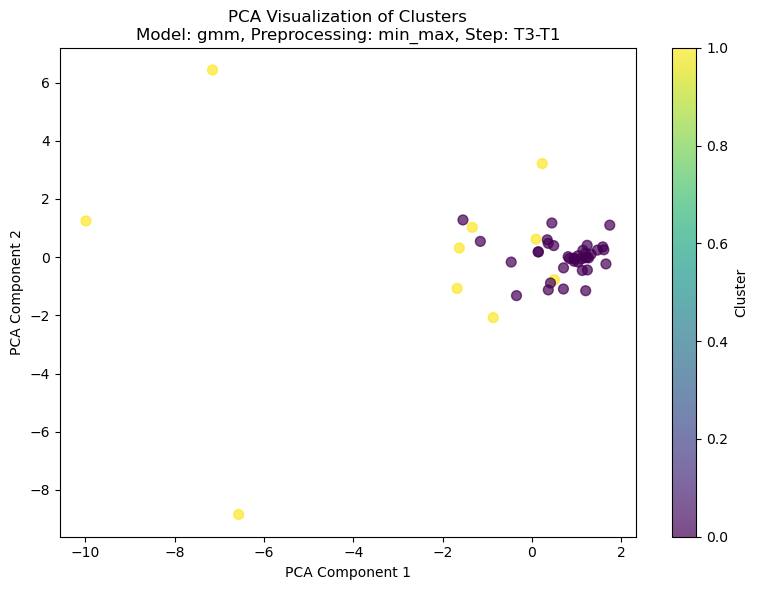


Cluster Summary Statistics:
         Fugl.Meyer_affected_UPPER_EXTREMITY                      \
                                       mean    median       std   
Cluster                                                           
0                                  0.966183  0.993631  0.098311   
1                                  0.893733  0.993631  0.314042   

        Ashworth_affected                     \
                     mean   median       std   
Cluster                                        
0                0.790394  0.75000  0.194417   
1                0.848909  0.84375  0.142612   

        Fugl.Meyer_unaffected_UPPER_EXTREMITY                      \
                                         mean    median       std   
Cluster                                                             
0                                    0.554512  0.562129  0.032328   
1                                    0.602248  0.562129  0.257155   

        Fugl.Meyer_unaffected_WRIST  ... mRNLI_

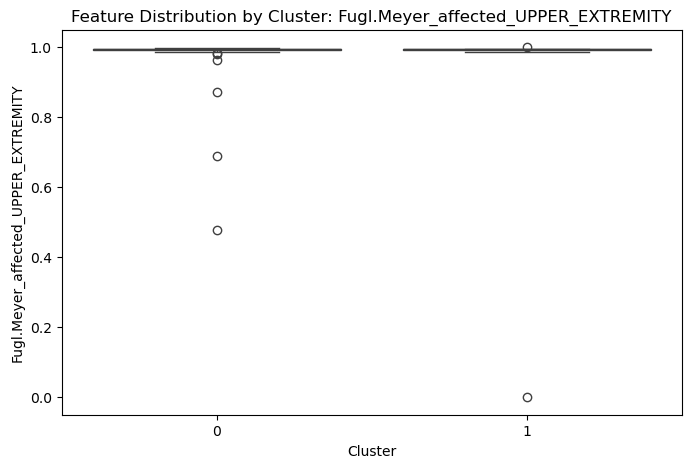

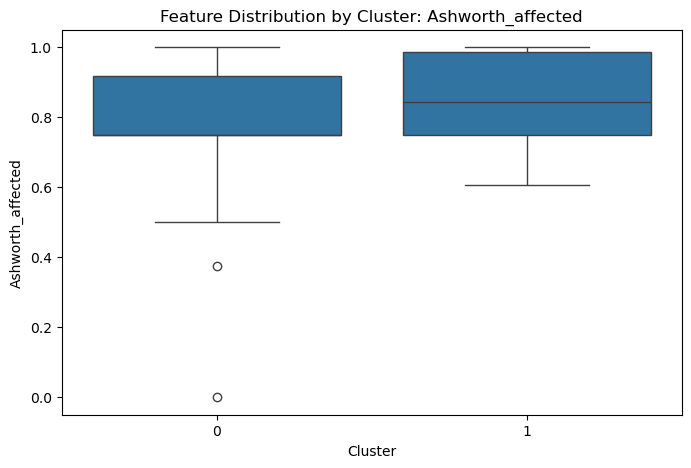

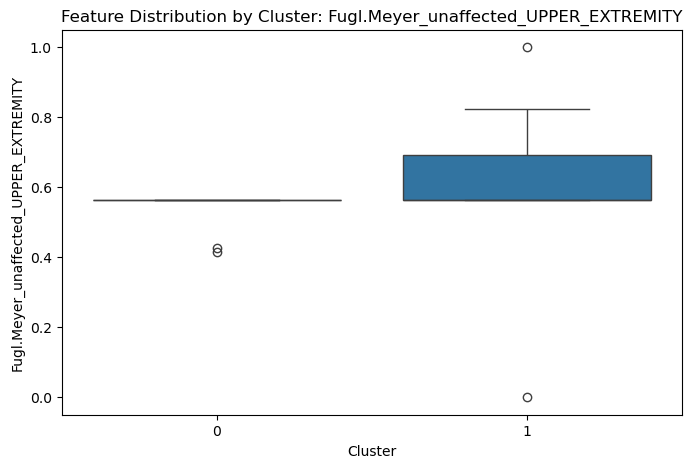

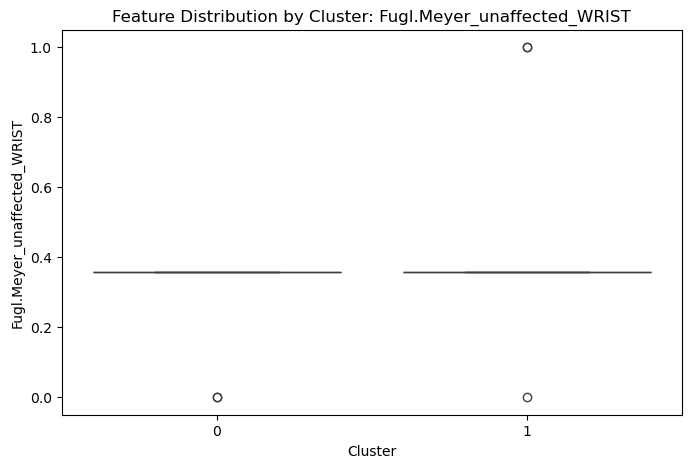

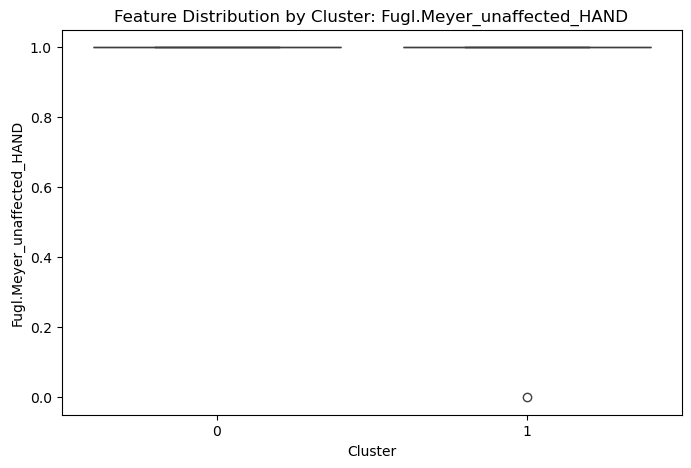

...

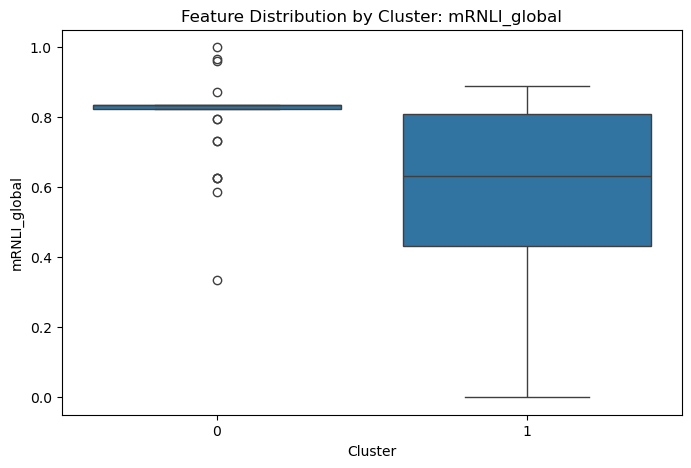

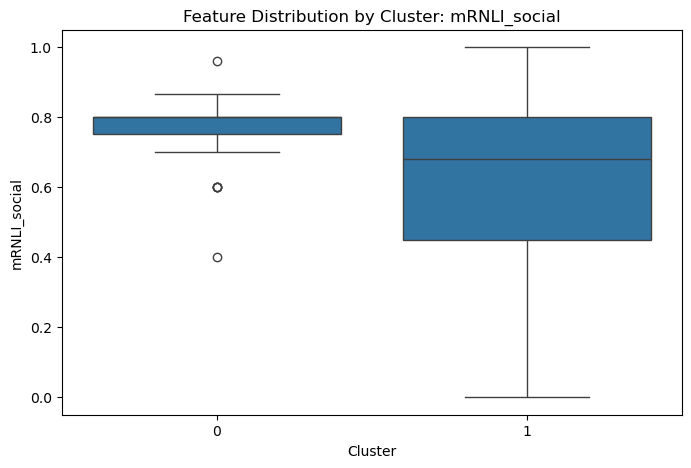

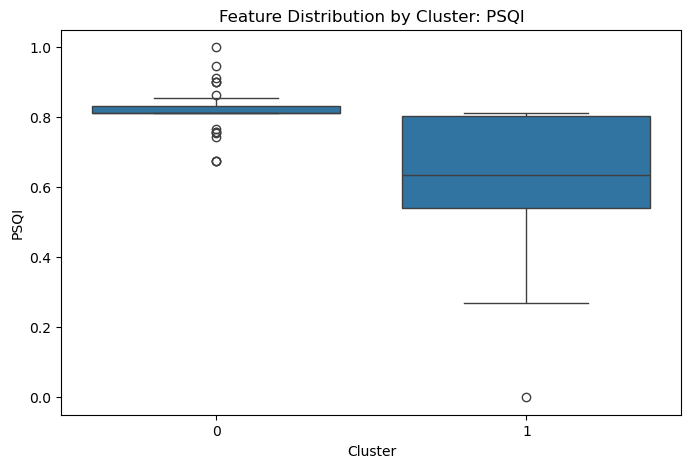

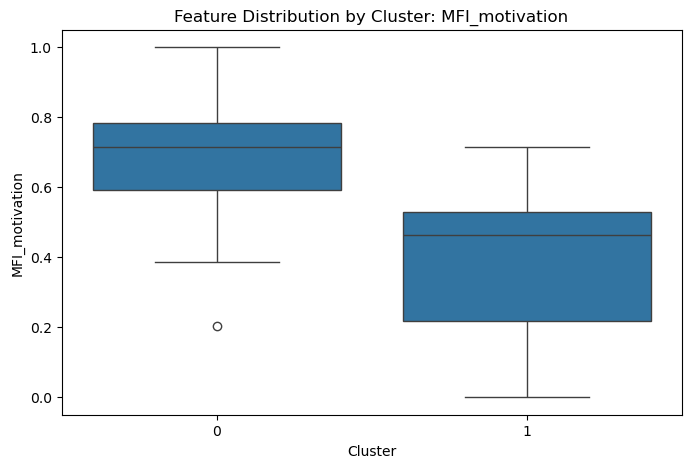

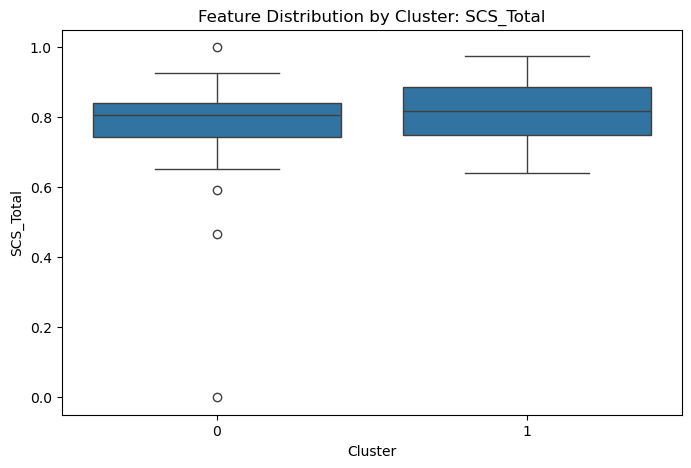

['Fugl.Meyer_affected_UPPER_EXTREMITY', 'Ashworth_affected', 'Fugl.Meyer_unaffected_UPPER_EXTREMITY', 'Fugl.Meyer_unaffected_WRIST', 'Fugl.Meyer_unaffected_HAND', 'Ashworth_unaffected', 'X9HPT_unaffected', 'RASP_TOTAL_affected', 'RASP_TOTAL_unaffected', 'MOCA_visuo.spatial.executive', 'MOCA_denomination', 'MOCA_attention_tot', 'MOCA_language_tot', 'MOCA_abstraction', 'MOCA_memory', 'MOCA_orientation', 'Fluency_sem_final_score', 'Bells_time', 'Bells_omissions_L.R', 'SIS_memory.thinking_capacities', 'SIS_mood.emotions', 'STAI_S', 'mRNLI_global', 'mRNLI_social', 'PSQI', 'MFI_motivation', 'SCS_Total']
['Age', 'Is_Male', 'Is_Right_Side_Affected', 'Thrombolysis']
{'clusters': array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0], dtype=int64), 'silhouette_score': 0.5187371061302947, 'dbi': 0.3414710613764349, 'ch_score': 6.272438716958115}
['Fugl.Meyer_affected_UPPER_EXTREMITY', 'Ashwo

In [ ]:
import os
import pandas as pd
import numpy as np
import itertools
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
import seaborn as sns

# Step 0: Get the temporality T3-T1
def get_df_temp(df1, df2, features):
    df_tot = df1[df1.loc[:, "Patient"].isin(df2["Patient"])].reset_index(drop=True)
    A = df1["Patient"].isin(df2["Patient"])
    list_patients = df1.loc[A.values, "Patient"].values
    A = df1[df1["Patient"].isin(list_patients)][features].reset_index(drop=True).copy()
    B = df2[df2["Patient"].isin(list_patients)][features].reset_index(drop=True).copy()
    A_replaced = A.replace(0, 1)
    feature_diff = (A - B) / A_replaced
    df_tot[features] = feature_diff
    return df_tot

# Step 0bis: Compute PCA Features
def compute_pca_features(data, n_components=0.8):
    """
    Compute PCA features and append them to the dataset.
    Args:
        data (pd.DataFrame): Dataset to compute PCA on.
        n_components (float): Variance ratio to retain.
    Returns:
        pd.DataFrame: Dataset with PCA features.
    """
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)
    pca = PCA(n_components=n_components)
    pca_transformed = pca.fit_transform(scaled_data)
    pca_features = pd.DataFrame(pca_transformed, columns=[f"PCA_Feature_{i+1}" for i in range(pca_transformed.shape[1])])
    return pca_features

# Step 1: Data Preprocessing
def preprocess_temporal_data(df1, df2, df_raw, features, general_features, impute_strategy="mean", normalization=None, use_general_features=True, use_pca_features=False):
    df_tot = get_df_temp(df1, df2, features)
    df_tot = pd.merge(df_tot, df_raw, on="Patient")
    print(features)
    print(general_features[1:])
    if use_general_features:
        all_features = general_features[1:] + features
    else:
        all_features = features

    data_selected = df_tot[["Patient"] + all_features].dropna(axis=0).reset_index(drop=True)
    patients = data_selected["Patient"]
    data_features = data_selected.drop(columns="Patient")
    imputer = SimpleImputer(strategy=impute_strategy)#peut ete pas needed mais pca marche pas avec des NaN's
    data_imputed = pd.DataFrame(imputer.fit_transform(data_features), columns=all_features)

    if normalization == "scaler":
        scaler = StandardScaler()
        data_scaled = pd.DataFrame(scaler.fit_transform(data_imputed), columns=all_features)
    elif normalization == "min_max":
        scaler = MinMaxScaler()
        data_scaled = pd.DataFrame(scaler.fit_transform(data_imputed), columns=all_features)
    else:
        data_scaled = data_imputed

    # Add PCA features if enabled
    if use_pca_features:
        pca_features = compute_pca_features(data_scaled)
        data_scaled = pd.concat([data_scaled, pca_features], axis=1)

    data_scaled["Patient"] = patients.values
    return data_scaled

# Step 2: Clustering and Validation
def cluster_and_evaluate(data, algorithm="kmeans", params=None):
    if algorithm == "kmeans":
        model = KMeans(n_clusters=params.get("n_clusters", 2), random_state=42)
    elif algorithm == "gmm":
        model = GaussianMixture(
            n_components=params.get("n_clusters", 2),
            covariance_type=params.get("covariance_type", "full"),
            random_state=42
        )
    elif algorithm == "hac":
        model = AgglomerativeClustering(n_clusters=params.get("n_clusters", 2), linkage=params.get("linkage", "ward"))
    else:
        raise ValueError("Unsupported algorithm")

    clusters = model.fit_predict(data)
    silhouette = silhouette_score(data, clusters) if len(set(clusters)) > 1 else None
    dbi = davies_bouldin_score(data, clusters) if len(set(clusters)) > 1 else None
    ch_score = calinski_harabasz_score(data, clusters) if len(set(clusters)) > 1 else None
    
    return {
        "clusters": clusters,
        "silhouette_score": silhouette,
        "dbi": dbi,
        "ch_score": ch_score,
    }

# Step 3: Visualize Clusters
def visualize_clusters(data, clusters, idx, algorithm, preprocess):
    """
    Visualize clusters using PCA with additional details in the title and labels.
    
    Args:
        data (pd.DataFrame): Data to visualize.
        clusters (np.array): Cluster labels.
        idx (str): Index for the pipeline step.
        algorithm (str): The clustering algorithm used.
        preprocess (str): The preprocessing method used.
    """
    pca = PCA(n_components=2, random_state=42)
    data_reduced = pca.fit_transform(data)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=clusters, cmap="viridis", s=50, alpha=0.7)
    plt.colorbar(scatter, label="Cluster")
    plt.title(f"PCA Visualization of Clusters\nModel: {algorithm}, Preprocessing: {preprocess}, Step: {idx}")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.tight_layout()
    plt.show()

# Step 4: Analyze Clusters
def analyze_clusters(data, clusters, features):
    data = data.copy()
    data["Cluster"] = clusters

    # Only aggregate numeric columns
    numeric_features = data[features].select_dtypes(include=[np.number]).columns.tolist()

    summary = data.groupby("Cluster")[numeric_features].agg(["mean", "median", "std"])
    print("\nCluster Summary Statistics:\n", summary)

    # Plot feature distributions
    for feature in numeric_features:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x="Cluster", y=feature, data=data)
        plt.title(f"Feature Distribution by Cluster: {feature}")
        plt.xlabel("Cluster")
        plt.ylabel(feature)
        plt.show()

# Step 5: Main Pipeline
def main_temporal_pipeline(df1, df2, df_raw, features, general_features, algorithms, params, preprocesses, idx, use_general_features=True, use_pca_features=True):
    results = []
    for algo in algorithms:
        for preprocess in preprocesses:
            df_tot_begin = get_df_temp(df1, df2, features)
            df_raw_filtered = df_raw[df_raw["Patient"].isin(df_tot_begin["Patient"])].reset_index(drop=True)
            data_temporal_preprocessed = preprocess_temporal_data(
                df1, df2, df_raw_filtered, features, general_features, "mean", preprocess, use_general_features=use_general_features, use_pca_features=use_pca_features
            )
            
            clustering_data = data_temporal_preprocessed.drop(columns=["Patient"])
            result = cluster_and_evaluate(clustering_data, algorithm=algo, params=params.get(algo, {}))
            print(result)
            if (result["silhouette_score"] is not None and 
                result["dbi"] is not None and 
                result["ch_score"] is not None and 
                result["silhouette_score"] > 0.35 and 
                result["dbi"] < 3 and 
                result["ch_score"] > 7):
                
                if use_general_features:
                    analyzed_features = features + general_features[1:]
                else:
                    analyzed_features = features
                
                print(f"\nTesting {algo} with features: {analyzed_features} and preprocessing {preprocess}")
                visualize_clusters(clustering_data, result["clusters"], idx, algo, preprocess)
                analyze_clusters(data_temporal_preprocessed, result["clusters"], analyzed_features)
                
                results.append({"features": analyzed_features, "algorithm": algo, "metrics": result})
    
    return results


#Initialisation

#Paths and files
cd = os.getcwd()
path_raw_data = os.path.join(cd, r"data\TiMeS_Raw_Data2023.xlsx")
file_paths = [
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT1.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT2.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT3.xlsx",
    r".\data\Raw_MissingDataImputed\TiMeS_matrix_mdImputed_allT4.xlsx",
]

df_T1 = pd.read_excel(file_paths[0])
df_T3 = pd.read_excel(file_paths[2])
df_raw = pd.read_excel(path_raw_data)

#Features
#MAIS IL EN MANQUE PLEINS GENRE ILS SONT MARQU2S DANS LA DOC ET ILS SONT PAS DANS LES EXCELS PTN DUCOUP J'UTILISE 
#PAS CES LISTES MAIS BON AU CAS OU JE LES LAISSE

general_features=["Patient","Age","Gender","Affected_side","Thrombolysis"]
motor_features = ["Fugl.Meyer_affected_TOTAL", "BERG", "Ashworth_affected", "Purdue_affected_hand"]
attention_features=["TAP_alert_without_warning_RT","TAP_single_condition_auditive_RT","TAP_single_condition_visual_RT"
                    "TAP_both_conditions_auditive_RT","TAP_ both_conditions_visual_RT",
                    "Bells_omissions_total","CTM_A_time"]
executive_features=["Bimanual_coordination_corrected_total","FAB_total","AST_unaffected_total","CERAD_copy_tota"
                    "Stroop_interference_time","Digit_backward_total","Digit_sequencing_total","Corsi_backward_total",
                    "CTM_B_time"]
memory_features=["Digit_forward_total","Corsi_forward total"]
sensory_features=["RASP_Total_unaffected"]
language_features=["Fluency_phon_final_score","Fluency_sem_final_score","LAST_TOTAL"]
neglect_features=["Line_bisection_20cm","Line_bisection_5cm","Bells_omission_LR"]

#Algo and preprocessing

algorithms = ["kmeans", "gmm", "hac"]
preprocesses = ["scaler","min_max"]
params = {
    "kmeans": {"n_clusters": 2},
    "gmm": {"n_clusters": 2, "covariance_type": "full"},
    "hac": {"n_clusters": 2, "linkage": "complete"},
}

#Processing to get only the general features we want in a Dataframe
df_raw = pd.get_dummies(df_raw[general_features], columns=["Gender","Affected_side"], drop_first=True)
df_raw.rename(columns={"Gender_2": "Is_Male", "Affected_side_2": "Is_Right_Side_Affected"}, inplace=True)
general_features = ["Patient", "Age", "Is_Male", "Is_Right_Side_Affected", "Thrombolysis"]
df_raw_final = df_raw.groupby("Patient").agg("mean").reset_index()
#Removing collinear features
df_T1 = pd.read_excel(file_paths[0])
df_T3 = pd.read_excel(file_paths[2])
patients_T1=df_T1["Patient"].values
patients_T3=df_T3["Patient"].values
df_T1_corr=remove_collinear_features(df_T1.drop(columns="Patient"),0.6)
df_T3_corr=remove_collinear_features(df_T3.drop(columns="Patient"),0.6)
df_T1_corr["Patient"]=patients_T1
df_T3_corr["Patient"]=patients_T3
#Modular approach: possibility to choose the categories of features for the clustering 
use_pca_features = True
use_general_features = False  
if len(df_T1_corr.columns)>len(df_T3_corr.columns):
    features=df_T3_corr.drop(columns="Patient").columns.tolist()
else:
    features=df_T1_corr.drop(columns="Patient").columns.tolist()
#Au début j'ai utilisé les features de la data, mais bon pas ouf les réqults
#features=motor_features#+attention_features+executive_features+memory_features+sensory_features+language_features+neglect_features

results = main_temporal_pipeline(df_T1, df_T3, df_raw_final, features, general_features, 
                                 algorithms, params, preprocesses, "T3-T1", 
                                 use_general_features=use_general_features,
                                 use_pca_features=use_pca_features)


# COMMENTAIRES
- data trop imbalanced et scores faibles, on peut avoir de bon scores mais genre ya un seul point dans un cluster et donc cest de la m
- on peut avoir des silhouette=0.3, dbi=1 et ch=5 avec moins d'imbalance,


# LOOCV
- Le clustering donne un truc tellement imbalanced... autant partir sur une autre idée et 
utiliser un autre moyen de label pour utiliser un gradient boosting.

In [199]:
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import f1_score, recall_score, precision_score

def loocv_clustering_with_sklearn(data, ground_truth=None, algorithm="kmeans", params=None):
    """
    Perform Leave-One-Out Cross-Validation for clustering using sklearn's LeaveOneOut.
    Args:
        data (pd.DataFrame): Input data for clustering (without Patient column).
        ground_truth (pd.Series or None): Ground truth labels for binary classification evaluation.
        algorithm (str): Clustering algorithm ('kmeans', 'gmm', 'hac').
        params (dict): Parameters for the clustering algorithm.
    Returns:
        dict: Aggregated metrics (mean silhouette, dbi, ch_score, f1, recall, precision).
    """
    loo = LeaveOneOut()
    n_samples = len(data)
    
    silhouette_scores = []
    dbi_scores = []
    ch_scores = []
    f1_scores = []
    recall_scores = []
    precision_scores = []

    data_np = data.to_numpy()
    
    for train_index, test_index in loo.split(data_np):
        # Split train and test data
        train_data = data_np[train_index]
        test_data = data_np[test_index]

        # Apply clustering on training data
        clustering_result = cluster_and_evaluate(pd.DataFrame(train_data), algorithm, params)
        clusters = clustering_result["clusters"]
        model = clustering_result.get("model")
        silhouette = clustering_result["silhouette_score"]
        dbi = clustering_result["dbi"]
        ch_score = clustering_result["ch_score"]

        silhouette_scores.append(silhouette if silhouette is not None else 0)
        dbi_scores.append(dbi if dbi is not None else float("inf"))
        ch_scores.append(ch_score if ch_score is not None else 0)

        # Predict the left-out sample's cluster
        if algorithm in ["gmm"]:
            test_cluster = model.predict(test_data)
        elif algorithm in ["kmeans", "hac"]:
            test_cluster = model.fit_predict(test_data)
        
        # Map clusters to binary labels (if ground truth is provided)
        if ground_truth is not None:
            true_labels = ground_truth.iloc[train_index]
            test_label = ground_truth.iloc[test_index]

            # Map cluster to closest binary label
            mapped_clusters = pd.Series(clusters).map(lambda x: 1 if x == test_cluster else 0)
            predicted_label = mapped_clusters.iloc[0]  # Prediction for test sample

            f1_scores.append(f1_score(true_labels, [predicted_label]))
            recall_scores.append(recall_score(true_labels, [predicted_label]))
            precision_scores.append(precision_score(true_labels, [predicted_label]))

    # Aggregate results
    results = {
        "mean_silhouette_score": np.mean(silhouette_scores),
        "mean_dbi_score": np.mean(dbi_scores),
        "mean_ch_score": np.mean(ch_scores),
        "mean_f1_score": np.mean(f1_scores) if f1_scores else None,
        "mean_recall_score": np.mean(recall_scores) if recall_scores else None,
        "mean_precision_score": np.mean(precision_scores) if precision_scores else None,
    }
    return results

# Example usage
# Prepare your data
data = preprocess_temporal_data(df_T1, df_T3, df_raw_final, features, general_features, 
                                impute_strategy="mean", normalization="scaler", 
                                use_general_features=True, use_pca_features=True).drop(columns=["Patient"])

# Optional: Add ground truth for classification
data["ground_truth"] = [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       1, 0, 0]  # Replace with your actual ground truth

params = {
    "kmeans": {"n_clusters": 2},
    "gmm": {"n_clusters": 2, "covariance_type": "full"},
    "hac": {"n_clusters": 2, "linkage": "ward"},
}

algorithm = "kmeans"  # Change to "gmm" or "hac" as needed
loocv_results = loocv_clustering_with_sklearn(data.drop(columns=["ground_truth"]), 
                                              data["ground_truth"], 
                                              algorithm, 
                                              params.get(algorithm, {}))

# Print results
print("LOOCV Results:")
for metric, value in loocv_results.items():
    print(f"{metric}: {value:.4f}" if value is not None else f"{metric}: None")


['Fugl.Meyer_affected_UPPER_EXTREMITY', 'Ashworth_affected', 'Fugl.Meyer_unaffected_UPPER_EXTREMITY', 'Fugl.Meyer_unaffected_WRIST', 'Fugl.Meyer_unaffected_HAND', 'Ashworth_unaffected', 'X9HPT_unaffected', 'RASP_TOTAL_affected', 'RASP_TOTAL_unaffected', 'MOCA_visuo.spatial.executive', 'MOCA_denomination', 'MOCA_attention_tot', 'MOCA_language_tot', 'MOCA_abstraction', 'MOCA_memory', 'MOCA_orientation', 'Fluency_sem_final_score', 'Bells_time', 'Bells_omissions_L.R', 'SIS_memory.thinking_capacities', 'SIS_mood.emotions', 'STAI_S', 'mRNLI_global', 'mRNLI_social', 'PSQI', 'MFI_motivation', 'SCS_Total']
['Age', 'Is_Male', 'Is_Right_Side_Affected', 'Thrombolysis']


c:\Users\antoi\anaconda3\envs\ML\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


AttributeError: 'NoneType' object has no attribute 'fit_predict'